# Temat testów
Czy istnieje istotna statystycznie różnica w poprawności odpowiedzi w zależności od cech osobowościowych z ankiety?

In [1]:
import pandas as pd

from functions.tests.categorical_only import two_categorical_variable_test
from functions.tests.posthoc import posthocNemenyi_test
from functions.set_preparations import prepare_row
from functions.plots import plot_heatmap
from functions.others import choose_dominant_kind

In [2]:
df_answers = pd.read_csv('/Users/martasolarz/Studies/Thesis/Master_thesis/prepare_datasets/sets/correctness.csv')

df_quest = pd.read_csv(
    '/Users/martasolarz/Studies/Thesis/data/survey.csv',
).fillna('NO_VAL')

df_quest = df_quest[df_quest.ID != 6]  # odrzucony uczestnik ze względu na metryki eye trackingowe

In [18]:
# zagregowane kolumny - podział na tych co pisali i nie pisali danej matury oraz agregacja typów uczenia poznawczego (wybór dominującego):
df_quest['MAT'] = df_quest['MAT_roz'].apply(lambda x: x if x == 'NO_VAL' else 'VAL')
df_quest['POL'] = df_quest['JP_roz'].apply(lambda x: x if x == 'NO_VAL' else 'VAL')
df_quest['HIST'] = df_quest['HIST_roz'].apply(lambda x: x if x == 'NO_VAL' else 'VAL')
df_quest['Typ_uczenia'] = df_quest.apply(choose_dominant_kind, axis=1)
df_quest['Kierunek_studiów'] = df_quest['Kierunek_studiów'].apply(lambda x: 'MISMaP Geografia' if x == 'Geografia, w ramach studiów międzyobszarowych' else x)

df_quest.head()

,ID,Płeć,Rok_urodzenia,Kierunek_studiów,Rok_studiów,Specjalność,Wady_wzroku,Daltonizm,Ilość_snu,JP_podst,...,Rank_map,Rank_txt,Rank_plt,Rank_tab,Data,Godzina,MAT,POL,HIST,Typ_uczenia
0,1,M,2002,MISMaP Geografia,2,SPOŁ-EKO,0,1,6,90 - 100%,...,3,4,1,2,2023-05-24,11:44:20,VAL,VAL,NO_VAL,Kinestetyk
1,2,M,2003,Gospodarka przestrzenna,1,NO_VAL,1,1,<6,50 - 69%,...,2,3,1,4,2023-05-24,12:21:03,VAL,VAL,NO_VAL,Brak dominującego
2,3,M,2001,Geografia,3,GEOINF,0,1,8,50 - 69%,...,1,4,3,2,2023-05-24,12:41:09,VAL,NO_VAL,NO_VAL,Wzrokowiec
3,4,K,2000,Geografia,3,GEOINF,0,1,8,50 - 69%,...,2,4,3,1,2023-05-24,13:15:20,NO_VAL,VAL,NO_VAL,Brak dominującego
4,5,K,2002,Geografia,3,GEOINF,0,1,7,50 - 69%,...,2,4,1,3,2023-05-24,13:35:17,NO_VAL,NO_VAL,NO_VAL,Wzrokowiec


In [19]:
df_merge = df_answers.merge(df_quest, on='ID').set_index('ID')
df_merge.tail()

,1a_trud,1b_trud,2a_trud,2b_trud,3a_trud,3b_trud,Trud_all,Corr_all,1a_corr,1b_corr,...,Rank_map,Rank_txt,Rank_plt,Rank_tab,Data,Godzina,MAT,POL,HIST,Typ_uczenia
ID,,,,,,,,,,,,,,,,,,,,,
42,2,1,2,1,2,2,10,5,1,1,...,2,4,1,3,2023-06-07,11:42:55,NO_VAL,NO_VAL,NO_VAL,Wzrokowiec
43,1,2,2,2,3,3,13,5,1,1,...,2,3,1,2,2023-06-07,13:04:51,NO_VAL,NO_VAL,NO_VAL,Brak dominującego
44,1,1,3,1,2,3,11,3,1,1,...,2,1,2,1,2023-06-07,14:13:38,VAL,NO_VAL,NO_VAL,Brak dominującego
45,2,1,2,2,2,2,11,3,1,1,...,2,4,3,1,2023-06-07,14:27:37,VAL,NO_VAL,NO_VAL,Słuchowiec
46,1,3,2,2,2,3,13,4,0,1,...,1,3,3,3,2023-06-07,15:19:52,NO_VAL,NO_VAL,NO_VAL,Brak dominującego


Przygotowanie data setów dla wszystkich testowanych przypadków:

Poprawność vs dane osobowe

In [20]:
# zsumowany wynik wszystkie grafiki
df_wynik = df_merge.copy()
df_wynik.rename(columns={'Corr_all': 'corr', 'Trud_all': 'diff'}, inplace=True)

# zsumowany wynik - grafiki A
df_sumA = df_merge.copy()
df_sumA.rename(columns={'SumCorr_a': 'corr', 'SumTrud_a': 'diff'}, inplace=True)

# zsumowany wynik - grafiki B
df_sumB = df_merge.copy()
df_sumB.rename(columns={'SumCorr_b': 'corr', 'SumTrud_b': 'diff'}, inplace=True)

# zsumowany wynik - grafiki 1
df_sum1 = df_merge.copy()
df_sum1.rename(columns={'SumCorr_1': 'corr', 'SumTrud_1': 'diff'}, inplace=True)

# zsumowany wynik - grafiki 2
df_sum2 = df_merge.copy()
df_sum2.rename(columns={'SumCorr_2': 'corr', 'SumTrud_2': 'diff'}, inplace=True)

# zsumowany wynik - grafiki 3
df_sum3 = df_merge.copy()
df_sum3.rename(columns={'SumCorr_3': 'corr', 'SumTrud_3': 'diff'}, inplace=True)
df_sum3

,1a_trud,1b_trud,2a_trud,2b_trud,3a_trud,3b_trud,Trud_all,Corr_all,1a_corr,1b_corr,...,Rank_map,Rank_txt,Rank_plt,Rank_tab,Data,Godzina,MAT,POL,HIST,Typ_uczenia
ID,,,,,,,,,,,,,,,,,,,,,
1,3,1,4,3,4,4,19,4,1,1,...,3,4,1,2,2023-05-24,11:44:20,VAL,VAL,NO_VAL,Kinestetyk
2,1,2,3,1,2,4,13,5,1,1,...,2,3,1,4,2023-05-24,12:21:03,VAL,VAL,NO_VAL,Brak dominującego
3,2,1,3,1,1,1,9,4,1,1,...,1,4,3,2,2023-05-24,12:41:09,VAL,NO_VAL,NO_VAL,Wzrokowiec
4,3,2,2,1,3,5,16,5,1,1,...,2,4,3,1,2023-05-24,13:15:20,NO_VAL,VAL,NO_VAL,Brak dominującego
5,4,2,3,2,3,3,17,6,1,1,...,2,4,1,3,2023-05-24,13:35:17,NO_VAL,NO_VAL,NO_VAL,Wzrokowiec
7,2,2,2,1,4,3,14,6,1,1,...,2,4,1,3,2023-05-25,13:46:15,VAL,NO_VAL,VAL,Brak dominującego
11,2,1,3,2,1,2,11,2,1,0,...,1,4,1,3,2023-05-25,14:12:48,NO_VAL,NO_VAL,NO_VAL,Wzrokowiec
12,1,1,3,3,2,2,12,2,1,1,...,1,4,2,3,2023-05-25,14:47:58,VAL,NO_VAL,NO_VAL,Brak dominującego
13,2,4,2,1,1,3,13,5,1,1,...,1,4,2,3,2023-05-25,15:13:03,VAL,NO_VAL,NO_VAL,Wzrokowiec


In [21]:
# utworzenie kolekcji
# wszystkie grafiki
df_collAll = pd.concat([df_quest] * 6, ignore_index=True)
df_collAll["diff"] = prepare_row(df_answers.filter(regex='.*_trud$'))
df_collAll["corr"] = prepare_row(df_answers.filter(regex='.*_corr$'))

# grafiki A
df_collA = pd.concat([df_quest] * 3, ignore_index=True)
df_collA["diff"] = prepare_row(df_answers.filter(regex='.*a_trud$'))
df_collA["corr"] = prepare_row(df_answers.filter(regex='.*a_corr$'))

# grafiki B
df_collB = pd.concat([df_quest] * 3, ignore_index=True)
df_collB["diff"] = prepare_row(df_answers.filter(regex='.*b_trud$'))
df_collB["corr"] = prepare_row(df_answers.filter(regex='.*b_corr$'))

# grafiki 1
df_coll1 = pd.concat([df_quest] * 2, ignore_index=True)
df_coll1["diff"] = prepare_row(df_answers.filter(regex='1.*_trud$'))
df_coll1["corr"] = prepare_row(df_answers.filter(regex='1.*_corr$'))

# grafiki 2
df_coll2 = pd.concat([df_quest] * 2, ignore_index=True)
df_coll2["diff"] = prepare_row(df_answers.filter(regex='2.*_trud$'))
df_coll2["corr"] = prepare_row(df_answers.filter(regex='2.*_corr$'))

# grafiki 3
df_coll3 = pd.concat([df_quest] * 2, ignore_index=True)
df_coll3["diff"] = prepare_row(df_answers.filter(regex='3.*_trud$'))
df_coll3["corr"] = prepare_row(df_answers.filter(regex='3.*_corr$'))

### Testy

**H0:** Nie ma istotnej statystycznie zależności między poprawnością odpowiedzi a wartością cechy X.

**H1:** Istnieje istotna statystycznie zależność między poprawnością odpowiedzi a wartością cechy X.

**Poziom istotności:** $\alpha=0.05$

In [22]:
ALPHA = 0.05

In [23]:
df_quest.columns

Index(['ID', 'Płeć', 'Rok_urodzenia', 'Kierunek_studiów', 'Rok_studiów',
       'Specjalność', 'Wady_wzroku', 'Daltonizm', 'Ilość_snu', 'JP_podst',
       'MAT_podst', 'JP_roz', 'MAT_roz', 'FIZ_roz', 'HIST_roz', 'Samopocz',
       'Stres', 'Zmęcz', 'Czyt_map', 'Podziel_uwg', 'Analit_myśl', 'Spostrzeg',
       'Czyt_ze_zroz', 'Wzrokowiec', 'Słuchowiec', 'Kinestetyk',
       'Quest1_after', 'Quest2_after', 'Rank_map', 'Rank_txt', 'Rank_plt',
       'Rank_tab', 'Data', 'Godzina', 'MAT', 'POL', 'HIST', 'Typ_uczenia'],
      dtype='object')

In [24]:
dfs = [df_wynik, df_sumA, df_sumB, df_sum1, df_sum2, df_sum3, df_collAll, df_collA, df_collB, df_coll1, df_coll2, df_coll3]
names = {
    1: 'Zsumowane wszystkie grafiki:',
    2: 'Zsumowane grafiki A:',
    3: 'Zsumowane grafiki B:',
    4: 'Zsumowane grafiki 1:',
    5: 'Zsumowane grafiki 2:',
    6: 'Zsumowane grafiki 3:',
    7: 'Kolekcja wszystkie grafiki:',
    8: 'Kolekcja grafiki A:',
    9: 'Kolekcja grafiki B:',
    10: 'Kolekcja grafiki 1:',
    11: 'Kolekcja grafiki 2:',
    12: 'Kolekcja grafiki 3:',
}

Poprawność odpowiedzi

-------------------------------------
Zsumowane wszystkie grafiki:
Płeć  K  M
corr      
0     1  0
2     2  1
3     6  2
4     5  3
5     4  9
6     5  2
Chi2 test conducted...
Chi-squared test statistic value: 6.283503367902344
P-value: 0.27960197071433124
Brak podstaw do odrzucenia H0.


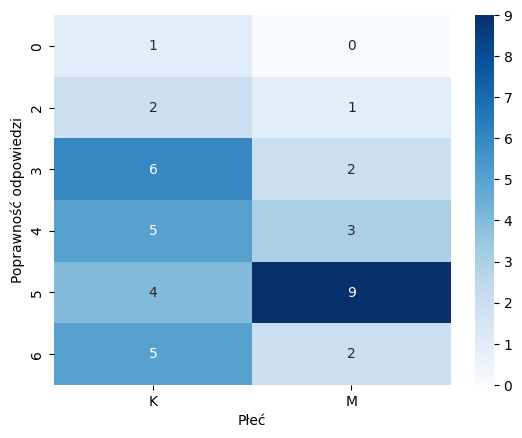

-------------------------------------
Zsumowane grafiki A:
Płeć  K  M
corr      
0     1  0
1     6  2
2     9  7
3     7  8
Chi2 test conducted...
Chi-squared test statistic value: 2.47229326513214
P-value: 0.48031912676829214
Brak podstaw do odrzucenia H0.


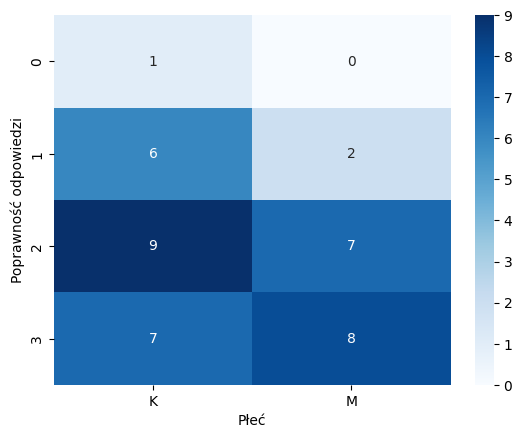

-------------------------------------
Zsumowane grafiki B:
Płeć   K   M
corr        
0      1   0
1      4   2
2     11  10
3      7   5
Chi2 test conducted...
Chi-squared test statistic value: 1.1740348313238333
P-value: 0.7592383281795241
Brak podstaw do odrzucenia H0.


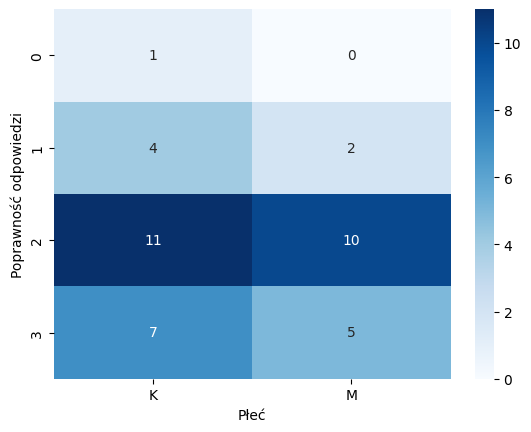

-------------------------------------
Zsumowane grafiki 1:
Płeć   K   M
corr        
0      2   0
1      3   1
2     18  16
Chi2 test conducted...
Chi-squared test statistic value: 2.2686926432977286
P-value: 0.32163229670274396
Brak podstaw do odrzucenia H0.


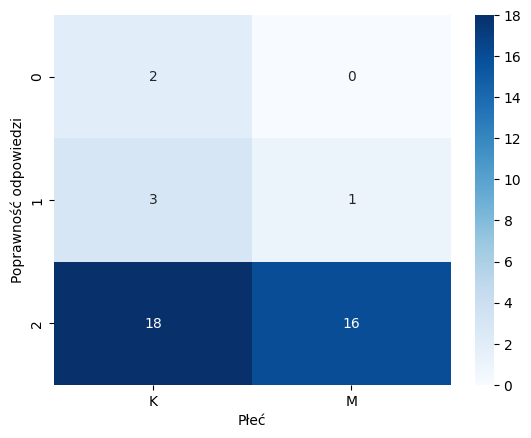

-------------------------------------
Zsumowane grafiki 2:
Płeć   K  M
corr       
0      5  3
1      2  5
2     16  9
Chi2 test conducted...
Chi-squared test statistic value: 2.9112166605772747
P-value: 0.23325842256839455
Brak podstaw do odrzucenia H0.


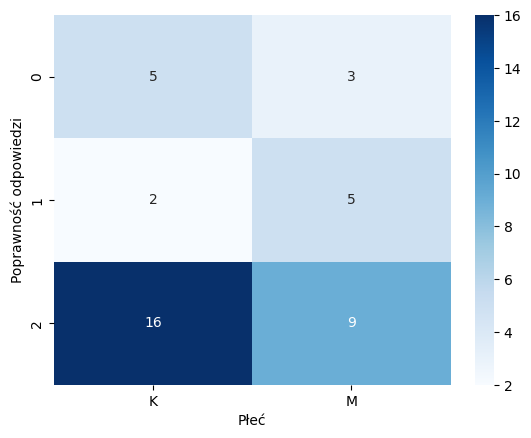

-------------------------------------
Zsumowane grafiki 3:
Płeć  K  M
corr      
0     9  3
1     9  7
2     5  7
Chi2 test conducted...
Chi-squared test statistic value: 2.745098039215686
P-value: 0.25346006075953387
Brak podstaw do odrzucenia H0.


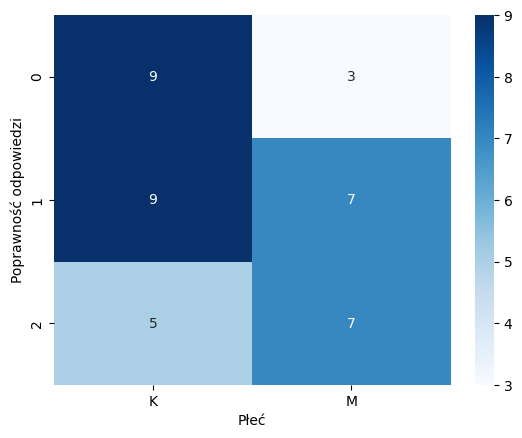

-------------------------------------
Kolekcja wszystkie grafiki:
Płeć   K   M
corr        
0     46  25
1     92  77
Chi2 test conducted...
Chi-squared test statistic value: 1.7888447225674593
P-value: 0.18106698535374172
Brak podstaw do odrzucenia H0.


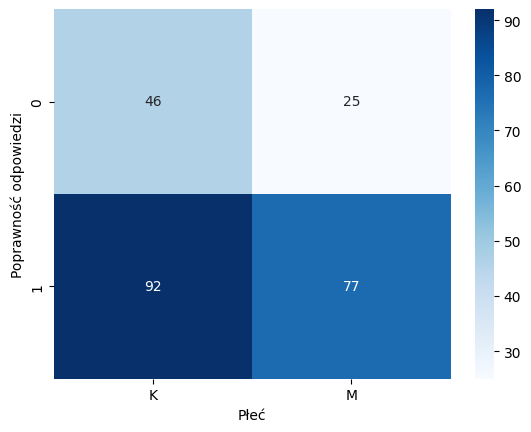

-------------------------------------
Kolekcja grafiki A:
Płeć   K   M
corr        
0     24  11
1     45  40
Chi2 test conducted...
Chi-squared test statistic value: 1.88011777601066
P-value: 0.1703207623306217
Brak podstaw do odrzucenia H0.


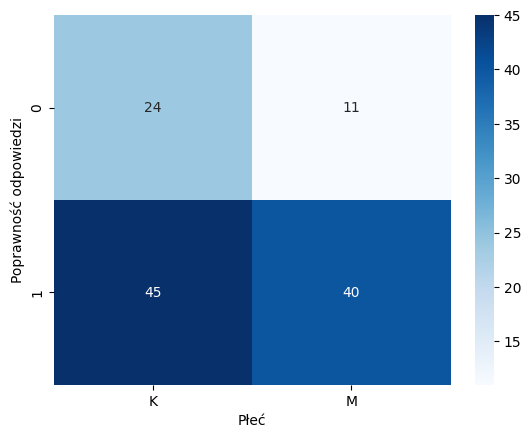

-------------------------------------
Kolekcja grafiki B:
Płeć   K   M
corr        
0     22  14
1     47  37
Chi2 test conducted...
Chi-squared test statistic value: 0.1039256282223033
P-value: 0.7471686357938214
Brak podstaw do odrzucenia H0.


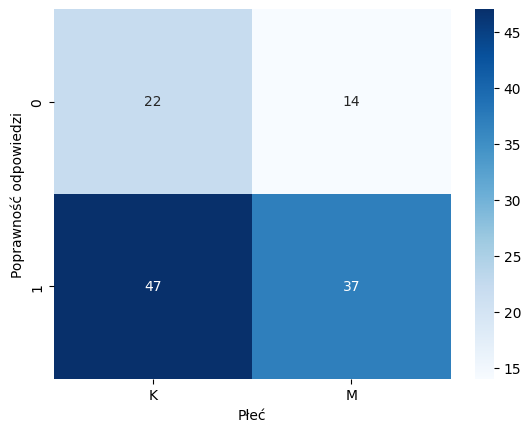

-------------------------------------
Kolekcja grafiki 1:
Płeć   K   M
corr        
0      7   1
1     39  33
Chi2 test conducted...
Chi-squared test statistic value: 2.051719238420006
P-value: 0.15203442278549306
Brak podstaw do odrzucenia H0.


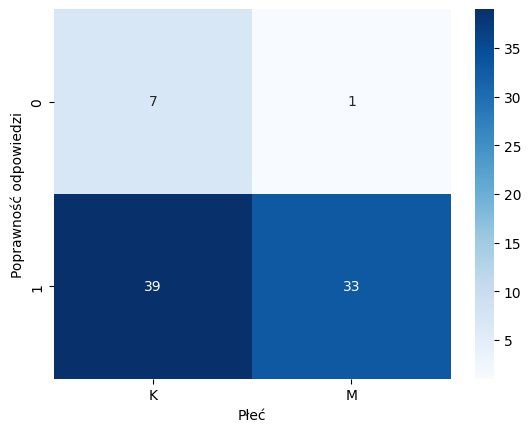

-------------------------------------
Kolekcja grafiki 2:
Płeć   K   M
corr        
0     12  11
1     34  23
Chi2 test conducted...
Chi-squared test statistic value: 0.13125218249671777
P-value: 0.7171372499245469
Brak podstaw do odrzucenia H0.


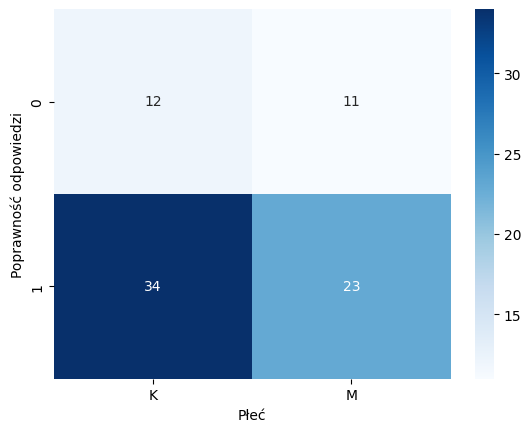

-------------------------------------
Kolekcja grafiki 3:
Płeć   K   M
corr        
0     27  13
1     19  21
Chi2 test conducted...
Chi-squared test statistic value: 2.506393861892583
P-value: 0.11338512495420265
Brak podstaw do odrzucenia H0.


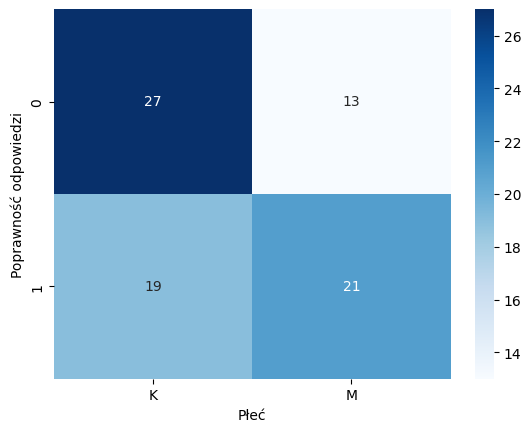

In [25]:
# płeć
var = 'Płeć'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', var, cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 0     1     0     0     0
2                 0     0     1     2     0
3                 0     3     1     4     0
4                 0     1     5     2     0
5                 1     0     3     8     1
6                 0     3     1     1     2
Chi2 test conducted...
Chi-squared test statistic value: 26.40690192160781
P-value: 0.1527898007412733
Brak podstaw do odrzucenia H0.


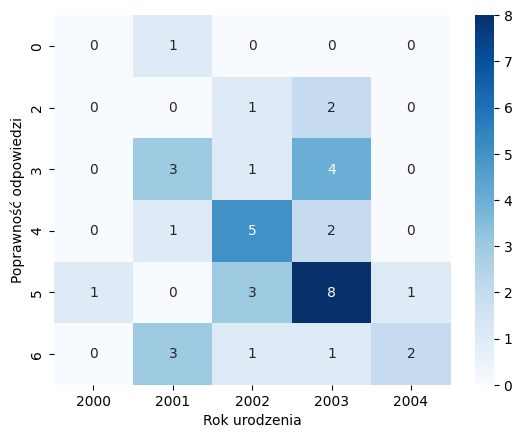

-------------------------------------
Zsumowane grafiki A:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 0     1     0     0     0
1                 0     1     2     5     0
2                 0     3     5     8     0
3                 1     3     4     4     3
Chi2 test conducted...
Chi-squared test statistic value: 12.757464349376116
P-value: 0.38691296398079306
Brak podstaw do odrzucenia H0.


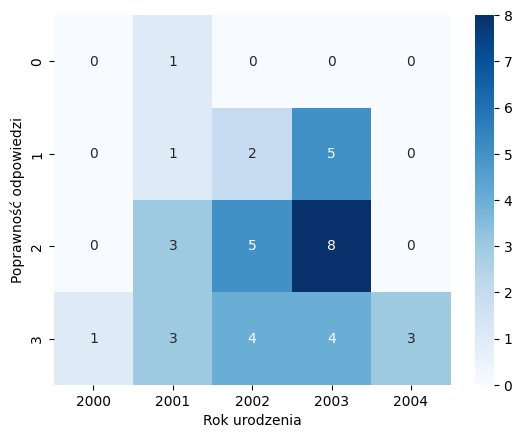

-------------------------------------
Zsumowane grafiki B:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 0     1     0     0     0
1                 0     2     1     3     0
2                 1     2     9     8     1
3                 0     3     1     6     2
Chi2 test conducted...
Chi-squared test statistic value: 12.714009846362789
P-value: 0.39016580743362556
Brak podstaw do odrzucenia H0.


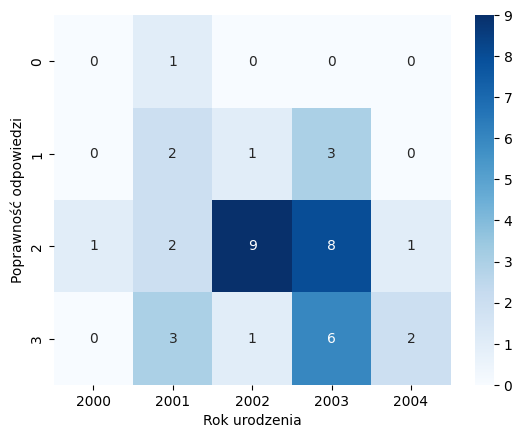

-------------------------------------
Zsumowane grafiki 1:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 0     2     0     0     0
1                 0     1     1     2     0
2                 1     5    10    15     3
Chi2 test conducted...
Chi-squared test statistic value: 9.160506448568736
P-value: 0.32893739583510906
Brak podstaw do odrzucenia H0.


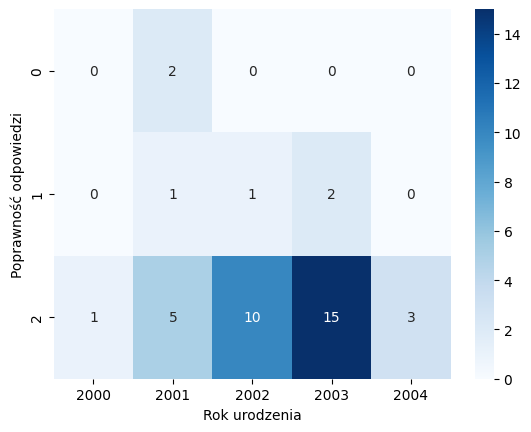

-------------------------------------
Zsumowane grafiki 2:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 0     2     2     4     0
1                 0     0     4     3     0
2                 1     6     5    10     3
Chi2 test conducted...
Chi-squared test statistic value: 7.00909090909091
P-value: 0.5356521440725318
Brak podstaw do odrzucenia H0.


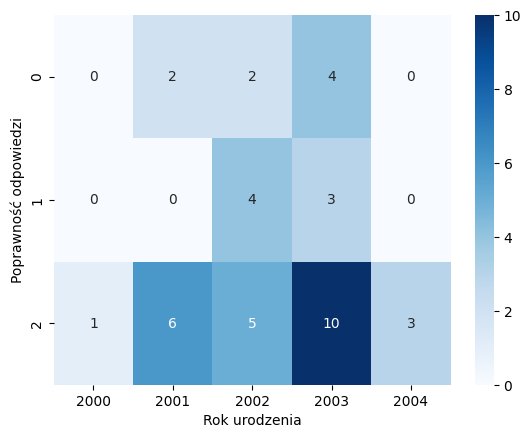

-------------------------------------
Zsumowane grafiki 3:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 0     3     4     5     0
1                 1     2     3     9     1
2                 0     3     4     3     2
Chi2 test conducted...
Chi-squared test statistic value: 6.84863339275104
P-value: 0.5530487399861875
Brak podstaw do odrzucenia H0.


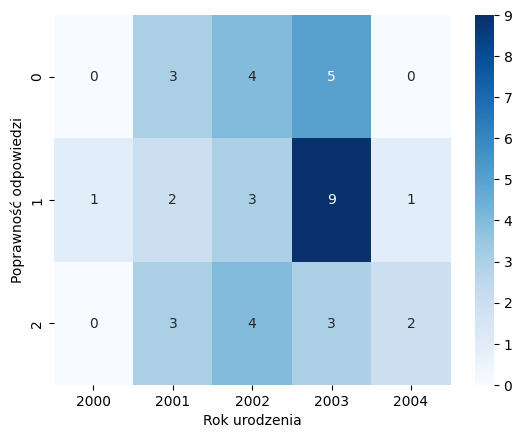

-------------------------------------
Kolekcja wszystkie grafiki:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 1    17    20    32     1
1                 5    31    46    70    17
Chi2 test conducted...
Chi-squared test statistic value: 6.426346580575119
P-value: 0.1694907076381028
Brak podstaw do odrzucenia H0.


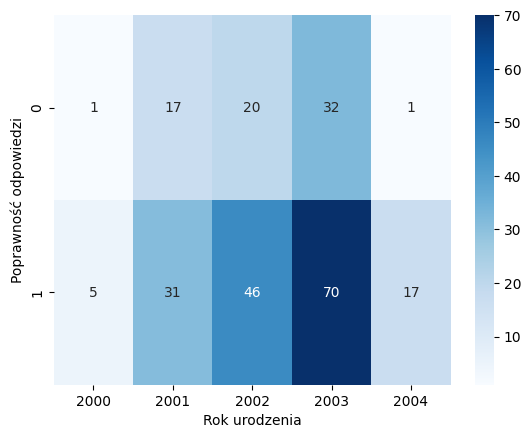

-------------------------------------
Kolekcja grafiki A:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 0     8     9    18     0
1                 3    16    24    33     9
Chi2 test conducted...
Chi-squared test statistic value: 6.126994113153283
P-value: 0.18986288794559603
Brak podstaw do odrzucenia H0.


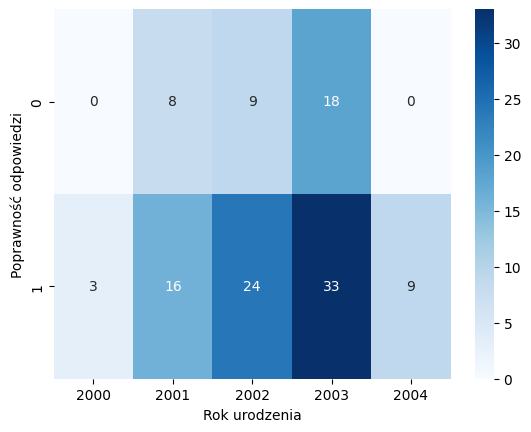

-------------------------------------
Kolekcja grafiki B:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 1     9    11    14     1
1                 2    15    22    37     8
Chi2 test conducted...
Chi-squared test statistic value: 2.5202303143479616
P-value: 0.6410169427354798
Brak podstaw do odrzucenia H0.


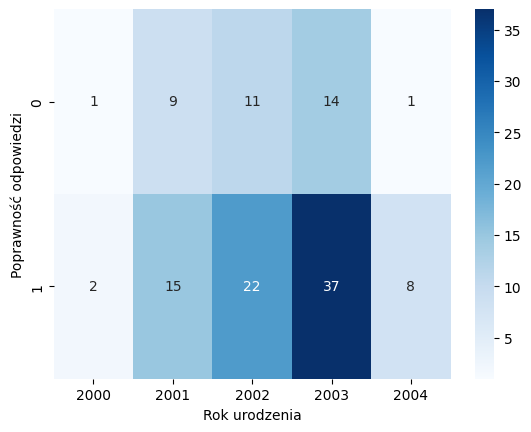

-------------------------------------
Kolekcja grafiki 1:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 0     5     1     2     0
1                 2    11    21    32     6
Chi2 test conducted...
Chi-squared test statistic value: 10.284462269756386
P-value: 0.03589909898518443
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


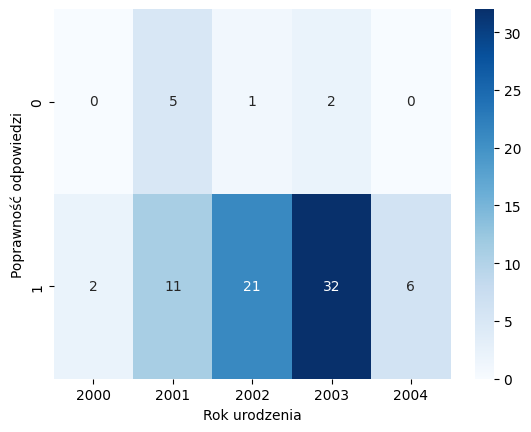

-------------------------------------
Kolekcja grafiki 2:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 0     4     8    11     0
1                 2    12    14    23     6
Chi2 test conducted...
Chi-squared test statistic value: 4.17593623677888
P-value: 0.3827187818133513
Brak podstaw do odrzucenia H0.


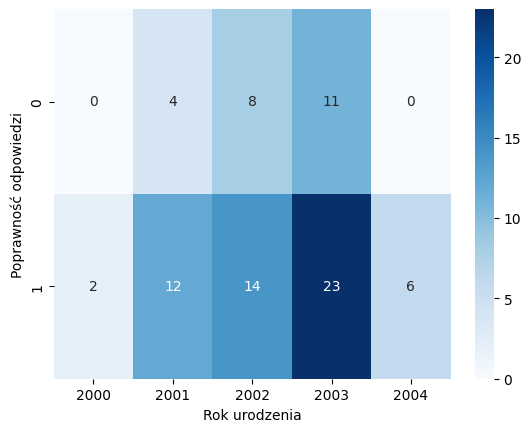

-------------------------------------
Kolekcja grafiki 3:
Rok_urodzenia  2000  2001  2002  2003  2004
corr                                       
0                 1     8    11    19     1
1                 1     8    11    15     5
Chi2 test conducted...
Chi-squared test statistic value: 3.1372549019607843
P-value: 0.5351245472916446
Brak podstaw do odrzucenia H0.


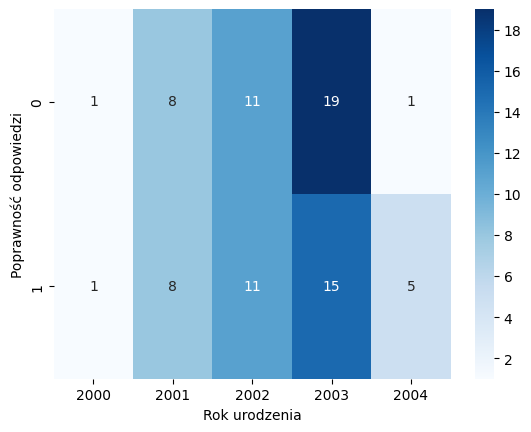

In [26]:
# rok urodzenia
var = 'Rok_urodzenia'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Rok urodzenia', cmap='Blues')

In [27]:
posthocNemenyi_test(df_coll1, 'corr', var, ALPHA)

+------+----------+----------+----------+----------+----------+
|      |     2002 |     2003 |     2001 |     2000 |     2004 |
+======+==========+==========+==========+==========+==========+
| 2002 | 1        | 0.002576 | 0.161453 | 0.40631  | 0.290429 |
+------+----------+----------+----------+----------+----------+
| 2003 | 0.002576 | 1        | 0        | 0.013374 | 0.000115 |
+------+----------+----------+----------+----------+----------+
| 2001 | 0.161453 | 0        | 1        | 0.949075 | 0.997313 |
+------+----------+----------+----------+----------+----------+
| 2000 | 0.40631  | 0.013374 | 0.949075 | 1        | 0.989574 |
+------+----------+----------+----------+----------+----------+
| 2004 | 0.290429 | 0.000115 | 0.997313 | 0.989574 | 1        |
+------+----------+----------+----------+----------+----------+


-------------------------------------
Zsumowane wszystkie grafiki:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                         1                        0                 0
2                         2                        1                 0
3                         7                        1                 0
4                         7                        0                 1
5                         9                        3                 1
6                         6                        0                 1
Chi2 test conducted...
Chi-squared test statistic value: 6.248397435897435
P-value: 0.7939800286033748
Brak podstaw do odrzucenia H0.


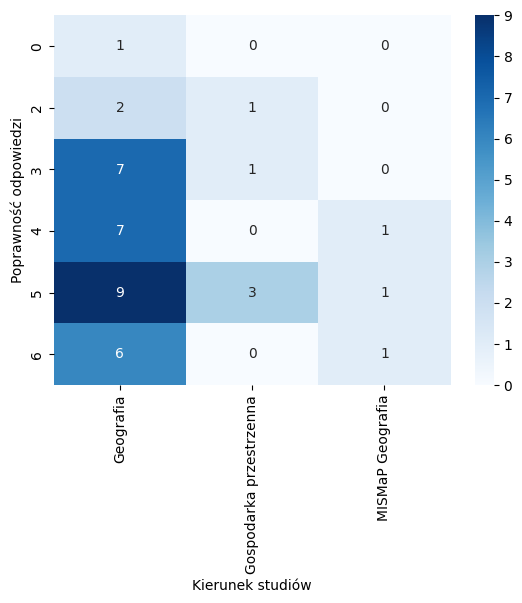

-------------------------------------
Zsumowane grafiki A:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                         1                        0                 0
1                         7                        1                 0
2                        12                        3                 1
3                        12                        1                 2
Chi2 test conducted...
Chi-squared test statistic value: 2.5784722222222216
P-value: 0.8595840719396219
Brak podstaw do odrzucenia H0.


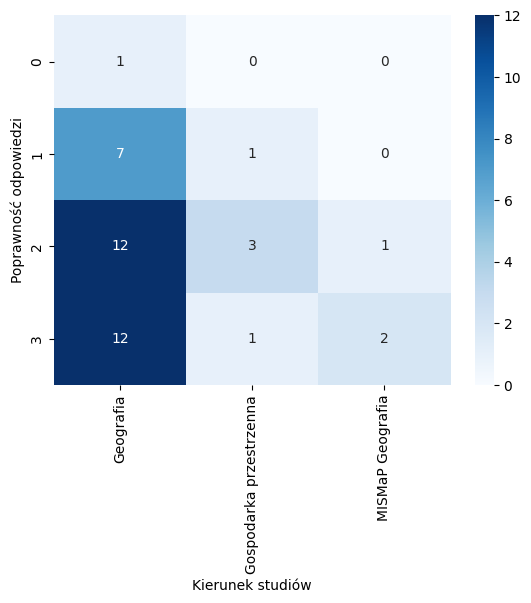

-------------------------------------
Zsumowane grafiki B:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                         1                        0                 0
1                         4                        2                 0
2                        18                        1                 2
3                         9                        2                 1
Chi2 test conducted...
Chi-squared test statistic value: 4.33829365079365
P-value: 0.630997898477172
Brak podstaw do odrzucenia H0.


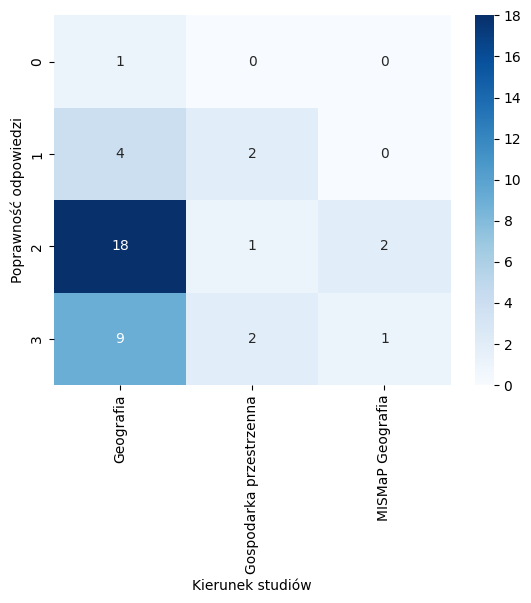

-------------------------------------
Zsumowane grafiki 1:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                         2                        0                 0
1                         4                        0                 0
2                        26                        5                 3
Chi2 test conducted...
Chi-squared test statistic value: 1.7647058823529411
P-value: 0.7789328925691673
Brak podstaw do odrzucenia H0.


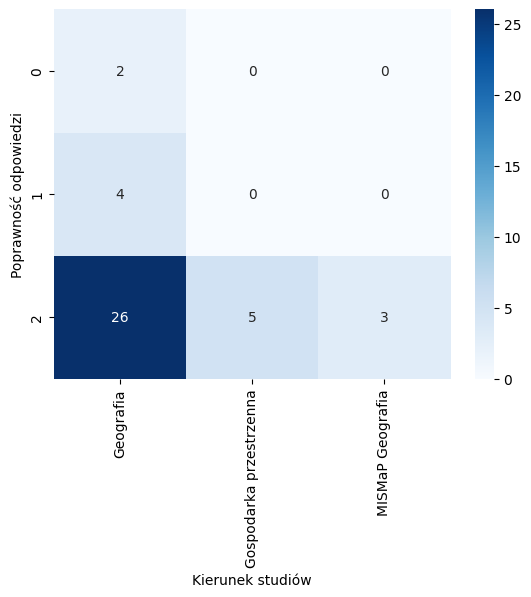

-------------------------------------
Zsumowane grafiki 2:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                         5                        2                 1
1                         6                        0                 1
2                        21                        3                 1
Chi2 test conducted...
Chi-squared test statistic value: 3.3695833333333334
P-value: 0.4979834012808769
Brak podstaw do odrzucenia H0.


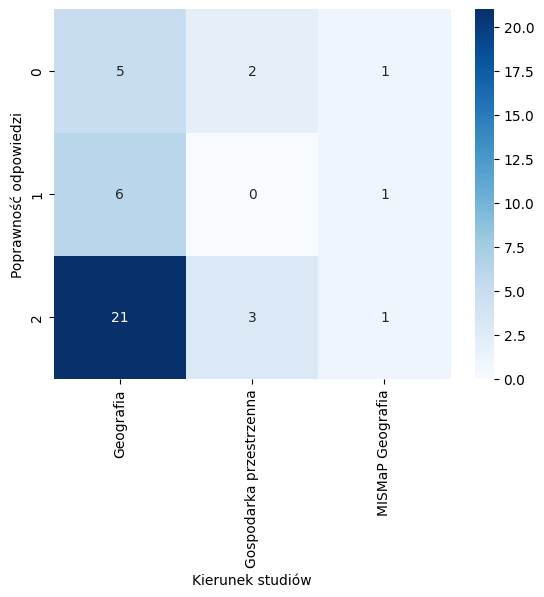

-------------------------------------
Zsumowane grafiki 3:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                        11                        1                 0
1                        12                        4                 0
2                         9                        0                 3
Chi2 test conducted...
Chi-squared test statistic value: 10.958333333333334
P-value: 0.027036302868396013
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


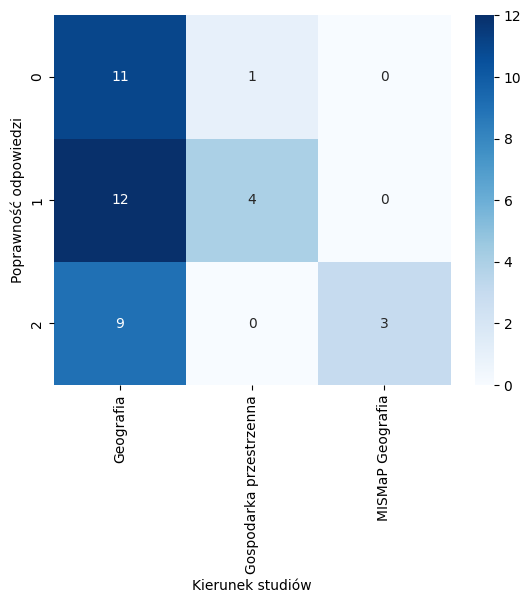

-------------------------------------
Kolekcja wszystkie grafiki:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                        58                       10                 3
1                       134                       20                15
Chi2 test conducted...
Chi-squared test statistic value: 1.6801400116676388
P-value: 0.4316803022317607
Brak podstaw do odrzucenia H0.


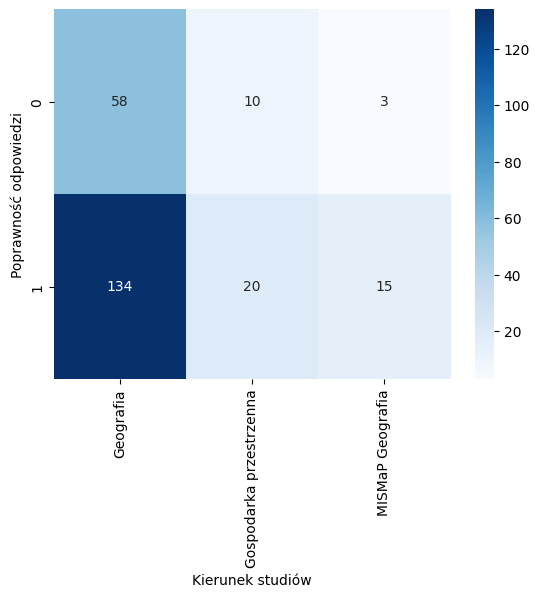

-------------------------------------
Kolekcja grafiki A:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                        29                        5                 1
1                        67                       10                 8
Chi2 test conducted...
Chi-squared test statistic value: 1.596638655462185
P-value: 0.4500847738031116
Brak podstaw do odrzucenia H0.


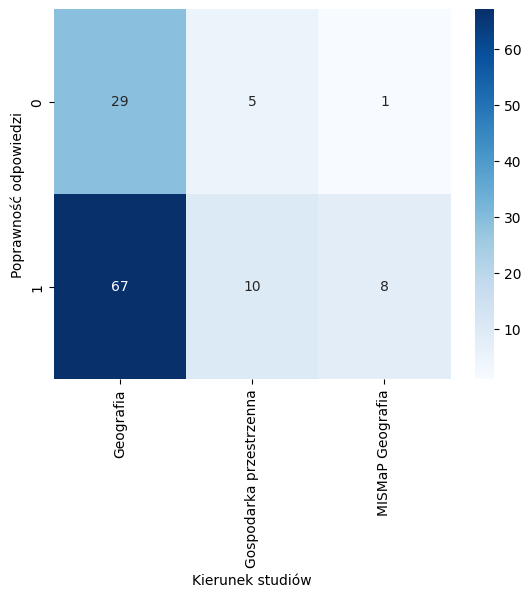

-------------------------------------
Kolekcja grafiki B:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                        29                        5                 2
1                        67                       10                 7
Chi2 test conducted...
Chi-squared test statistic value: 0.3406084656084658
P-value: 0.8434081851232338
Brak podstaw do odrzucenia H0.


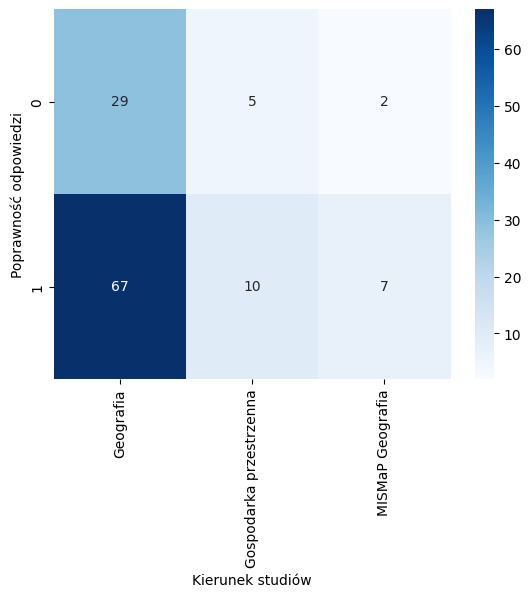

-------------------------------------
Kolekcja grafiki 1:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                         8                        0                 0
1                        56                       10                 6
Chi2 test conducted...
Chi-squared test statistic value: 2.2222222222222223
P-value: 0.3291929878079054
Brak podstaw do odrzucenia H0.


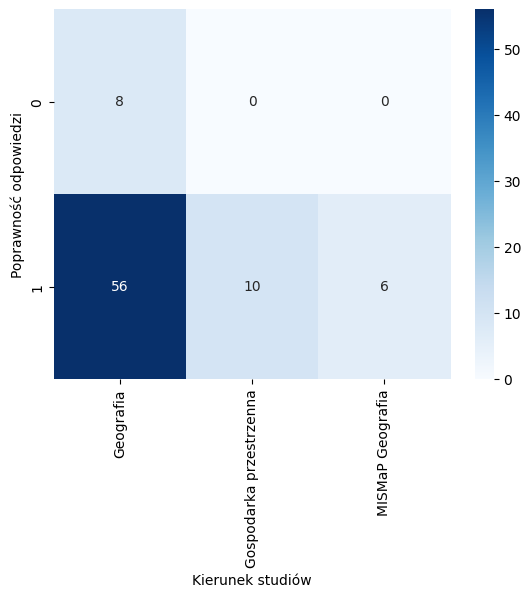

-------------------------------------
Kolekcja grafiki 2:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                        16                        4                 3
1                        48                        6                 3
Chi2 test conducted...
Chi-squared test statistic value: 2.3798627002288324
P-value: 0.30424214953855866
Brak podstaw do odrzucenia H0.


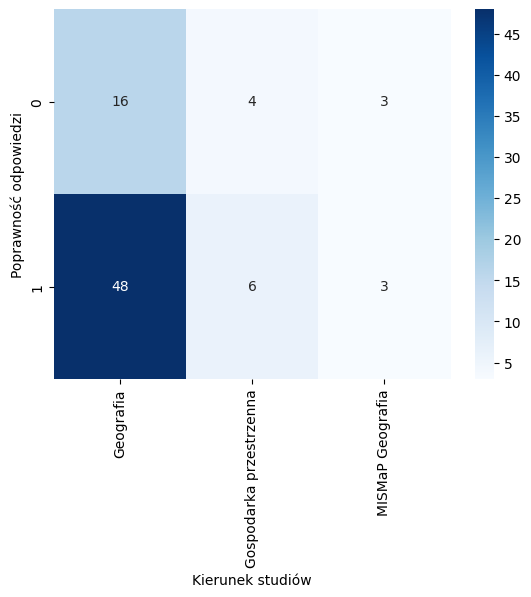

-------------------------------------
Kolekcja grafiki 3:
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
corr                                                                  
0                        34                        6                 0
1                        30                        4                 6
Chi2 test conducted...
Chi-squared test statistic value: 6.65
P-value: 0.03597251875342965
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


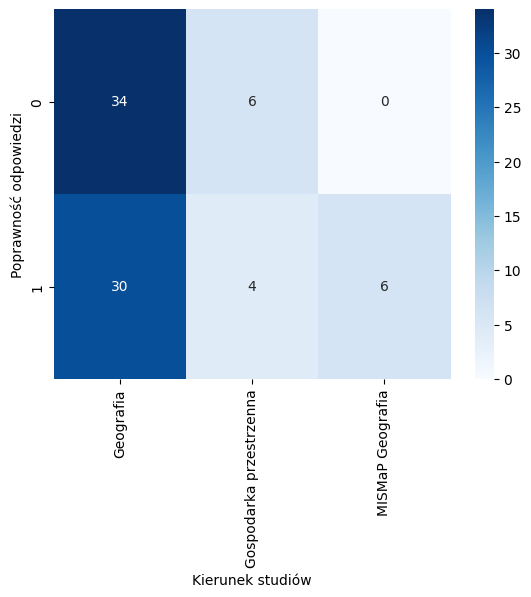

In [28]:
# kierunek studiów
var = 'Kierunek_studiów'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Kierunek studiów', cmap='Blues')

In [29]:
posthocNemenyi_test(df_sum3, 'corr', var, ALPHA)
posthocNemenyi_test(df_coll3, 'corr', var, ALPHA)

+-------------------------+--------------------+---------------------------+-------------+
|                         |   MISMaP Geografia |   Gospodarka przestrzenna |   Geografia |
+=========================+====================+===========================+=============+
| MISMaP Geografia        |           1        |                  0.958835 |    0.007191 |
+-------------------------+--------------------+---------------------------+-------------+
| Gospodarka przestrzenna |           0.958835 |                  1        |    0.002155 |
+-------------------------+--------------------+---------------------------+-------------+
| Geografia               |           0.007191 |                  0.002155 |    1        |
+-------------------------+--------------------+---------------------------+-------------+
+-------------------------+--------------------+---------------------------+-------------+
|                         |   MISMaP Geografia |   Gospodarka przestrzenna |   Geografia |

-------------------------------------
Zsumowane wszystkie grafiki:
Rok_studiów  1  2  3
corr                
0            1  0  0
2            3  0  0
3            4  1  3
4            3  4  1
5            9  3  1
6            3  0  4
Chi2 test conducted...
Chi-squared test statistic value: 15.606154111588893
P-value: 0.11147544155399011
Brak podstaw do odrzucenia H0.


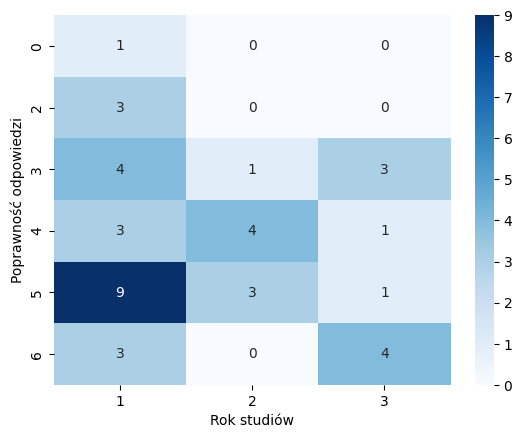

-------------------------------------
Zsumowane grafiki A:
Rok_studiów  1  2  3
corr                
0            1  0  0
1            6  1  1
2            9  4  3
3            7  3  5
Chi2 test conducted...
Chi-squared test statistic value: 3.138687600644123
P-value: 0.7912496415904829
Brak podstaw do odrzucenia H0.


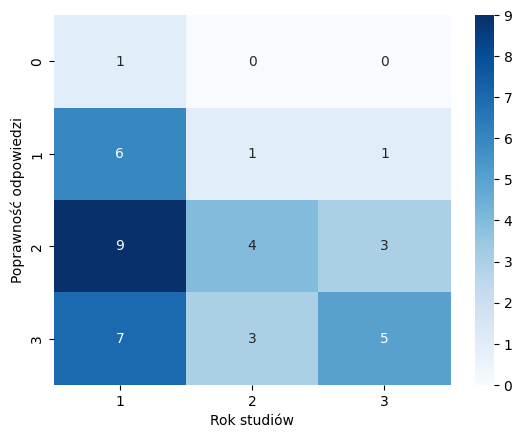

-------------------------------------
Zsumowane grafiki B:
Rok_studiów   1  2  3
corr                 
0             1  0  0
1             4  0  2
2            10  8  3
3             8  0  4
Chi2 test conducted...
Chi-squared test statistic value: 9.965493443754312
P-value: 0.1261127070604207
Brak podstaw do odrzucenia H0.


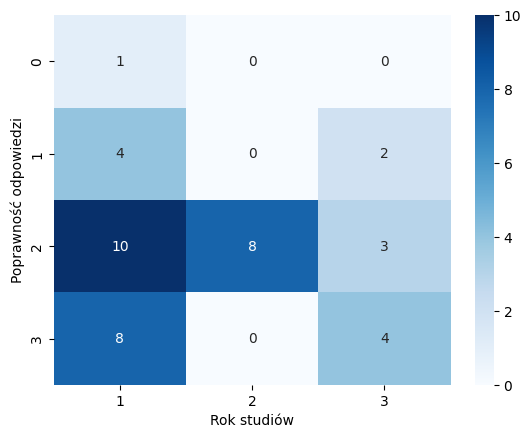

-------------------------------------
Zsumowane grafiki 1:
Rok_studiów   1  2  3
corr                 
0             1  0  1
1             3  0  1
2            19  8  7
Chi2 test conducted...
Chi-squared test statistic value: 2.398408638817847
P-value: 0.6629148705217156
Brak podstaw do odrzucenia H0.


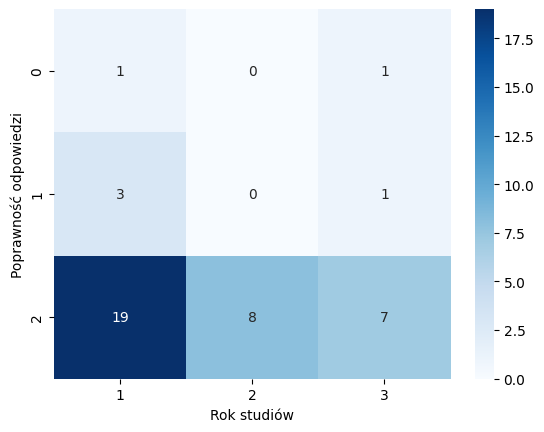

-------------------------------------
Zsumowane grafiki 2:
Rok_studiów   1  2  3
corr                 
0             6  1  1
1             3  4  0
2            14  3  8
Chi2 test conducted...
Chi-squared test statistic value: 9.483799171842652
P-value: 0.05008120494762175
Brak podstaw do odrzucenia H0.


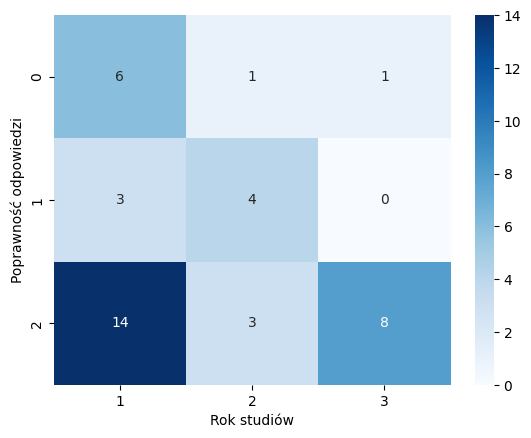

-------------------------------------
Zsumowane grafiki 3:
Rok_studiów   1  2  3
corr                 
0             7  3  2
1            11  2  3
2             5  3  4
Chi2 test conducted...
Chi-squared test statistic value: 2.5342190016103063
P-value: 0.6385190117091426
Brak podstaw do odrzucenia H0.


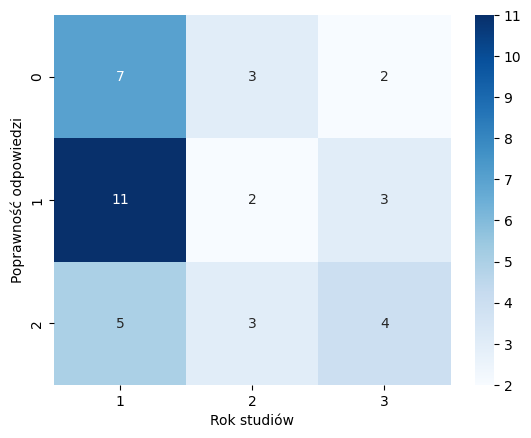

-------------------------------------
Kolekcja wszystkie grafiki:
Rok_studiów   1   2   3
corr                   
0            45  14  12
1            93  34  42
Chi2 test conducted...
Chi-squared test statistic value: 2.0149505212390877
P-value: 0.36513969937204716
Brak podstaw do odrzucenia H0.


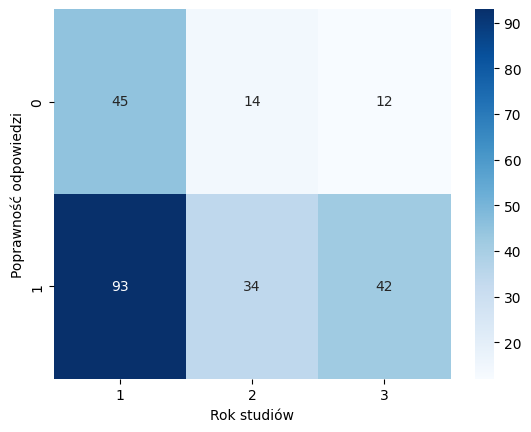

-------------------------------------
Kolekcja grafiki A:
Rok_studiów   1   2   3
corr                   
0            24   6   5
1            45  18  22
Chi2 test conducted...
Chi-squared test statistic value: 2.7368164657167213
P-value: 0.25451176075063
Brak podstaw do odrzucenia H0.


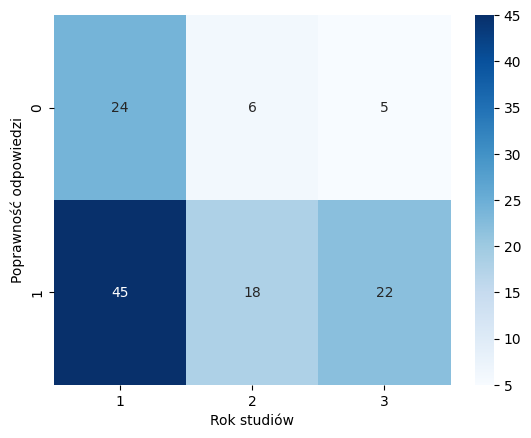

-------------------------------------
Kolekcja grafiki B:
Rok_studiów   1   2   3
corr                   
0            21   8   7
1            48  16  20
Chi2 test conducted...
Chi-squared test statistic value: 0.3465991871788974
P-value: 0.84088565315231
Brak podstaw do odrzucenia H0.


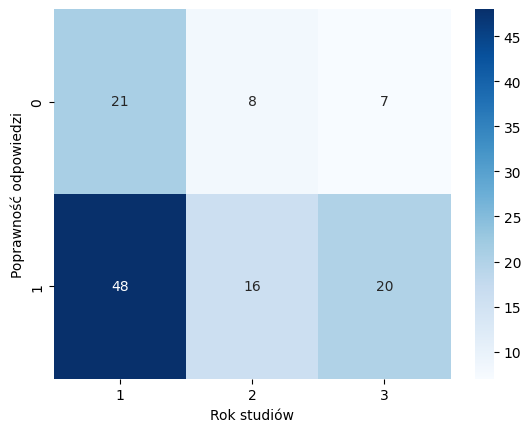

-------------------------------------
Kolekcja grafiki 1:
Rok_studiów   1   2   3
corr                   
0             5   0   3
1            41  16  15
Chi2 test conducted...
Chi-squared test statistic value: 2.7053140096618353
P-value: 0.2585523722870223
Brak podstaw do odrzucenia H0.


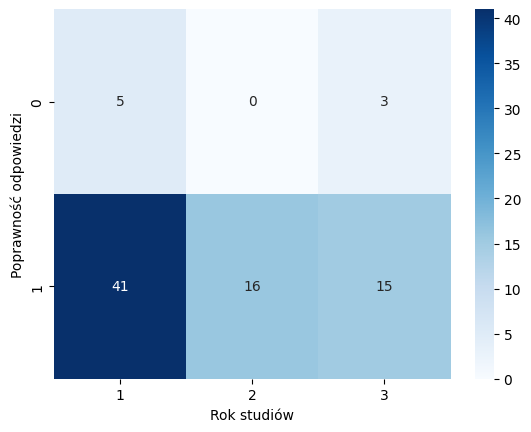

-------------------------------------
Kolekcja grafiki 2:
Rok_studiów   1   2   3
corr                   
0            15   6   2
1            31  10  16
Chi2 test conducted...
Chi-squared test statistic value: 3.666338709617986
P-value: 0.15990596507414526
Brak podstaw do odrzucenia H0.


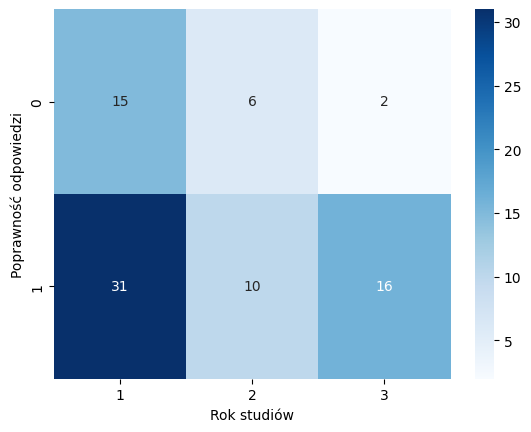

-------------------------------------
Kolekcja grafiki 3:
Rok_studiów   1  2   3
corr                  
0            25  8   7
1            21  8  11
Chi2 test conducted...
Chi-squared test statistic value: 1.2367149758454106
P-value: 0.5388287438733984
Brak podstaw do odrzucenia H0.


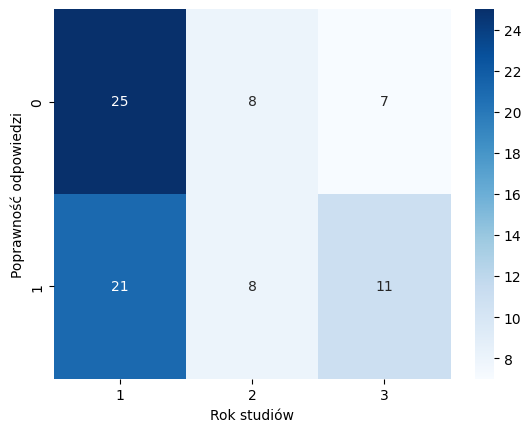

In [30]:
# rok studiów
var = 'Rok_studiów'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Rok studiów', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0               1        0       0         0
2               1        1       1         0
3               1        5       1         1
4               1        3       0         4
5               4        4       3         2
6               1        5       0         1
Chi2 test conducted...
Chi-squared test statistic value: 16.081654456654455
P-value: 0.37664570282661447
Brak podstaw do odrzucenia H0.


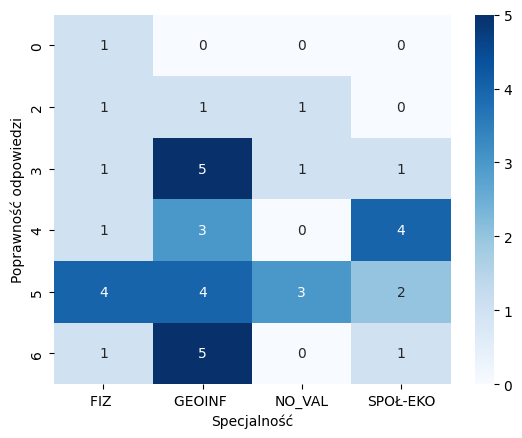

-------------------------------------
Zsumowane grafiki A:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0               1        0       0         0
1               2        4       1         1
2               3        5       3         5
3               3        9       1         2
Chi2 test conducted...
Chi-squared test statistic value: 7.554166666666667
P-value: 0.579622037631938
Brak podstaw do odrzucenia H0.


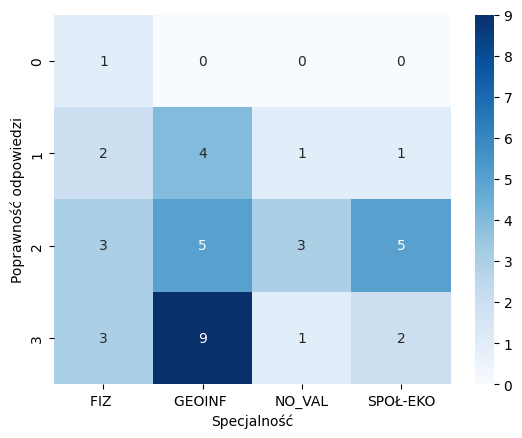

-------------------------------------
Zsumowane grafiki B:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0               1        0       0         0
1               1        3       2         0
2               4       10       1         6
3               3        5       2         2
Chi2 test conducted...
Chi-squared test statistic value: 9.06878306878307
P-value: 0.430949302767594
Brak podstaw do odrzucenia H0.


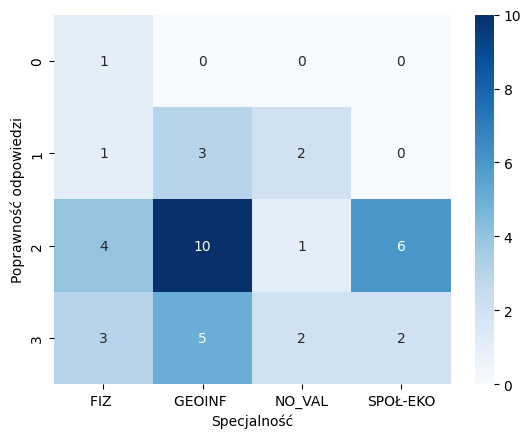

-------------------------------------
Zsumowane grafiki 1:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0               1        1       0         0
1               1        3       0         0
2               7       14       5         8
Chi2 test conducted...
Chi-squared test statistic value: 3.9542483660130725
P-value: 0.6828679549669878
Brak podstaw do odrzucenia H0.


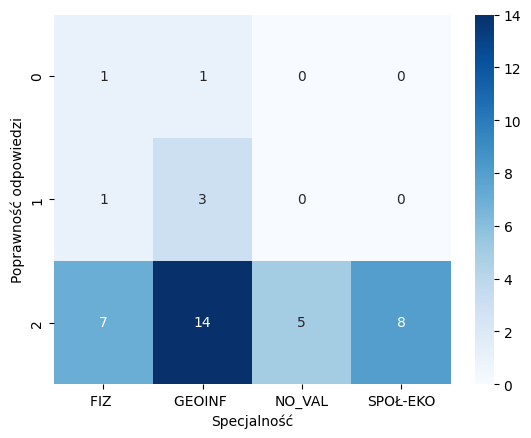

-------------------------------------
Zsumowane grafiki 2:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0               2        2       2         2
1               1        3       0         3
2               6       13       3         3
Chi2 test conducted...
Chi-squared test statistic value: 5.856190476190477
P-value: 0.43949118750556404
Brak podstaw do odrzucenia H0.


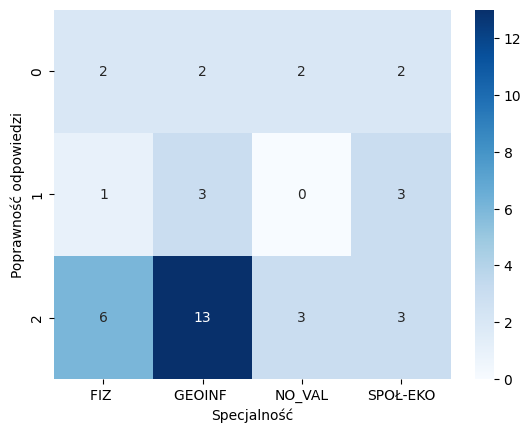

-------------------------------------
Zsumowane grafiki 3:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0               3        6       1         2
1               5        5       4         2
2               1        7       0         4
Chi2 test conducted...
Chi-squared test statistic value: 8.11111111111111
P-value: 0.23007555056898943
Brak podstaw do odrzucenia H0.


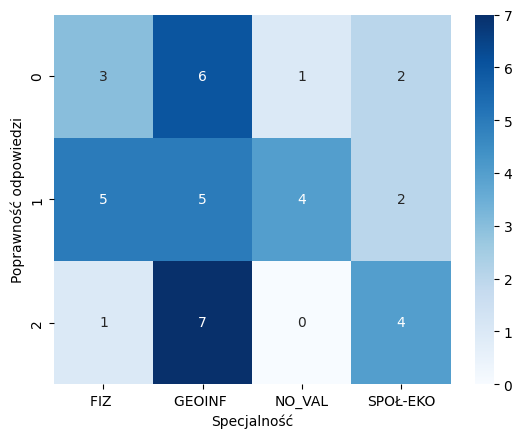

-------------------------------------
Kolekcja wszystkie grafiki:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0              19       29      10        13
1              35       79      20        35
Chi2 test conducted...
Chi-squared test statistic value: 1.5467955662971913
P-value: 0.671512803492774
Brak podstaw do odrzucenia H0.


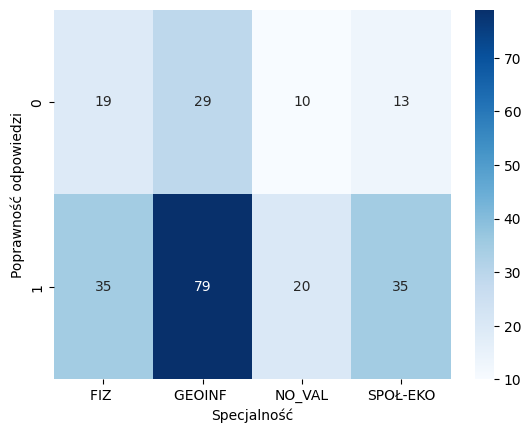

-------------------------------------
Kolekcja grafiki A:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0              10       13       5         7
1              17       41      10        17
Chi2 test conducted...
Chi-squared test statistic value: 1.6134453781512605
P-value: 0.6563450276796576
Brak podstaw do odrzucenia H0.


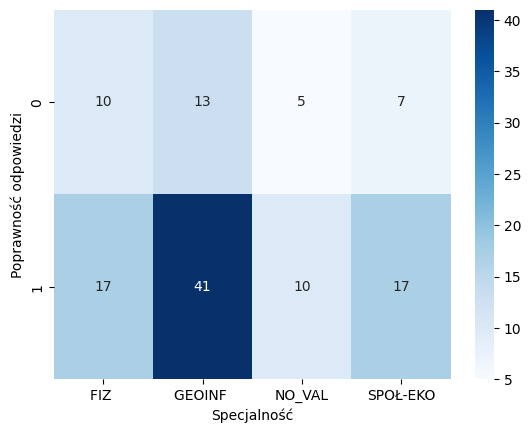

-------------------------------------
Kolekcja grafiki B:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0               9       16       5         6
1              18       38      10        18
Chi2 test conducted...
Chi-squared test statistic value: 0.511463844797178
P-value: 0.9163657325309754
Brak podstaw do odrzucenia H0.


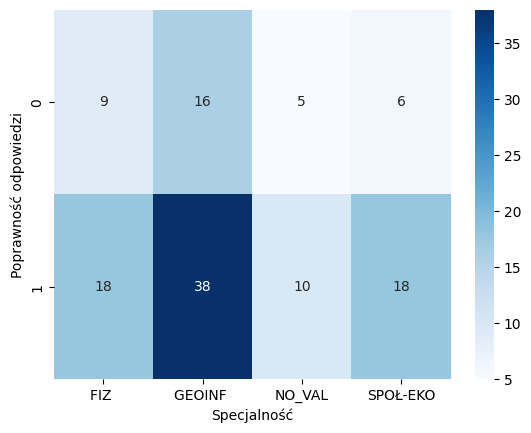

-------------------------------------
Kolekcja grafiki 1:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0               3        5       0         0
1              15       31      10        16
Chi2 test conducted...
Chi-squared test statistic value: 4.382716049382716
P-value: 0.22299337181703102
Brak podstaw do odrzucenia H0.


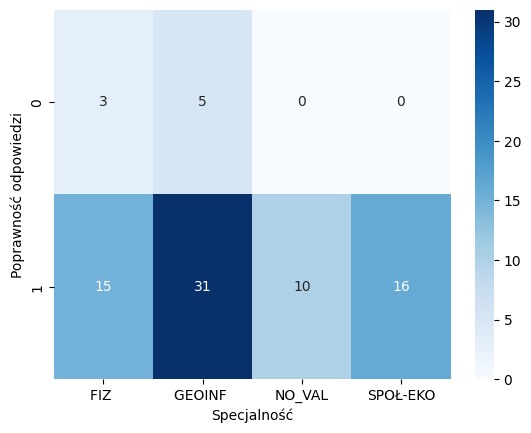

-------------------------------------
Kolekcja grafiki 2:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0               5        7       4         7
1              13       29       6         9
Chi2 test conducted...
Chi-squared test statistic value: 3.9054157131960343
P-value: 0.2718603201084215
Brak podstaw do odrzucenia H0.


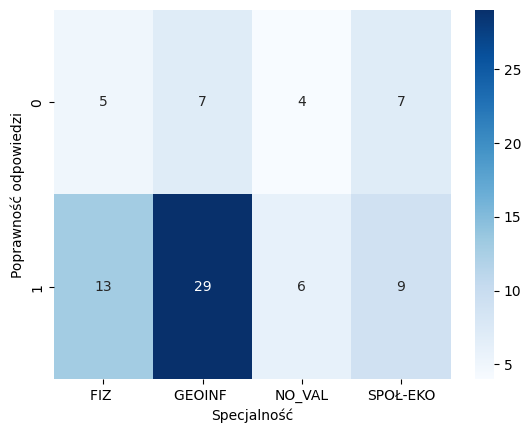

-------------------------------------
Kolekcja grafiki 3:
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
corr                                        
0              11       17       6         6
1               7       19       4        10
Chi2 test conducted...
Chi-squared test statistic value: 2.4
P-value: 0.49363462271172787
Brak podstaw do odrzucenia H0.


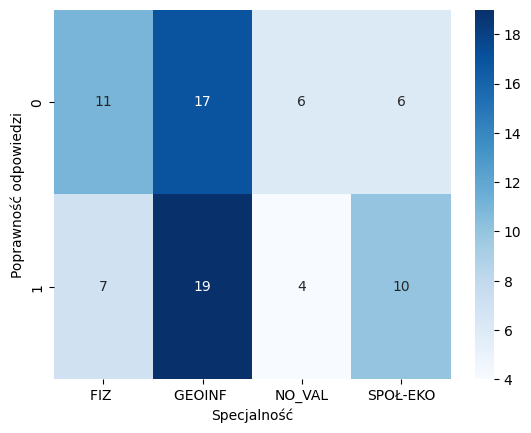

In [31]:
# specjalność
var = 'Specjalność'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', var, cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Wady_wzroku  0  1
corr             
0            0  1
2            2  1
3            2  6
4            4  4
5            4  9
6            4  3
Chi2 test conducted...
Chi-squared test statistic value: 3.957570207570208
P-value: 0.5555408744707073
Brak podstaw do odrzucenia H0.


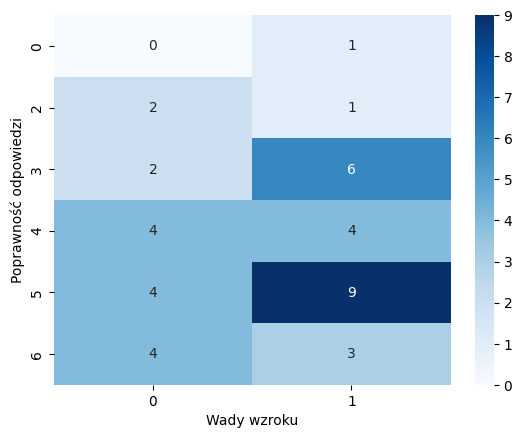

-------------------------------------
Zsumowane grafiki A:
Wady_wzroku  0   1
corr              
0            0   1
1            3   5
2            6  10
3            7   8
Chi2 test conducted...
Chi-squared test statistic value: 1.0069444444444446
P-value: 0.7995716113771797
Brak podstaw do odrzucenia H0.


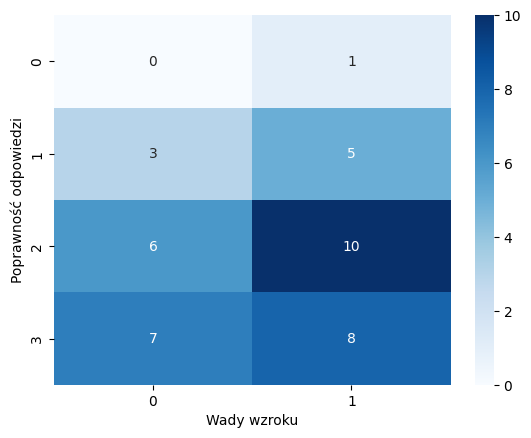

-------------------------------------
Zsumowane grafiki B:
Wady_wzroku  0   1
corr              
0            0   1
1            3   3
2            8  13
3            5   7
Chi2 test conducted...
Chi-squared test statistic value: 0.9623015873015874
P-value: 0.8103727681036947
Brak podstaw do odrzucenia H0.


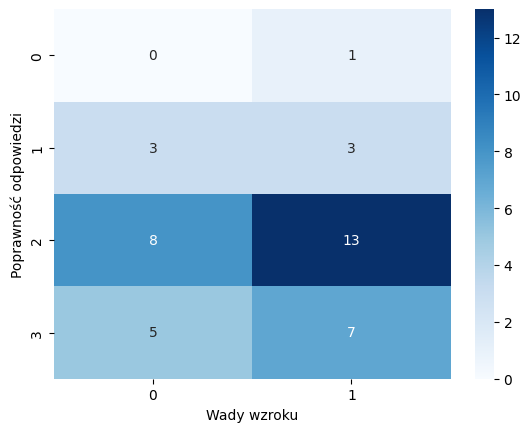

-------------------------------------
Zsumowane grafiki 1:
Wady_wzroku   0   1
corr               
0             1   1
1             2   2
2            13  21
Chi2 test conducted...
Chi-squared test statistic value: 0.2941176470588235
P-value: 0.8632431969112068
Brak podstaw do odrzucenia H0.


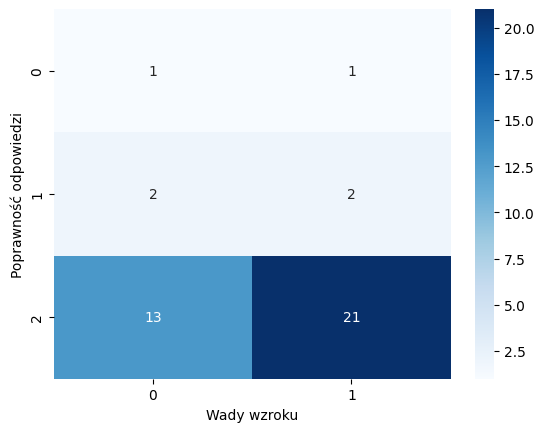

-------------------------------------
Zsumowane grafiki 2:
Wady_wzroku   0   1
corr               
0             3   5
1             1   6
2            12  13
Chi2 test conducted...
Chi-squared test statistic value: 2.6160714285714284
P-value: 0.2703505809471985
Brak podstaw do odrzucenia H0.


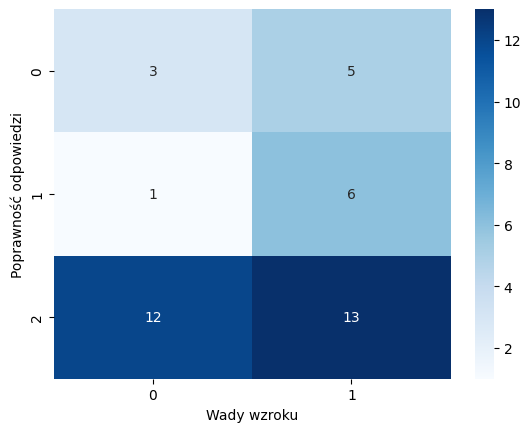

-------------------------------------
Zsumowane grafiki 3:
Wady_wzroku  0  1
corr             
0            4  8
1            7  9
2            5  7
Chi2 test conducted...
Chi-squared test statistic value: 0.32986111111111094
P-value: 0.8479525876396884
Brak podstaw do odrzucenia H0.


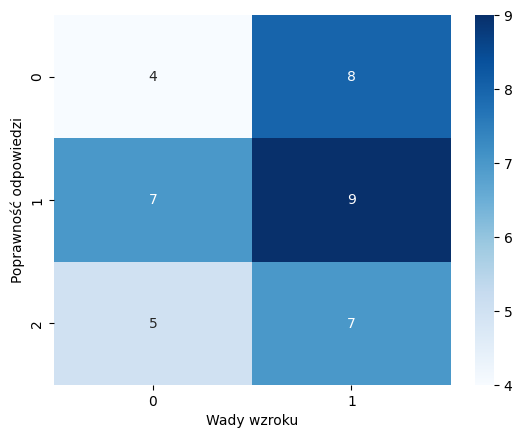

-------------------------------------
Kolekcja wszystkie grafiki:
Wady_wzroku   0   1
corr               
0            26  45
1            70  99
Chi2 test conducted...
Chi-squared test statistic value: 0.3008584048670725
P-value: 0.5833447778533903
Brak podstaw do odrzucenia H0.


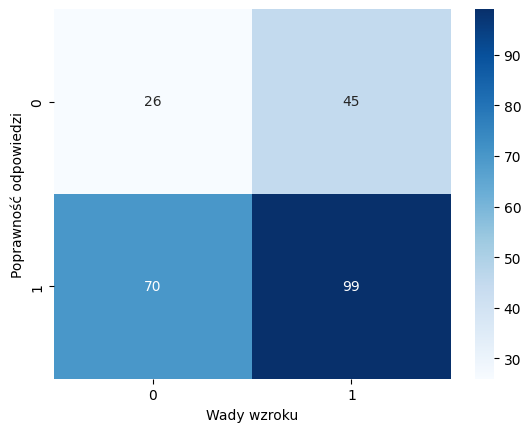

-------------------------------------
Kolekcja grafiki A:
Wady_wzroku   0   1
corr               
0            12  23
1            36  49
Chi2 test conducted...
Chi-squared test statistic value: 0.37815126050420167
P-value: 0.538594314826435
Brak podstaw do odrzucenia H0.


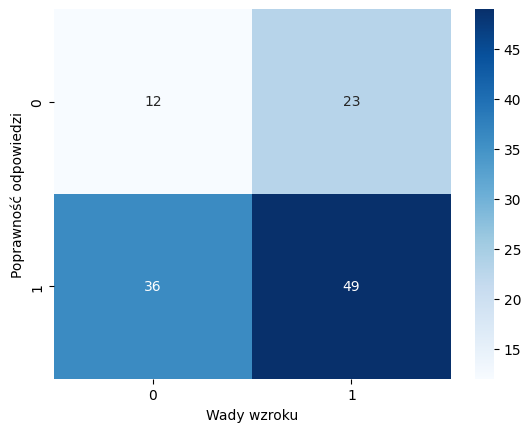

-------------------------------------
Kolekcja grafiki B:
Wady_wzroku   0   1
corr               
0            14  22
1            34  50
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


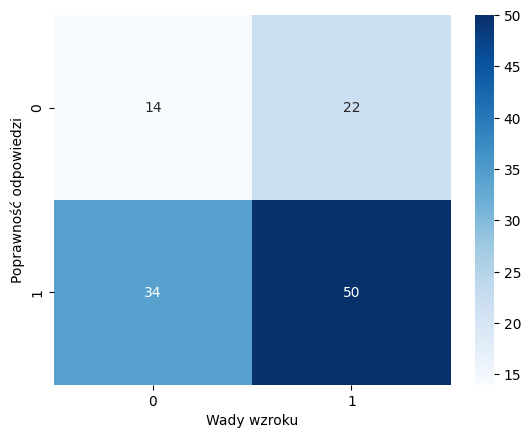

-------------------------------------
Kolekcja grafiki 1:
Wady_wzroku   0   1
corr               
0             4   4
1            28  44
Chi2 test conducted...
Chi-squared test statistic value: 0.05208333333333325
P-value: 0.8194769767775213
Brak podstaw do odrzucenia H0.


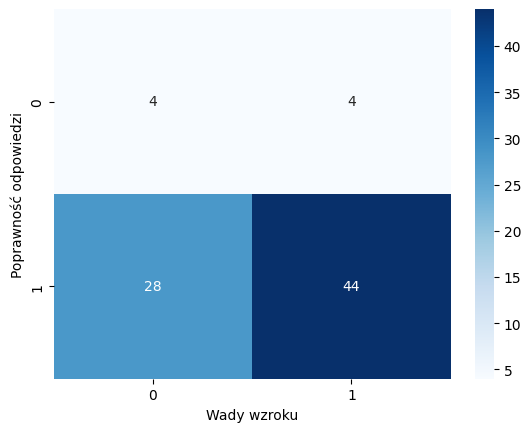

-------------------------------------
Kolekcja grafiki 2:
Wady_wzroku   0   1
corr               
0             7  16
1            25  32
Chi2 test conducted...
Chi-squared test statistic value: 0.7348080345792013
P-value: 0.39132914291013987
Brak podstaw do odrzucenia H0.


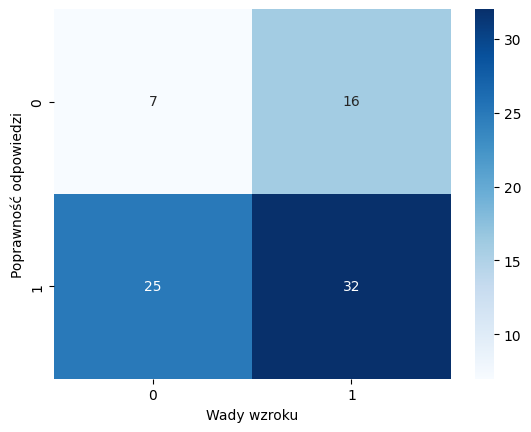

-------------------------------------
Kolekcja grafiki 3:
Wady_wzroku   0   1
corr               
0            15  25
1            17  23
Chi2 test conducted...
Chi-squared test statistic value: 0.05208333333333333
P-value: 0.8194769767775212
Brak podstaw do odrzucenia H0.


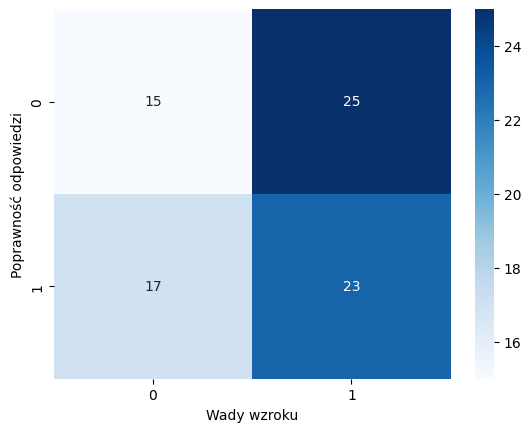

In [32]:
# wady wzroku
var = 'Wady_wzroku'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Wady wzroku', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Ilość_snu  6  7  8  8<  <6
corr                      
0          1  0  0   0   0
2          1  0  0   2   0
3          1  0  0   2   5
4          3  4  1   0   0
5          3  3  2   2   3
6          2  2  1   0   2
Chi2 test conducted...
Chi-squared test statistic value: 26.07878232878233
P-value: 0.1632256743168377
Brak podstaw do odrzucenia H0.


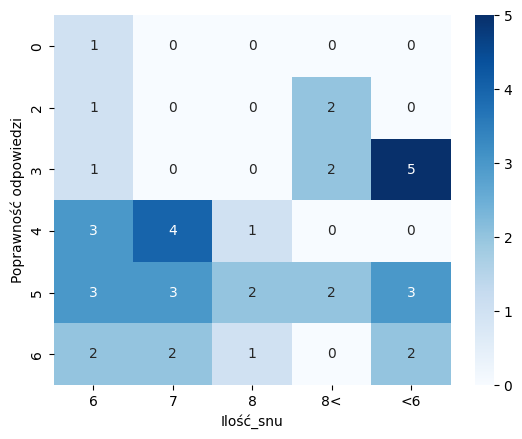

-------------------------------------
Zsumowane grafiki A:
Ilość_snu  6  7  8  8<  <6
corr                      
0          1  0  0   0   0
1          1  0  0   3   4
2          6  5  1   1   3
3          3  4  3   2   3
Chi2 test conducted...
Chi-squared test statistic value: 15.109175084175085
P-value: 0.23552021082362976
Brak podstaw do odrzucenia H0.


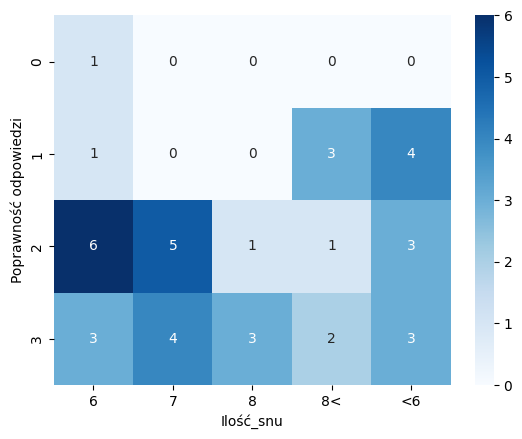

-------------------------------------
Zsumowane grafiki B:
Ilość_snu  6  7  8  8<  <6
corr                      
0          1  0  0   0   0
1          2  0  0   3   1
2          4  6  3   3   5
3          4  3  1   0   4
Chi2 test conducted...
Chi-squared test statistic value: 13.37012987012987
P-value: 0.34272172746957674
Brak podstaw do odrzucenia H0.


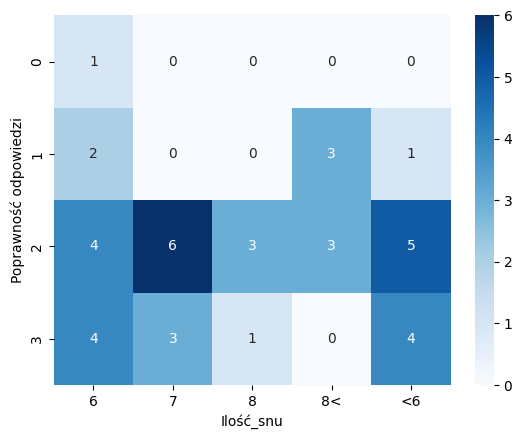

-------------------------------------
Zsumowane grafiki 1:
Ilość_snu   6  7  8  8<  <6
corr                       
0           1  0  0   0   1
1           0  1  0   2   1
2          10  8  4   4   8
Chi2 test conducted...
Chi-squared test statistic value: 7.029708853238263
P-value: 0.5334307258370028
Brak podstaw do odrzucenia H0.


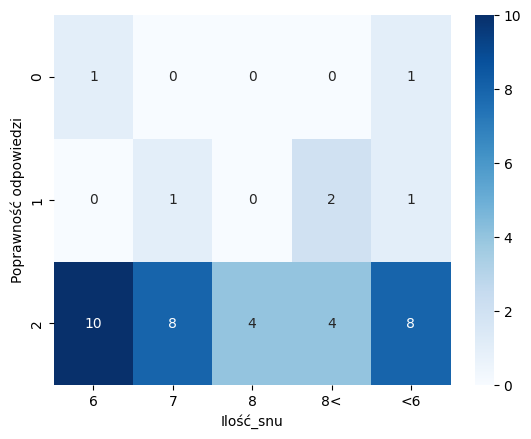

-------------------------------------
Zsumowane grafiki 2:
Ilość_snu  6  7  8  8<  <6
corr                      
0          4  0  0   3   1
1          2  3  0   0   2
2          5  6  4   3   7
Chi2 test conducted...
Chi-squared test statistic value: 12.027012987012991
P-value: 0.1500026933448388
Brak podstaw do odrzucenia H0.


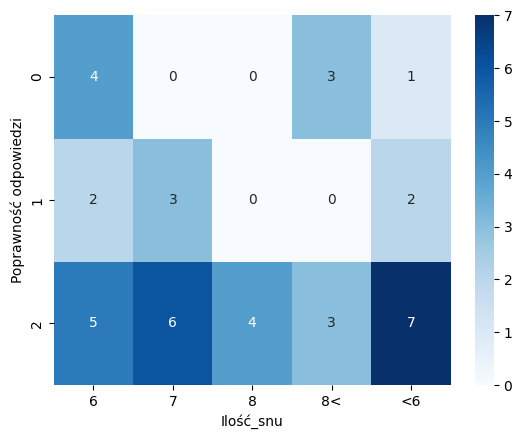

-------------------------------------
Zsumowane grafiki 3:
Ilość_snu  6  7  8  8<  <6
corr                      
0          4  2  1   2   3
1          2  3  2   4   5
2          5  4  1   0   2
Chi2 test conducted...
Chi-squared test statistic value: 6.87962962962963
P-value: 0.5496737983425584
Brak podstaw do odrzucenia H0.


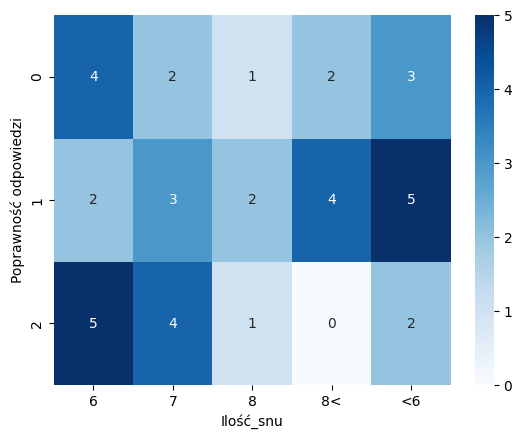

-------------------------------------
Kolekcja wszystkie grafiki:
Ilość_snu   6   7   8  8<  <6
corr                         
0          22  11   4  16  18
1          44  43  20  20  42
Chi2 test conducted...
Chi-squared test statistic value: 8.389588021223991
P-value: 0.07830553112476857
Brak podstaw do odrzucenia H0.


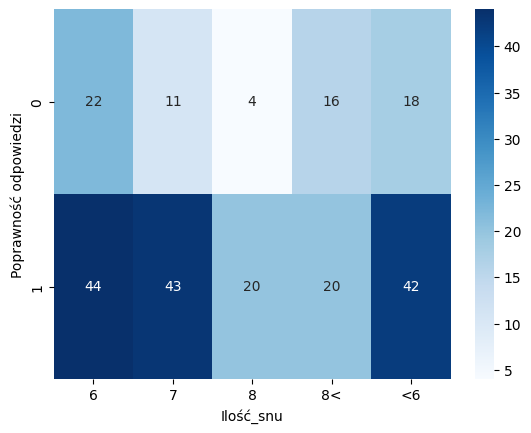

-------------------------------------
Kolekcja grafiki A:
Ilość_snu   6   7   8  8<  <6
corr                         
0          11   5   1   7  11
1          22  22  11  11  19
Chi2 test conducted...
Chi-squared test statistic value: 5.920448179271709
P-value: 0.2051685427904577
Brak podstaw do odrzucenia H0.


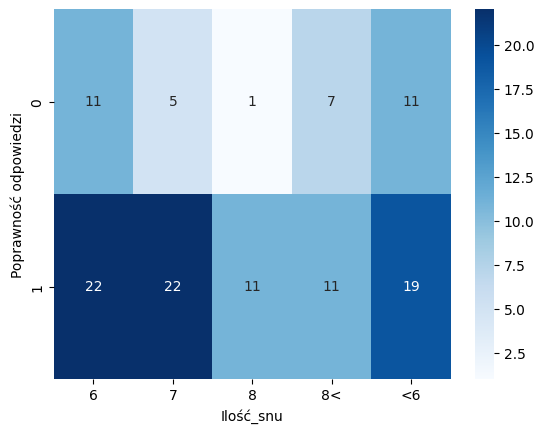

-------------------------------------
Kolekcja grafiki B:
Ilość_snu   6   7  8  8<  <6
corr                        
0          11   6  3   9   7
1          22  21  9   9  23
Chi2 test conducted...
Chi-squared test statistic value: 5.158730158730159
P-value: 0.27139508357042774
Brak podstaw do odrzucenia H0.


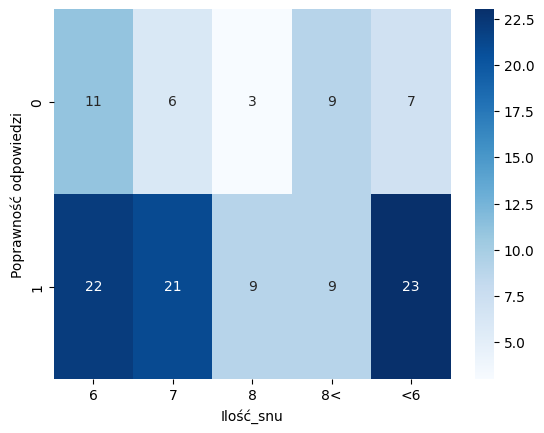

-------------------------------------
Kolekcja grafiki 1:
Ilość_snu   6   7  8  8<  <6
corr                        
0           2   1  0   2   3
1          20  17  8  10  17
Chi2 test conducted...
Chi-squared test statistic value: 2.452300785634119
P-value: 0.6531969544962903
Brak podstaw do odrzucenia H0.


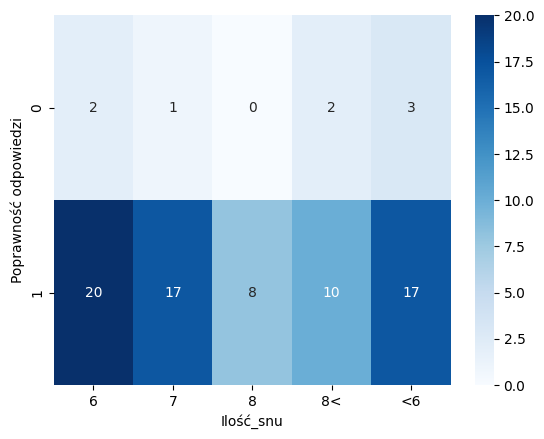

-------------------------------------
Kolekcja grafiki 2:
Ilość_snu   6   7  8  8<  <6
corr                        
0          10   3  0   6   4
1          12  15  8   6  16
Chi2 test conducted...
Chi-squared test statistic value: 10.90076971083836
P-value: 0.027702155335094132
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


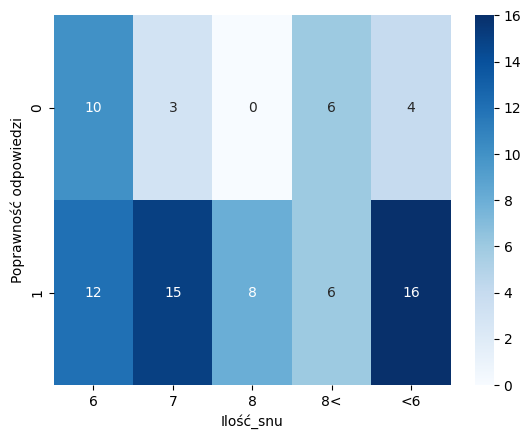

-------------------------------------
Kolekcja grafiki 3:
Ilość_snu   6   7  8  8<  <6
corr                        
0          10   7  4   8  11
1          12  11  4   4   9
Chi2 test conducted...
Chi-squared test statistic value: 2.604040404040404
P-value: 0.6261075510167187
Brak podstaw do odrzucenia H0.


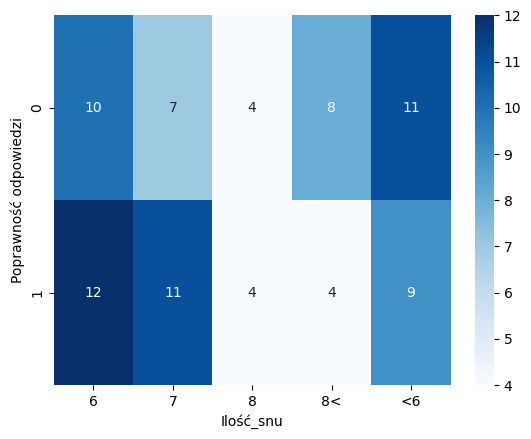

In [33]:
# ilość snu
var = 'Ilość_snu'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Ilość_snu', cmap='Blues')

In [34]:
posthocNemenyi_test(df_coll2, 'corr', var, ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        6 |       <6 |        8 |        7 |       8< |
+====+==========+==========+==========+==========+==========+
| 6  | 1        | 0.995286 | 0.008149 | 0.38842  | 0.009518 |
+----+----------+----------+----------+----------+----------+
| <6 | 0.995286 | 1        | 0.025708 | 0.655212 | 0.034919 |
+----+----------+----------+----------+----------+----------+
| 8  | 0.008149 | 0.025708 | 1        | 0.362574 | 0.994017 |
+----+----------+----------+----------+----------+----------+
| 7  | 0.38842  | 0.655212 | 0.362574 | 1        | 0.524182 |
+----+----------+----------+----------+----------+----------+
| 8< | 0.009518 | 0.034919 | 0.994017 | 0.524182 | 1        |
+----+----------+----------+----------+----------+----------+


-------------------------------------
Zsumowane wszystkie grafiki:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                1         0         0          0
2                1         2         0          0
3                1         2         4          1
4                1         2         3          2
5                0         5         6          2
6                1         2         4          0
Chi2 test conducted...
Chi-squared test statistic value: 15.372880513152007
P-value: 0.4249063194554209
Brak podstaw do odrzucenia H0.


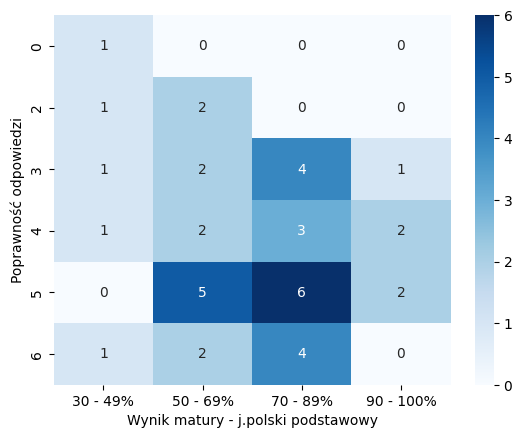

-------------------------------------
Zsumowane grafiki A:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                1         0         0          0
1                1         4         2          1
2                2         4         8          2
3                1         5         7          2
Chi2 test conducted...
Chi-squared test statistic value: 9.300150829562593
P-value: 0.4100416970940083
Brak podstaw do odrzucenia H0.


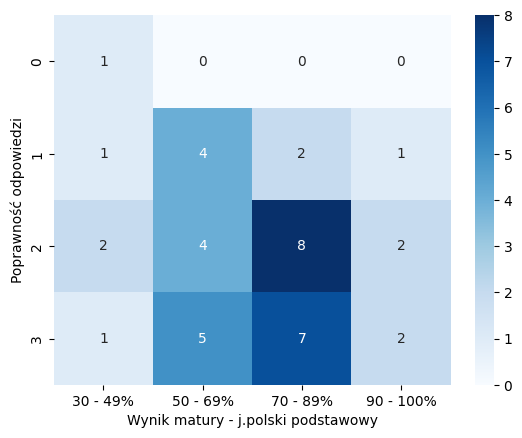

-------------------------------------
Zsumowane grafiki B:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                1         0         0          0
1                2         2         2          0
2                1         7         8          5
3                1         4         7          0
Chi2 test conducted...
Chi-squared test statistic value: 15.585434173669467
P-value: 0.07605995908899515
Brak podstaw do odrzucenia H0.


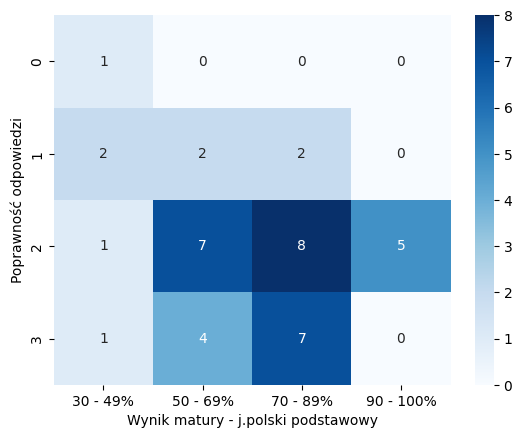

-------------------------------------
Zsumowane grafiki 1:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                1         0         1          0
1                0         2         1          1
2                4        11        15          4
Chi2 test conducted...
Chi-squared test statistic value: 4.892201224381155
P-value: 0.5577117578806849
Brak podstaw do odrzucenia H0.


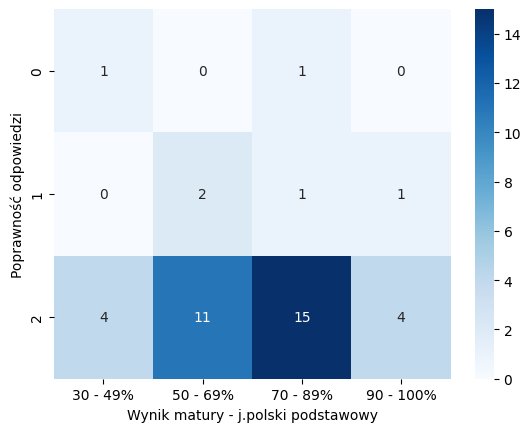

-------------------------------------
Zsumowane grafiki 2:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                3         2         2          1
1                0         2         3          2
2                2         9        12          2
Chi2 test conducted...
Chi-squared test statistic value: 8.151984486102133
P-value: 0.22717870847244312
Brak podstaw do odrzucenia H0.


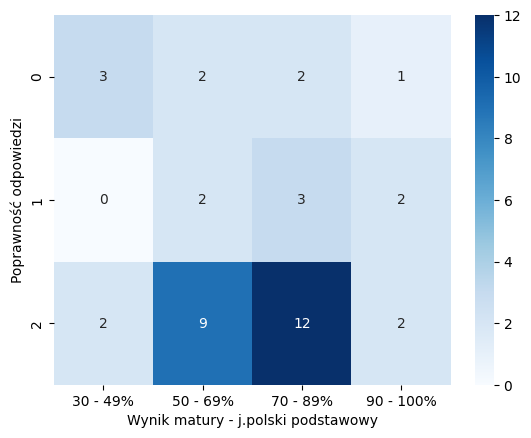

-------------------------------------
Zsumowane grafiki 3:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                3         4         3          2
1                1         7         8          0
2                1         2         6          3
Chi2 test conducted...
Chi-squared test statistic value: 8.619909502262445
P-value: 0.19610927449107265
Brak podstaw do odrzucenia H0.


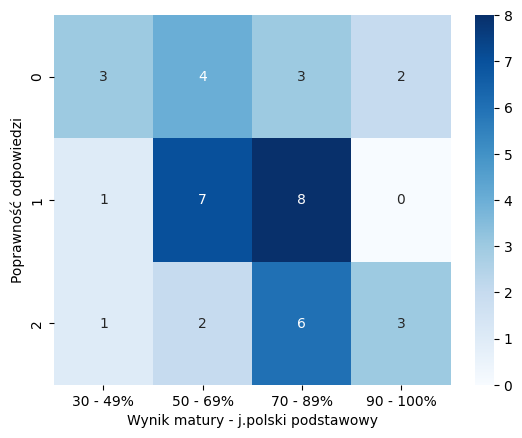

-------------------------------------
Kolekcja wszystkie grafiki:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0               15        23        24          9
1               15        55        78         21
Chi2 test conducted...
Chi-squared test statistic value: 7.8003785383321915
P-value: 0.05032256129935834
Brak podstaw do odrzucenia H0.


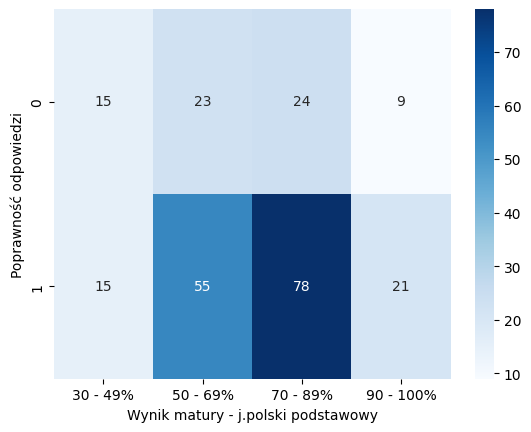

-------------------------------------
Kolekcja grafiki A:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                7        12        12          4
1                8        27        39         11
Chi2 test conducted...
Chi-squared test statistic value: 3.101866991140348
P-value: 0.37618439579404767
Brak podstaw do odrzucenia H0.


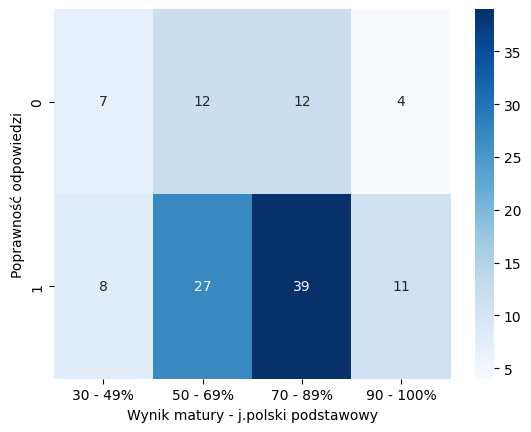

-------------------------------------
Kolekcja grafiki B:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                8        11        12          5
1                7        28        39         10
Chi2 test conducted...
Chi-squared test statistic value: 5.0448897507721036
P-value: 0.16853945300888817
Brak podstaw do odrzucenia H0.


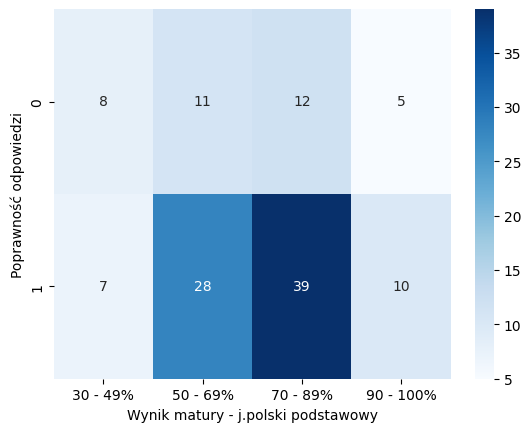

-------------------------------------
Kolekcja grafiki 1:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                2         2         3          1
1                8        24        31          9
Chi2 test conducted...
Chi-squared test statistic value: 1.3172448466566113
P-value: 0.7250422471723761
Brak podstaw do odrzucenia H0.


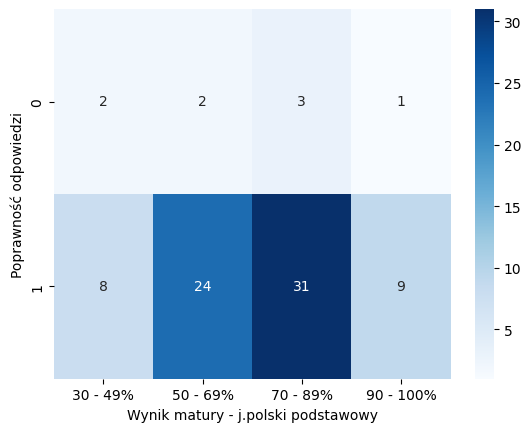

-------------------------------------
Kolekcja grafiki 2:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                6         6         7          4
1                4        20        27          6
Chi2 test conducted...
Chi-squared test statistic value: 6.899365273305239
P-value: 0.07517546112566481
Brak podstaw do odrzucenia H0.


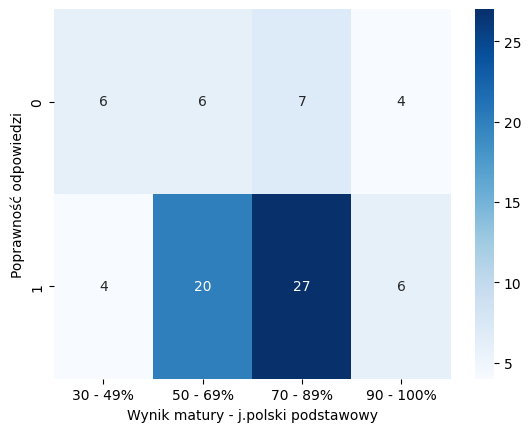

-------------------------------------
Kolekcja grafiki 3:
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                             
0                7        15        14          4
1                3        11        20          6
Chi2 test conducted...
Chi-squared test statistic value: 3.6742081447963804
P-value: 0.29886077421523877
Brak podstaw do odrzucenia H0.


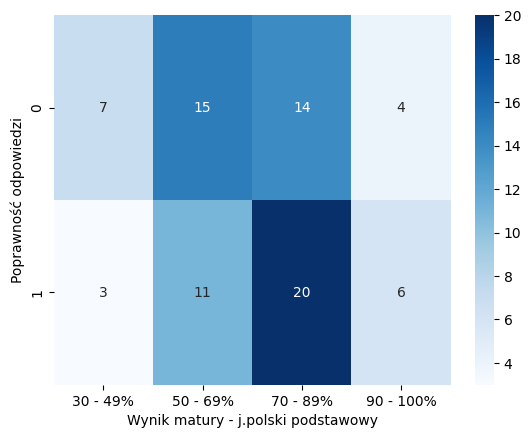

In [36]:
# matura - j.pol - podst
var = 'JP_podst'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Wynik matury - j.polski podstawowy', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 0         0         1          0
2                 0         0         2          1
3                 0         1         1          6
4                 1         1         4          2
5                 0         0         4          9
6                 0         1         0          6
Chi2 test conducted...
Chi-squared test statistic value: 17.046703296703296
P-value: 0.31608015346220947
Brak podstaw do odrzucenia H0.


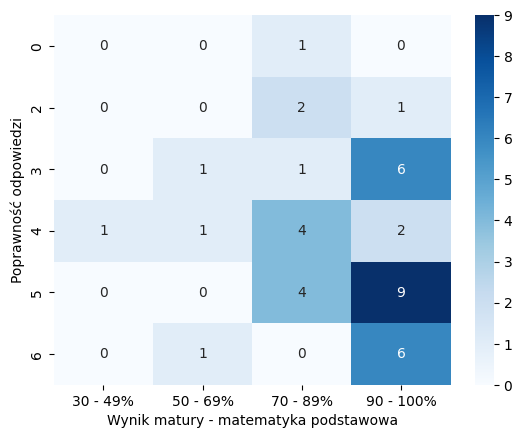

-------------------------------------
Zsumowane grafiki A:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 0         0         1          0
1                 0         1         3          4
2                 1         1         4         10
3                 0         1         4         10
Chi2 test conducted...
Chi-squared test statistic value: 4.722222222222221
P-value: 0.8578195591326675
Brak podstaw do odrzucenia H0.


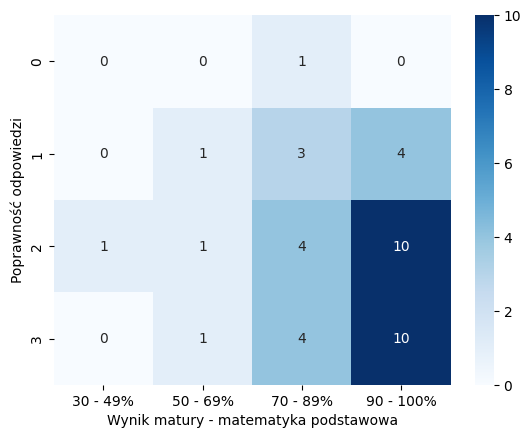

-------------------------------------
Zsumowane grafiki B:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 0         0         1          0
1                 0         0         2          4
2                 1         2         9          9
3                 0         1         0         11
Chi2 test conducted...
Chi-squared test statistic value: 11.646825396825399
P-value: 0.233959593925794
Brak podstaw do odrzucenia H0.


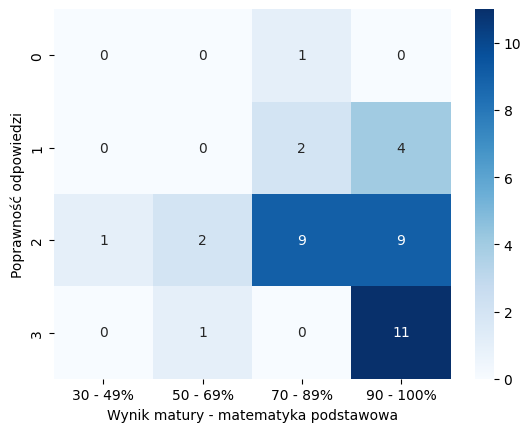

-------------------------------------
Zsumowane grafiki 1:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 0         0         1          1
1                 0         0         3          1
2                 1         3         8         22
Chi2 test conducted...
Chi-squared test statistic value: 5.122549019607843
P-value: 0.5281942456416433
Brak podstaw do odrzucenia H0.


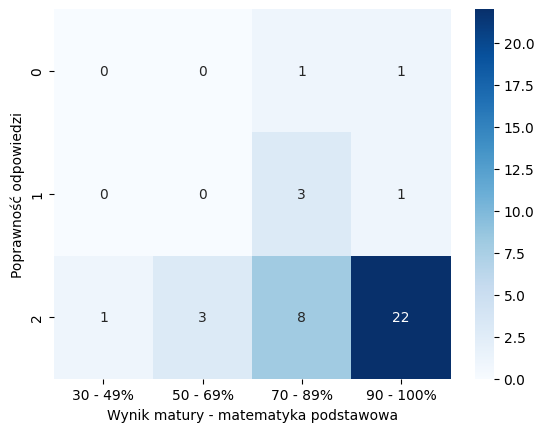

-------------------------------------
Zsumowane grafiki 2:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 0         0         3          5
1                 0         1         2          4
2                 1         2         7         15
Chi2 test conducted...
Chi-squared test statistic value: 1.8440476190476194
P-value: 0.9334680897762931
Brak podstaw do odrzucenia H0.


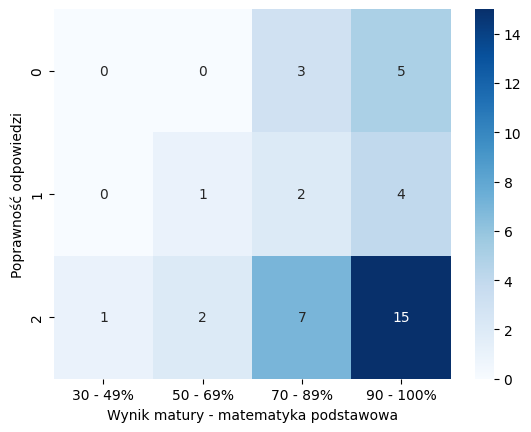

-------------------------------------
Zsumowane grafiki 3:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 1         2         5          4
1                 0         0         6         10
2                 0         1         1         10
Chi2 test conducted...
Chi-squared test statistic value: 10.13888888888889
P-value: 0.11892364658953647
Brak podstaw do odrzucenia H0.


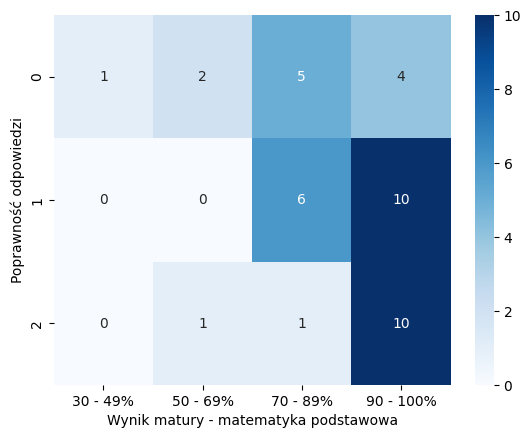

-------------------------------------
Kolekcja wszystkie grafiki:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 2         5        29         35
1                 4        13        43        109
Chi2 test conducted...
Chi-squared test statistic value: 5.94716226352196
P-value: 0.11420938524341873
Brak podstaw do odrzucenia H0.


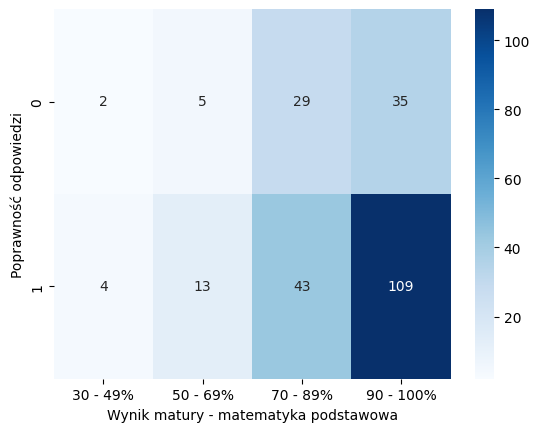

-------------------------------------
Kolekcja grafiki A:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 1         3        13         18
1                 2         6        23         54
Chi2 test conducted...
Chi-squared test statistic value: 1.5462184873949578
P-value: 0.6716449335054184
Brak podstaw do odrzucenia H0.


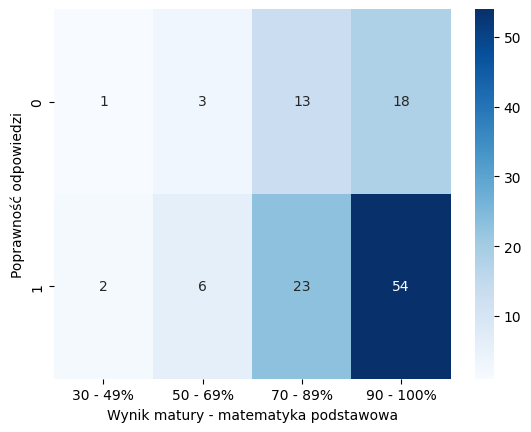

-------------------------------------
Kolekcja grafiki B:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 1         2        16         17
1                 2         7        20         55
Chi2 test conducted...
Chi-squared test statistic value: 5.251322751322752
P-value: 0.15429235305378078
Brak podstaw do odrzucenia H0.


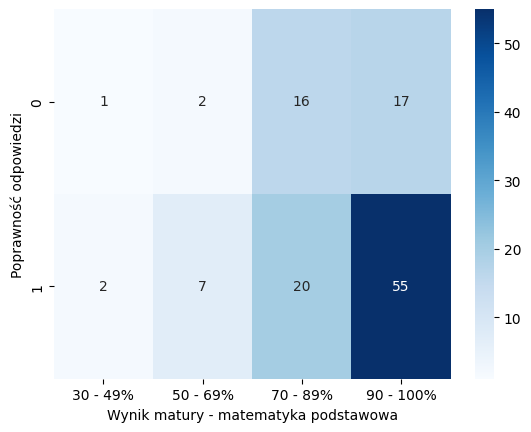

-------------------------------------
Kolekcja grafiki 1:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 0         0         5          3
1                 2         6        19         45
Chi2 test conducted...
Chi-squared test statistic value: 4.768518518518519
P-value: 0.18955355607391655
Brak podstaw do odrzucenia H0.


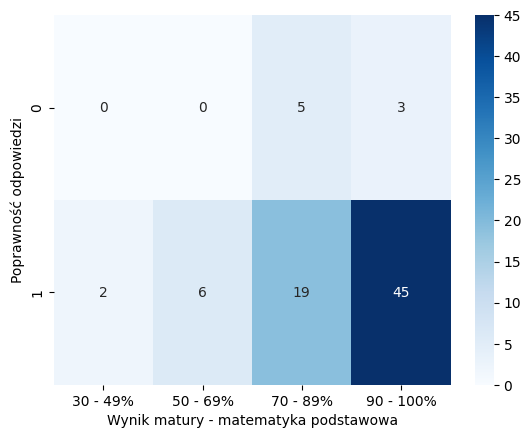

-------------------------------------
Kolekcja grafiki 2:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 0         1         8         14
1                 2         5        16         34
Chi2 test conducted...
Chi-squared test statistic value: 1.4848715992880752
P-value: 0.6857663332104385
Brak podstaw do odrzucenia H0.


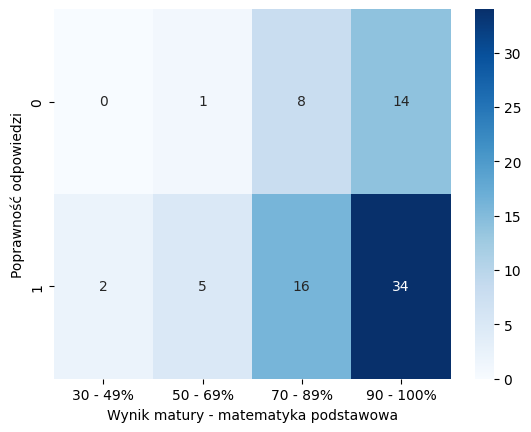

-------------------------------------
Kolekcja grafiki 3:
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
corr                                              
0                 2         4        16         18
1                 0         2         8         30
Chi2 test conducted...
Chi-squared test statistic value: 8.333333333333332
P-value: 0.03960235520756418
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


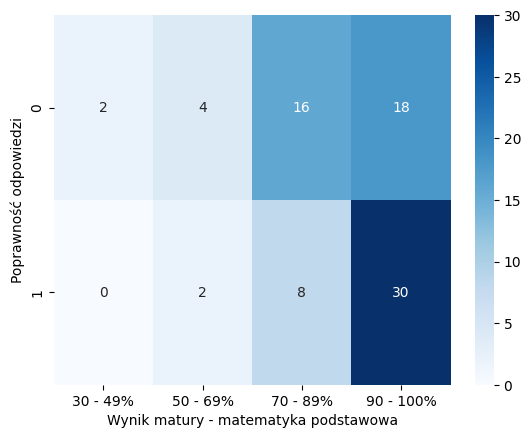

In [37]:
# matura - mat - podst
var = 'MAT_podst'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Wynik matury - matematyka podstawowa', cmap='Blues')

In [38]:
posthocNemenyi_test(df_coll3, 'corr', var, ALPHA)

+-----------+-------------+------------+------------+------------+
|           |   90 - 100% |   70 - 89% |   50 - 69% |   30 - 49% |
+===========+=============+============+============+============+
| 90 - 100% |    1        |   3.5e-05  |   1.9e-05  |   0.015649 |
+-----------+-------------+------------+------------+------------+
| 70 - 89%  |    3.5e-05  |   1        |   0.237743 |   0.511495 |
+-----------+-------------+------------+------------+------------+
| 50 - 69%  |    1.9e-05  |   0.237743 |   1        |   0.997247 |
+-----------+-------------+------------+------------+------------+
| 30 - 49%  |    0.015649 |   0.511495 |   0.997247 |   1        |
+-----------+-------------+------------+------------+------------+


-------------------------------------
Zsumowane wszystkie grafiki:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              0         0       1            0
2              0         0       3            0
3              0         1       6            1
4              0         1       5            2
5              1         3       9            0
6              0         0       7            0
Chi2 test conducted...
Chi-squared test statistic value: 11.0206782464847
P-value: 0.7511271503844899
Brak podstaw do odrzucenia H0.


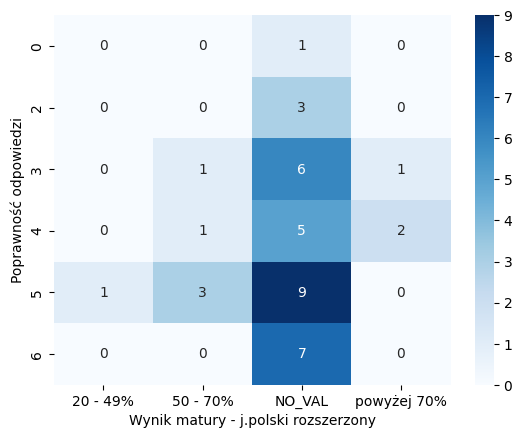

-------------------------------------
Zsumowane grafiki A:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              0         0       1            0
1              0         1       6            1
2              1         2      11            2
3              0         2      13            0
Chi2 test conducted...
Chi-squared test statistic value: 4.025806451612903
P-value: 0.9097058053721565
Brak podstaw do odrzucenia H0.


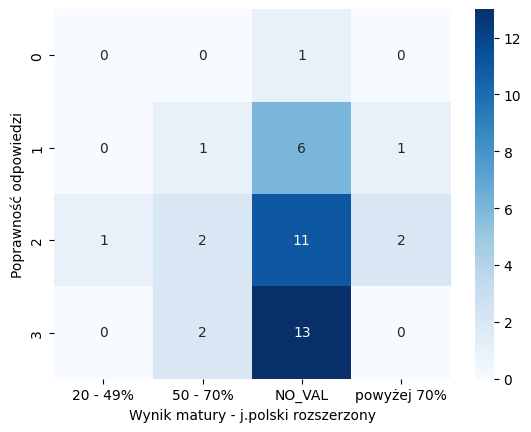

-------------------------------------
Zsumowane grafiki B:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              0         0       1            0
1              0         0       6            0
2              0         4      14            3
3              1         1      10            0
Chi2 test conducted...
Chi-squared test statistic value: 7.63748079877112
P-value: 0.5710510292124529
Brak podstaw do odrzucenia H0.


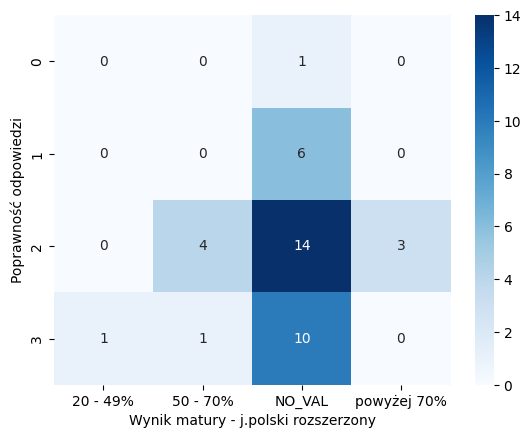

-------------------------------------
Zsumowane grafiki 1:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              0         0       2            0
1              0         0       3            1
2              1         5      26            2
Chi2 test conducted...
Chi-squared test statistic value: 3.0993042378241618
P-value: 0.7962839041007175
Brak podstaw do odrzucenia H0.


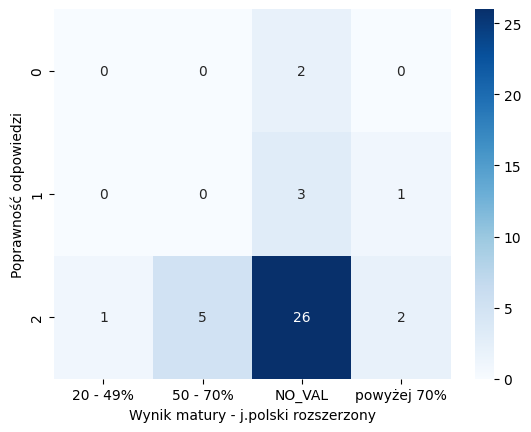

-------------------------------------
Zsumowane grafiki 2:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              0         1       6            1
1              1         2       4            0
2              0         2      21            2
Chi2 test conducted...
Chi-squared test statistic value: 7.882764976958526
P-value: 0.24681871407998313
Brak podstaw do odrzucenia H0.


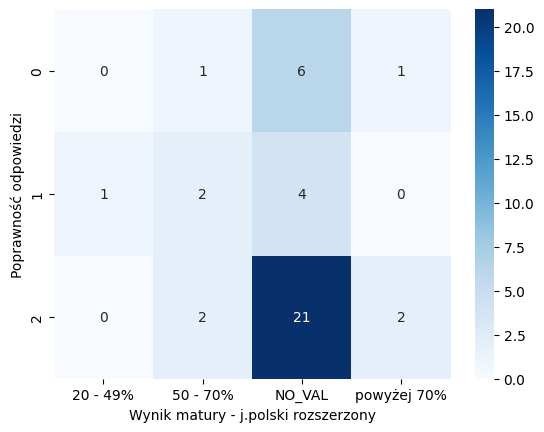

-------------------------------------
Zsumowane grafiki 3:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              0         0      10            2
1              0         4      12            0
2              1         1       9            1
Chi2 test conducted...
Chi-squared test statistic value: 8.630824372759855
P-value: 0.19542932096781873
Brak podstaw do odrzucenia H0.


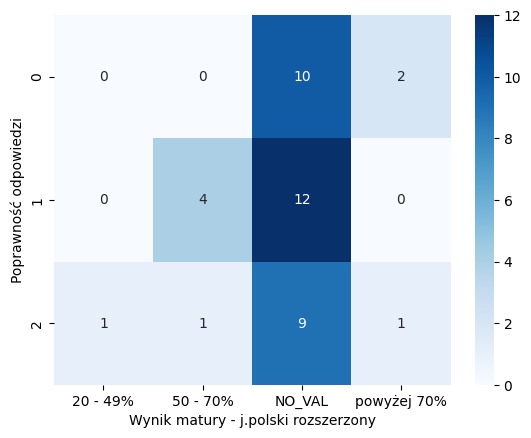

-------------------------------------
Kolekcja wszystkie grafiki:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              1         8      55            7
1              5        22     131           11
Chi2 test conducted...
Chi-squared test statistic value: 1.3512954036492288
P-value: 0.716989992033054
Brak podstaw do odrzucenia H0.


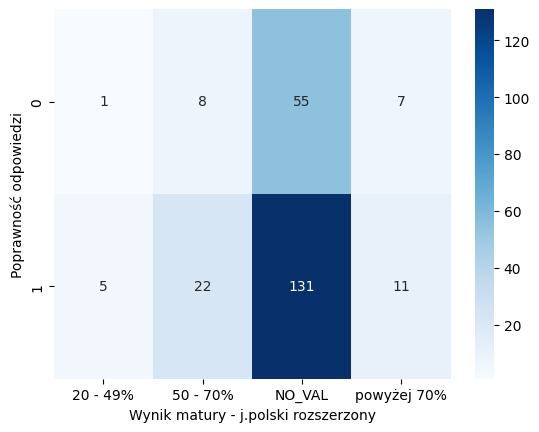

-------------------------------------
Kolekcja grafiki A:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              1         4      26            4
1              2        11      67            5
Chi2 test conducted...
Chi-squared test statistic value: 1.1532664678774736
P-value: 0.7642333487121203
Brak podstaw do odrzucenia H0.


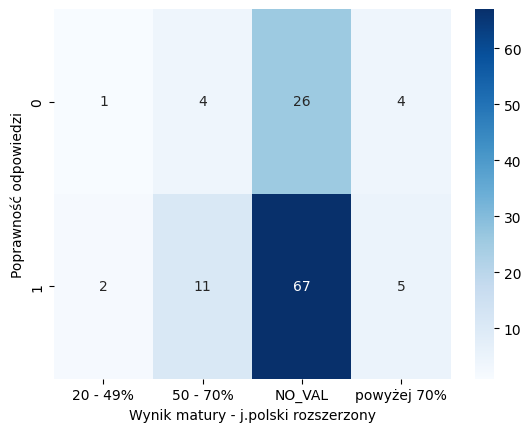

-------------------------------------
Kolekcja grafiki B:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              0         4      29            3
1              3        11      64            6
Chi2 test conducted...
Chi-squared test statistic value: 1.4746543778801842
P-value: 0.6881323189293154
Brak podstaw do odrzucenia H0.


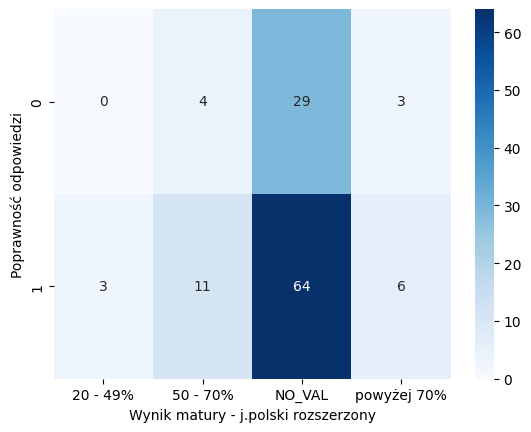

-------------------------------------
Kolekcja grafiki 1:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              0         0       7            1
1              2        10      55            5
Chi2 test conducted...
Chi-squared test statistic value: 1.7443249701314216
P-value: 0.6271247147520325
Brak podstaw do odrzucenia H0.


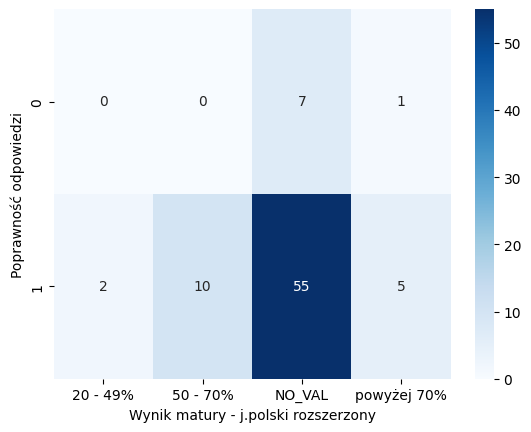

-------------------------------------
Kolekcja grafiki 2:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              1         4      16            2
1              1         6      46            4
Chi2 test conducted...
Chi-squared test statistic value: 1.3825119132567278
P-value: 0.7096391074960899
Brak podstaw do odrzucenia H0.


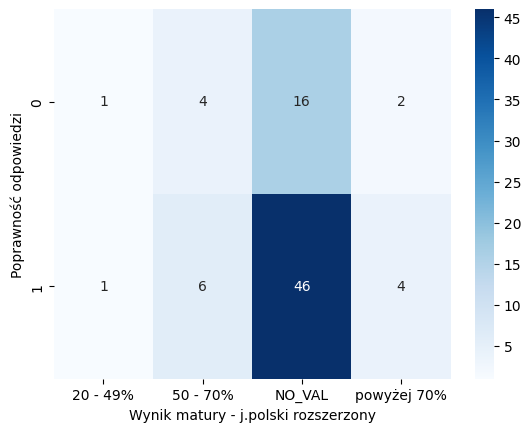

-------------------------------------
Kolekcja grafiki 3:
JP_roz  20 - 49%  50 - 70%  NO_VAL  powyżej 70%
corr                                           
0              0         4      32            4
1              2         6      30            2
Chi2 test conducted...
Chi-squared test statistic value: 3.1311827956989244
P-value: 0.371838258973317
Brak podstaw do odrzucenia H0.


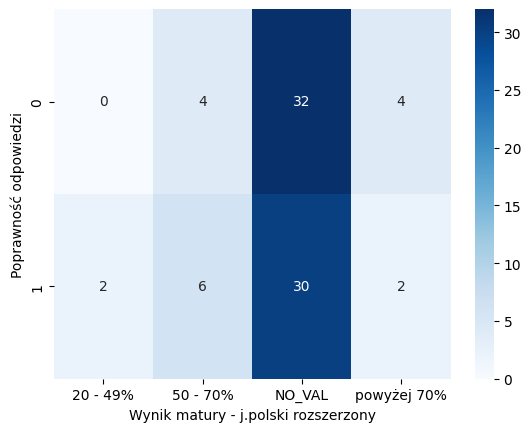

In [39]:
# matura - j.pol - roz
var = 'JP_roz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Wynik matury - j.polski rozszerzony', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               0         0       1            0            0
2               0         1       1            1            0
3               0         2       3            2            1
4               0         2       4            1            1
5               2         3       6            0            2
6               0         2       3            1            1
Chi2 test conducted...
Chi-squared test statistic value: 9.874440374440375
P-value: 0.9703919389516331
Brak podstaw do odrzucenia H0.


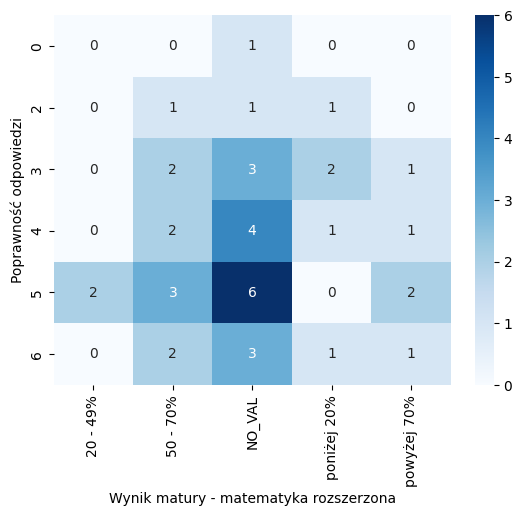

-------------------------------------
Zsumowane grafiki A:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               0         0       1            0            0
1               0         2       4            2            0
2               1         5       6            2            2
3               1         3       7            1            3
Chi2 test conducted...
Chi-squared test statistic value: 5.492592592592593
P-value: 0.9394745366304822
Brak podstaw do odrzucenia H0.


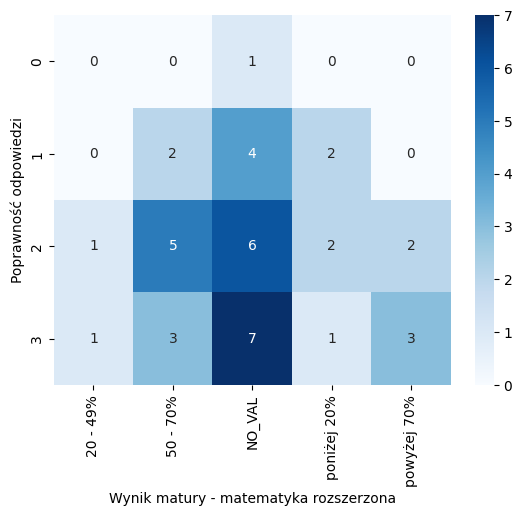

-------------------------------------
Zsumowane grafiki B:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               0         0       1            0            0
1               0         2       1            2            1
2               1         4      11            2            3
3               1         4       5            1            1
Chi2 test conducted...
Chi-squared test statistic value: 6.6455026455026465
P-value: 0.8801241464215249
Brak podstaw do odrzucenia H0.


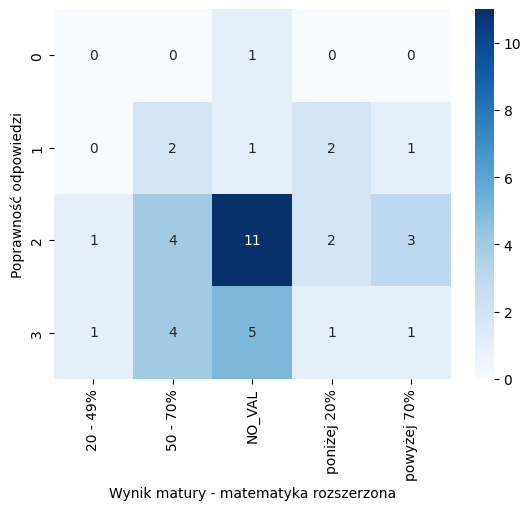

-------------------------------------
Zsumowane grafiki 1:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               0         0       1            0            1
1               0         0       4            0            0
2               2        10      13            5            4
Chi2 test conducted...
Chi-squared test statistic value: 8.810457516339872
P-value: 0.3585371299185699
Brak podstaw do odrzucenia H0.


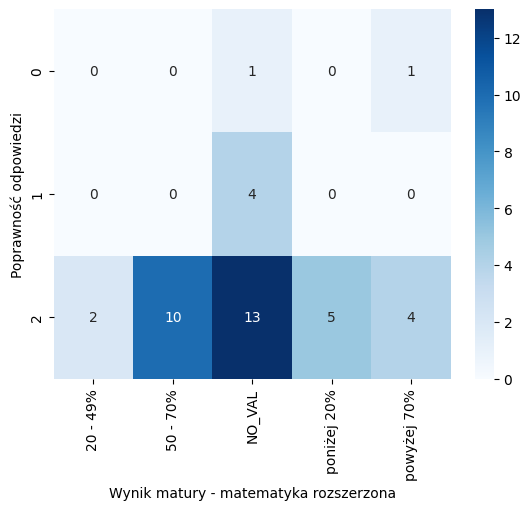

-------------------------------------
Zsumowane grafiki 2:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               0         3       3            2            0
1               1         2       1            1            2
2               1         5      14            2            3
Chi2 test conducted...
Chi-squared test statistic value: 8.556825396825397
P-value: 0.3810479521129356
Brak podstaw do odrzucenia H0.


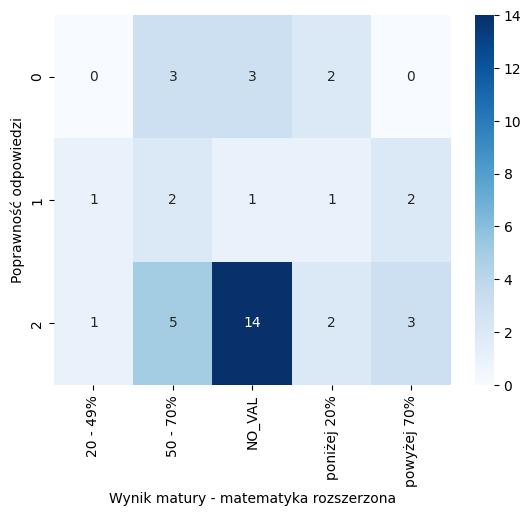

-------------------------------------
Zsumowane grafiki 3:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               0         3       6            3            0
1               1         3       8            1            3
2               1         4       4            1            2
Chi2 test conducted...
Chi-squared test statistic value: 6.351851851851852
P-value: 0.6078828795595923
Brak podstaw do odrzucenia H0.


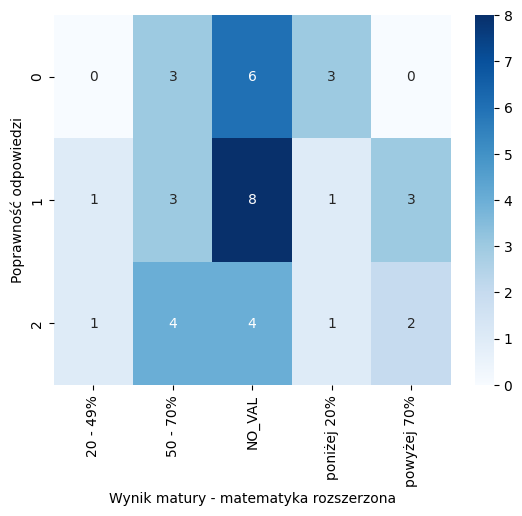

-------------------------------------
Kolekcja wszystkie grafiki:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               2        17      33           12            7
1              10        43      75           18           23
Chi2 test conducted...
Chi-squared test statistic value: 3.180265022085174
P-value: 0.5281243698392517
Brak podstaw do odrzucenia H0.


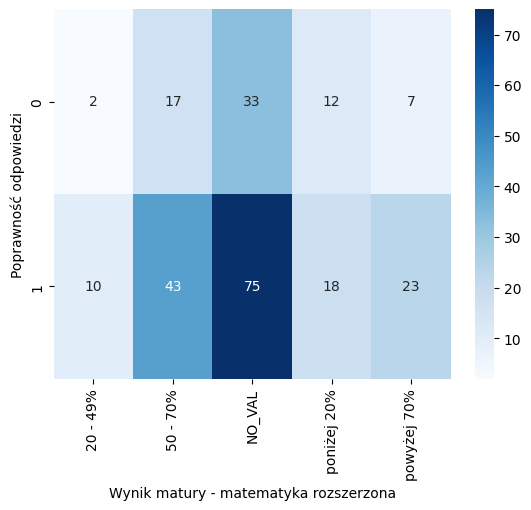

-------------------------------------
Kolekcja grafiki A:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               1         9      17            6            2
1               5        21      37            9           13
Chi2 test conducted...
Chi-squared test statistic value: 3.276190476190476
P-value: 0.5127134934813042
Brak podstaw do odrzucenia H0.


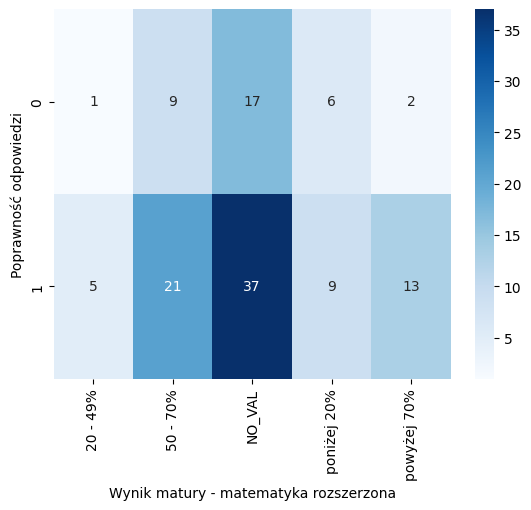

-------------------------------------
Kolekcja grafiki B:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               1         8      16            6            5
1               5        22      38            9           10
Chi2 test conducted...
Chi-squared test statistic value: 1.4638447971781303
P-value: 0.833026025703058
Brak podstaw do odrzucenia H0.


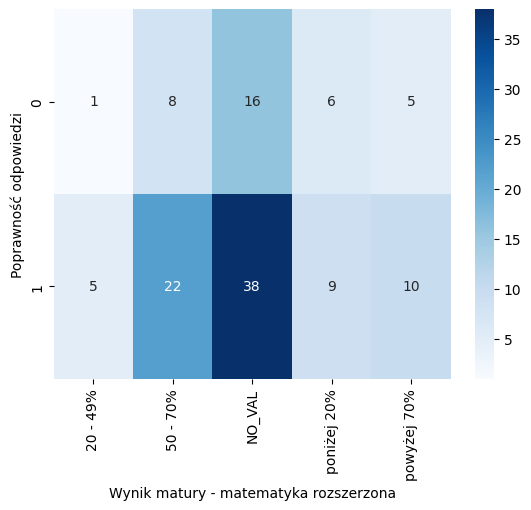

-------------------------------------
Kolekcja grafiki 1:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               0         0       6            0            2
1               4        20      30           10            8
Chi2 test conducted...
Chi-squared test statistic value: 6.666666666666666
P-value: 0.1545873045047604
Brak podstaw do odrzucenia H0.


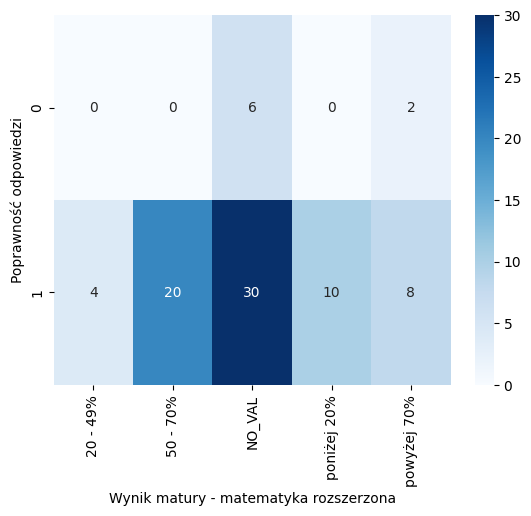

-------------------------------------
Kolekcja grafiki 2:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               1         8       7            5            2
1               3        12      29            5            8
Chi2 test conducted...
Chi-squared test statistic value: 5.363166370031359
P-value: 0.2520216425482256
Brak podstaw do odrzucenia H0.


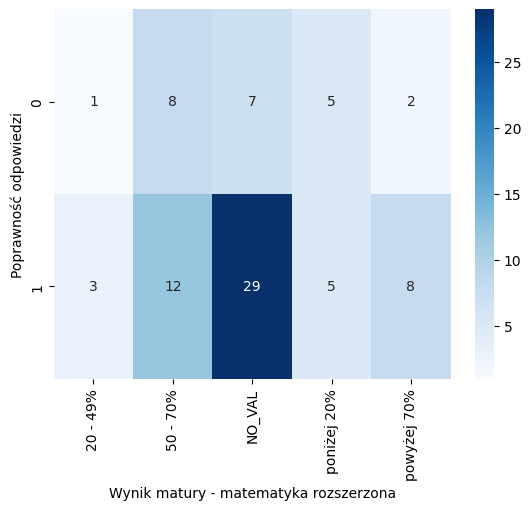

-------------------------------------
Kolekcja grafiki 3:
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
corr                                                         
0               1         9      20            7            3
1               3        11      16            3            7
Chi2 test conducted...
Chi-squared test statistic value: 4.844444444444444
P-value: 0.3036340427189643
Brak podstaw do odrzucenia H0.


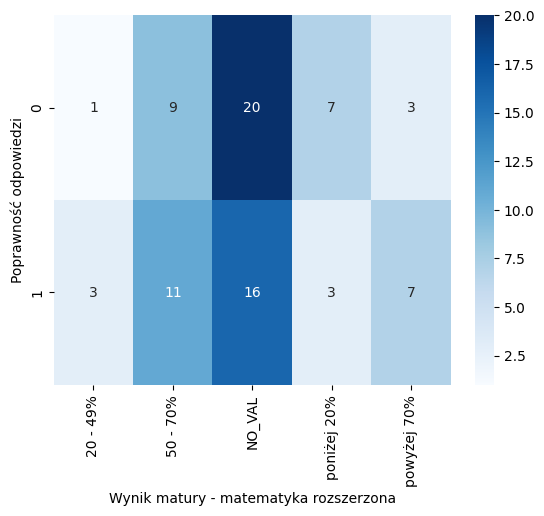

In [40]:
# matura - mat - roz
var = 'MAT_roz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Wynik matury - matematyka rozszerzona', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                0       1            0
2                0       3            0
3                0       8            0
4                1       7            0
5                0      11            2
6                0       6            1
Chi2 test conducted...
Chi-squared test statistic value: 7.202380952380952
P-value: 0.7062107889594078
Brak podstaw do odrzucenia H0.


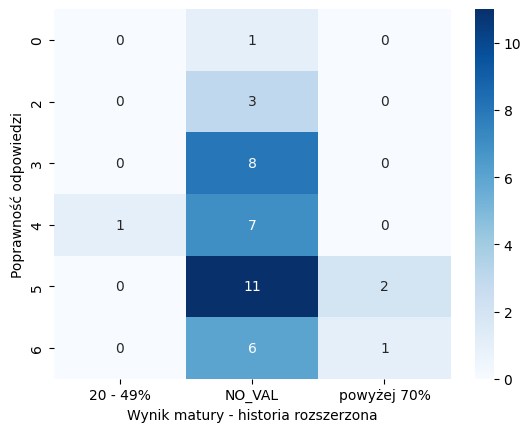

-------------------------------------
Zsumowane grafiki A:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                0       1            0
1                0       8            0
2                1      15            0
3                0      12            3
Chi2 test conducted...
Chi-squared test statistic value: 6.791666666666666
P-value: 0.34054431725484147
Brak podstaw do odrzucenia H0.


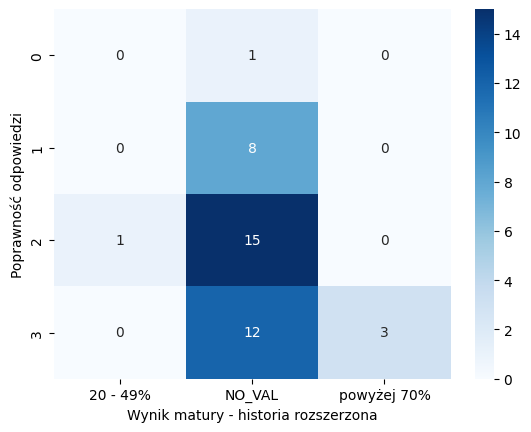

-------------------------------------
Zsumowane grafiki B:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                0       1            0
1                0       6            0
2                1      18            2
3                0      11            1
Chi2 test conducted...
Chi-squared test statistic value: 1.6798941798941798
P-value: 0.9466628940773141
Brak podstaw do odrzucenia H0.


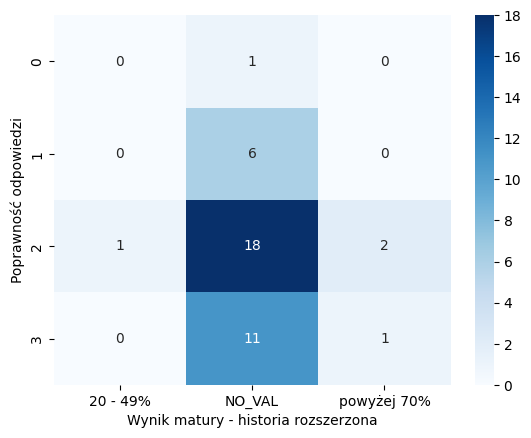

-------------------------------------
Zsumowane grafiki 1:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                0       2            0
1                0       4            0
2                1      30            3
Chi2 test conducted...
Chi-squared test statistic value: 0.7843137254901961
P-value: 0.9405385724010301
Brak podstaw do odrzucenia H0.


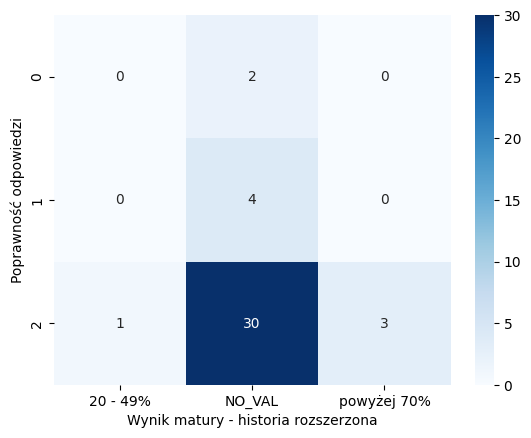

-------------------------------------
Zsumowane grafiki 2:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                0       8            0
1                1       5            1
2                0      23            2
Chi2 test conducted...
Chi-squared test statistic value: 6.12063492063492
P-value: 0.19031849941325618
Brak podstaw do odrzucenia H0.


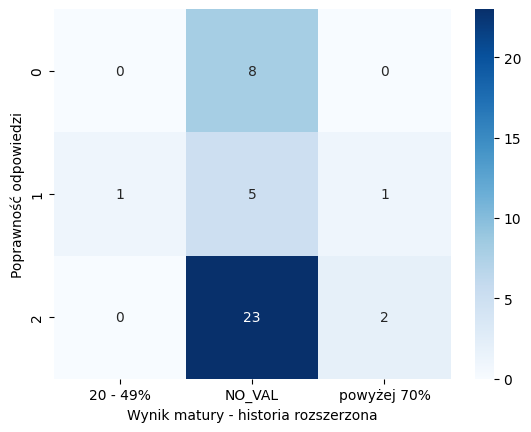

-------------------------------------
Zsumowane grafiki 3:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                0      12            0
1                1      14            1
2                0      10            2
Chi2 test conducted...
Chi-squared test statistic value: 3.9814814814814814
P-value: 0.40851786002666624
Brak podstaw do odrzucenia H0.


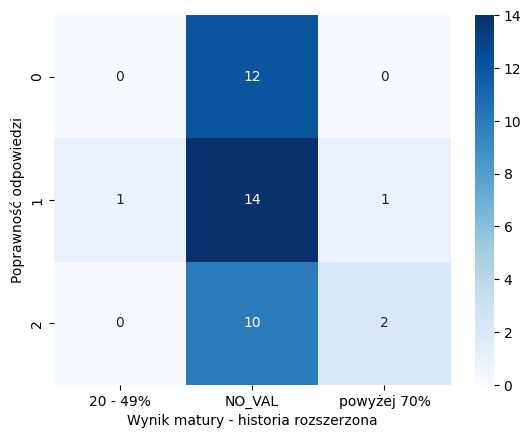

-------------------------------------
Kolekcja wszystkie grafiki:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                2      67            2
1                4     149           16
Chi2 test conducted...
Chi-squared test statistic value: 3.2024890963135806
P-value: 0.20164540434924752
Brak podstaw do odrzucenia H0.


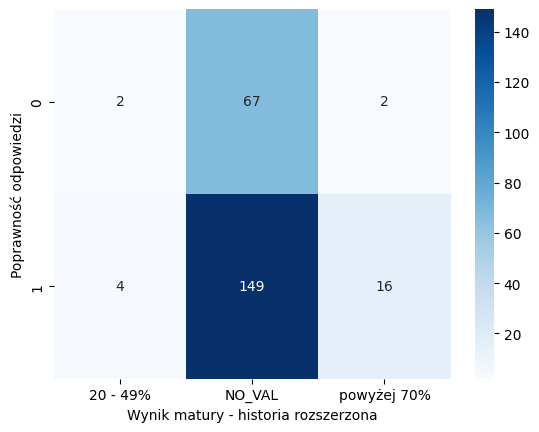

-------------------------------------
Kolekcja grafiki A:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                1      34            0
1                2      74            9
Chi2 test conducted...
Chi-squared test statistic value: 4.011204481792717
P-value: 0.13457922217366794
Brak podstaw do odrzucenia H0.


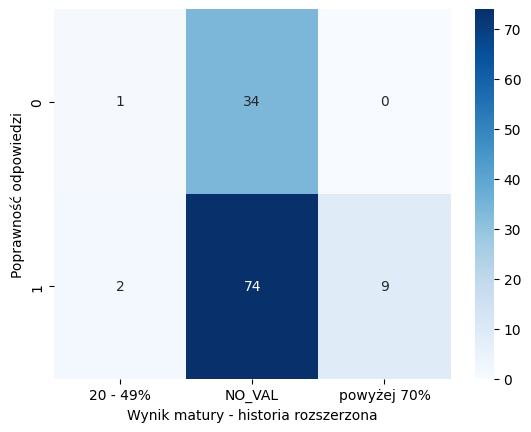

-------------------------------------
Kolekcja grafiki B:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                1      33            2
1                2      75            7
Chi2 test conducted...
Chi-squared test statistic value: 0.2910052910052911
P-value: 0.8645876028021375
Brak podstaw do odrzucenia H0.


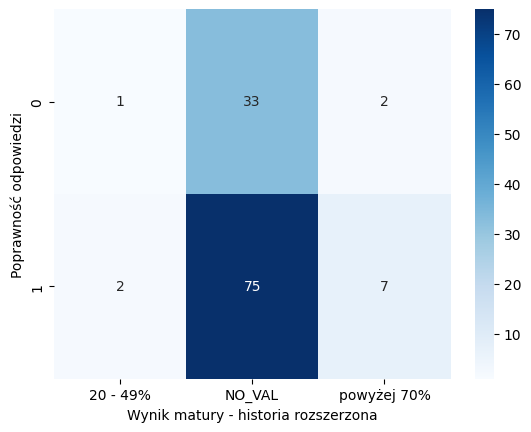

-------------------------------------
Kolekcja grafiki 1:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                0       8            0
1                2      64            6
Chi2 test conducted...
Chi-squared test statistic value: 0.9876543209876542
P-value: 0.6102862555505469
Brak podstaw do odrzucenia H0.


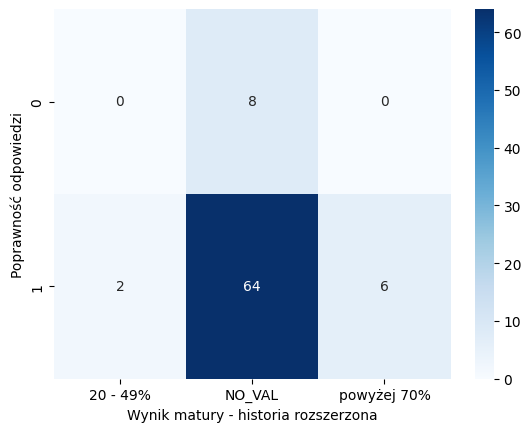

-------------------------------------
Kolekcja grafiki 2:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                1      21            1
1                1      51            5
Chi2 test conducted...
Chi-squared test statistic value: 0.8746503941011949
P-value: 0.645761397559405
Brak podstaw do odrzucenia H0.


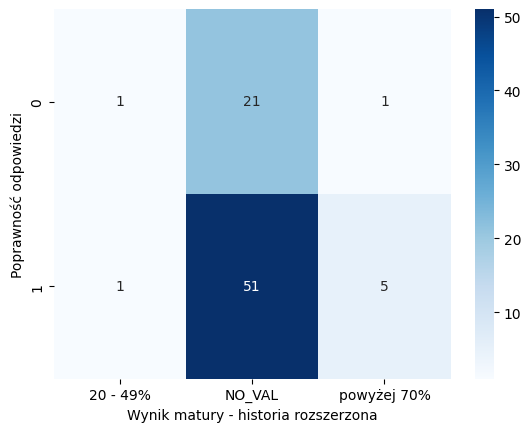

-------------------------------------
Kolekcja grafiki 3:
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
corr                                   
0                1      38            1
1                1      34            5
Chi2 test conducted...
Chi-squared test statistic value: 2.888888888888889
P-value: 0.23587708298570023
Brak podstaw do odrzucenia H0.


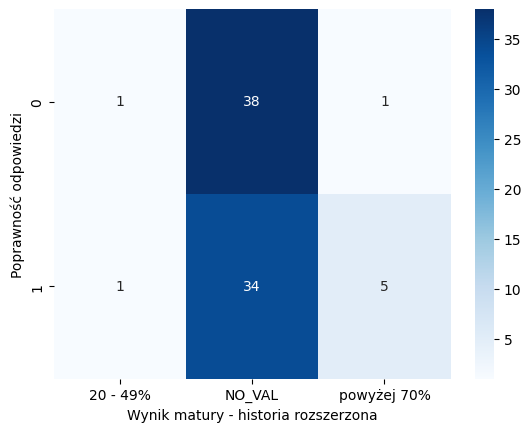

In [41]:
# matura - hist - roz
var = 'HIST_roz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Wynik matury - historia rozszerzona', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Samopocz  2  3  4  5
corr                
0         1  0  0  0
2         1  1  0  1
3         1  3  2  2
4         0  0  3  5
5         2  2  8  1
6         0  0  7  0
Chi2 test conducted...
Chi-squared test statistic value: 30.932336182336183
P-value: 0.008969827796645308
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


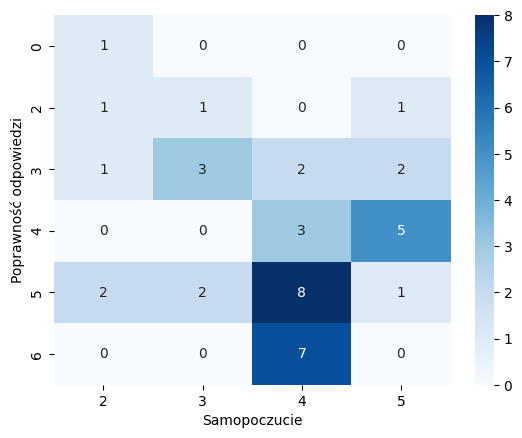

-------------------------------------
Zsumowane grafiki A:
Samopocz  2  3   4  5
corr                 
0         1  0   0  0
1         2  4   0  2
2         2  1   7  6
3         0  1  13  1
Chi2 test conducted...
Chi-squared test statistic value: 29.371296296296297
P-value: 0.0005608843981853312
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


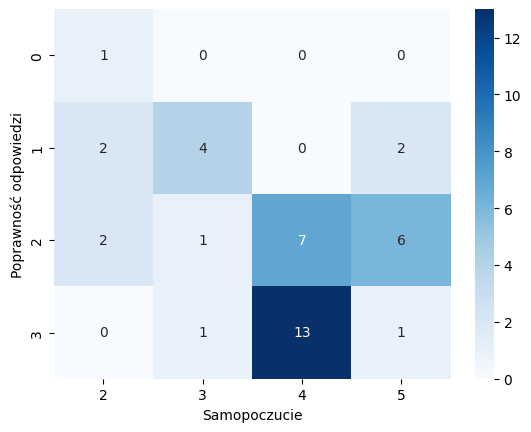

-------------------------------------
Zsumowane grafiki B:
Samopocz  2  3  4  5
corr                
0         1  0  0  0
1         1  1  2  2
2         1  4  9  7
3         2  1  9  0
Chi2 test conducted...
Chi-squared test statistic value: 15.00793650793651
P-value: 0.09071820487380047
Brak podstaw do odrzucenia H0.


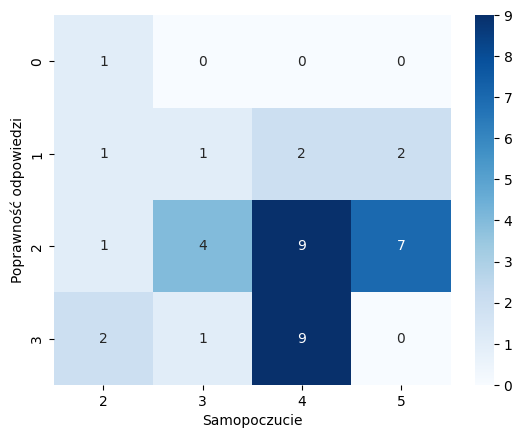

-------------------------------------
Zsumowane grafiki 1:
Samopocz  2  3   4  5
corr                 
0         1  0   1  0
1         1  1   1  1
2         3  5  18  8
Chi2 test conducted...
Chi-squared test statistic value: 4.722222222222222
P-value: 0.5799012551230582
Brak podstaw do odrzucenia H0.


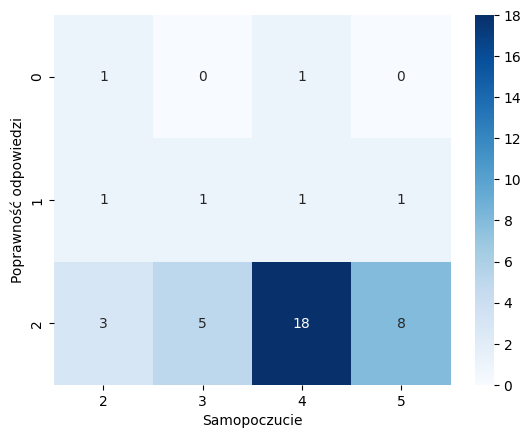

-------------------------------------
Zsumowane grafiki 2:
Samopocz  2  3   4  5
corr                 
0         2  2   2  2
1         0  2   4  1
2         3  2  14  6
Chi2 test conducted...
Chi-squared test statistic value: 5.598095238095238
P-value: 0.46968073858217785
Brak podstaw do odrzucenia H0.


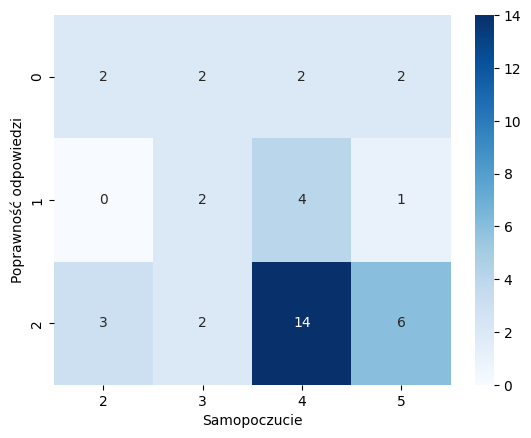

-------------------------------------
Zsumowane grafiki 3:
Samopocz  2  3   4  5
corr                 
0         3  3   0  6
1         2  2   9  3
2         0  1  11  0
Chi2 test conducted...
Chi-squared test statistic value: 21.34722222222222
P-value: 0.0015887857760093892
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


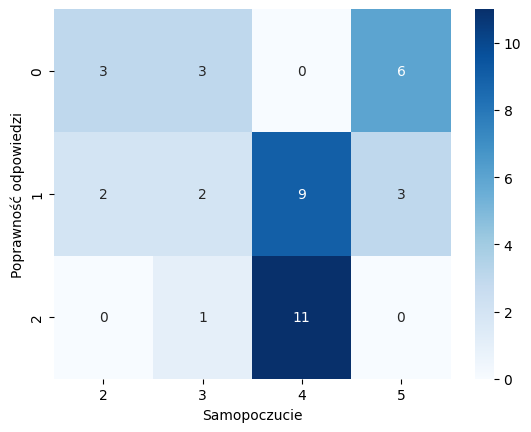

-------------------------------------
Kolekcja wszystkie grafiki:
Samopocz   2   3    4   5
corr                     
0         15  15   20  21
1         15  21  100  33
Chi2 test conducted...
Chi-squared test statistic value: 20.381698474872906
P-value: 0.00014146678465834666
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


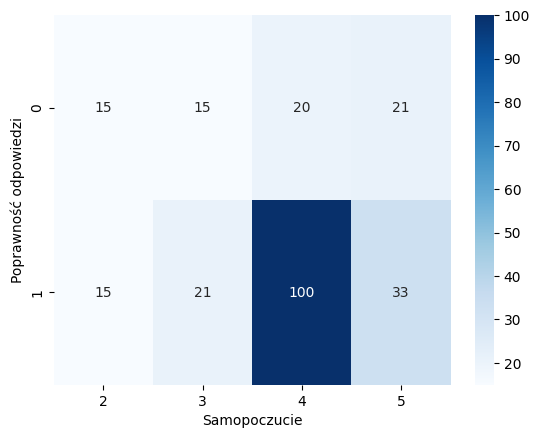

-------------------------------------
Kolekcja grafiki A:
Samopocz  2  3   4   5
corr                  
0         9  9   7  10
1         6  9  53  17
Chi2 test conducted...
Chi-squared test statistic value: 20.38767507002801
P-value: 0.00014106356882215802
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


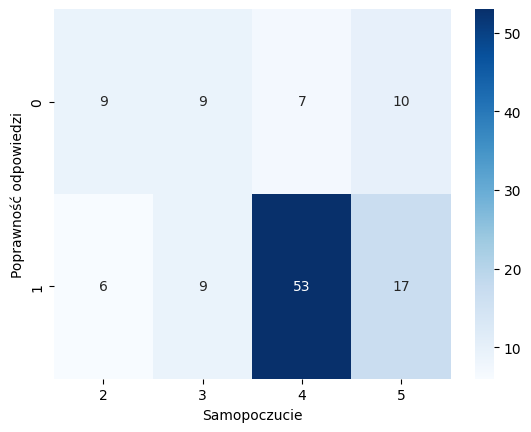

-------------------------------------
Kolekcja grafiki B:
Samopocz  2   3   4   5
corr                   
0         6   6  13  11
1         9  12  47  16
Chi2 test conducted...
Chi-squared test statistic value: 4.27689594356261
P-value: 0.23307502155553267
Brak podstaw do odrzucenia H0.


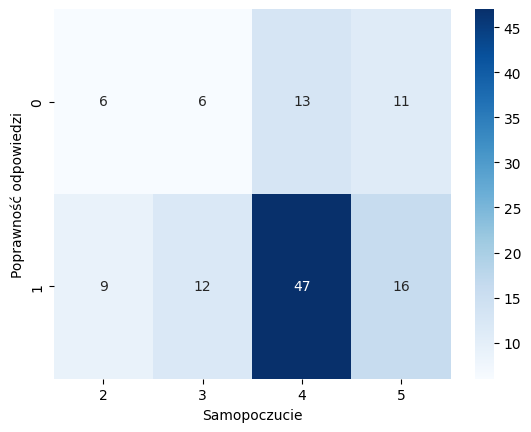

-------------------------------------
Kolekcja grafiki 1:
Samopocz  2   3   4   5
corr                   
0         3   1   3   1
1         7  11  37  17
Chi2 test conducted...
Chi-squared test statistic value: 5.154320987654321
P-value: 0.16083954979338044
Brak podstaw do odrzucenia H0.


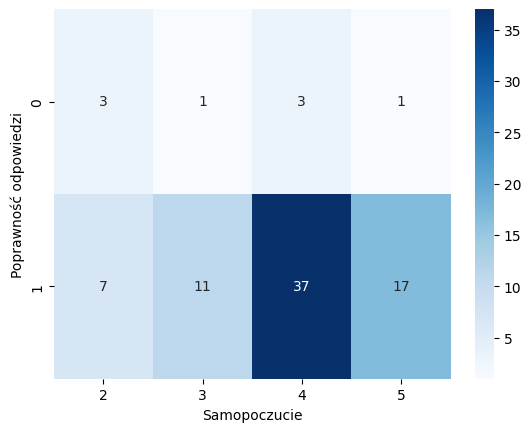

-------------------------------------
Kolekcja grafiki 2:
Samopocz  2  3   4   5
corr                  
0         4  6   8   5
1         6  6  32  13
Chi2 test conducted...
Chi-squared test statistic value: 4.766505636070853
P-value: 0.18971522341501712
Brak podstaw do odrzucenia H0.


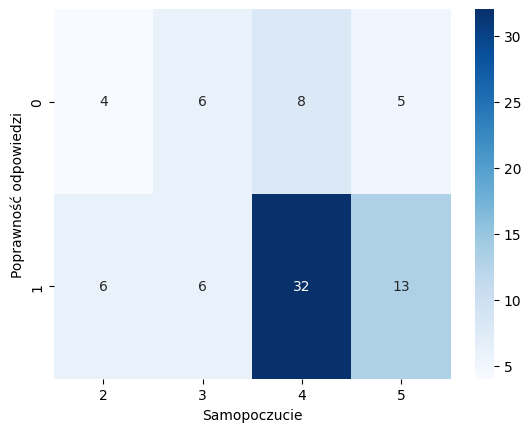

-------------------------------------
Kolekcja grafiki 3:
Samopocz  2  3   4   5
corr                  
0         8  8   9  15
1         2  4  31   3
Chi2 test conducted...
Chi-squared test statistic value: 25.033333333333335
P-value: 1.519468350417216e-05
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


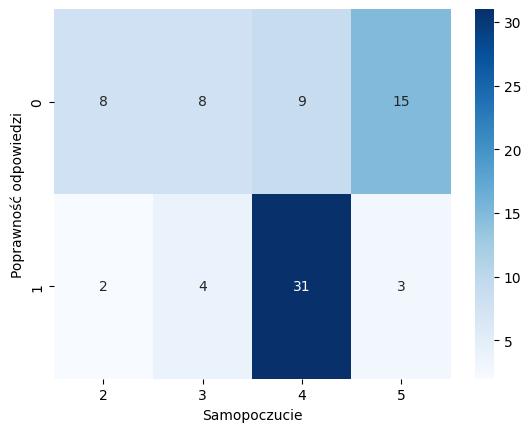

In [42]:
# samopoczucie
var = 'Samopocz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Samopoczucie', cmap='Blues')

In [43]:
posthocNemenyi_test(df_wynik, 'corr', var, ALPHA)
print('-----------------------')
posthocNemenyi_test(df_sumA, 'corr', var, ALPHA)
print('-----------------------')
posthocNemenyi_test(df_sum3, 'corr', var, ALPHA)
print('-----------------------')
posthocNemenyi_test(df_collAll, 'corr', var, ALPHA)
print('-----------------------')
posthocNemenyi_test(df_collA, 'corr', var, ALPHA)
print('-----------------------')
posthocNemenyi_test(df_coll3, 'corr', var, ALPHA)

+----+----------+----------+----------+----------+
|    |        4 |        3 |        5 |        2 |
+====+==========+==========+==========+==========+
|  4 | 1        | 0.040061 | 0.171195 | 0.035024 |
+----+----------+----------+----------+----------+
|  3 | 0.040061 | 1        | 0.871388 | 0.997684 |
+----+----------+----------+----------+----------+
|  5 | 0.171195 | 0.871388 | 1        | 0.791869 |
+----+----------+----------+----------+----------+
|  2 | 0.035024 | 0.997684 | 0.791869 | 1        |
+----+----------+----------+----------+----------+
-----------------------
+----+----------+----------+----------+----------+
|    |        4 |        3 |        5 |        2 |
+====+==========+==========+==========+==========+
|  4 | 1        | 0.050952 | 0.373541 | 0.033375 |
+----+----------+----------+----------+----------+
|  3 | 0.050952 | 1        | 0.741535 | 0.993407 |
+----+----------+----------+----------+----------+
|  5 | 0.373541 | 0.741535 | 1        | 0.595503 |
+----+-

-------------------------------------
Zsumowane wszystkie grafiki:
Stres  1  2  3  4  5
corr                
0      0  0  0  0  1
2      1  0  1  1  0
3      2  2  2  1  1
4      1  5  2  0  0
5      3  5  2  3  0
6      2  3  2  0  0
Chi2 test conducted...
Chi-squared test statistic value: 29.637566137566136
P-value: 0.07594310735779068
Brak podstaw do odrzucenia H0.


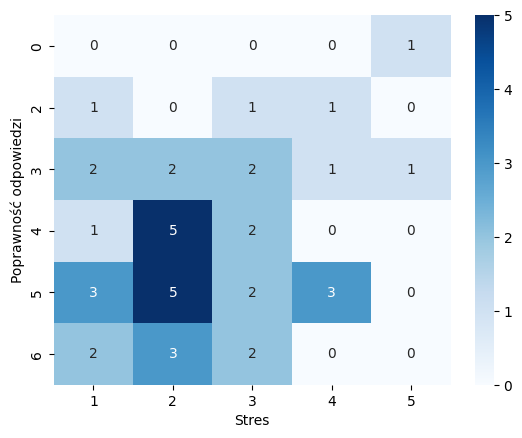

-------------------------------------
Zsumowane grafiki A:
Stres  1  2  3  4  5
corr                
0      0  0  0  0  1
1      2  1  2  2  1
2      3  8  4  1  0
3      4  6  3  2  0
Chi2 test conducted...
Chi-squared test statistic value: 25.329629629629625
P-value: 0.013335821176837494
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


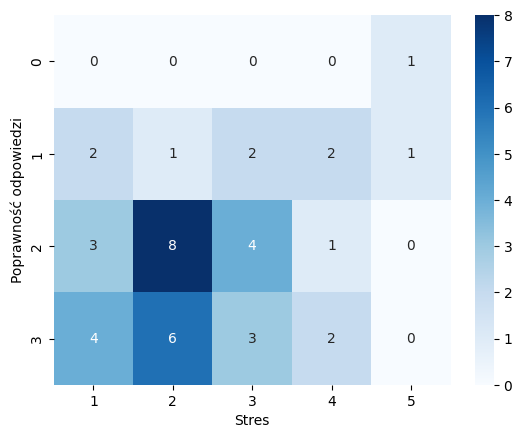

-------------------------------------
Zsumowane grafiki B:
Stres  1  2  3  4  5
corr                
0      0  0  0  0  1
1      2  1  2  1  0
2      4  9  4  3  1
3      3  5  3  1  0
Chi2 test conducted...
Chi-squared test statistic value: 22.031746031746035
P-value: 0.03716555348735658
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


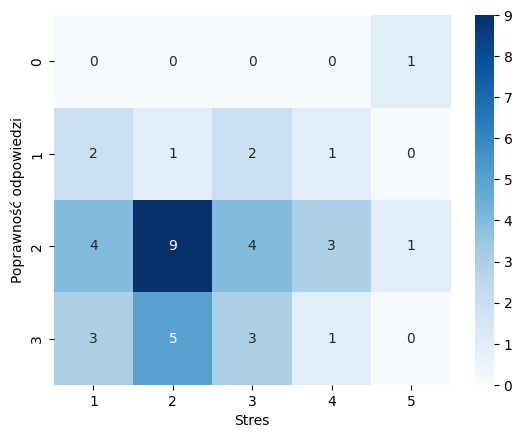

-------------------------------------
Zsumowane grafiki 1:
Stres  1   2  3  4  5
corr                 
0      0   0  1  0  1
1      1   1  0  1  1
2      8  14  8  4  0
Chi2 test conducted...
Chi-squared test statistic value: 16.869281045751638
P-value: 0.03149939660221538
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


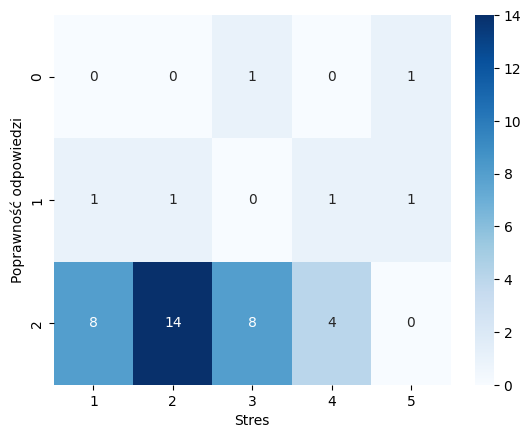

-------------------------------------
Zsumowane grafiki 2:
Stres  1   2  3  4  5
corr                 
0      2   2  2  1  1
1      1   2  3  1  0
2      6  11  4  3  1
Chi2 test conducted...
Chi-squared test statistic value: 4.124761904761904
P-value: 0.8456951321936272
Brak podstaw do odrzucenia H0.


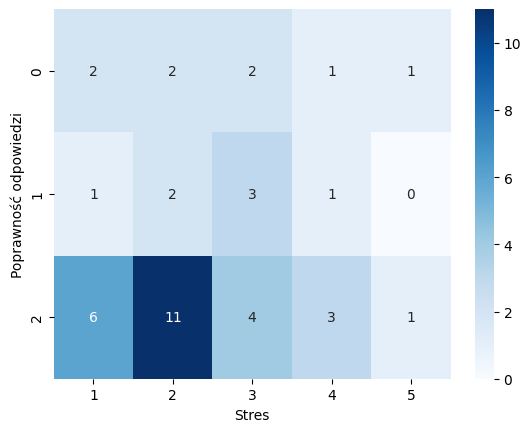

-------------------------------------
Zsumowane grafiki 3:
Stres  1  2  3  4  5
corr                
0      2  4  2  2  2
1      5  6  3  2  0
2      2  5  4  1  0
Chi2 test conducted...
Chi-squared test statistic value: 6.925925925925926
P-value: 0.5446454510290569
Brak podstaw do odrzucenia H0.


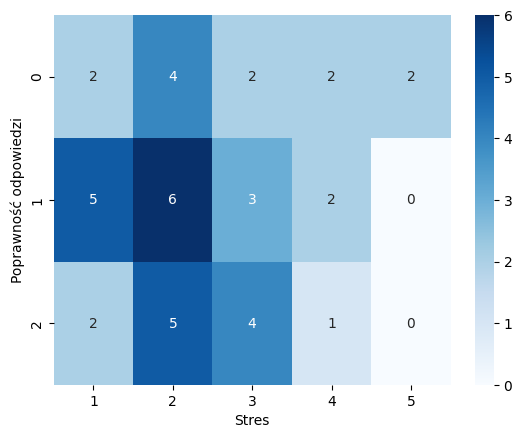

-------------------------------------
Kolekcja wszystkie grafiki:
Stres   1   2   3   4  5
corr                    
0      15  21  16  10  9
1      39  69  38  20  3
Chi2 test conducted...
Chi-squared test statistic value: 13.85671028141234
P-value: 0.0077667028450246435
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


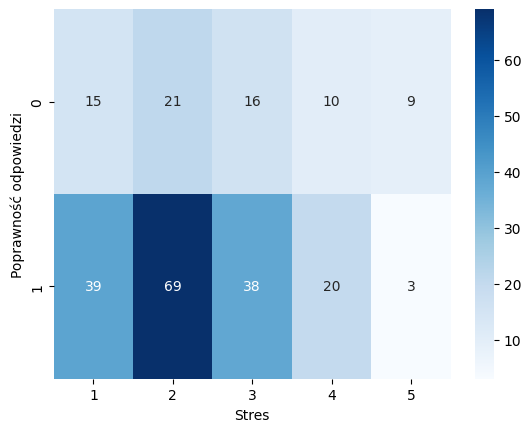

-------------------------------------
Kolekcja grafiki A:
Stres   1   2   3   4  5
corr                    
0       7  10   8   5  5
1      20  35  19  10  1
Chi2 test conducted...
Chi-squared test statistic value: 9.837535014005603
P-value: 0.04325513729952155
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


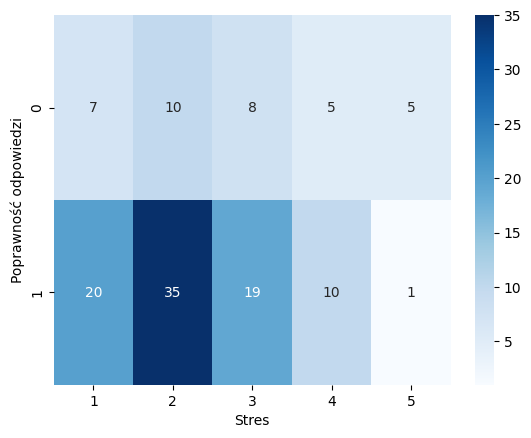

-------------------------------------
Kolekcja grafiki B:
Stres   1   2   3   4  5
corr                    
0       8  11   8   5  4
1      19  34  19  10  2
Chi2 test conducted...
Chi-squared test statistic value: 4.585537918871252
P-value: 0.3325250379481281
Brak podstaw do odrzucenia H0.


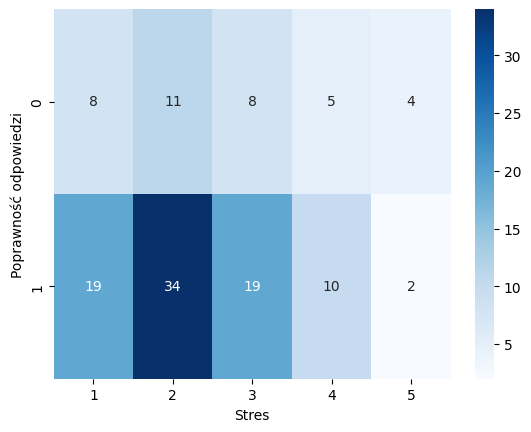

-------------------------------------
Kolekcja grafiki 1:
Stres   1   2   3  4  5
corr                   
0       1   1   2  1  3
1      17  29  16  9  1
Chi2 test conducted...
Chi-squared test statistic value: 20.679012345679013
P-value: 0.0003666094582927282
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


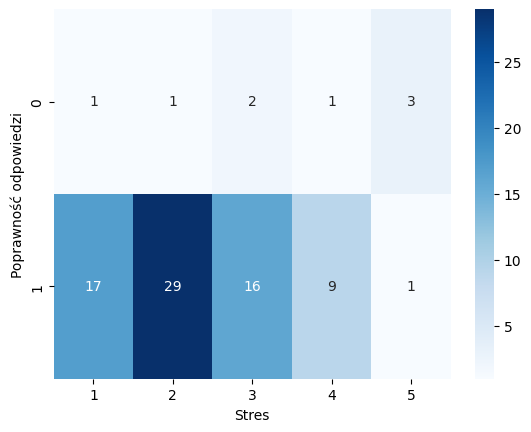

-------------------------------------
Kolekcja grafiki 2:
Stres   1   2   3  4  5
corr                   
0       5   6   7  3  2
1      13  24  11  7  2
Chi2 test conducted...
Chi-squared test statistic value: 2.922281549283838
P-value: 0.5709145086682705
Brak podstaw do odrzucenia H0.


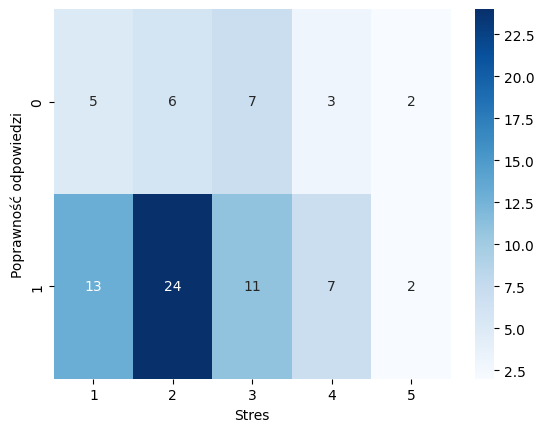

-------------------------------------
Kolekcja grafiki 3:
Stres  1   2   3  4  5
corr                  
0      9  14   7  6  4
1      9  16  11  4  0
Chi2 test conducted...
Chi-squared test statistic value: 5.4222222222222225
P-value: 0.2466512734172094
Brak podstaw do odrzucenia H0.


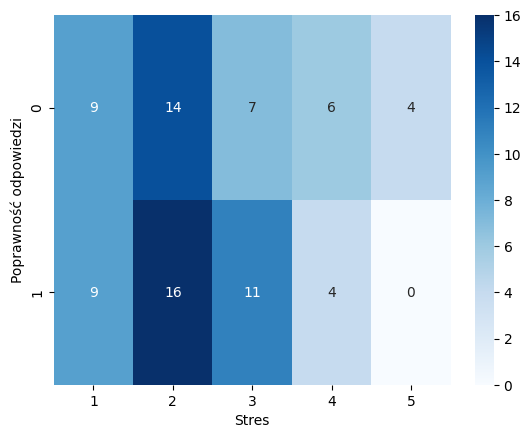

In [65]:
# stres
var = 'Stres'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', var, cmap='Blues')

In [66]:
posthocNemenyi_test(df_sumA, 'corr', var, ALPHA)
posthocNemenyi_test(df_sumB, 'corr', var, ALPHA)
posthocNemenyi_test(df_sum1, 'corr', var, ALPHA)
posthocNemenyi_test(df_collAll, 'corr', var, ALPHA)
posthocNemenyi_test(df_collA, 'corr', var, ALPHA)
posthocNemenyi_test(df_coll1, 'corr', var, ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        2 |        1 |        3 |        4 |        5 |
+====+==========+==========+==========+==========+==========+
|  2 | 1        | 0.458294 | 0.602397 | 0.094181 | 0.158715 |
+----+----------+----------+----------+----------+----------+
|  1 | 0.458294 | 1        | 0.999691 | 0.850892 | 0.719152 |
+----+----------+----------+----------+----------+----------+
|  3 | 0.602397 | 0.999691 | 1        | 0.765367 | 0.644796 |
+----+----------+----------+----------+----------+----------+
|  4 | 0.094181 | 0.850892 | 0.765367 | 1        | 0.987909 |
+----+----------+----------+----------+----------+----------+
|  5 | 0.158715 | 0.719152 | 0.644796 | 0.987909 | 1        |
+----+----------+----------+----------+----------+----------+
+----+----------+----------+----------+----------+----------+
|    |        2 |        1 |        3 |        4 |        5 |
+====+==========+==========+==========+==========+==========+
|  2 | 1

-------------------------------------
Zsumowane wszystkie grafiki:
Zmęcz  1  2  3  4  5
corr                
0      0  0  0  1  0
2      2  0  0  1  0
3      0  2  3  1  2
4      1  4  2  1  0
5      3  3  4  2  1
6      0  3  1  3  0
Chi2 test conducted...
Chi-squared test statistic value: 23.070004070004074
P-value: 0.28537027733583586
Brak podstaw do odrzucenia H0.


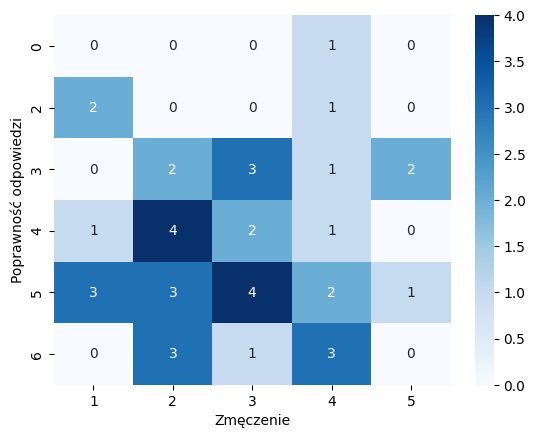

-------------------------------------
Zsumowane grafiki A:
Zmęcz  1  2  3  4  5
corr                
0      0  0  0  1  0
1      2  1  1  2  2
2      2  6  7  1  0
3      2  5  2  5  1
Chi2 test conducted...
Chi-squared test statistic value: 15.974074074074075
P-value: 0.19242640519976809
Brak podstaw do odrzucenia H0.


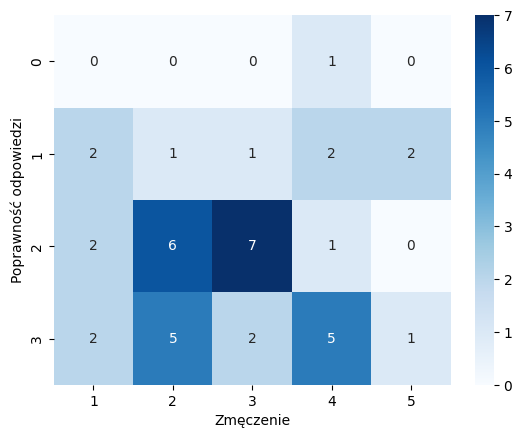

-------------------------------------
Zsumowane grafiki B:
Zmęcz  1  2  3  4  5
corr                
0      0  0  0  1  0
1      2  1  2  1  0
2      3  7  4  4  3
3      1  4  4  3  0
Chi2 test conducted...
Chi-squared test statistic value: 9.301587301587304
P-value: 0.6769778081553945
Brak podstaw do odrzucenia H0.


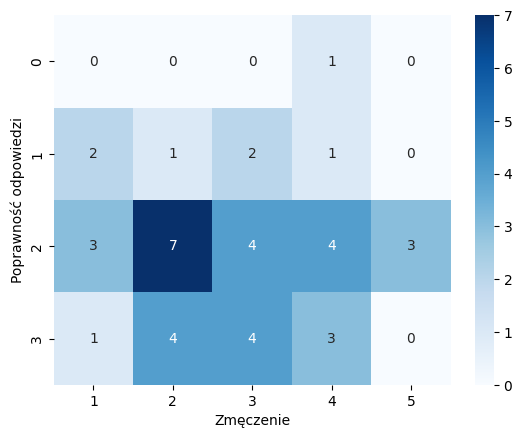

-------------------------------------
Zsumowane grafiki 1:
Zmęcz  1   2  3  4  5
corr                 
0      0   0  1  1  0
1      1   1  1  0  1
2      5  11  8  8  2
Chi2 test conducted...
Chi-squared test statistic value: 5.284313725490195
P-value: 0.7268008820440437
Brak podstaw do odrzucenia H0.


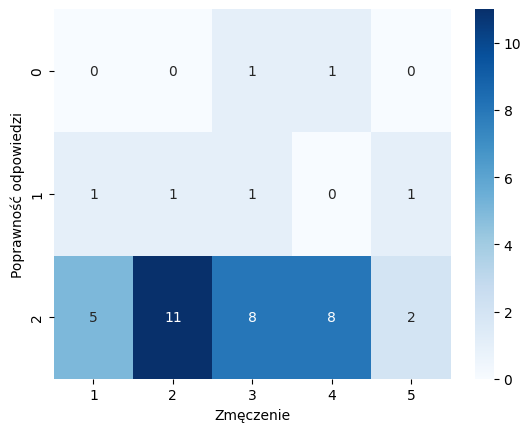

-------------------------------------
Zsumowane grafiki 2:
Zmęcz  1  2  3  4  5
corr                
0      2  1  2  3  0
1      1  2  2  1  1
2      3  9  6  5  2
Chi2 test conducted...
Chi-squared test statistic value: 3.97031746031746
P-value: 0.8597915382460501
Brak podstaw do odrzucenia H0.


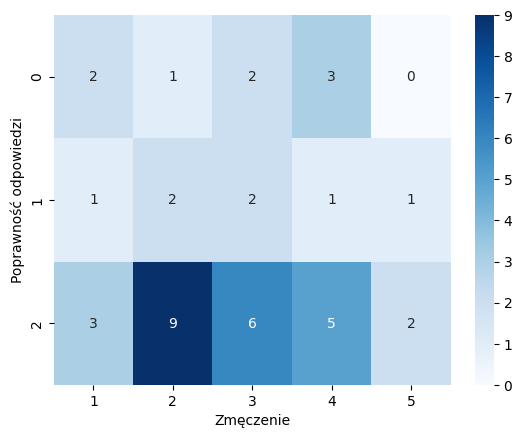

-------------------------------------
Zsumowane grafiki 3:
Zmęcz  1  2  3  4  5
corr                
0      2  3  2  3  2
1      3  6  4  2  1
2      1  3  4  4  0
Chi2 test conducted...
Chi-squared test statistic value: 5.3425925925925934
P-value: 0.7204099754627415
Brak podstaw do odrzucenia H0.


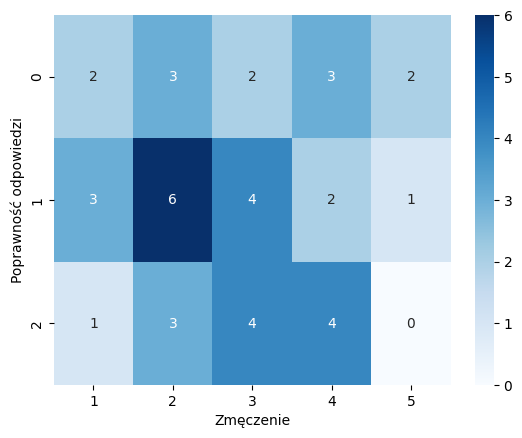

-------------------------------------
Kolekcja wszystkie grafiki:
Zmęcz   1   2   3   4   5
corr                     
0      13  17  17  17   7
1      23  55  43  37  11
Chi2 test conducted...
Chi-squared test statistic value: 2.8557935383504183
P-value: 0.582240658759693
Brak podstaw do odrzucenia H0.


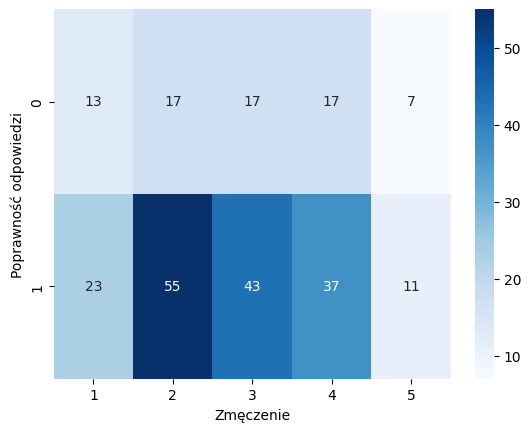

-------------------------------------
Kolekcja grafiki A:
Zmęcz   1   2   3   4  5
corr                    
0       6   8   9   8  4
1      12  28  21  19  5
Chi2 test conducted...
Chi-squared test statistic value: 2.0212885154061624
P-value: 0.7318431523186759
Brak podstaw do odrzucenia H0.


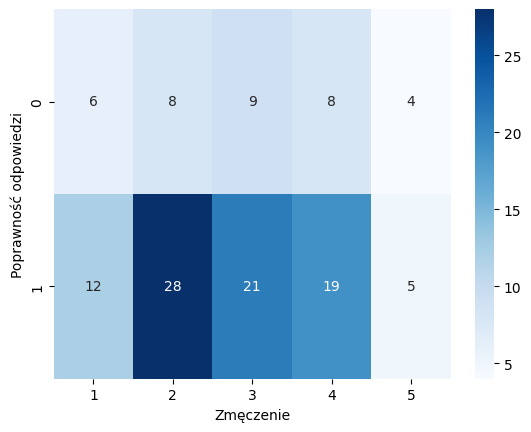

-------------------------------------
Kolekcja grafiki B:
Zmęcz   1   2   3   4  5
corr                    
0       7   9   8   9  3
1      11  27  22  18  6
Chi2 test conducted...
Chi-squared test statistic value: 1.455026455026455
P-value: 0.8345769795192326
Brak podstaw do odrzucenia H0.


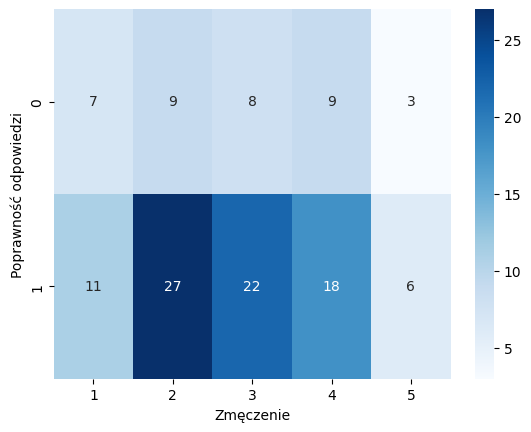

-------------------------------------
Kolekcja grafiki 1:
Zmęcz   1   2   3   4  5
corr                    
0       1   1   3   2  1
1      11  23  17  16  5
Chi2 test conducted...
Chi-squared test statistic value: 1.8209876543209875
P-value: 0.7686403760667015
Brak podstaw do odrzucenia H0.


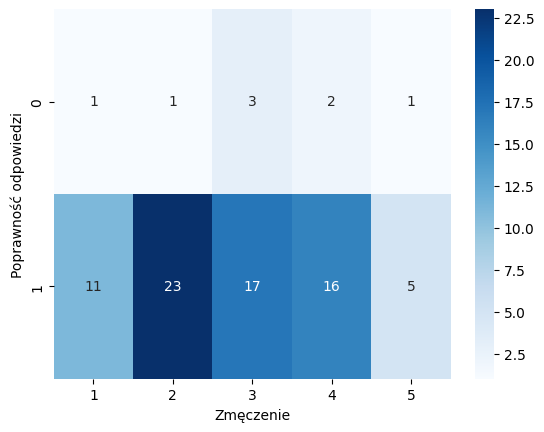

-------------------------------------
Kolekcja grafiki 2:
Zmęcz  1   2   3   4  5
corr                   
0      5   4   6   7  1
1      7  20  14  11  5
Chi2 test conducted...
Chi-squared test statistic value: 4.034240189846597
P-value: 0.4013917766645056
Brak podstaw do odrzucenia H0.


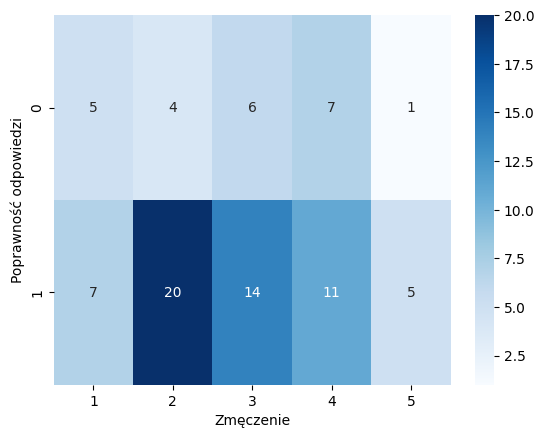

-------------------------------------
Kolekcja grafiki 3:
Zmęcz  1   2   3   4  5
corr                   
0      7  12   8   8  5
1      5  12  12  10  1
Chi2 test conducted...
Chi-squared test statistic value: 4.022222222222222
P-value: 0.40300675291551014
Brak podstaw do odrzucenia H0.


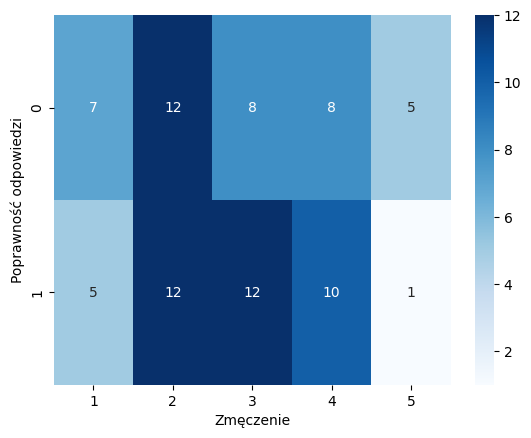

In [44]:
# zmęczenie
var = 'Zmęcz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Zmęczenie', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Czyt_map  3  4  5
corr             
0         0  1  0
2         1  0  2
3         1  7  0
4         1  5  2
5         1  7  5
6         1  5  1
Chi2 test conducted...
Chi-squared test statistic value: 10.167032967032966
P-value: 0.4259632464411981
Brak podstaw do odrzucenia H0.


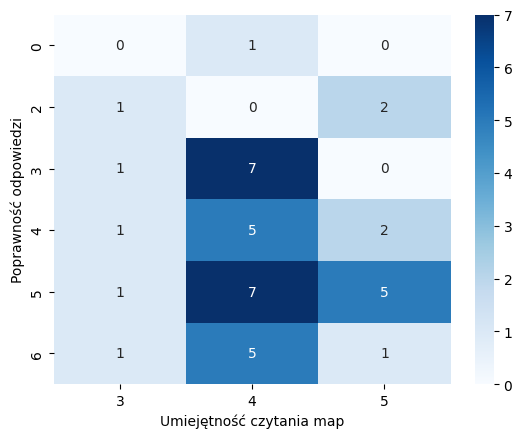

-------------------------------------
Zsumowane grafiki A:
Czyt_map  3   4  5
corr              
0         0   1  0
1         2   4  2
2         1  11  4
3         2   9  4
Chi2 test conducted...
Chi-squared test statistic value: 2.4400000000000004
P-value: 0.8751212607961629
Brak podstaw do odrzucenia H0.


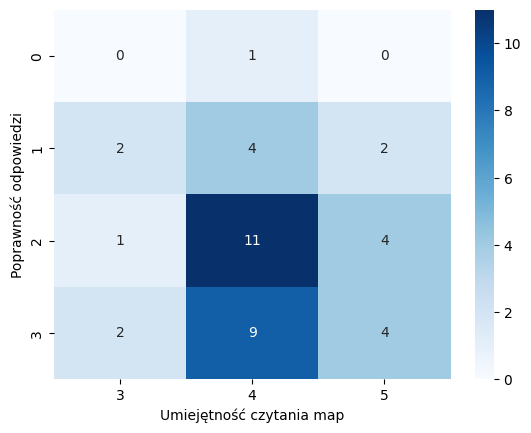

-------------------------------------
Zsumowane grafiki B:
Czyt_map  3   4  5
corr              
0         0   1  0
1         1   3  2
2         3  13  5
3         1   8  3
Chi2 test conducted...
Chi-squared test statistic value: 1.2666666666666668
P-value: 0.9734638923917822
Brak podstaw do odrzucenia H0.


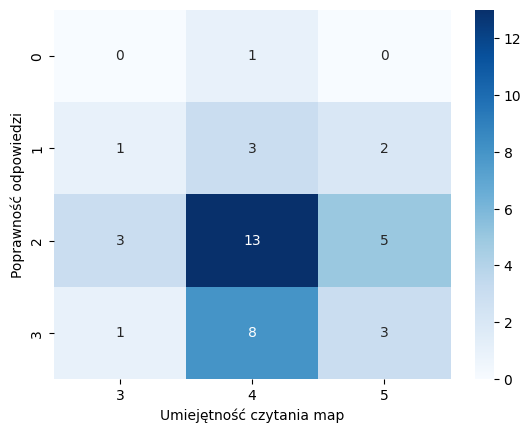

-------------------------------------
Zsumowane grafiki 1:
Czyt_map  3   4  5
corr              
0         0   2  0
1         0   3  1
2         5  20  9
Chi2 test conducted...
Chi-squared test statistic value: 2.0352941176470587
P-value: 0.7292672262016211
Brak podstaw do odrzucenia H0.


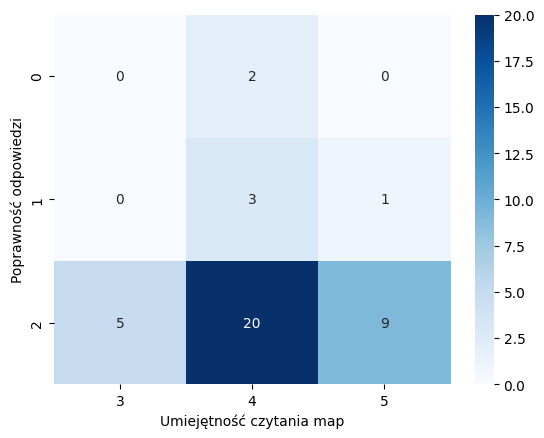

-------------------------------------
Zsumowane grafiki 2:
Czyt_map  3   4  5
corr              
0         1   5  2
1         2   2  3
2         2  18  5
Chi2 test conducted...
Chi-squared test statistic value: 4.644571428571429
P-value: 0.3257475122218063
Brak podstaw do odrzucenia H0.


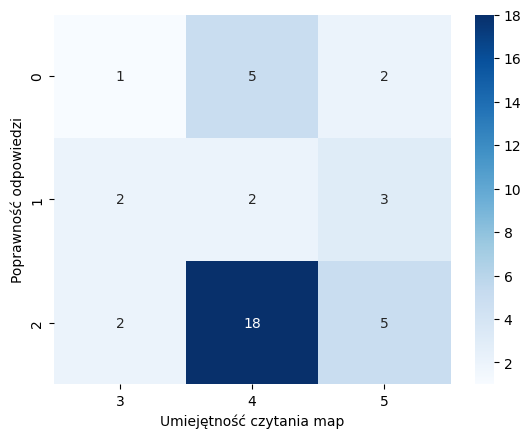

-------------------------------------
Zsumowane grafiki 3:
Czyt_map  3   4  5
corr              
0         2   7  3
1         2  11  3
2         1   7  4
Chi2 test conducted...
Chi-squared test statistic value: 1.0833333333333333
P-value: 0.8969074635734544
Brak podstaw do odrzucenia H0.


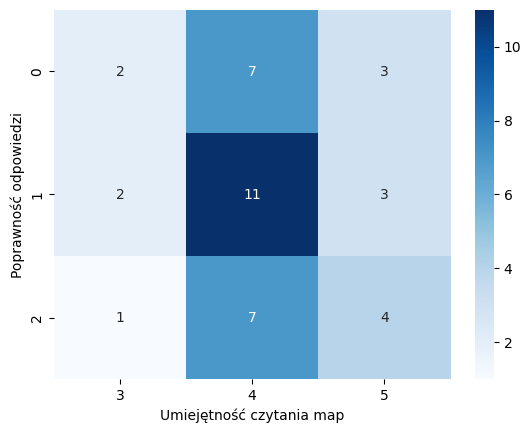

-------------------------------------
Kolekcja wszystkie grafiki:
Czyt_map   3    4   5
corr                 
0         10   44  17
1         20  106  43
Chi2 test conducted...
Chi-squared test statistic value: 0.25202100175014586
P-value: 0.8816055891046545
Brak podstaw do odrzucenia H0.


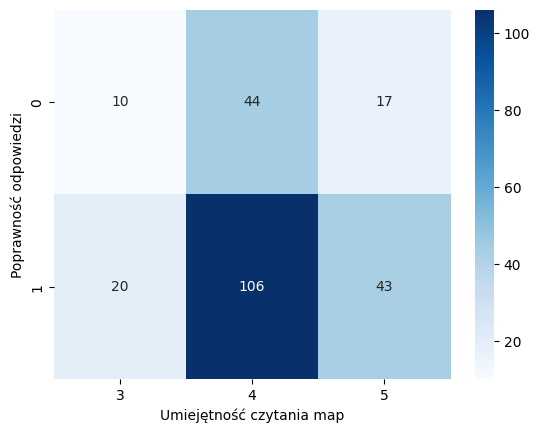

-------------------------------------
Kolekcja grafiki A:
Czyt_map   3   4   5
corr                
0          5  22   8
1         10  53  22
Chi2 test conducted...
Chi-squared test statistic value: 0.21781512605042017
P-value: 0.8968133123764479
Brak podstaw do odrzucenia H0.


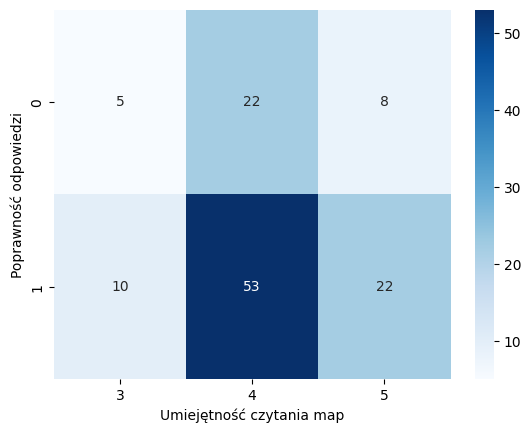

-------------------------------------
Kolekcja grafiki B:
Czyt_map   3   4   5
corr                
0          5  22   9
1         10  53  21
Chi2 test conducted...
Chi-squared test statistic value: 0.09523809523809523
P-value: 0.9534969548334767
Brak podstaw do odrzucenia H0.


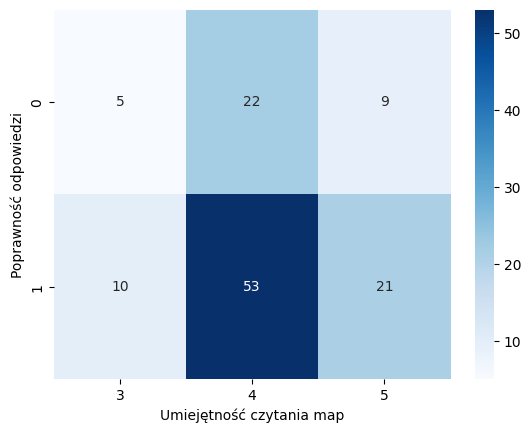

-------------------------------------
Kolekcja grafiki 1:
Czyt_map   3   4   5
corr                
0          0   7   1
1         10  43  19
Chi2 test conducted...
Chi-squared test statistic value: 2.5555555555555554
P-value: 0.27865584814153077
Brak podstaw do odrzucenia H0.


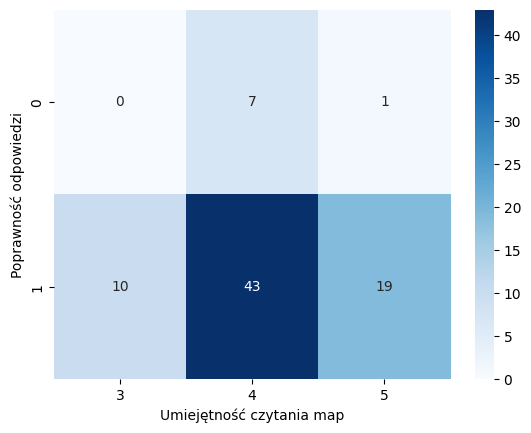

-------------------------------------
Kolekcja grafiki 2:
Czyt_map  3   4   5
corr               
0         4  12   7
1         6  38  13
Chi2 test conducted...
Chi-squared test statistic value: 1.5499618611746757
P-value: 0.4607125664332469
Brak podstaw do odrzucenia H0.


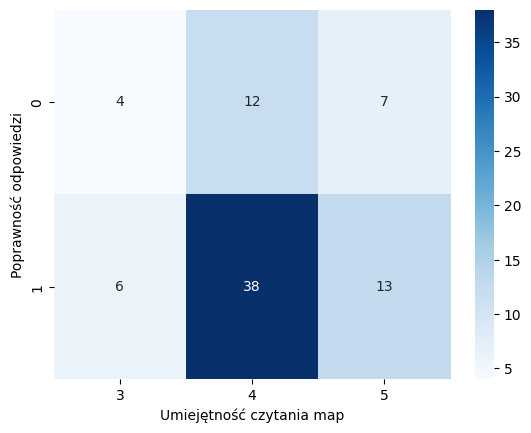

-------------------------------------
Kolekcja grafiki 3:
Czyt_map  3   4   5
corr               
0         6  25   9
1         4  25  11
Chi2 test conducted...
Chi-squared test statistic value: 0.6
P-value: 0.740818220681718
Brak podstaw do odrzucenia H0.


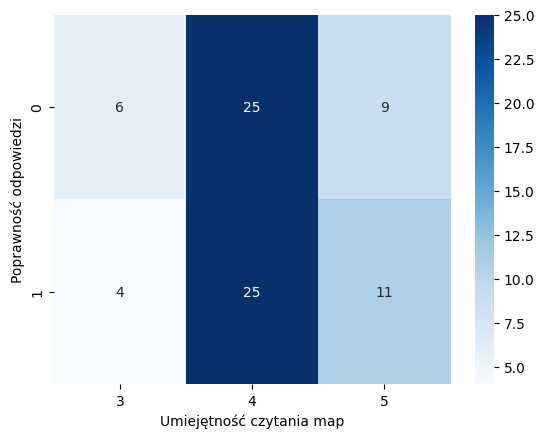

In [45]:
# czytanie map
var = 'Czyt_map'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i+1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Umiejętność czytania map', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Podziel_uwg  1  2  3  4  5
corr                      
0            0  0  1  0  0
2            0  1  1  1  0
3            0  1  3  2  2
4            1  2  3  1  1
5            1  2  3  4  3
6            0  1  3  1  2
Chi2 test conducted...
Chi-squared test statistic value: 7.786753590325017
P-value: 0.9931871605303147
Brak podstaw do odrzucenia H0.


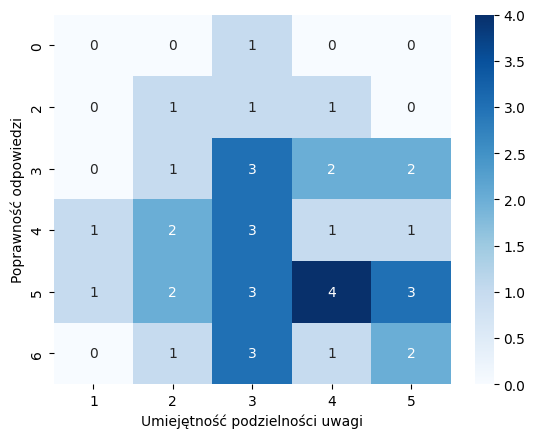

-------------------------------------
Zsumowane grafiki A:
Podziel_uwg  1  2  3  4  5
corr                      
0            0  0  1  0  0
1            0  2  4  1  1
2            1  2  5  6  2
3            1  3  4  2  5
Chi2 test conducted...
Chi-squared test statistic value: 8.330026455026456
P-value: 0.7588374568200759
Brak podstaw do odrzucenia H0.


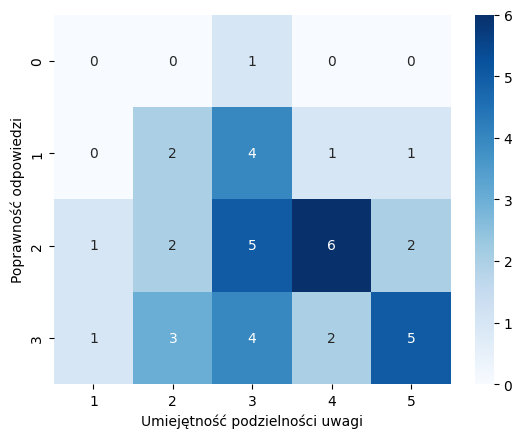

-------------------------------------
Zsumowane grafiki B:
Podziel_uwg  1  2  3  4  5
corr                      
0            0  0  1  0  0
1            0  1  1  3  1
2            2  5  7  2  5
3            0  1  5  4  2
Chi2 test conducted...
Chi-squared test statistic value: 9.884731670445953
P-value: 0.6260724440151326
Brak podstaw do odrzucenia H0.


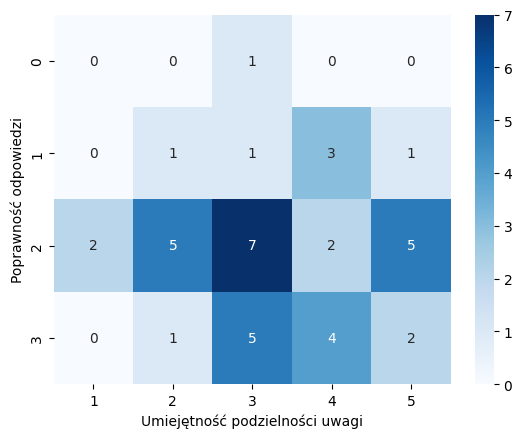

-------------------------------------
Zsumowane grafiki 1:
Podziel_uwg  1  2   3  4  5
corr                       
0            0  0   1  0  1
1            0  1   2  0  1
2            2  6  11  9  6
Chi2 test conducted...
Chi-squared test statistic value: 3.918067226890756
P-value: 0.8644389869220321
Brak podstaw do odrzucenia H0.


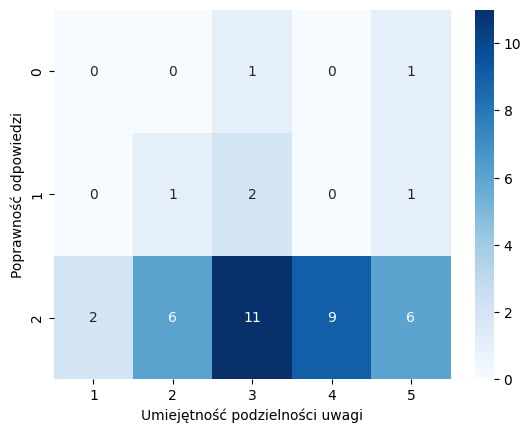

-------------------------------------
Zsumowane grafiki 2:
Podziel_uwg  1  2  3  4  5
corr                      
0            0  1  3  3  1
1            1  1  2  1  2
2            1  5  9  5  5
Chi2 test conducted...
Chi-squared test statistic value: 3.567630385487529
P-value: 0.8938779431536878
Brak podstaw do odrzucenia H0.


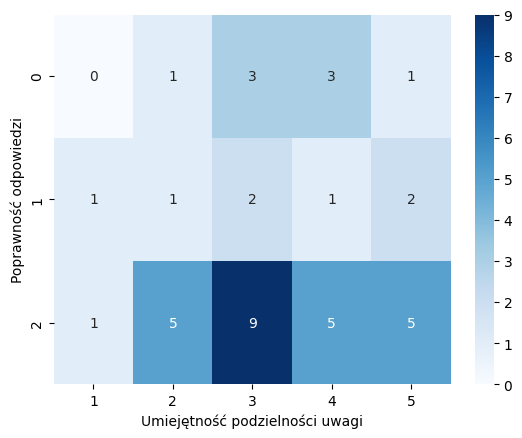

-------------------------------------
Zsumowane grafiki 3:
Podziel_uwg  1  2  3  4  5
corr                      
0            0  3  6  2  1
1            2  3  4  5  2
2            0  1  4  2  5
Chi2 test conducted...
Chi-squared test statistic value: 10.205026455026452
P-value: 0.2509296821025861
Brak podstaw do odrzucenia H0.


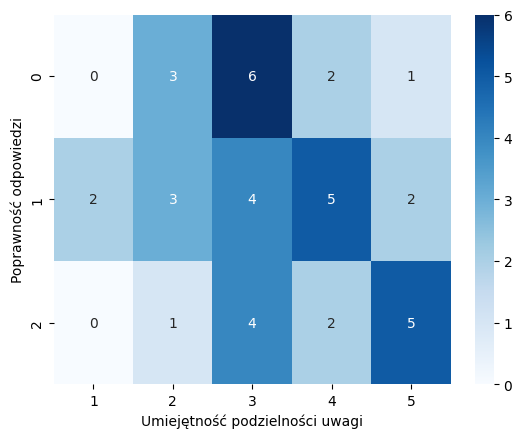

-------------------------------------
Kolekcja wszystkie grafiki:
Podziel_uwg  1   2   3   4   5
corr                          
0            3  13  28  16  11
1            9  29  56  38  37
Chi2 test conducted...
Chi-squared test statistic value: 1.7499871020997777
P-value: 0.7816186391781919
Brak podstaw do odrzucenia H0.


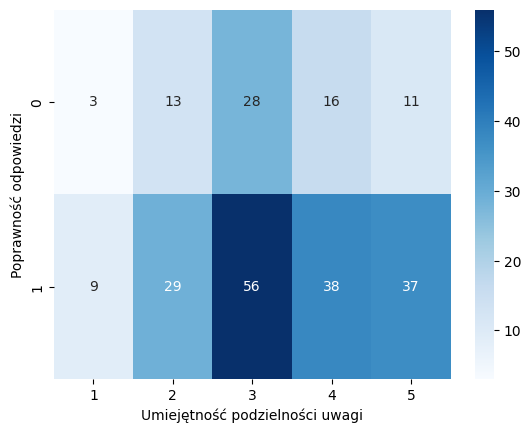

-------------------------------------
Kolekcja grafiki A:
Podziel_uwg  1   2   3   4   5
corr                          
0            1   6  16   8   4
1            5  15  26  19  20
Chi2 test conducted...
Chi-squared test statistic value: 3.8959583833533413
P-value: 0.4202694289699551
Brak podstaw do odrzucenia H0.


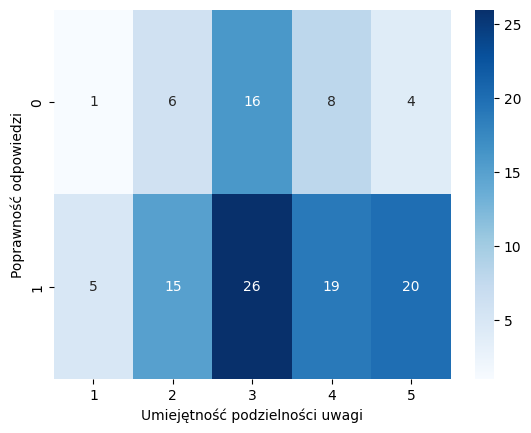

-------------------------------------
Kolekcja grafiki B:
Podziel_uwg  1   2   3   4   5
corr                          
0            2   7  12   8   7
1            4  14  30  19  17
Chi2 test conducted...
Chi-squared test statistic value: 0.19337364575459814
P-value: 0.9956164684305158
Brak podstaw do odrzucenia H0.


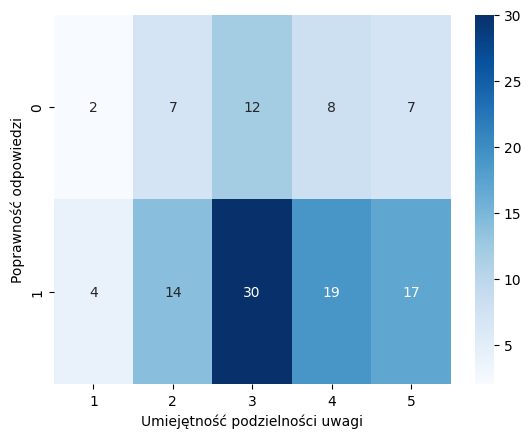

-------------------------------------
Kolekcja grafiki 1:
Podziel_uwg  1   2   3   4   5
corr                          
0            0   1   4   0   3
1            4  13  24  18  13
Chi2 test conducted...
Chi-squared test statistic value: 4.503968253968254
P-value: 0.3420772068713462
Brak podstaw do odrzucenia H0.


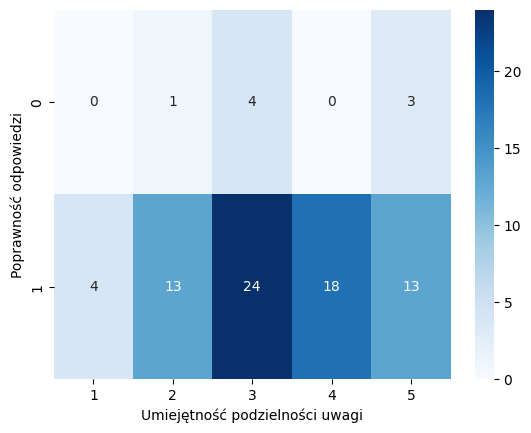

-------------------------------------
Kolekcja grafiki 2:
Podziel_uwg  1   2   3   4   5
corr                          
0            1   3   8   7   4
1            3  11  20  11  12
Chi2 test conducted...
Chi-squared test statistic value: 1.4073831922802176
P-value: 0.8429107720650579
Brak podstaw do odrzucenia H0.


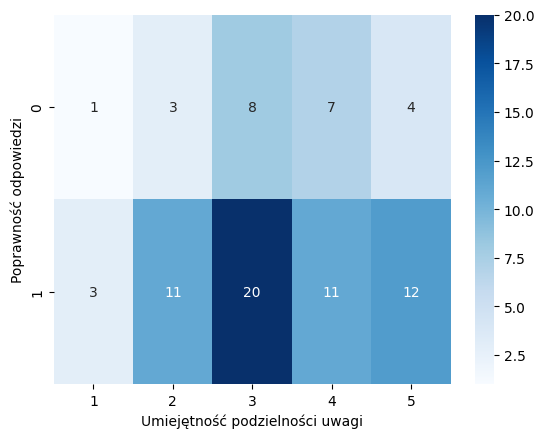

-------------------------------------
Kolekcja grafiki 3:
Podziel_uwg  1  2   3  4   5
corr                        
0            2  9  16  9   4
1            2  5  12  9  12
Chi2 test conducted...
Chi-squared test statistic value: 5.714285714285714
P-value: 0.22152581717509554
Brak podstaw do odrzucenia H0.


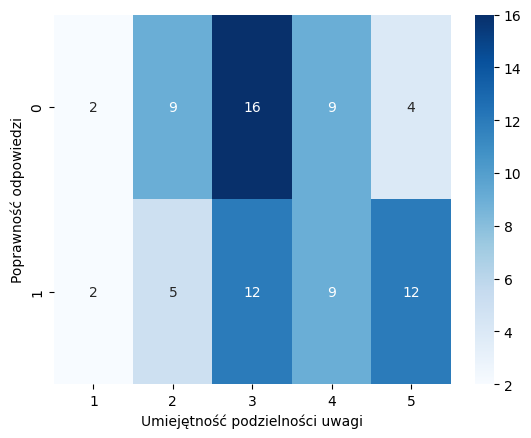

In [46]:
# podzielność uwagi
var = 'Podziel_uwg'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Umiejętność podzielności uwagi', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Analit_myśl  2  3  4  5
corr                   
0            0  0  1  0
2            0  2  0  1
3            1  0  6  1
4            0  4  4  0
5            0  2  6  5
6            0  3  2  2
Chi2 test conducted...
Chi-squared test statistic value: 18.8615867563236
P-value: 0.22007476752021932
Brak podstaw do odrzucenia H0.


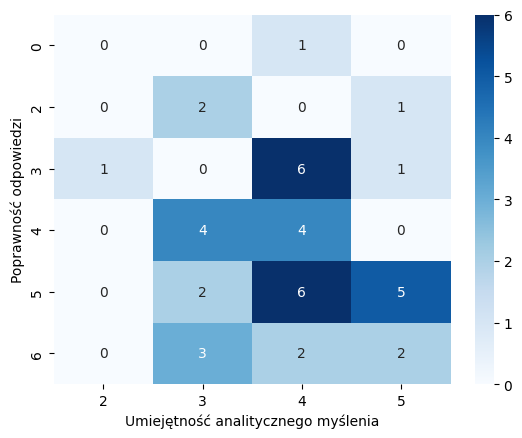

-------------------------------------
Zsumowane grafiki A:
Analit_myśl  2  3  4  5
corr                   
0            0  0  1  0
1            1  2  4  1
2            0  5  9  2
3            0  4  5  6
Chi2 test conducted...
Chi-squared test statistic value: 9.19457735247209
P-value: 0.4195104670780957
Brak podstaw do odrzucenia H0.


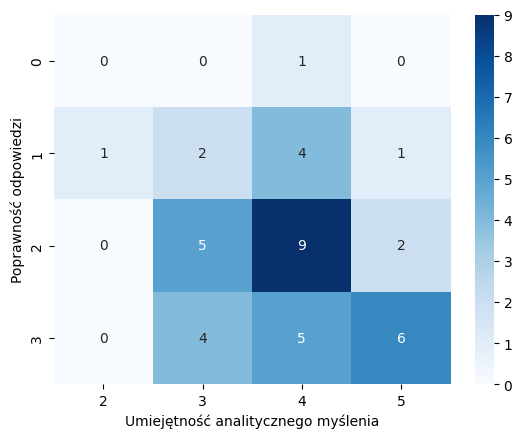

-------------------------------------
Zsumowane grafiki B:
Analit_myśl  2  3   4  5
corr                    
0            0  0   1  0
1            0  2   2  2
2            1  5  11  4
3            0  4   5  3
Chi2 test conducted...
Chi-squared test statistic value: 3.2140958456747932
P-value: 0.9551982534540059
Brak podstaw do odrzucenia H0.


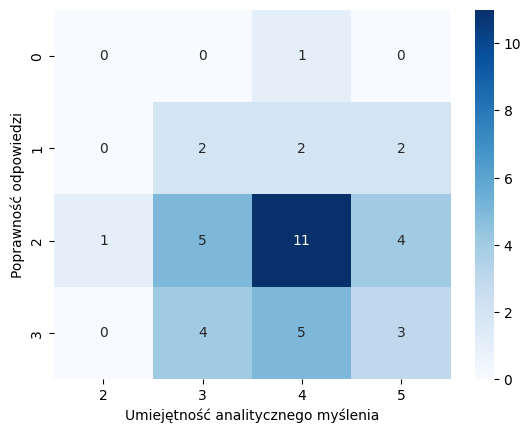

-------------------------------------
Zsumowane grafiki 1:
Analit_myśl  2  3   4  5
corr                    
0            0  0   2  0
1            0  2   2  0
2            1  9  15  9
Chi2 test conducted...
Chi-squared test statistic value: 4.311849141570503
P-value: 0.6345544035712034
Brak podstaw do odrzucenia H0.


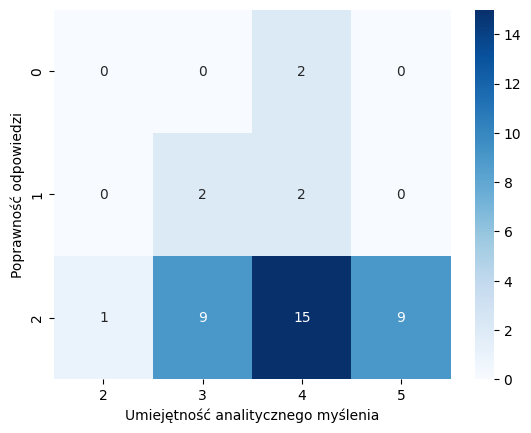

-------------------------------------
Zsumowane grafiki 2:
Analit_myśl  2  3   4  5
corr                    
0            0  2   4  2
1            1  1   3  2
2            0  8  12  5
Chi2 test conducted...
Chi-squared test statistic value: 5.610997189944559
P-value: 0.46814398417913183
Brak podstaw do odrzucenia H0.


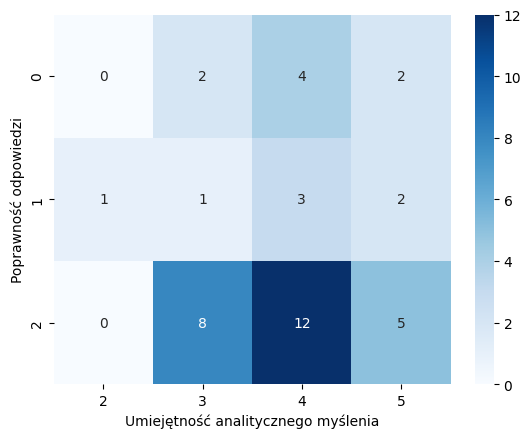

-------------------------------------
Zsumowane grafiki 3:
Analit_myśl  2  3  4  5
corr                   
0            1  3  7  1
1            0  5  7  4
2            0  3  5  4
Chi2 test conducted...
Chi-squared test statistic value: 4.640262271841219
P-value: 0.5907074960737431
Brak podstaw do odrzucenia H0.


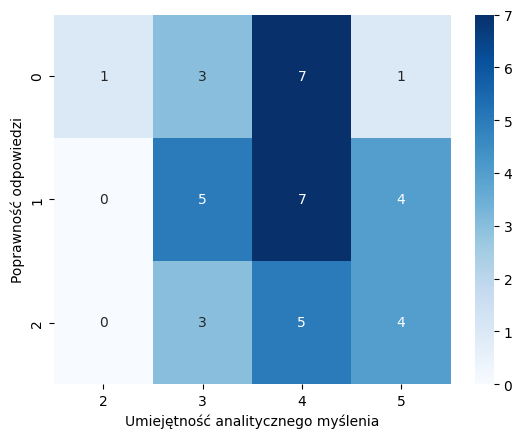

-------------------------------------
Kolekcja wszystkie grafiki:
Analit_myśl  2   3   4   5
corr                      
0            3  18  38  12
1            3  48  76  42
Chi2 test conducted...
Chi-squared test statistic value: 3.5439316912773036
P-value: 0.3151088672855275
Brak podstaw do odrzucenia H0.


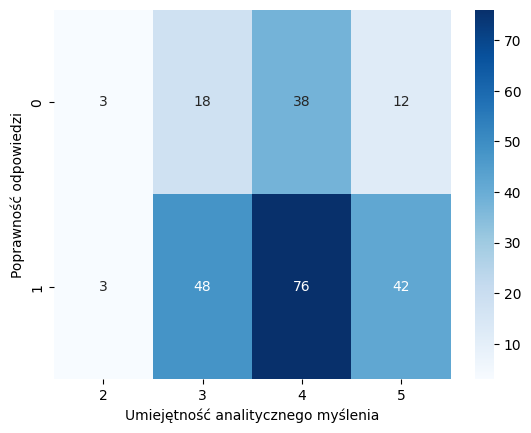

-------------------------------------
Kolekcja grafiki A:
Analit_myśl  2   3   4   5
corr                      
0            2   9  20   4
1            1  24  37  23
Chi2 test conducted...
Chi-squared test statistic value: 5.7584603219278145
P-value: 0.12397159647401447
Brak podstaw do odrzucenia H0.


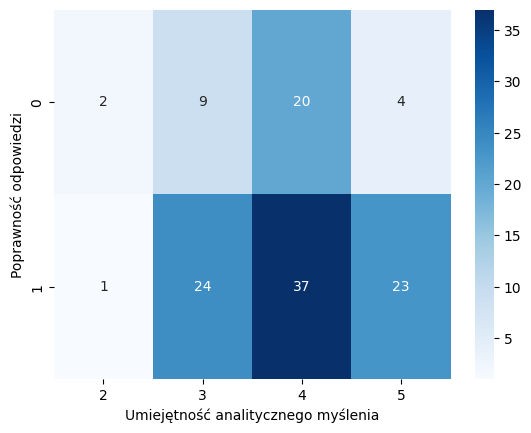

-------------------------------------
Kolekcja grafiki B:
Analit_myśl  2   3   4   5
corr                      
0            1   9  18   8
1            2  24  39  19
Chi2 test conducted...
Chi-squared test statistic value: 0.20218897411879838
P-value: 0.97723515127969
Brak podstaw do odrzucenia H0.


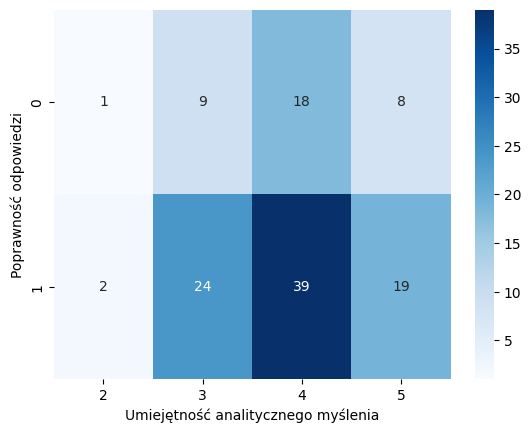

-------------------------------------
Kolekcja grafiki 1:
Analit_myśl  2   3   4   5
corr                      
0            0   2   6   0
1            2  20  32  18
Chi2 test conducted...
Chi-squared test statistic value: 3.6576289207868165
P-value: 0.3008862266449937
Brak podstaw do odrzucenia H0.


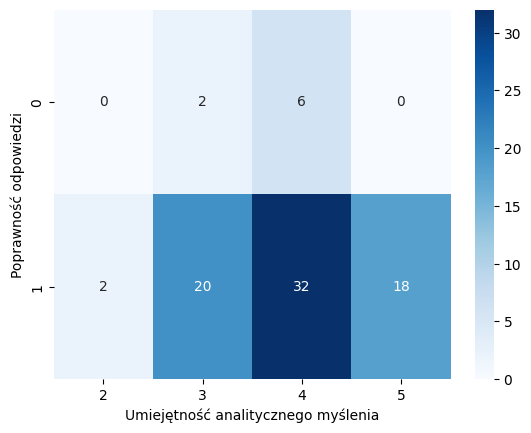

-------------------------------------
Kolekcja grafiki 2:
Analit_myśl  2   3   4   5
corr                      
0            1   5  11   6
1            1  17  27  12
Chi2 test conducted...
Chi-squared test statistic value: 1.0157701305479216
P-value: 0.7974361254513519
Brak podstaw do odrzucenia H0.


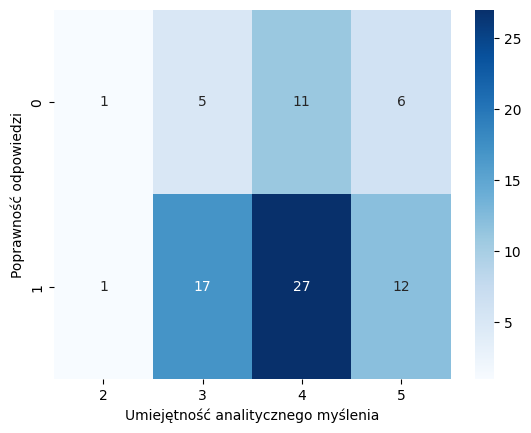

-------------------------------------
Kolekcja grafiki 3:
Analit_myśl  2   3   4   5
corr                      
0            2  11  21   6
1            0  11  17  12
Chi2 test conducted...
Chi-squared test statistic value: 4.421052631578947
P-value: 0.21944124046853966
Brak podstaw do odrzucenia H0.


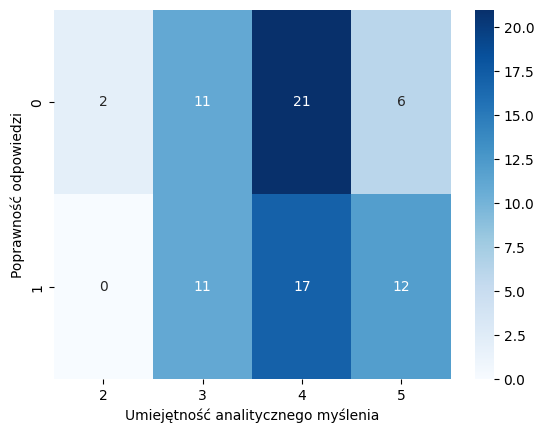

In [48]:
# analityczne myślenie
var = 'Analit_myśl'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Umiejętność analitycznego myślenia', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Spostrzeg  2  3  4  5
corr                 
0          0  0  0  1
2          0  1  0  2
3          1  4  2  1
4          0  2  5  1
5          2  1  7  3
6          1  3  3  0
Chi2 test conducted...
Chi-squared test statistic value: 17.81517502105737
P-value: 0.2725070261956324
Brak podstaw do odrzucenia H0.


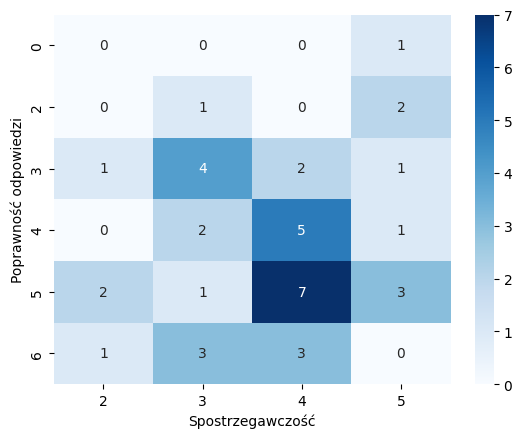

-------------------------------------
Zsumowane grafiki A:
Spostrzeg  2  3  4  5
corr                 
0          0  0  0  1
1          1  3  2  2
2          0  5  7  4
3          3  3  8  1
Chi2 test conducted...
Chi-squared test statistic value: 10.45944741532977
P-value: 0.31458547055404834
Brak podstaw do odrzucenia H0.


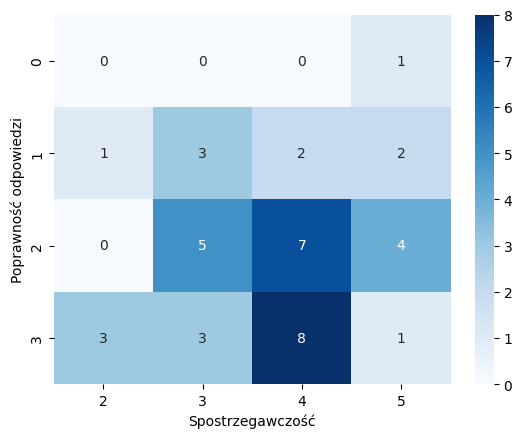

-------------------------------------
Zsumowane grafiki B:
Spostrzeg  2  3   4  5
corr                  
0          0  0   0  1
1          0  3   0  3
2          3  4  12  2
3          1  4   5  2
Chi2 test conducted...
Chi-squared test statistic value: 14.348102877514641
P-value: 0.11047017673363393
Brak podstaw do odrzucenia H0.


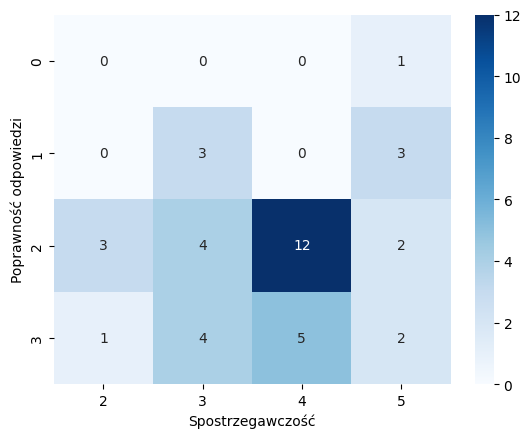

-------------------------------------
Zsumowane grafiki 1:
Spostrzeg  2  3   4  5
corr                  
0          0  1   0  1
1          0  2   1  1
2          4  8  16  6
Chi2 test conducted...
Chi-squared test statistic value: 4.353963510537905
P-value: 0.6288921816158617
Brak podstaw do odrzucenia H0.


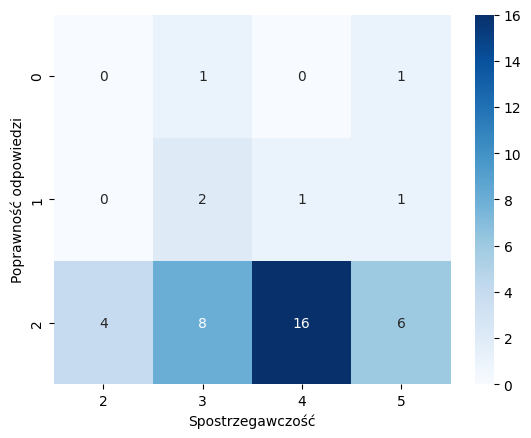

-------------------------------------
Zsumowane grafiki 2:
Spostrzeg  2  3   4  5
corr                  
0          1  2   1  4
1          0  1   5  1
2          3  8  11  3
Chi2 test conducted...
Chi-squared test statistic value: 9.096753246753247
P-value: 0.16820941056547525
Brak podstaw do odrzucenia H0.


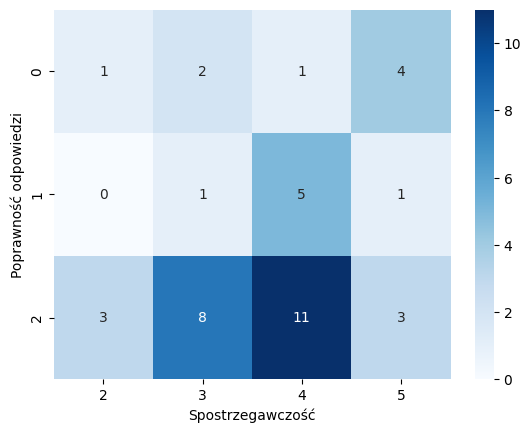

-------------------------------------
Zsumowane grafiki 3:
Spostrzeg  2  3  4  5
corr                 
0          0  4  5  3
1          3  4  5  4
2          1  3  7  1
Chi2 test conducted...
Chi-squared test statistic value: 5.023395721925134
P-value: 0.5408159610501895
Brak podstaw do odrzucenia H0.


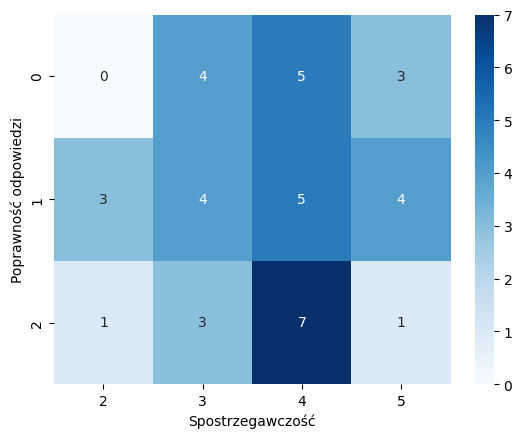

-------------------------------------
Kolekcja wszystkie grafiki:
Spostrzeg   2   3   4   5
corr                     
0           5  21  23  22
1          19  45  79  26
Chi2 test conducted...
Chi-squared test statistic value: 9.54764055649914
P-value: 0.02282990863750747
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


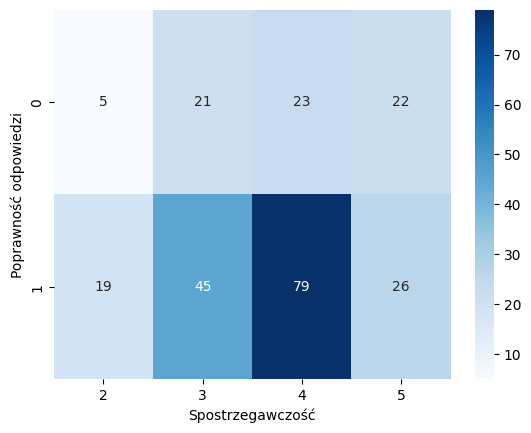

-------------------------------------
Kolekcja grafiki A:
Spostrzeg   2   3   4   5
corr                     
0           2  11  11  11
1          10  22  40  13
Chi2 test conducted...
Chi-squared test statistic value: 5.836875926841325
P-value: 0.11982197010335423
Brak podstaw do odrzucenia H0.


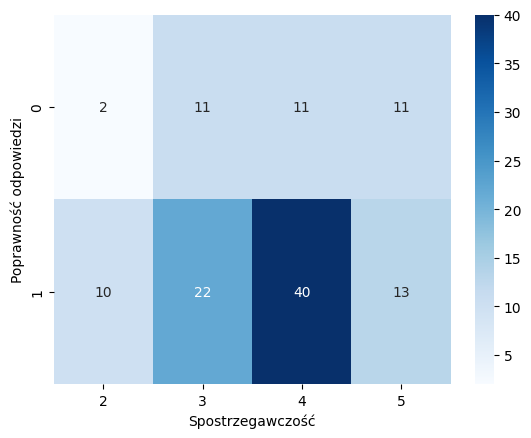

-------------------------------------
Kolekcja grafiki B:
Spostrzeg  2   3   4   5
corr                    
0          3  10  12  11
1          9  23  39  13
Chi2 test conducted...
Chi-squared test statistic value: 4.026186232068585
P-value: 0.2586503381322717
Brak podstaw do odrzucenia H0.


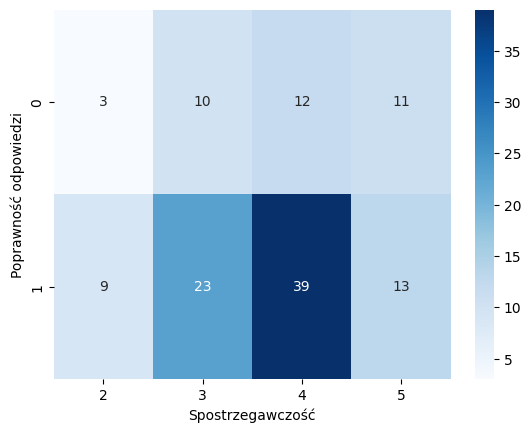

-------------------------------------
Kolekcja grafiki 1:
Spostrzeg  2   3   4   5
corr                    
0          0   4   1   3
1          8  18  33  13
Chi2 test conducted...
Chi-squared test statistic value: 5.768716577540107
P-value: 0.12342117122239596
Brak podstaw do odrzucenia H0.


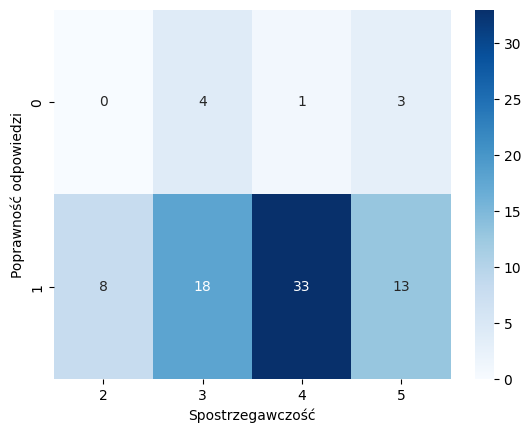

-------------------------------------
Kolekcja grafiki 2:
Spostrzeg  2   3   4  5
corr                   
0          2   5   7  9
1          6  17  27  7
Chi2 test conducted...
Chi-squared test statistic value: 7.457098920283737
P-value: 0.058671071153074524
Brak podstaw do odrzucenia H0.


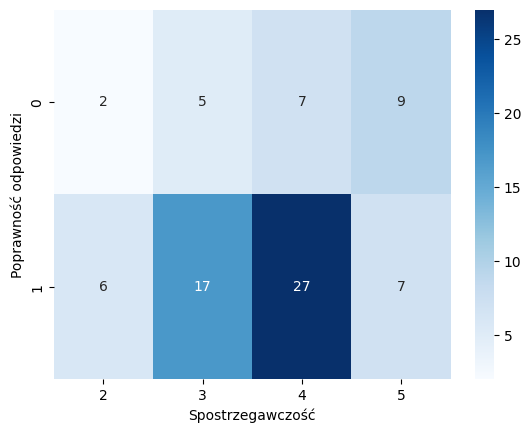

-------------------------------------
Kolekcja grafiki 3:
Spostrzeg  2   3   4   5
corr                    
0          3  12  15  10
1          5  10  19   6
Chi2 test conducted...
Chi-squared test statistic value: 2.1524064171122994
P-value: 0.5413835543037664
Brak podstaw do odrzucenia H0.


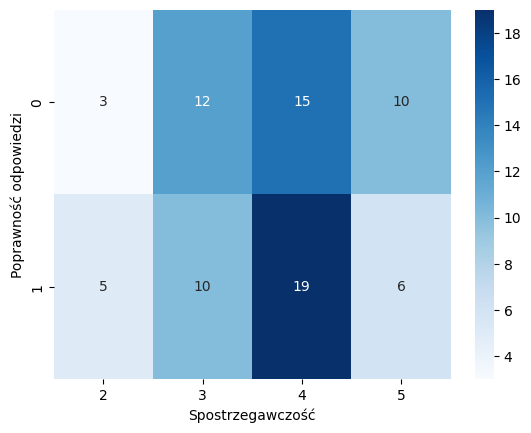

In [49]:
# spostrzegawczość
var = 'Spostrzeg'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Spostrzegawczość', cmap='Blues')

In [50]:
posthocNemenyi_test(df_collAll, 'corr', var, ALPHA)

+----+-----+----------+----------+----------+
|    |   4 |        5 |        3 |        2 |
+====+=====+==========+==========+==========+
|  4 |   1 | 0        | 0        | 0        |
+----+-----+----------+----------+----------+
|  5 |   0 | 1        | 0.232579 | 0.968878 |
+----+-----+----------+----------+----------+
|  3 |   0 | 0.232579 | 1        | 0.193415 |
+----+-----+----------+----------+----------+
|  2 |   0 | 0.968878 | 0.193415 | 1        |
+----+-----+----------+----------+----------+


-------------------------------------
Zsumowane wszystkie grafiki:
Czyt_ze_zroz  1  2  3  4  5
corr                       
0             0  0  0  1  0
2             0  1  1  0  1
3             1  2  2  2  1
4             0  2  0  4  2
5             1  1  2  6  3
6             0  1  1  4  1
Chi2 test conducted...
Chi-squared test statistic value: 10.569388011614903
P-value: 0.956634737506914
Brak podstaw do odrzucenia H0.


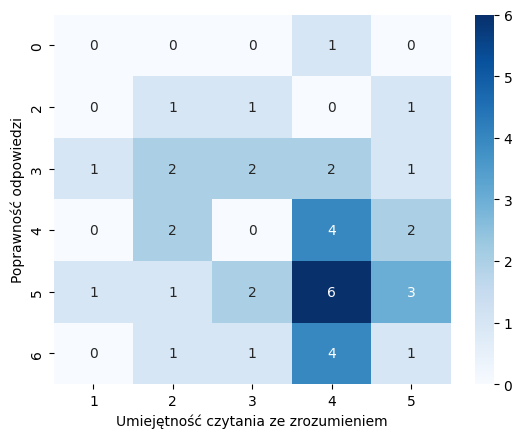

-------------------------------------
Zsumowane grafiki A:
Czyt_ze_zroz  1  2  3  4  5
corr                       
0             0  0  0  1  0
1             1  2  3  0  2
2             0  3  1  8  4
3             1  2  2  8  2
Chi2 test conducted...
Chi-squared test statistic value: 11.760270774976659
P-value: 0.46511970837383954
Brak podstaw do odrzucenia H0.


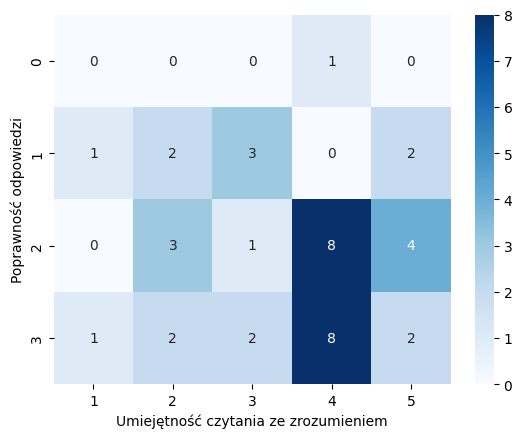

-------------------------------------
Zsumowane grafiki B:
Czyt_ze_zroz  1  2  3  4  5
corr                       
0             0  0  0  1  0
1             0  2  1  2  1
2             2  4  3  8  4
3             0  1  2  6  3
Chi2 test conducted...
Chi-squared test statistic value: 5.183573429371749
P-value: 0.9515645589143209
Brak podstaw do odrzucenia H0.


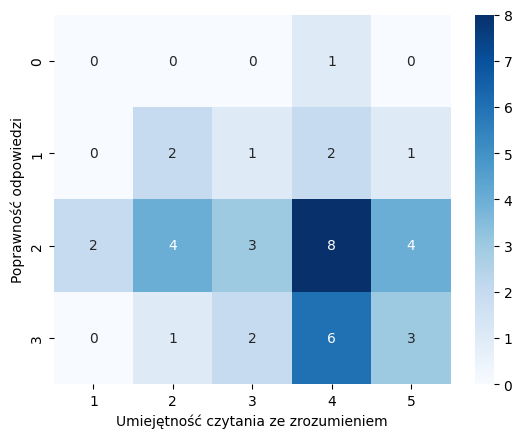

-------------------------------------
Zsumowane grafiki 1:
Czyt_ze_zroz  1  2  3   4  5
corr                        
0             0  0  0   2  0
1             0  1  2   1  0
2             2  6  4  14  8
Chi2 test conducted...
Chi-squared test statistic value: 7.90575053550832
P-value: 0.4427305267999817
Brak podstaw do odrzucenia H0.


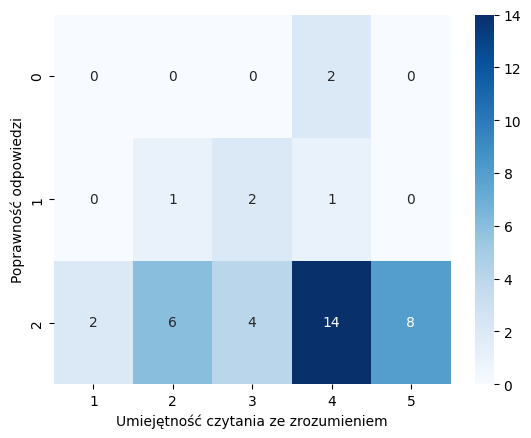

-------------------------------------
Zsumowane grafiki 2:
Czyt_ze_zroz  1  2  3   4  5
corr                        
0             1  2  1   3  1
1             0  2  1   2  2
2             1  3  4  12  5
Chi2 test conducted...
Chi-squared test statistic value: 3.5586534613845533
P-value: 0.894590187600263
Brak podstaw do odrzucenia H0.


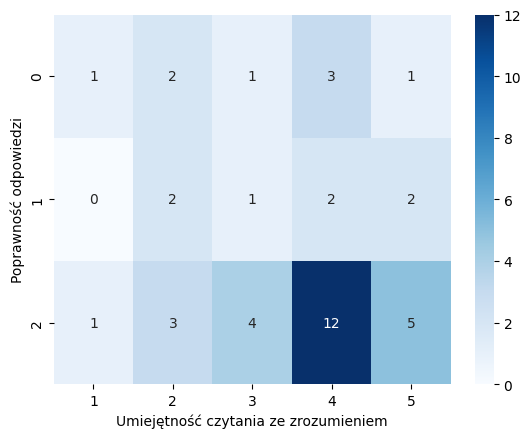

-------------------------------------
Zsumowane grafiki 3:
Czyt_ze_zroz  1  2  3  4  5
corr                       
0             0  2  3  3  4
1             2  4  1  7  2
2             0  1  2  7  2
Chi2 test conducted...
Chi-squared test statistic value: 8.895891690009337
P-value: 0.35115446063726297
Brak podstaw do odrzucenia H0.


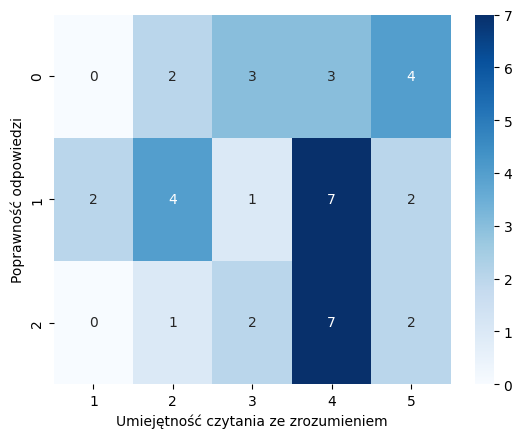

-------------------------------------
Kolekcja wszystkie grafiki:
Czyt_ze_zroz  1   2   3   4   5
corr                           
0             4  15  12  26  14
1             8  27  24  76  34
Chi2 test conducted...
Chi-squared test statistic value: 1.906209270940645
P-value: 0.75300424916162
Brak podstaw do odrzucenia H0.


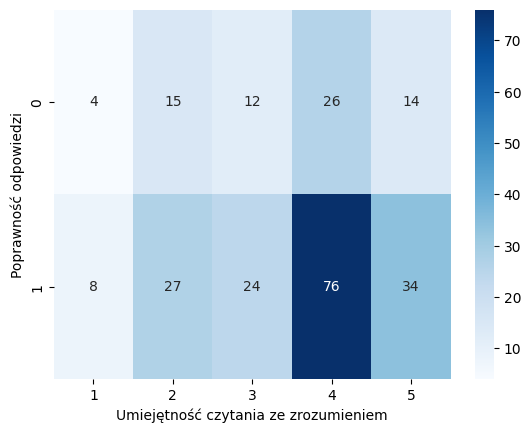

-------------------------------------
Kolekcja grafiki A:
Czyt_ze_zroz  1   2   3   4   5
corr                           
0             2   7   7  11   8
1             4  14  11  40  16
Chi2 test conducted...
Chi-squared test statistic value: 2.6772120612951062
P-value: 0.6132080573784968
Brak podstaw do odrzucenia H0.


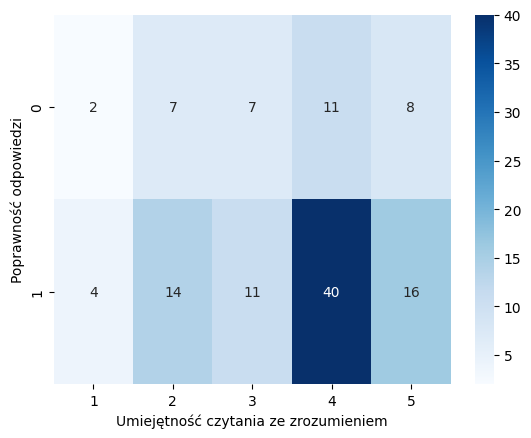

-------------------------------------
Kolekcja grafiki B:
Czyt_ze_zroz  1   2   3   4   5
corr                           
0             2   8   5  15   6
1             4  13  13  36  18
Chi2 test conducted...
Chi-squared test statistic value: 1.0235205193188386
P-value: 0.9062087846085375
Brak podstaw do odrzucenia H0.


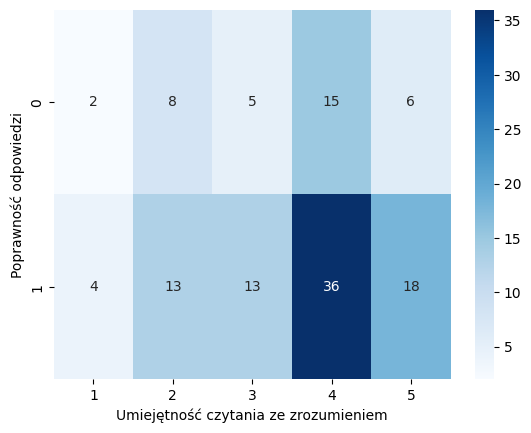

-------------------------------------
Kolekcja grafiki 1:
Czyt_ze_zroz  1   2   3   4   5
corr                           
0             0   1   2   5   0
1             4  13  10  29  16
Chi2 test conducted...
Chi-squared test statistic value: 3.778400248988485
P-value: 0.4368259555762054
Brak podstaw do odrzucenia H0.


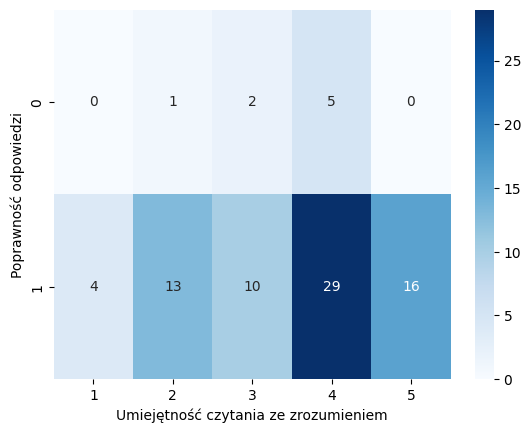

-------------------------------------
Kolekcja grafiki 2:
Czyt_ze_zroz  1  2  3   4   5
corr                         
0             2  6  3   8   4
1             2  8  9  26  12
Chi2 test conducted...
Chi-squared test statistic value: 2.886500137812561
P-value: 0.5769954371062413
Brak podstaw do odrzucenia H0.


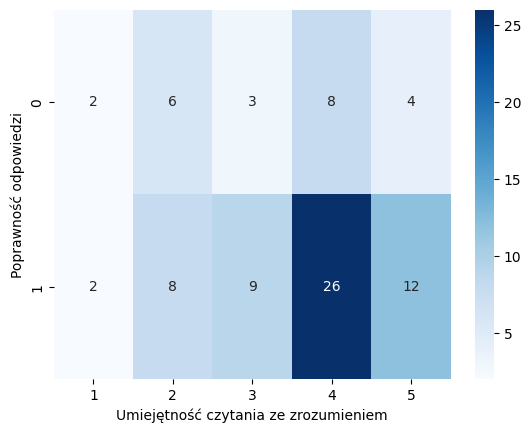

-------------------------------------
Kolekcja grafiki 3:
Czyt_ze_zroz  1  2  3   4   5
corr                         
0             2  8  7  13  10
1             2  6  5  21   6
Chi2 test conducted...
Chi-squared test statistic value: 3.5014005602240896
P-value: 0.47766541818369823
Brak podstaw do odrzucenia H0.


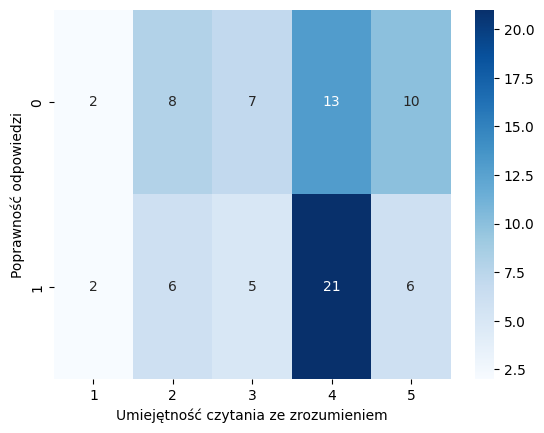

In [51]:
# czytanie ze zrozumieniem
var = 'Czyt_ze_zroz'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Umiejętność czytania ze zrozumieniem', cmap='Blues')

In [59]:
# wzrokowiec
var = 'Wzrokowiec'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Wzrokowiec', cmap='Blues')

-----------------------------------------------
Zsumowane wszystkie grafiki:
Wzrokowiec  2  3  4  5
corr                  
0           0  0  1  0
2           0  0  1  2
3           0  2  3  3
4           1  2  3  2
5           0  3  4  6
6           1  2  3  1
Wartość statystyki chi-kwadrat: 8.457003314146172
P-value: 0.9041579133602895
Brak podstaw do odrzucenia H0.
-----------------------------------------------
Zsumowane grafiki A:
Wzrokowiec  2  3  4  5
corr                  
0           0  0  1  0
1           0  1  3  4
2           1  4  5  6
3           1  4  6  4
Wartość statystyki chi-kwadrat: 3.7478835978835985
P-value: 0.9272090299966425
Brak podstaw do odrzucenia H0.
-----------------------------------------------
Zsumowane grafiki B:
Wzrokowiec  2  3  4  5
corr                  
0           0  0  1  0
1           0  1  2  3
2           1  5  8  7
3           1  3  4  4
Wartość statystyki chi-kwadrat: 2.873015873015873
P-value: 0.9691171812074049
Brak podstaw do odrzucenia H

-------------------------------------
Zsumowane wszystkie grafiki:
Słuchowiec  1  2  3  4  5
corr                     
0           0  0  0  0  1
2           1  1  1  0  0
3           1  2  3  2  0
4           1  1  2  1  3
5           0  3  6  2  2
6           1  1  3  2  0
Chi2 test conducted...
Chi-squared test statistic value: 17.077729809872668
P-value: 0.647920711018114
Brak podstaw do odrzucenia H0.


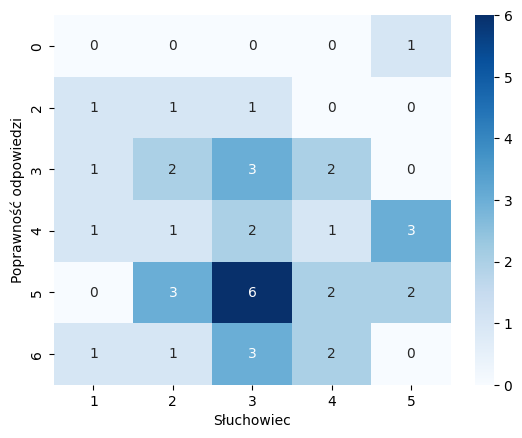

-------------------------------------
Zsumowane grafiki A:
Słuchowiec  1  2  3  4  5
corr                     
0           0  0  0  0  1
1           1  3  3  1  0
2           2  2  6  3  3
3           1  3  6  3  2
Chi2 test conducted...
Chi-squared test statistic value: 9.24325396825397
P-value: 0.6820248528873389
Brak podstaw do odrzucenia H0.


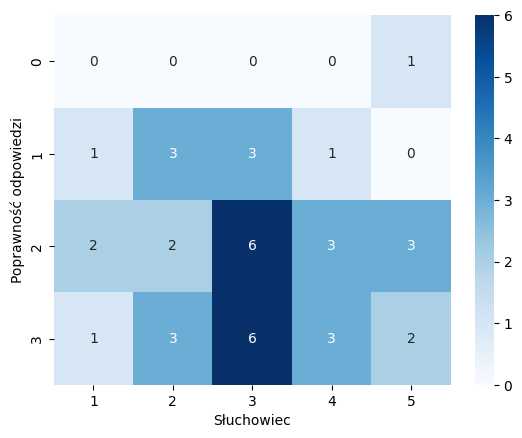

-------------------------------------
Zsumowane grafiki B:
Słuchowiec  1  2  3  4  5
corr                     
0           0  0  0  0  1
1           2  1  2  1  0
2           1  5  7  3  5
3           1  2  6  3  0
Chi2 test conducted...
Chi-squared test statistic value: 14.718820861678005
P-value: 0.2571746719579138
Brak podstaw do odrzucenia H0.


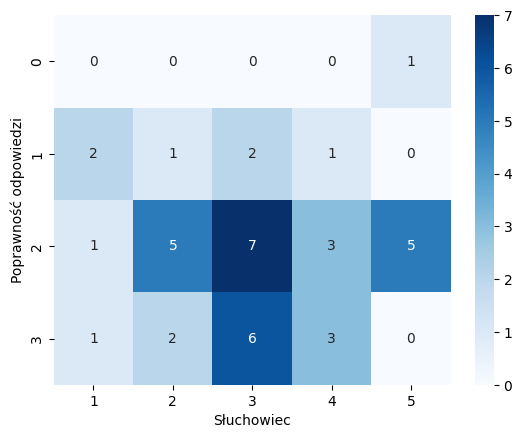

-------------------------------------
Zsumowane grafiki 1:
Słuchowiec  1  2   3  4  5
corr                      
0           0  0   1  0  1
1           1  2   0  1  0
2           3  6  14  6  5
Chi2 test conducted...
Chi-squared test statistic value: 7.861344537815125
P-value: 0.4471304354657918
Brak podstaw do odrzucenia H0.


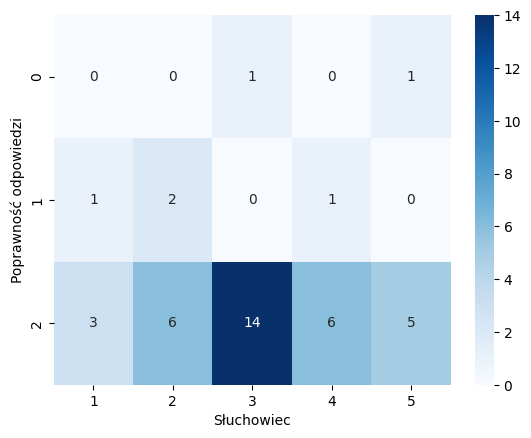

-------------------------------------
Zsumowane grafiki 2:
Słuchowiec  1  2   3  4  5
corr                      
0           3  1   2  1  1
1           0  0   2  2  3
2           1  7  11  4  2
Chi2 test conducted...
Chi-squared test statistic value: 15.946972789115645
P-value: 0.0431454134874763
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


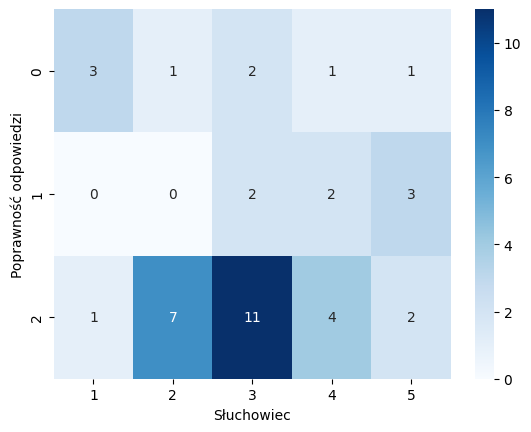

-------------------------------------
Zsumowane grafiki 3:
Słuchowiec  1  2  3  4  5
corr                     
0           0  4  4  1  3
1           2  3  7  3  1
2           2  1  4  3  2
Chi2 test conducted...
Chi-squared test statistic value: 6.622023809523808
P-value: 0.5779067692815026
Brak podstaw do odrzucenia H0.


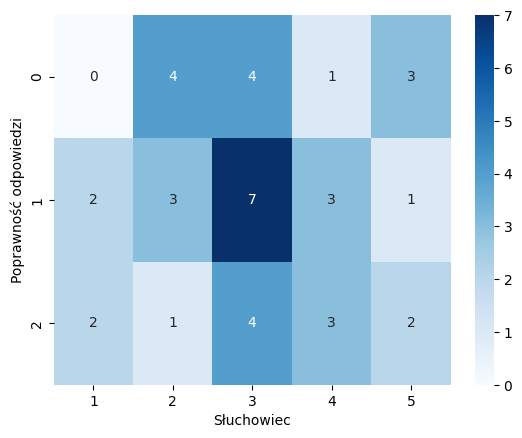

-------------------------------------
Kolekcja wszystkie grafiki:
Słuchowiec   1   2   3   4   5
corr                          
0            9  15  23  10  14
1           15  33  67  32  22
Chi2 test conducted...
Chi-squared test statistic value: 3.6555427237984124
P-value: 0.45462495933698155
Brak podstaw do odrzucenia H0.


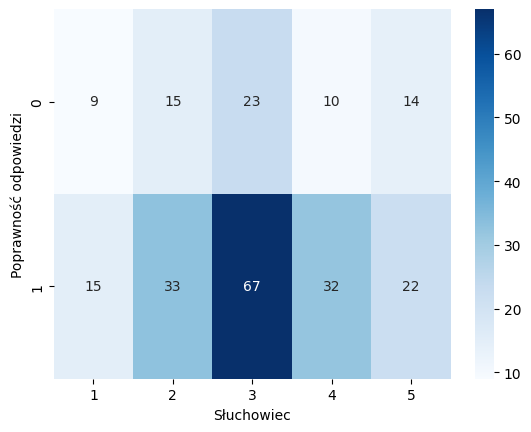

-------------------------------------
Kolekcja grafiki A:
Słuchowiec  1   2   3   4   5
corr                         
0           4   8  12   5   6
1           8  16  33  16  12
Chi2 test conducted...
Chi-squared test statistic value: 0.8816326530612244
P-value: 0.9271809989131503
Brak podstaw do odrzucenia H0.


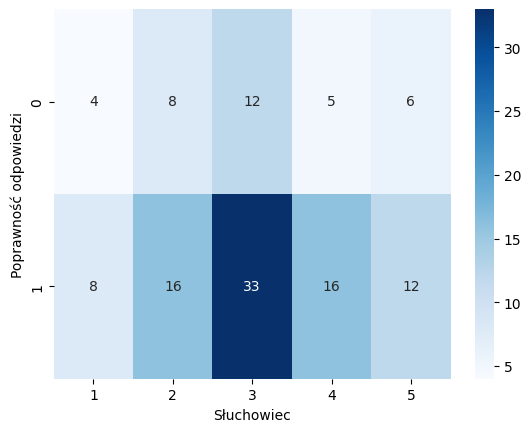

-------------------------------------
Kolekcja grafiki B:
Słuchowiec  1   2   3   4   5
corr                         
0           5   7  11   5   8
1           7  17  34  16  10
Chi2 test conducted...
Chi-squared test statistic value: 3.618669690098261
P-value: 0.46006518193875057
Brak podstaw do odrzucenia H0.


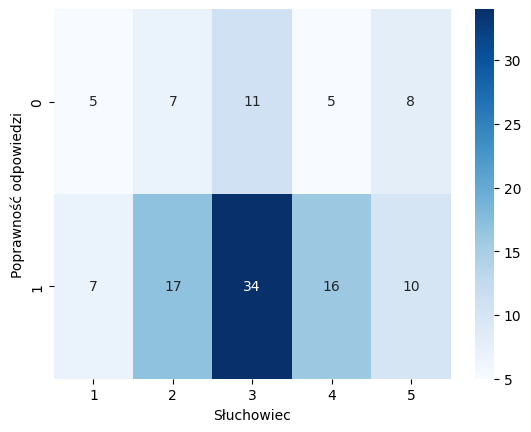

-------------------------------------
Kolekcja grafiki 1:
Słuchowiec  1   2   3   4   5
corr                         
0           1   2   2   1   2
1           7  14  28  13  10
Chi2 test conducted...
Chi-squared test statistic value: 1.2566137566137567
P-value: 0.868692450521011
Brak podstaw do odrzucenia H0.


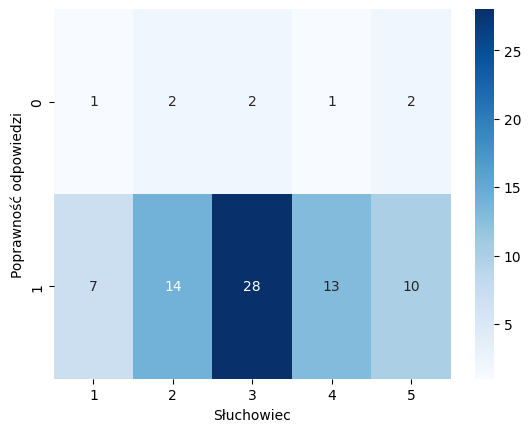

-------------------------------------
Kolekcja grafiki 2:
Słuchowiec  1   2   3   4  5
corr                        
0           6   2   6   4  5
1           2  14  24  10  7
Chi2 test conducted...
Chi-squared test statistic value: 12.515346336856636
P-value: 0.013903510855871047
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


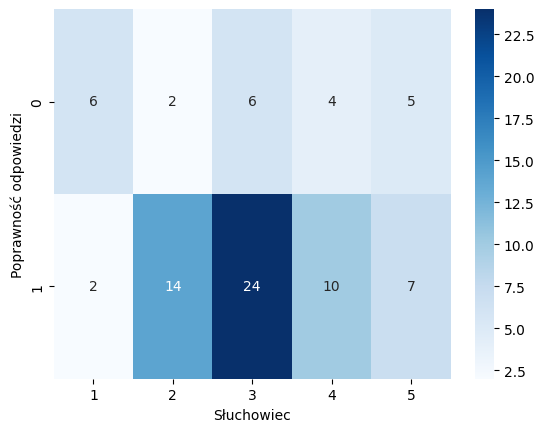

-------------------------------------
Kolekcja grafiki 3:
Słuchowiec  1   2   3  4  5
corr                       
0           2  11  15  5  7
1           6   5  15  9  5
Chi2 test conducted...
Chi-squared test statistic value: 5.726190476190476
P-value: 0.22055095975558034
Brak podstaw do odrzucenia H0.


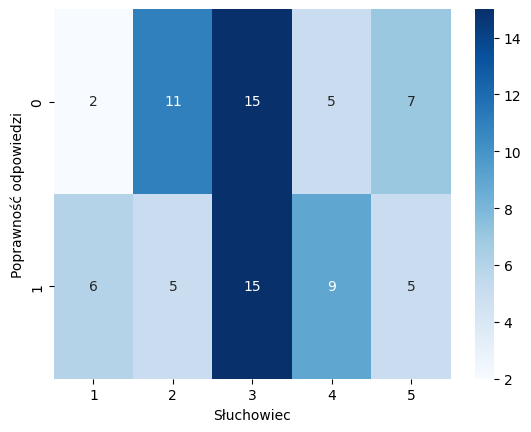

In [52]:
# słuchowiec
var = 'Słuchowiec'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Słuchowiec', cmap='Blues')

In [53]:
posthocNemenyi_test(df_sum2, 'corr', var, ALPHA)
posthocNemenyi_test(df_coll2, 'corr', var, ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        1 |        3 |        4 |        2 |        5 |
+====+==========+==========+==========+==========+==========+
|  1 | 1        | 0.073108 | 0.823198 | 0.834717 | 0.959194 |
+----+----------+----------+----------+----------+----------+
|  3 | 0.073108 | 1        | 0.456368 | 0.366871 | 0.240177 |
+----+----------+----------+----------+----------+----------+
|  4 | 0.823198 | 0.456368 | 1        | 0.999998 | 0.994571 |
+----+----------+----------+----------+----------+----------+
|  2 | 0.834717 | 0.366871 | 0.999998 | 1        | 0.99648  |
+----+----------+----------+----------+----------+----------+
|  5 | 0.959194 | 0.240177 | 0.994571 | 0.99648  | 1        |
+----+----------+----------+----------+----------+----------+
+----+----------+----------+----------+----------+----------+
|    |        1 |        3 |        4 |        2 |        5 |
+====+==========+==========+==========+==========+==========+
|  1 | 1

-------------------------------------
Zsumowane wszystkie grafiki:
Kinestetyk  1  2  3  4  5
corr                     
0           0  1  0  0  0
2           1  0  0  2  0
3           3  3  0  2  0
4           1  2  1  3  1
5           2  7  2  2  0
6           2  4  0  1  0
Chi2 test conducted...
Chi-squared test statistic value: 15.77240297828533
P-value: 0.7306398067351932
Brak podstaw do odrzucenia H0.


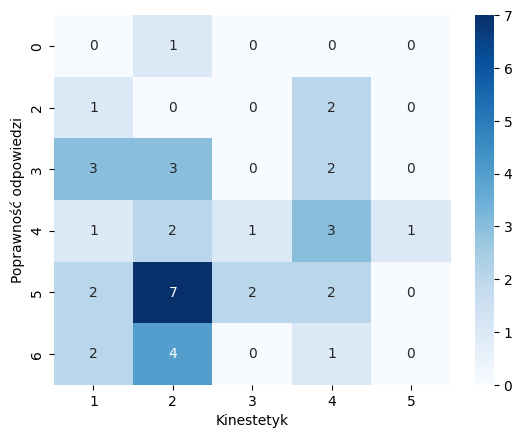

-------------------------------------
Zsumowane grafiki A:
Kinestetyk  1  2  3  4  5
corr                     
0           0  1  0  0  0
1           2  2  0  4  0
2           3  6  3  3  1
3           4  8  0  3  0
Chi2 test conducted...
Chi-squared test statistic value: 10.975708061002178
P-value: 0.5310016553083297
Brak podstaw do odrzucenia H0.


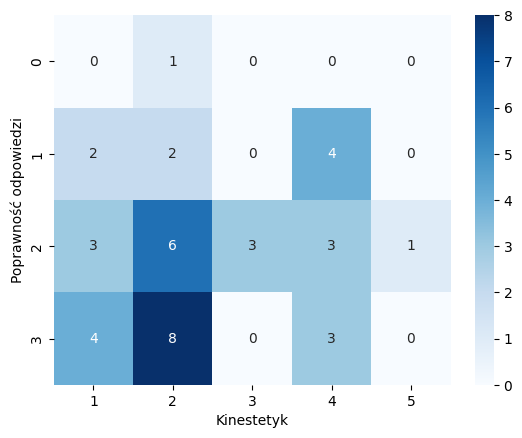

-------------------------------------
Zsumowane grafiki B:
Kinestetyk  1  2  3  4  5
corr                     
0           0  1  0  0  0
1           3  1  0  2  0
2           4  8  1  7  1
3           2  7  2  1  0
Chi2 test conducted...
Chi-squared test statistic value: 10.375661375661377
P-value: 0.5830405059295987
Brak podstaw do odrzucenia H0.


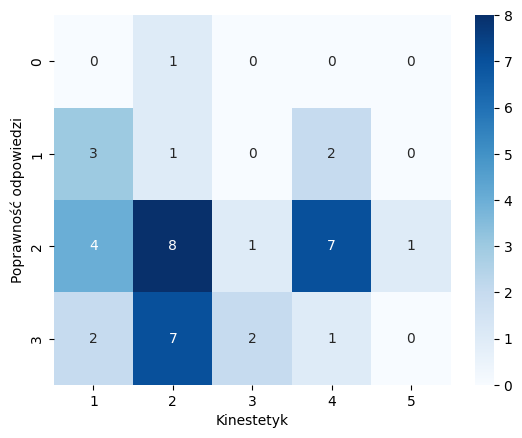

-------------------------------------
Zsumowane grafiki 1:
Kinestetyk  1   2  3  4  5
corr                      
0           1   1  0  0  0
1           0   1  0  3  0
2           8  15  3  7  1
Chi2 test conducted...
Chi-squared test statistic value: 7.394463667820069
P-value: 0.49473116729572275
Brak podstaw do odrzucenia H0.


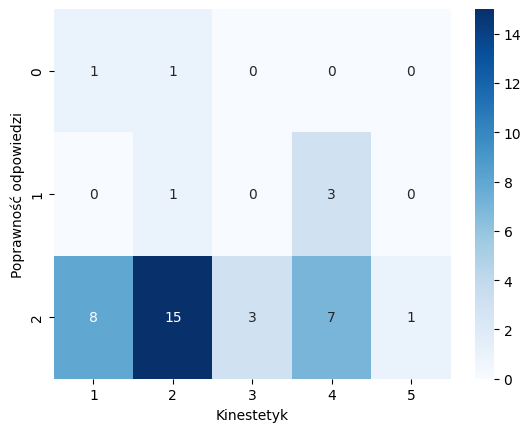

-------------------------------------
Zsumowane grafiki 2:
Kinestetyk  1   2  3  4  5
corr                      
0           2   3  0  2  1
1           1   3  1  2  0
2           6  11  2  6  0
Chi2 test conducted...
Chi-squared test statistic value: 5.401456582633054
P-value: 0.7139316044251007
Brak podstaw do odrzucenia H0.


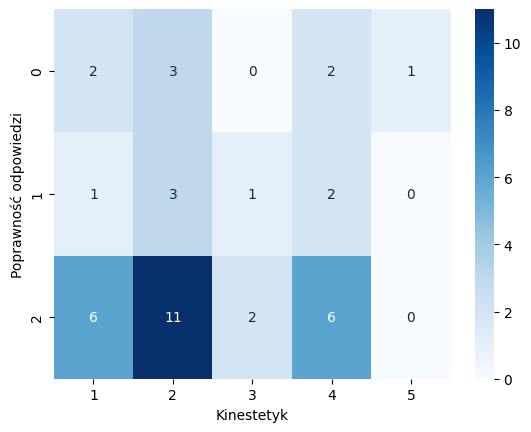

-------------------------------------
Zsumowane grafiki 3:
Kinestetyk  1  2  3  4  5
corr                     
0           3  4  0  5  0
1           4  6  3  3  0
2           2  7  0  2  1
Chi2 test conducted...
Chi-squared test statistic value: 10.04847494553377
P-value: 0.26164008591062177
Brak podstaw do odrzucenia H0.


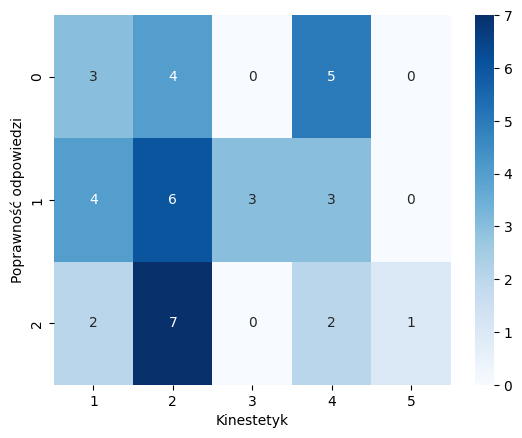

-------------------------------------
Kolekcja wszystkie grafiki:
Kinestetyk   1   2   3   4  5
corr                         
0           17  26   4  22  2
1           37  76  14  38  4
Chi2 test conducted...
Chi-squared test statistic value: 2.8675592247066337
P-value: 0.5802279894932663
Brak podstaw do odrzucenia H0.


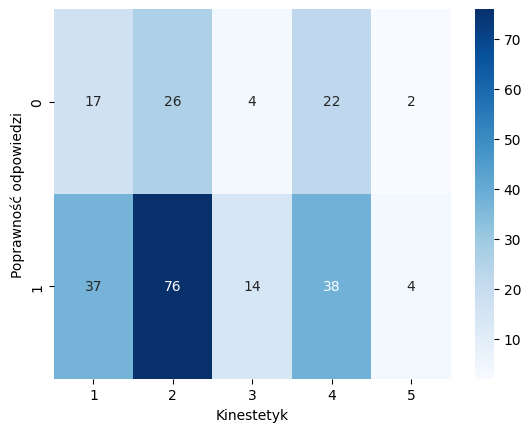

-------------------------------------
Kolekcja grafiki A:
Kinestetyk   1   2  3   4  5
corr                        
0            7  13  3  11  1
1           20  38  6  19  2
Chi2 test conducted...
Chi-squared test statistic value: 1.388564837699786
P-value: 0.8461800479638875
Brak podstaw do odrzucenia H0.


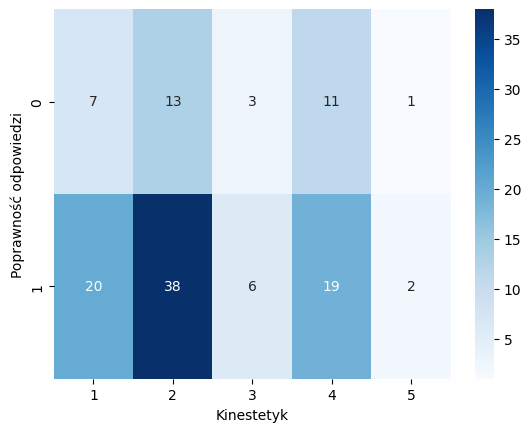

-------------------------------------
Kolekcja grafiki B:
Kinestetyk   1   2  3   4  5
corr                        
0           10  13  1  11  1
1           17  38  8  19  2
Chi2 test conducted...
Chi-squared test statistic value: 3.310509388940761
P-value: 0.5072688629590605
Brak podstaw do odrzucenia H0.


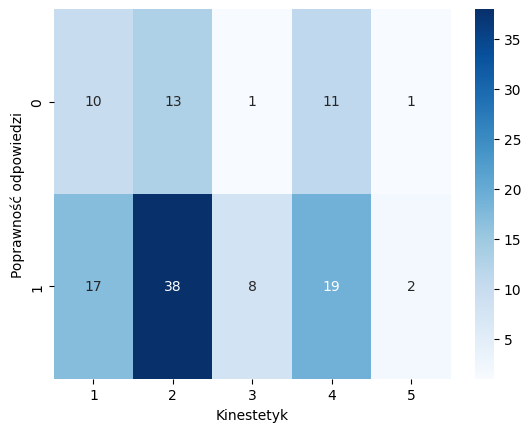

-------------------------------------
Kolekcja grafiki 1:
Kinestetyk   1   2  3   4  5
corr                        
0            2   3  0   3  0
1           16  31  6  17  2
Chi2 test conducted...
Chi-squared test statistic value: 1.521423384168482
P-value: 0.8228399289316206
Brak podstaw do odrzucenia H0.


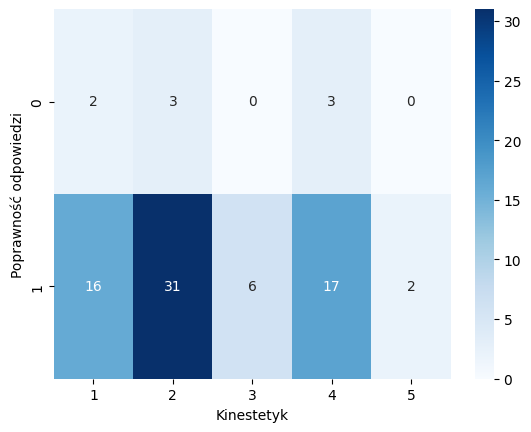

-------------------------------------
Kolekcja grafiki 2:
Kinestetyk   1   2  3   4  5
corr                        
0            5   9  1   6  2
1           13  25  5  14  0
Chi2 test conducted...
Chi-squared test statistic value: 5.493985033626977
P-value: 0.24025870610028394
Brak podstaw do odrzucenia H0.


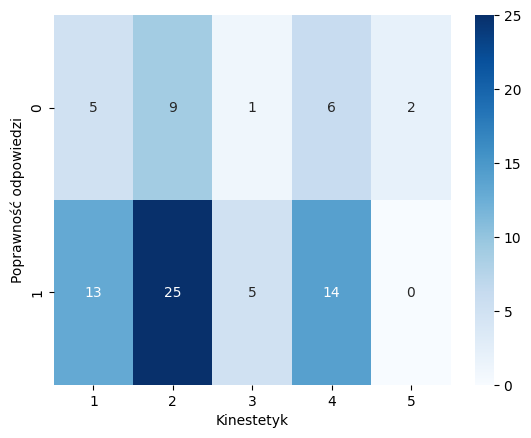

-------------------------------------
Kolekcja grafiki 3:
Kinestetyk   1   2  3   4  5
corr                        
0           10  14  3  13  0
1            8  20  3   7  2
Chi2 test conducted...
Chi-squared test statistic value: 5.081045751633987
P-value: 0.2790823290343291
Brak podstaw do odrzucenia H0.


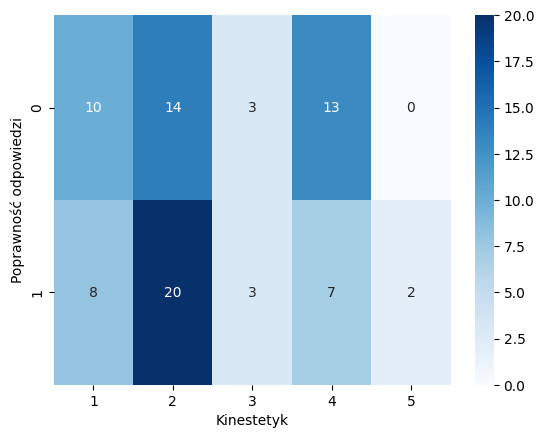

In [54]:
# kinestetyk
var = 'Kinestetyk'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', var, cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
MAT   NO_VAL  VAL
corr             
0          1    0
2          1    2
3          3    5
4          4    4
5          6    7
6          3    4
Chi2 test conducted...
Chi-squared test statistic value: 1.6698116698116698
P-value: 0.8926808101752923
Brak podstaw do odrzucenia H0.


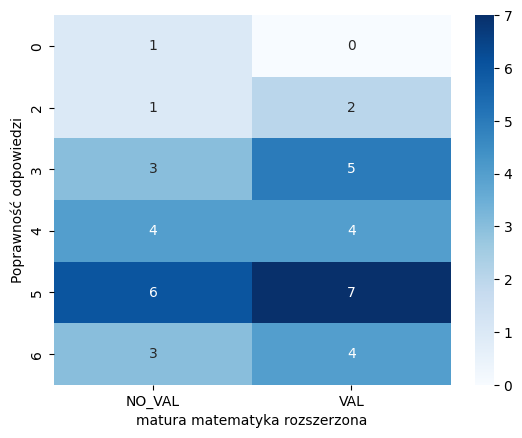

-------------------------------------
Zsumowane grafiki A:
MAT   NO_VAL  VAL
corr             
0          1    0
1          4    4
2          6   10
3          7    8
Chi2 test conducted...
Chi-squared test statistic value: 1.6835016835016834
P-value: 0.6406079569226228
Brak podstaw do odrzucenia H0.


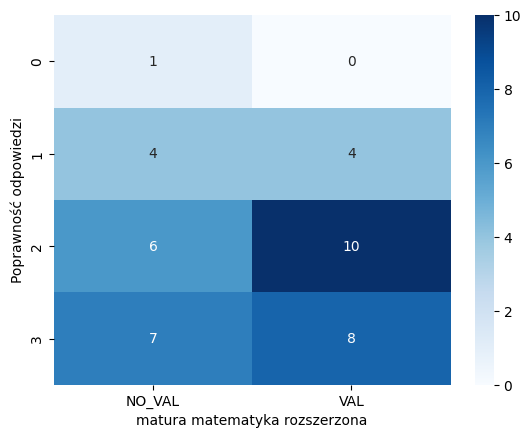

-------------------------------------
Zsumowane grafiki B:
MAT   NO_VAL  VAL
corr             
0          1    0
1          1    5
2         11   10
3          5    7
Chi2 test conducted...
Chi-squared test statistic value: 3.6844636844636853
P-value: 0.29761397694125696
Brak podstaw do odrzucenia H0.


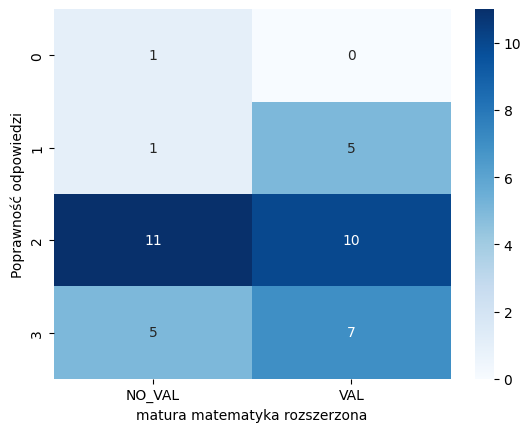

-------------------------------------
Zsumowane grafiki 1:
MAT   NO_VAL  VAL
corr             
0          1    1
1          4    0
2         13   21
Chi2 test conducted...
Chi-squared test statistic value: 5.537730243612598
P-value: 0.06273315885289603
Brak podstaw do odrzucenia H0.


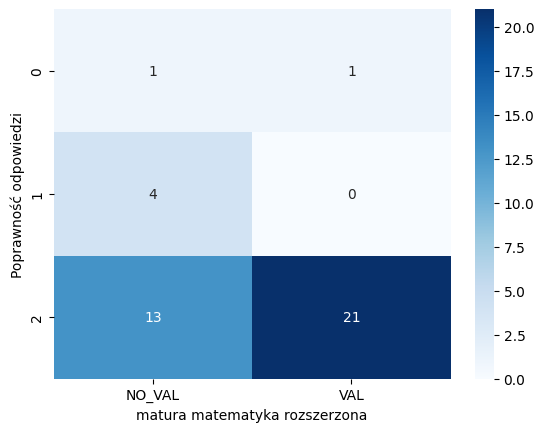

-------------------------------------
Zsumowane grafiki 2:
MAT   NO_VAL  VAL
corr             
0          3    5
1          1    6
2         14   11
Chi2 test conducted...
Chi-squared test statistic value: 4.072150072150071
P-value: 0.13054007175786164
Brak podstaw do odrzucenia H0.


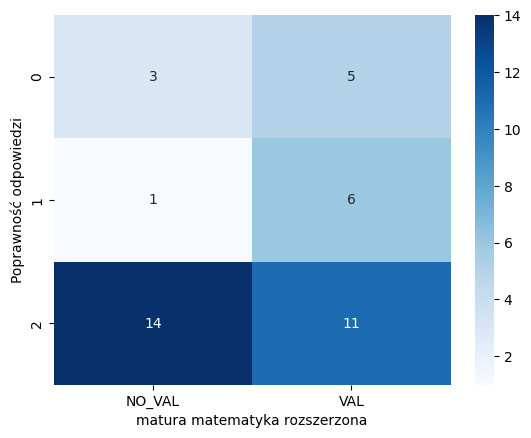

-------------------------------------
Zsumowane grafiki 3:
MAT   NO_VAL  VAL
corr             
0          6    6
1          8    8
2          4    8
Chi2 test conducted...
Chi-squared test statistic value: 0.9427609427609431
P-value: 0.6241400657984586
Brak podstaw do odrzucenia H0.


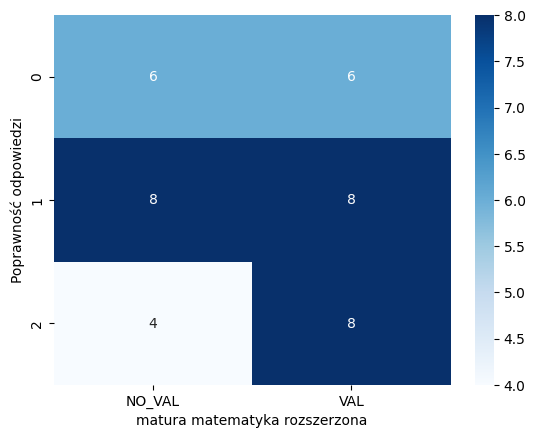

-------------------------------------
Kolekcja wszystkie grafiki:
MAT   NO_VAL  VAL
corr             
0         33   38
1         75   94
Chi2 test conducted...
Chi-squared test statistic value: 0.02444648165124859
P-value: 0.875754224881582
Brak podstaw do odrzucenia H0.


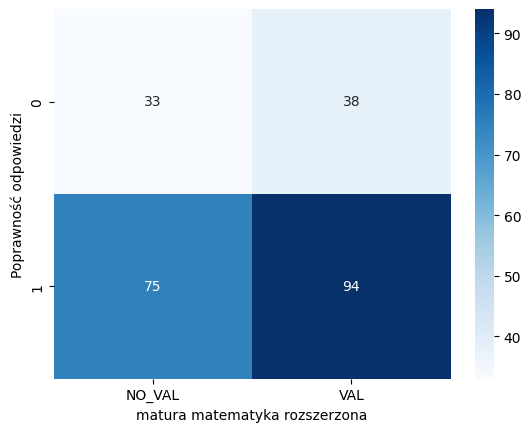

-------------------------------------
Kolekcja grafiki A:
MAT   NO_VAL  VAL
corr             
0         17   18
1         37   48
Chi2 test conducted...
Chi-squared test statistic value: 0.09167303284950343
P-value: 0.7620609186608086
Brak podstaw do odrzucenia H0.


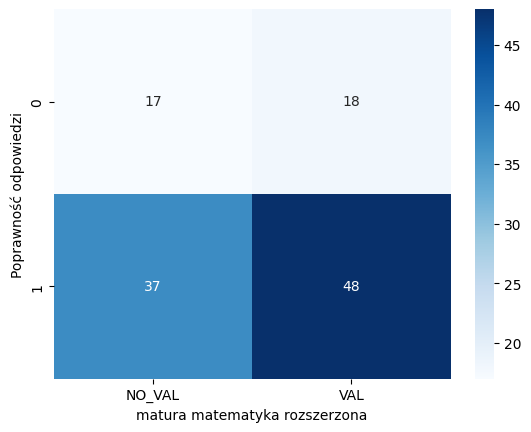

-------------------------------------
Kolekcja grafiki B:
MAT   NO_VAL  VAL
corr             
0         16   20
1         38   46
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


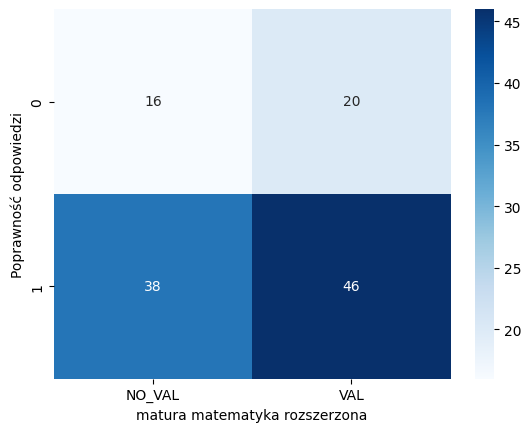

-------------------------------------
Kolekcja grafiki 1:
MAT   NO_VAL  VAL
corr             
0          6    2
1         30   42
Chi2 test conducted...
Chi-squared test statistic value: 2.025813692480359
P-value: 0.15464607153598478
Brak podstaw do odrzucenia H0.


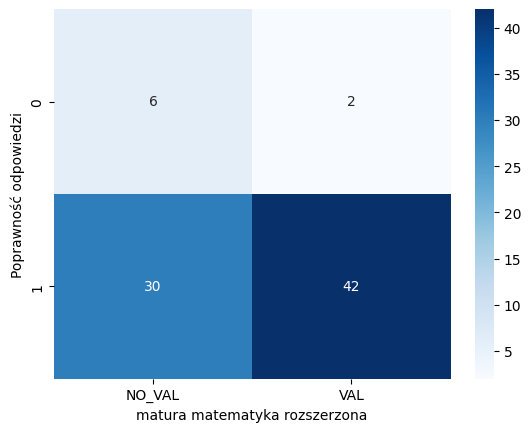

-------------------------------------
Kolekcja grafiki 2:
MAT   NO_VAL  VAL
corr             
0          7   16
1         29   28
Chi2 test conducted...
Chi-squared test statistic value: 2.002635046113307
P-value: 0.1570260201977471
Brak podstaw do odrzucenia H0.


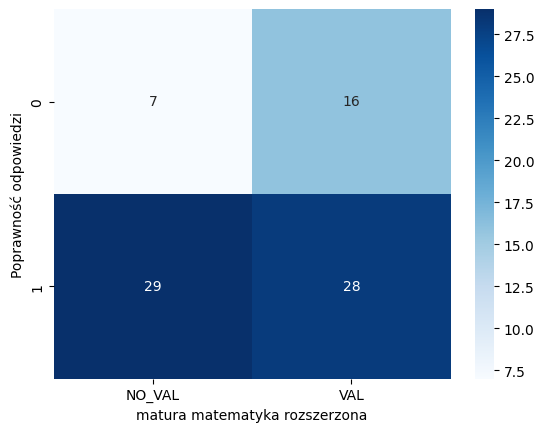

-------------------------------------
Kolekcja grafiki 3:
MAT   NO_VAL  VAL
corr             
0         20   20
1         16   24
Chi2 test conducted...
Chi-squared test statistic value: 0.4545454545454546
P-value: 0.5001842570707942
Brak podstaw do odrzucenia H0.


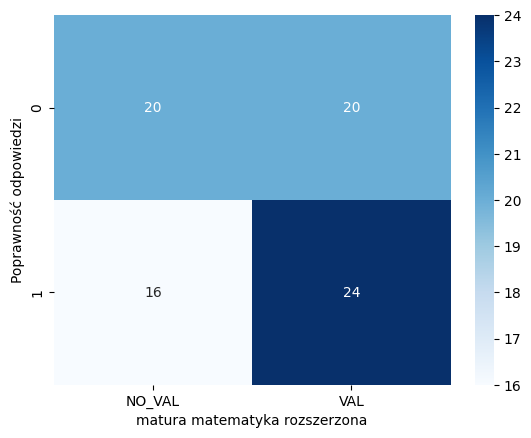

In [55]:
# MAT - pisał / nie pisał matury rozszerzonej
var = 'MAT'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'matura matematyka rozszerzona', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
POL   NO_VAL  VAL
corr             
0          1    0
2          3    0
3          6    2
4          5    3
5          9    4
6          7    0
Chi2 test conducted...
Chi-squared test statistic value: 4.764267990074441
P-value: 0.44532128745838995
Brak podstaw do odrzucenia H0.


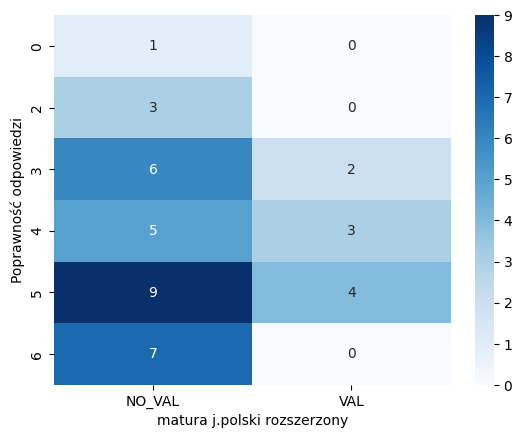

-------------------------------------
Zsumowane grafiki A:
POL   NO_VAL  VAL
corr             
0          1    0
1          6    2
2         11    5
3         13    2
Chi2 test conducted...
Chi-squared test statistic value: 1.7443249701314216
P-value: 0.6271247147520325
Brak podstaw do odrzucenia H0.


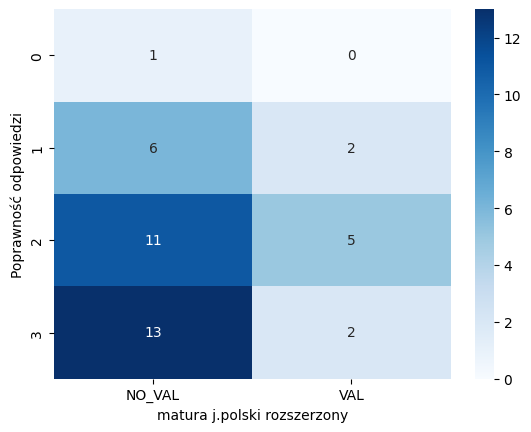

-------------------------------------
Zsumowane grafiki B:
POL   NO_VAL  VAL
corr             
0          1    0
1          6    0
2         14    7
3         10    2
Chi2 test conducted...
Chi-squared test statistic value: 3.6798088410991636
P-value: 0.2981793034790027
Brak podstaw do odrzucenia H0.


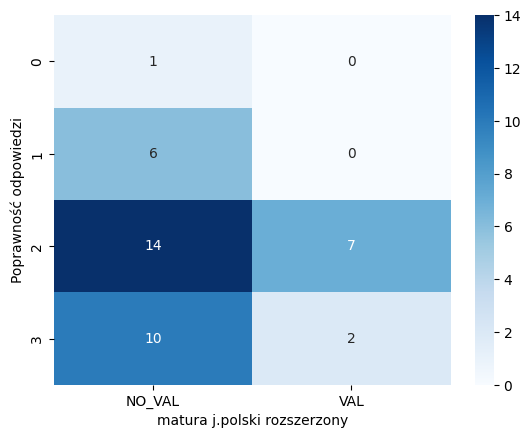

-------------------------------------
Zsumowane grafiki 1:
POL   NO_VAL  VAL
corr             
0          2    0
1          3    1
2         26    8
Chi2 test conducted...
Chi-squared test statistic value: 0.6156441071052074
P-value: 0.7350461052152598
Brak podstaw do odrzucenia H0.


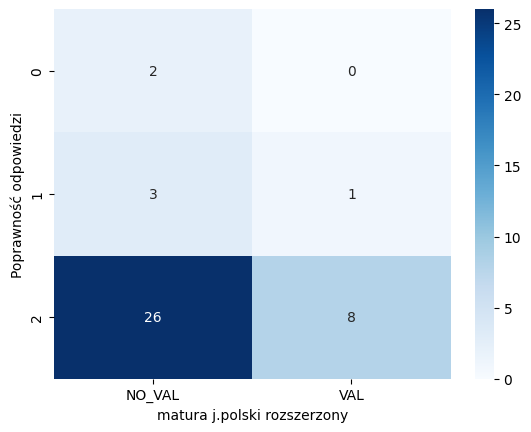

-------------------------------------
Zsumowane grafiki 2:
POL   NO_VAL  VAL
corr             
0          6    2
1          4    3
2         21    4
Chi2 test conducted...
Chi-squared test statistic value: 2.2980030721966207
P-value: 0.31695307764814207
Brak podstaw do odrzucenia H0.


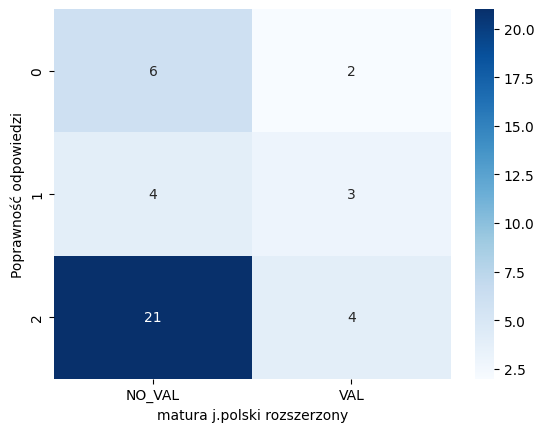

-------------------------------------
Zsumowane grafiki 3:
POL   NO_VAL  VAL
corr             
0         10    2
1         12    4
2          9    3
Chi2 test conducted...
Chi-squared test statistic value: 0.33452807646356025
P-value: 0.8459762117823874
Brak podstaw do odrzucenia H0.


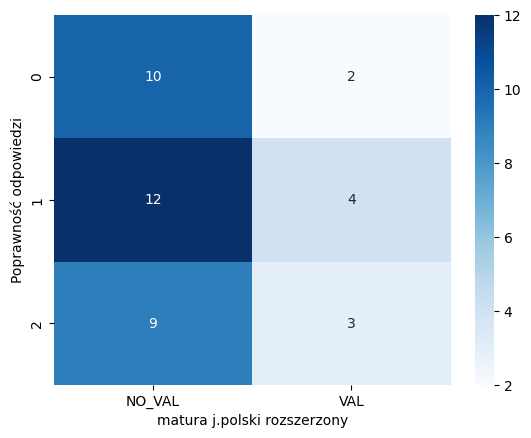

-------------------------------------
Kolekcja wszystkie grafiki:
POL   NO_VAL  VAL
corr             
0         55   16
1        131   38
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


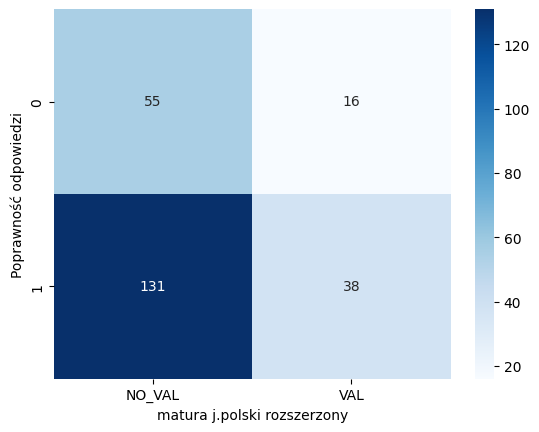

-------------------------------------
Kolekcja grafiki A:
POL   NO_VAL  VAL
corr             
0         26    9
1         67   18
Chi2 test conducted...
Chi-squared test statistic value: 0.09035872413481522
P-value: 0.7637216066071921
Brak podstaw do odrzucenia H0.


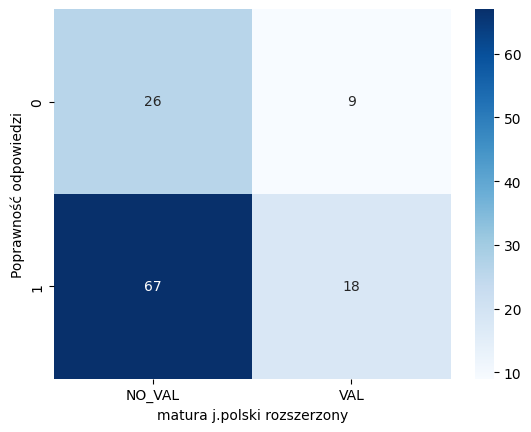

-------------------------------------
Kolekcja grafiki B:
POL   NO_VAL  VAL
corr             
0         29    7
1         64   20
Chi2 test conducted...
Chi-squared test statistic value: 0.0819252432155658
P-value: 0.7747051381143539
Brak podstaw do odrzucenia H0.


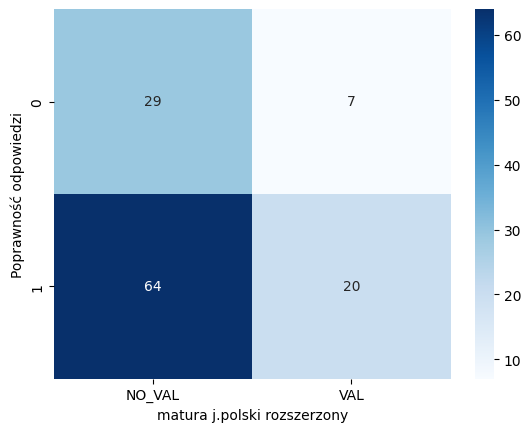

-------------------------------------
Kolekcja grafiki 1:
POL   NO_VAL  VAL
corr             
0          7    1
1         55   17
Chi2 test conducted...
Chi-squared test statistic value: 0.07168458781362007
P-value: 0.7888996301320101
Brak podstaw do odrzucenia H0.


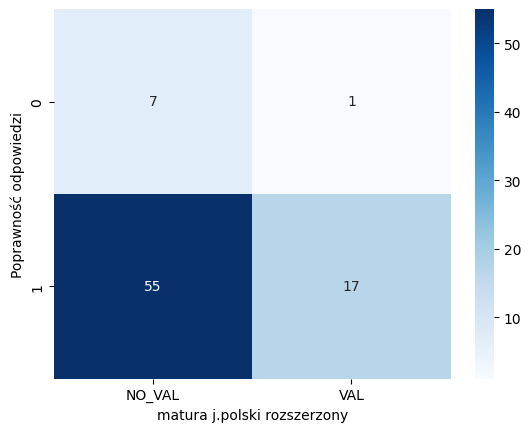

-------------------------------------
Kolekcja grafiki 2:
POL   NO_VAL  VAL
corr             
0         16    7
1         46   11
Chi2 test conducted...
Chi-squared test statistic value: 0.6143768334659307
P-value: 0.4331445982393306
Brak podstaw do odrzucenia H0.


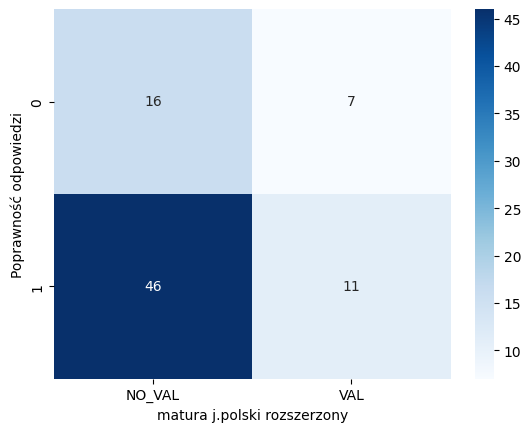

-------------------------------------
Kolekcja grafiki 3:
POL   NO_VAL  VAL
corr             
0         32    8
1         30   10
Chi2 test conducted...
Chi-squared test statistic value: 0.07168458781362007
P-value: 0.7888996301320101
Brak podstaw do odrzucenia H0.


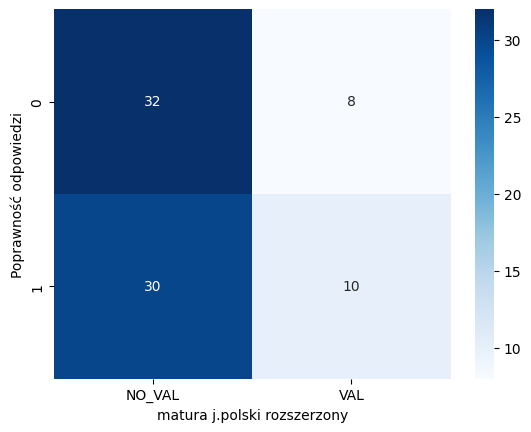

In [56]:
# POL - pisał / nie pisał matury rozszerzonej
var = 'POL'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'matura j.polski rozszerzony', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
HIST  NO_VAL  VAL
corr             
0          1    0
2          3    0
3          8    0
4          7    1
5         11    2
6          6    1
Chi2 test conducted...
Chi-squared test statistic value: 1.9505494505494503
P-value: 0.8559442969077931
Brak podstaw do odrzucenia H0.


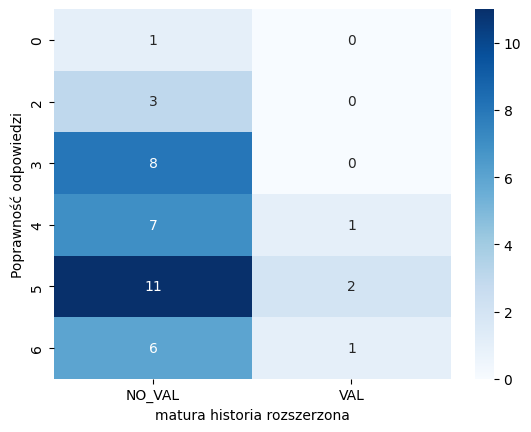

-------------------------------------
Zsumowane grafiki A:
HIST  NO_VAL  VAL
corr             
0          1    0
1          8    0
2         15    1
3         12    3
Chi2 test conducted...
Chi-squared test statistic value: 2.916666666666667
P-value: 0.40465279495160555
Brak podstaw do odrzucenia H0.


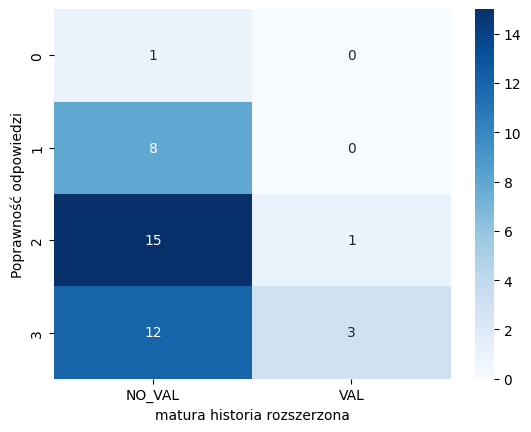

-------------------------------------
Zsumowane grafiki B:
HIST  NO_VAL  VAL
corr             
0          1    0
1          6    0
2         18    3
3         11    1
Chi2 test conducted...
Chi-squared test statistic value: 1.243386243386243
P-value: 0.7426183968451716
Brak podstaw do odrzucenia H0.


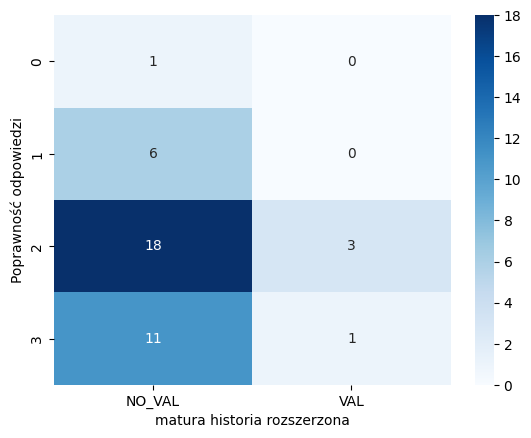

-------------------------------------
Zsumowane grafiki 1:
HIST  NO_VAL  VAL
corr             
0          2    0
1          4    0
2         30    4
Chi2 test conducted...
Chi-squared test statistic value: 0.7843137254901963
P-value: 0.6755981294711624
Brak podstaw do odrzucenia H0.


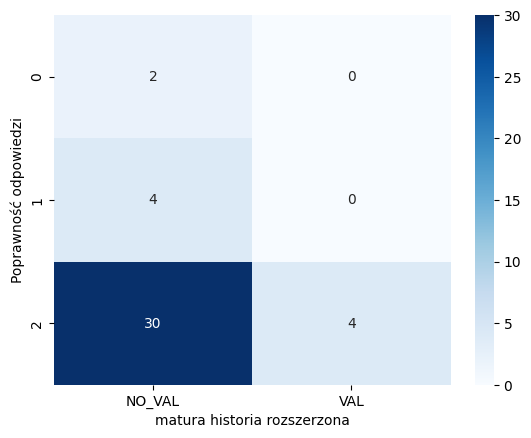

-------------------------------------
Zsumowane grafiki 2:
HIST  NO_VAL  VAL
corr             
0          8    0
1          5    2
2         23    2
Chi2 test conducted...
Chi-squared test statistic value: 3.682539682539683
P-value: 0.15861588117699757
Brak podstaw do odrzucenia H0.


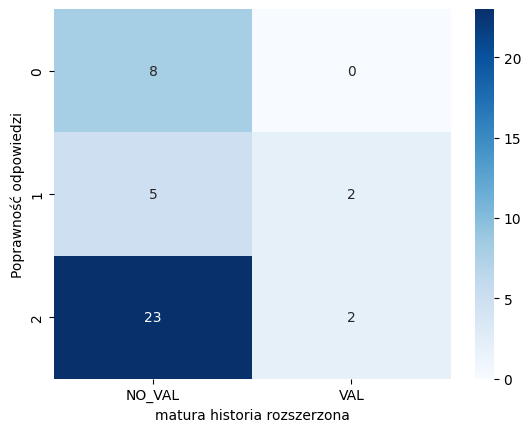

-------------------------------------
Zsumowane grafiki 3:
HIST  NO_VAL  VAL
corr             
0         12    0
1         14    2
2         10    2
Chi2 test conducted...
Chi-squared test statistic value: 2.0370370370370368
P-value: 0.3611295508093596
Brak podstaw do odrzucenia H0.


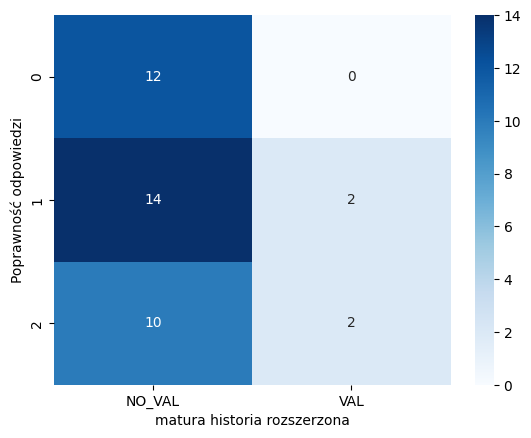

-------------------------------------
Kolekcja wszystkie grafiki:
HIST  NO_VAL  VAL
corr             
0         67    4
1        149   20
Chi2 test conducted...
Chi-squared test statistic value: 1.502347417840376
P-value: 0.2203105263400509
Brak podstaw do odrzucenia H0.


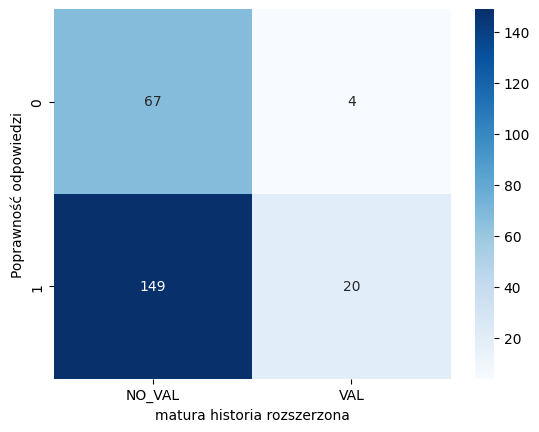

-------------------------------------
Kolekcja grafiki A:
HIST  NO_VAL  VAL
corr             
0         34    1
1         74   11
Chi2 test conducted...
Chi-squared test statistic value: 1.7927170868347337
P-value: 0.18059546318411923
Brak podstaw do odrzucenia H0.


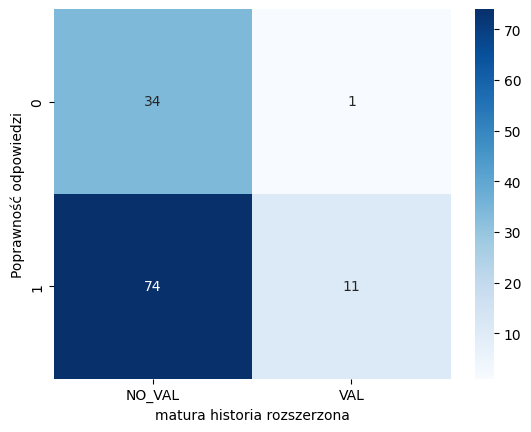

-------------------------------------
Kolekcja grafiki B:
HIST  NO_VAL  VAL
corr             
0         33    3
1         75    9
Chi2 test conducted...
Chi-squared test statistic value: 0.004409171075837733
P-value: 0.9470581048335003
Brak podstaw do odrzucenia H0.


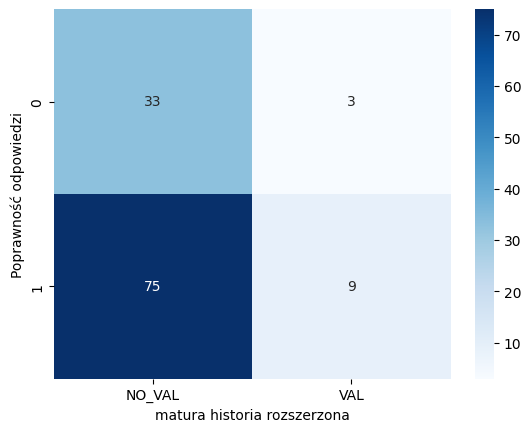

-------------------------------------
Kolekcja grafiki 1:
HIST  NO_VAL  VAL
corr             
0          8    0
1         64    8
Chi2 test conducted...
Chi-squared test statistic value: 0.13888888888888887
P-value: 0.7093881150142265
Brak podstaw do odrzucenia H0.


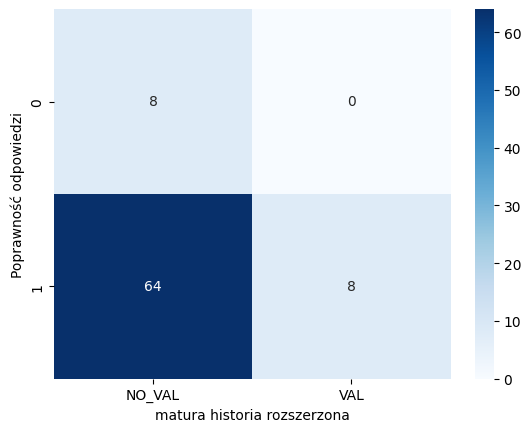

-------------------------------------
Kolekcja grafiki 2:
HIST  NO_VAL  VAL
corr             
0         21    2
1         51    6
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


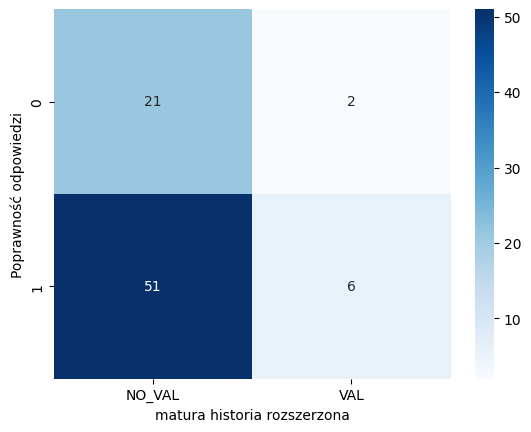

-------------------------------------
Kolekcja grafiki 3:
HIST  NO_VAL  VAL
corr             
0         38    2
1         34    6
Chi2 test conducted...
Chi-squared test statistic value: 1.25
P-value: 0.26355247728296954
Brak podstaw do odrzucenia H0.


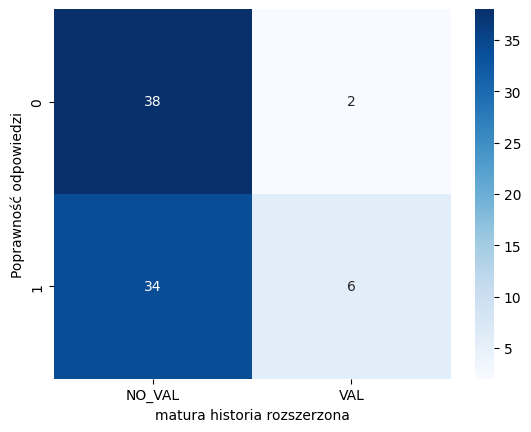

In [57]:
# HIST - pisał / nie pisał matury rozszerzonej
var = 'HIST'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'matura historia rozszerzona', cmap='Blues')

-------------------------------------
Zsumowane wszystkie grafiki:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                            0           0           1           0
2                            1           0           0           2
3                            1           0           1           6
4                            2           2           2           2
5                            3           0           2           8
6                            3           0           0           4
Chi2 test conducted...
Chi-squared test statistic value: 19.252081252081254
P-value: 0.20253723959819042
Brak podstaw do odrzucenia H0.


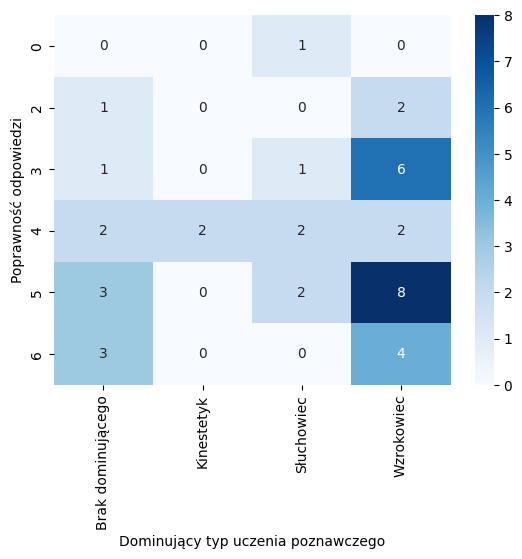

-------------------------------------
Zsumowane grafiki A:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                            0           0           1           0
1                            2           0           0           6
2                            3           2           3           8
3                            5           0           2           8
Chi2 test conducted...
Chi-squared test statistic value: 11.323232323232324
P-value: 0.2542019899048208
Brak podstaw do odrzucenia H0.


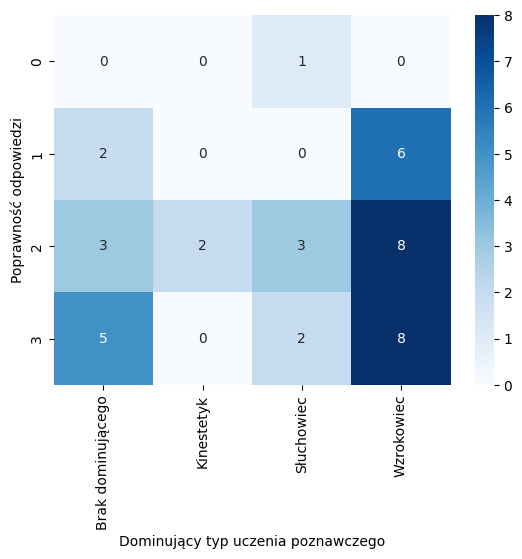

-------------------------------------
Zsumowane grafiki B:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                            0           0           1           0
1                            1           0           1           4
2                            5           2           4          10
3                            4           0           0           8
Chi2 test conducted...
Chi-squared test statistic value: 10.632034632034634
P-value: 0.3017763607028858
Brak podstaw do odrzucenia H0.


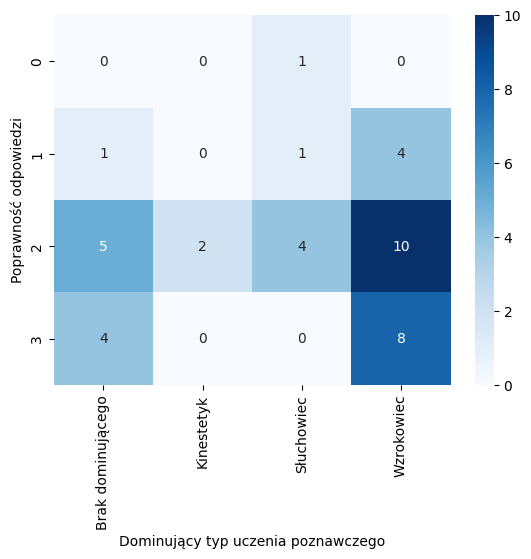

-------------------------------------
Zsumowane grafiki 1:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                            0           0           1           1
1                            1           0           0           3
2                            9           2           5          18
Chi2 test conducted...
Chi-squared test statistic value: 3.4438502673796787
P-value: 0.7514245695071212
Brak podstaw do odrzucenia H0.


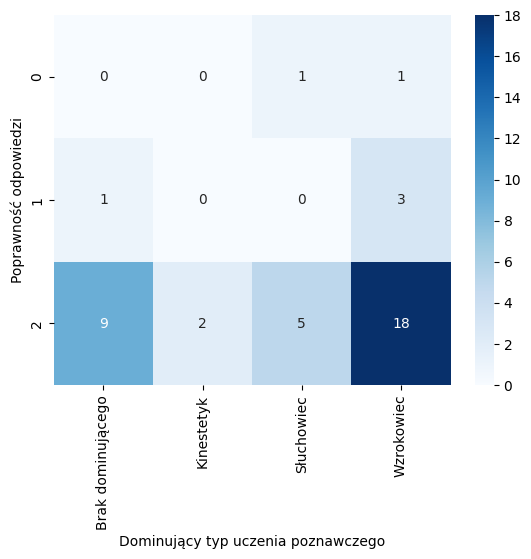

-------------------------------------
Zsumowane grafiki 2:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                            1           1           2           4
1                            1           0           3           3
2                            8           1           1          15
Chi2 test conducted...
Chi-squared test statistic value: 9.12051948051948
P-value: 0.1669127317577771
Brak podstaw do odrzucenia H0.


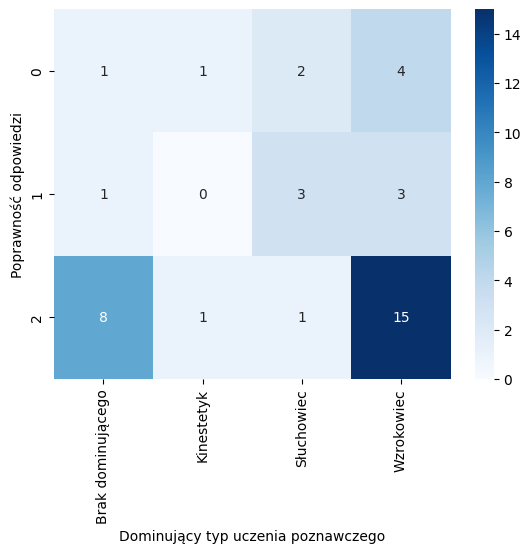

-------------------------------------
Zsumowane grafiki 3:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                            3           1           2           6
1                            4           0           2          10
2                            3           1           2           6
Chi2 test conducted...
Chi-squared test statistic value: 1.717171717171717
P-value: 0.9437878960666664
Brak podstaw do odrzucenia H0.


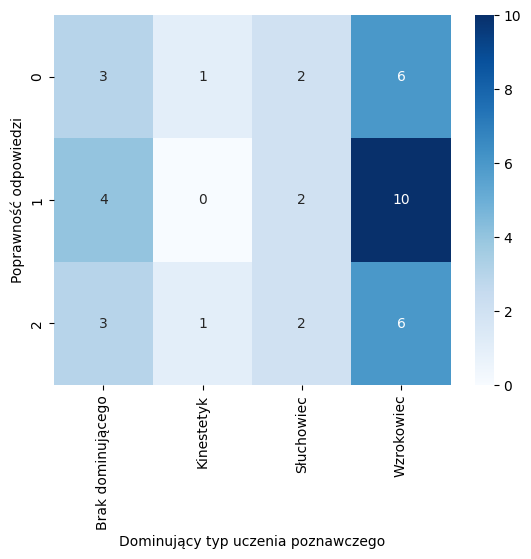

-------------------------------------
Kolekcja wszystkie grafiki:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                           14           4          15          38
1                           46           8          21          94
Chi2 test conducted...
Chi-squared test statistic value: 3.7694050261764236
P-value: 0.2874649521033126
Brak podstaw do odrzucenia H0.


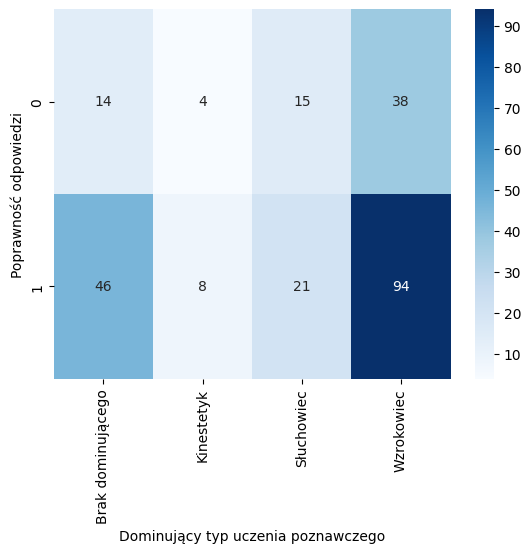

-------------------------------------
Kolekcja grafiki A:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                            7           2           6          20
1                           23           4          12          46
Chi2 test conducted...
Chi-squared test statistic value: 0.7370511841100076
P-value: 0.8644564416334991
Brak podstaw do odrzucenia H0.


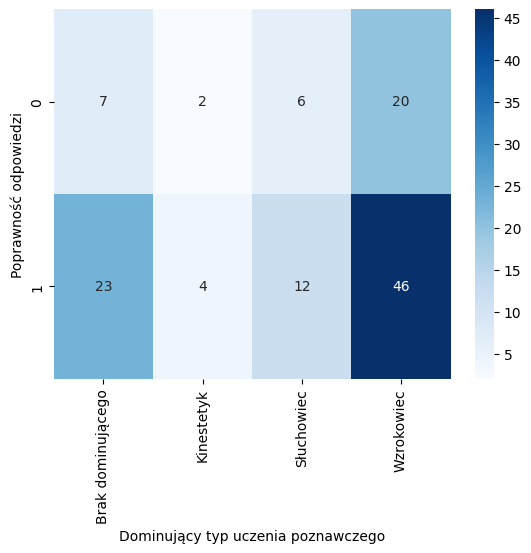

-------------------------------------
Kolekcja grafiki B:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                            7           2           9          18
1                           23           4           9          48
Chi2 test conducted...
Chi-squared test statistic value: 4.329004329004328
P-value: 0.22805930483659567
Brak podstaw do odrzucenia H0.


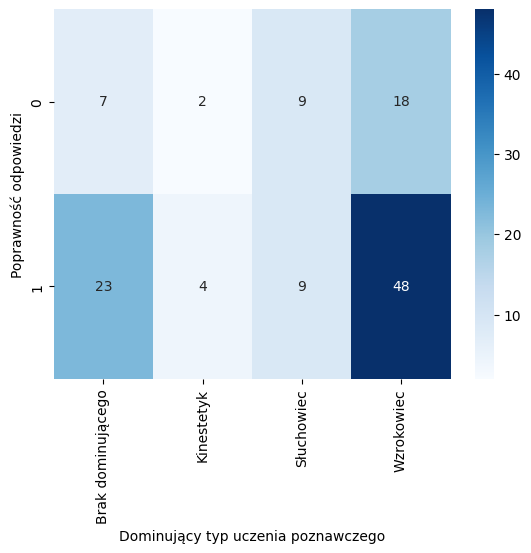

-------------------------------------
Kolekcja grafiki 1:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                            1           0           2           5
1                           19           4          10          39
Chi2 test conducted...
Chi-squared test statistic value: 1.6835016835016836
P-value: 0.6406079569226228
Brak podstaw do odrzucenia H0.


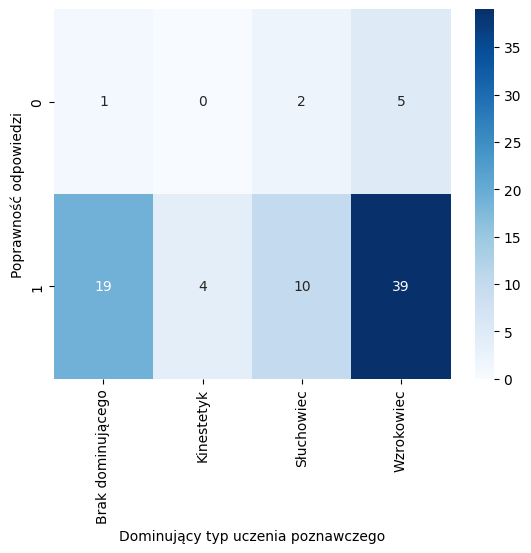

-------------------------------------
Kolekcja grafiki 2:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                            3           2           7          11
1                           17           2           5          33
Chi2 test conducted...
Chi-squared test statistic value: 8.156623442664632
P-value: 0.0428832801041348
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


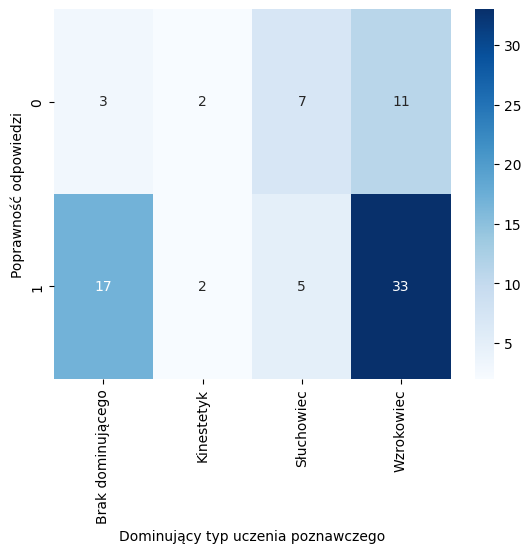

-------------------------------------
Kolekcja grafiki 3:
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
corr                                                              
0                           10           2           6          22
1                           10           2           6          22
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


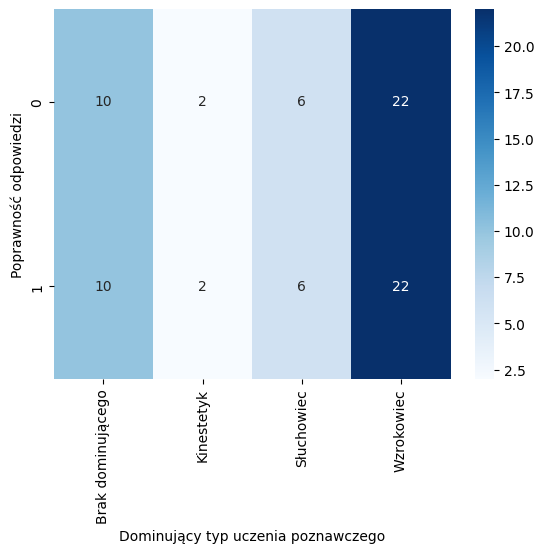

In [58]:
# dominujący typ uczenia poznawczego
var = 'Typ_uczenia'
for i, df in enumerate(dfs):
    print('-------------------------------------')
    print(names[i + 1])
    two_categorical_variable_test(df, 'corr', var, ALPHA)
    plot_heatmap(df, 'corr', var, 'Poprawność odpowiedzi', 'Dominujący typ uczenia poznawczego', cmap='Blues')

In [59]:
posthocNemenyi_test(df_coll2, 'corr', var, ALPHA)

+-------------------+--------------+---------------------+--------------+--------------+
|                   |   Kinestetyk |   Brak dominującego |   Wzrokowiec |   Słuchowiec |
+===================+==============+=====================+==============+==============+
| Kinestetyk        |     1        |            0.113602 |     0.000487 |     0.752539 |
+-------------------+--------------+---------------------+--------------+--------------+
| Brak dominującego |     0.113602 |            1        |     0.016238 |     0.293512 |
+-------------------+--------------+---------------------+--------------+--------------+
| Wzrokowiec        |     0.000487 |            0.016238 |     1        |     3.6e-05  |
+-------------------+--------------+---------------------+--------------+--------------+
| Słuchowiec        |     0.752539 |            0.293512 |     3.6e-05  |     1        |
+-------------------+--------------+---------------------+--------------+--------------+


Podsumowanie - poprawność:
Istotne statystycznie:
- rok urodzenia: dla kolekcji grafik 1 (2001 vs 2003, 2003 vs 2002, 2003 vs 2000,  2003 vs 2004)
- kierunek studiów: zsumowane grafiki 3, grafiki 3 kolekcja (geografia vs geografia w ramach MISMaP --> na korzyść MISMaP, geografia vs gospodarka przestrzenna)
- ilość snu: dla kolekcji grafik 2 (8 vs 6, 8< vs 6, 6> vs 8, 6> vs 8<) !!!
- matura podstawowa mat: dla kolekcji grafik 3 (90-100% vs pozostałe wyniki) !!!
- samopoczucie: zsumowane grafiki, zsumowane grafiki A, zsumowane grafiki 3, kolekcje: grafiki wszystkie, grafiki A, grafiki 3 --> test postHoc wykazuje różnice między 4 vs pozostałe dla większości oraz 2 vs 5 dla kolekcji wszystkich grafik
- stres: kolekcje wszystkie grafiki, grafiki A, grafiki 1, zsumowane grafiki 1, A, B (między zsumowanymi A i B słabo różnicuje, pozostałe to przede wszystkim 2 vs pozostałe)
- spostrzegawczość: kolekcja wszystkie grafiki (4 vs pozostałe)
- słuchowiec: zsumowane grafiki 2 (słabo się różnicuje), kolekcja grafiki 2 (3 vs 1, 4, 5)
- dominujący typ uczenia poznawczego: kolekcja grafiki 2 (wzrokowiec vs reszta) !!!


Każda grafika osobno:

In [62]:
columns = ['Płeć', 'Rok_urodzenia', 'Kierunek_studiów',
       'Rok_studiów', 'Specjalność', 'Wady_wzroku', 'Ilość_snu',
       'JP_podst', 'MAT_podst', 'JP_roz', 'MAT_roz', 'FIZ_roz', 'HIST_roz',
       'Samopocz', 'Stres', 'Zmęcz', 'Czyt_map', 'Podziel_uwg', 'Analit_myśl',
       'Spostrzeg', 'Czyt_ze_zroz', 'Wzrokowiec', 'Słuchowiec', 'Kinestetyk', 'MAT', 'POL', 'HIST', 'Typ_uczenia']

prefix = ['1a', '1b', '2a', '2b', '3a', '3b']

##############################################################
Płeć
-------------------------------------
1a
Płeć      K   M
1a_corr        
0         5   0
1        18  17
Chi2 test conducted...
Chi-squared test statistic value: 2.469857508220679
P-value: 0.11604844466509685
Brak podstaw do odrzucenia H0.


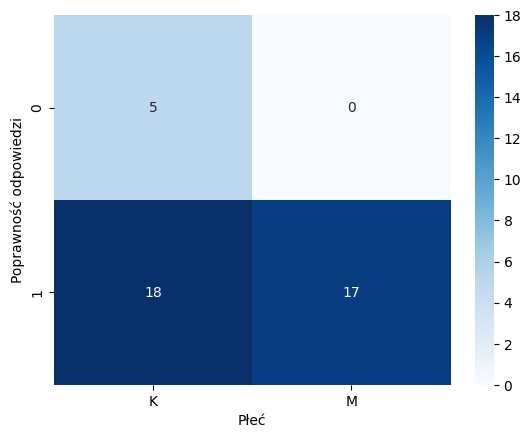

-------------------------------------
1b
Płeć      K   M
1b_corr        
0         2   1
1        21  16
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


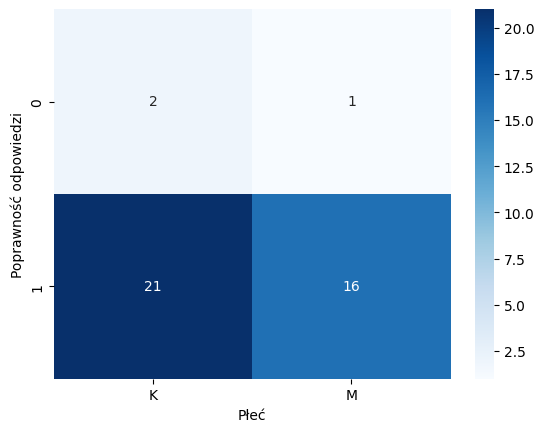

-------------------------------------
2a
Płeć      K   M
2a_corr        
0         7   5
1        16  12
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


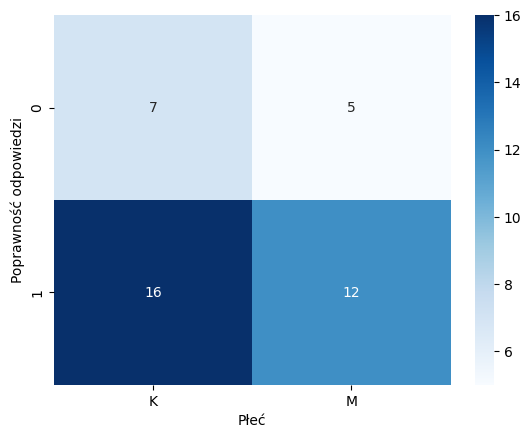

-------------------------------------
2b
Płeć      K   M
2b_corr        
0         5   6
1        18  11
Chi2 test conducted...
Chi-squared test statistic value: 0.34923714613281587
P-value: 0.5545452810908396
Brak podstaw do odrzucenia H0.


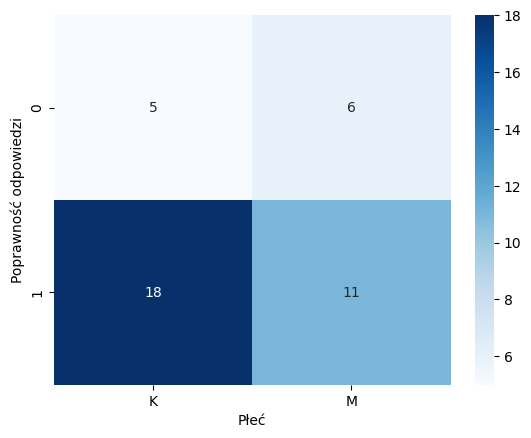

-------------------------------------
3a
Płeć      K   M
3a_corr        
0        12   6
1        11  11
Chi2 test conducted...
Chi-squared test statistic value: 0.5466428995840764
P-value: 0.45969265720952424
Brak podstaw do odrzucenia H0.


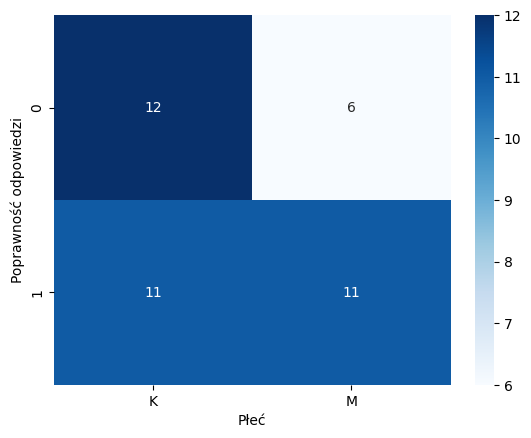

-------------------------------------
3b
Płeć      K   M
3b_corr        
0        15   7
1         8  10
Chi2 test conducted...
Chi-squared test statistic value: 1.4146580898499053
P-value: 0.23428466034628473
Brak podstaw do odrzucenia H0.


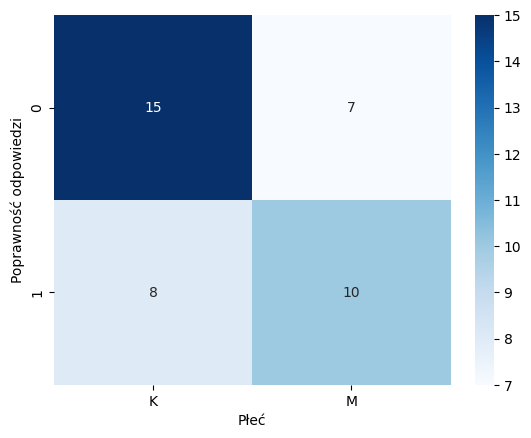

##############################################################
Rok_urodzenia
-------------------------------------
1a
Rok_urodzenia  2000  2001  2002  2003  2004
1a_corr                                    
0                 0     3     1     1     0
1                 1     5    10    16     3
Chi2 test conducted...
Chi-squared test statistic value: 5.9404125286478235
P-value: 0.203642715501022
Brak podstaw do odrzucenia H0.


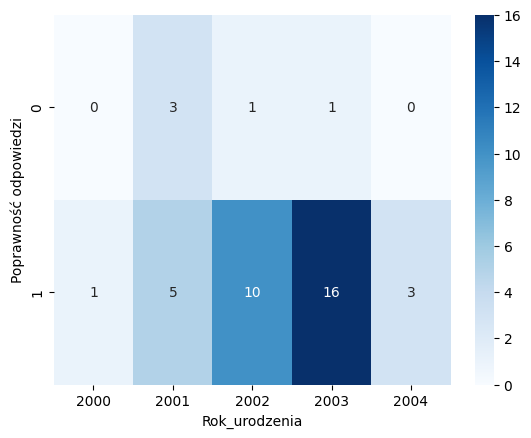

-------------------------------------
1b
Rok_urodzenia  2000  2001  2002  2003  2004
1b_corr                                    
0                 0     2     0     1     0
1                 1     6    11    16     3
Chi2 test conducted...
Chi-squared test statistic value: 4.811870694223635
P-value: 0.30715101490609376
Brak podstaw do odrzucenia H0.


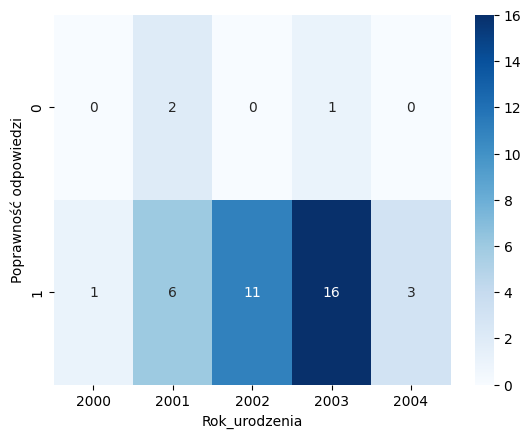

-------------------------------------
2a
Rok_urodzenia  2000  2001  2002  2003  2004
2a_corr                                    
0                 0     2     4     6     0
1                 1     6     7    11     3
Chi2 test conducted...
Chi-squared test statistic value: 2.248535777947543
P-value: 0.6901538958509185
Brak podstaw do odrzucenia H0.


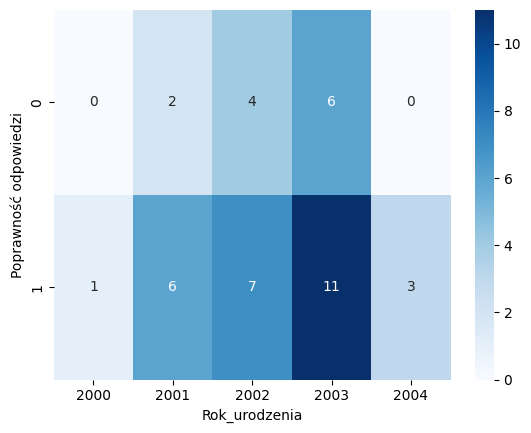

-------------------------------------
2b
Rok_urodzenia  2000  2001  2002  2003  2004
2b_corr                                    
0                 0     2     4     5     0
1                 1     6     7    12     3
Chi2 test conducted...
Chi-squared test statistic value: 2.006940137126381
P-value: 0.734482318016528
Brak podstaw do odrzucenia H0.


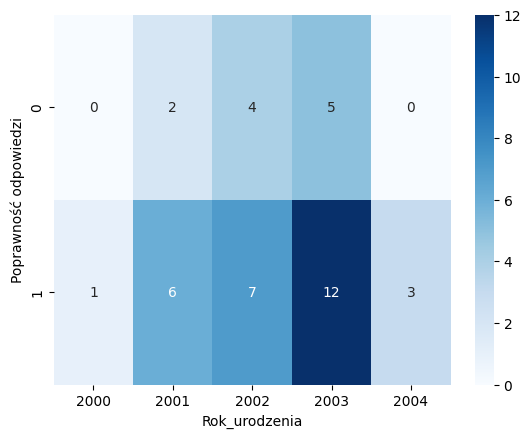

-------------------------------------
3a
Rok_urodzenia  2000  2001  2002  2003  2004
3a_corr                                    
0                 0     3     4    11     0
1                 1     5     7     6     3
Chi2 test conducted...
Chi-squared test statistic value: 6.453303084319127
P-value: 0.16775654958304373
Brak podstaw do odrzucenia H0.


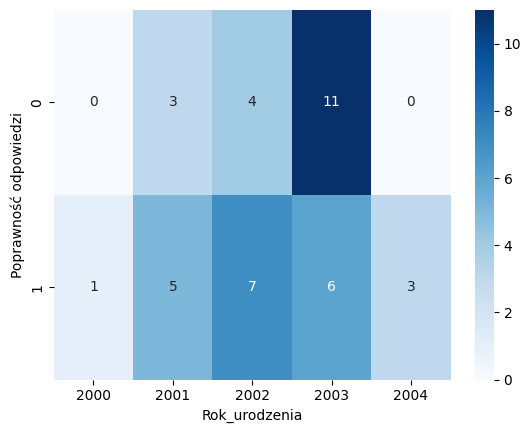

-------------------------------------
3b
Rok_urodzenia  2000  2001  2002  2003  2004
3b_corr                                    
0                 1     5     7     8     1
1                 0     3     4     9     2
Chi2 test conducted...
Chi-squared test statistic value: 2.333675435279713
P-value: 0.6746448424458531
Brak podstaw do odrzucenia H0.


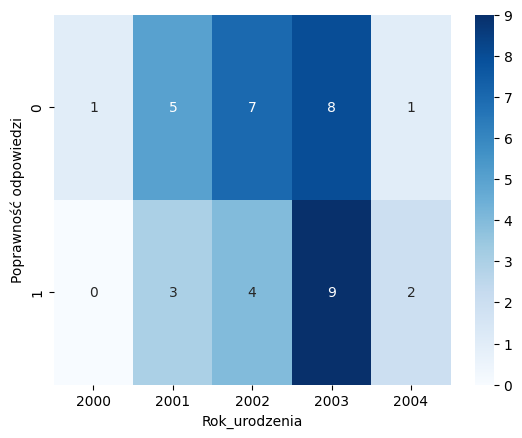

##############################################################
Kierunek_studiów
-------------------------------------
1a
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
1a_corr                                                               
0                         5                        0                 0
1                        27                        5                 3
Chi2 test conducted...
Chi-squared test statistic value: 1.4285714285714286
P-value: 0.48954165955695306
Brak podstaw do odrzucenia H0.


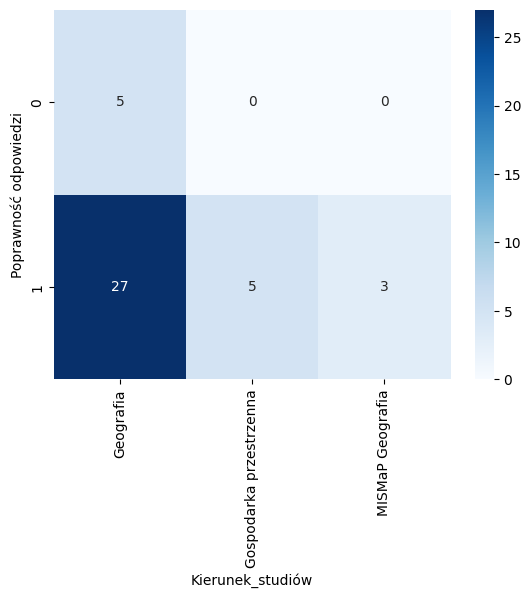

-------------------------------------
1b
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
1b_corr                                                               
0                         3                        0                 0
1                        29                        5                 3
Chi2 test conducted...
Chi-squared test statistic value: 0.8108108108108109
P-value: 0.6667064696566672
Brak podstaw do odrzucenia H0.


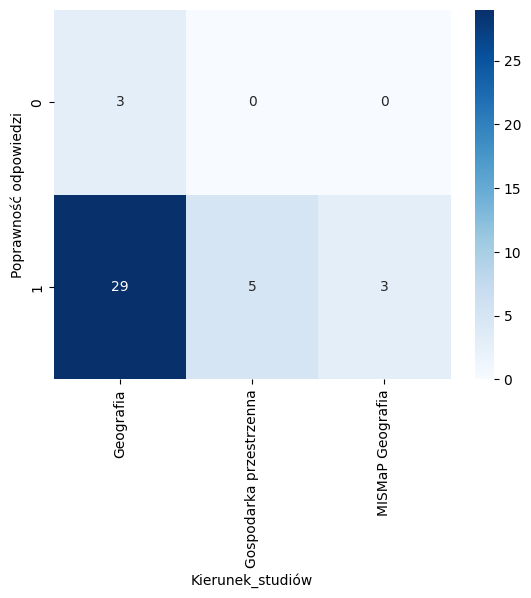

-------------------------------------
2a
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
2a_corr                                                               
0                         9                        2                 1
1                        23                        3                 2
Chi2 test conducted...
Chi-squared test statistic value: 0.30753968253968256
P-value: 0.857469352359109
Brak podstaw do odrzucenia H0.


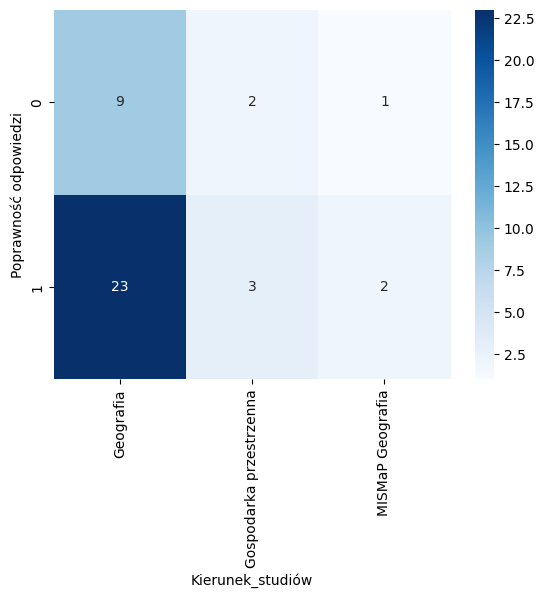

-------------------------------------
2b
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
2b_corr                                                               
0                         7                        2                 2
1                        25                        3                 1
Chi2 test conducted...
Chi-squared test statistic value: 3.207941483803553
P-value: 0.20109642855639676
Brak podstaw do odrzucenia H0.


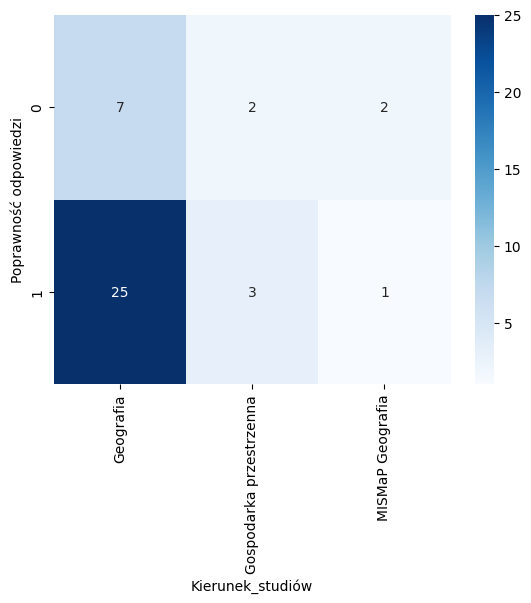

-------------------------------------
3a
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
3a_corr                                                               
0                        15                        3                 0
1                        17                        2                 3
Chi2 test conducted...
Chi-squared test statistic value: 2.954545454545455
P-value: 0.22825936579963474
Brak podstaw do odrzucenia H0.


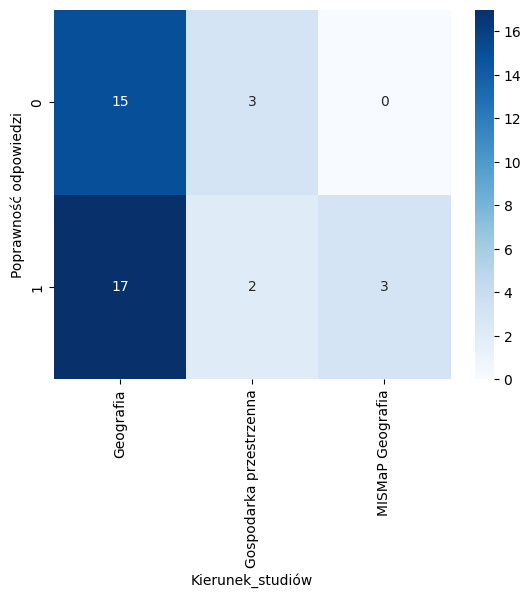

-------------------------------------
3b
Kierunek_studiów  Geografia  Gospodarka przestrzenna  MISMaP Geografia
3b_corr                                                               
0                        19                        3                 0
1                        13                        2                 3
Chi2 test conducted...
Chi-squared test statistic value: 3.9646464646464636
P-value: 0.13774884271557652
Brak podstaw do odrzucenia H0.


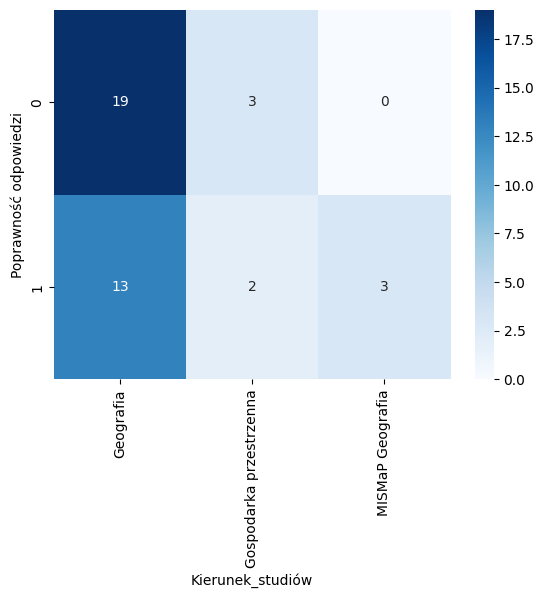

##############################################################
Rok_studiów
-------------------------------------
1a
Rok_studiów   1  2  3
1a_corr              
0             3  0  2
1            20  8  7
Chi2 test conducted...
Chi-squared test statistic value: 1.9268461007591442
P-value: 0.38158446500947457
Brak podstaw do odrzucenia H0.


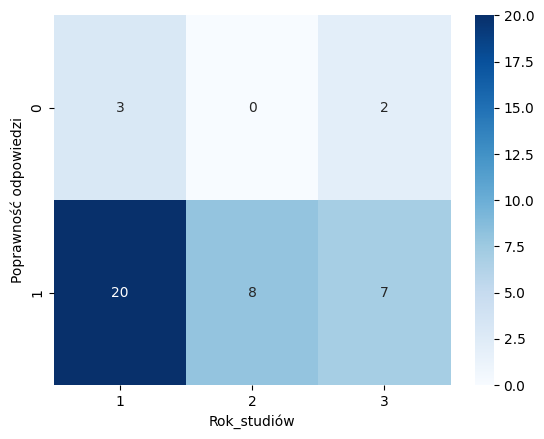

-------------------------------------
1b
Rok_studiów   1  2  3
1b_corr              
0             2  0  1
1            21  8  8
Chi2 test conducted...
Chi-squared test statistic value: 0.8652130391260824
P-value: 0.6488157378845619
Brak podstaw do odrzucenia H0.


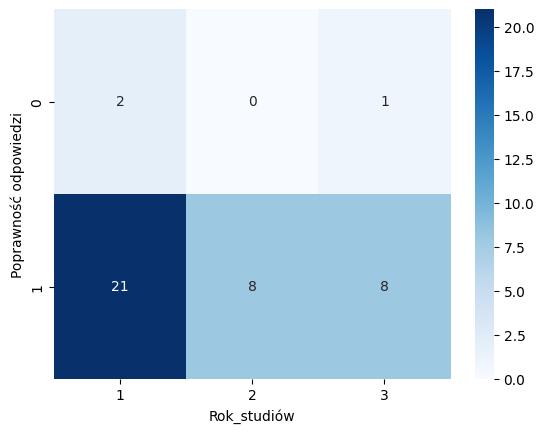

-------------------------------------
2a
Rok_studiów   1  2  3
2a_corr              
0             8  3  1
1            15  5  8
Chi2 test conducted...
Chi-squared test statistic value: 1.993903841729929
P-value: 0.3690024775025993
Brak podstaw do odrzucenia H0.


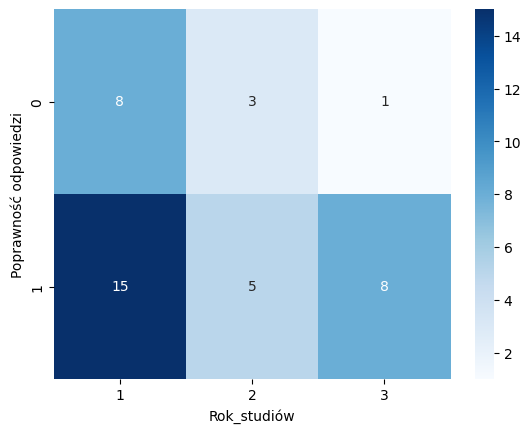

-------------------------------------
2b
Rok_studiów   1  2  3
2b_corr              
0             7  3  1
1            16  5  8
Chi2 test conducted...
Chi-squared test statistic value: 1.713082852513137
P-value: 0.424628153380916
Brak podstaw do odrzucenia H0.


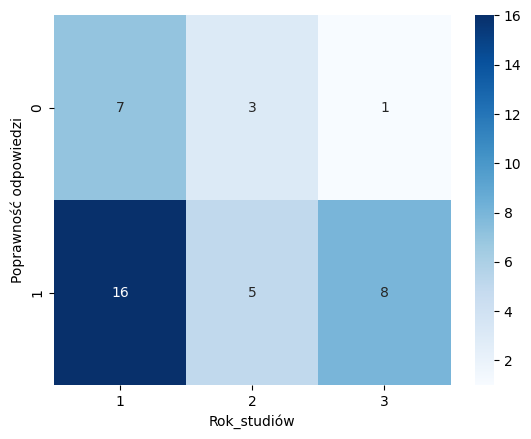

-------------------------------------
3a
Rok_studiów   1  2  3
3a_corr              
0            13  3  2
1            10  5  7
Chi2 test conducted...
Chi-squared test statistic value: 3.3021031571756208
P-value: 0.19184805919792383
Brak podstaw do odrzucenia H0.


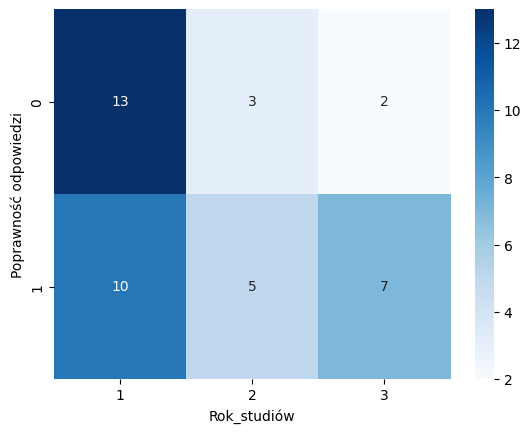

-------------------------------------
3b
Rok_studiów   1  2  3
3b_corr              
0            12  5  5
1            11  3  4
Chi2 test conducted...
Chi-squared test statistic value: 0.257160981798663
P-value: 0.8793427804785817
Brak podstaw do odrzucenia H0.


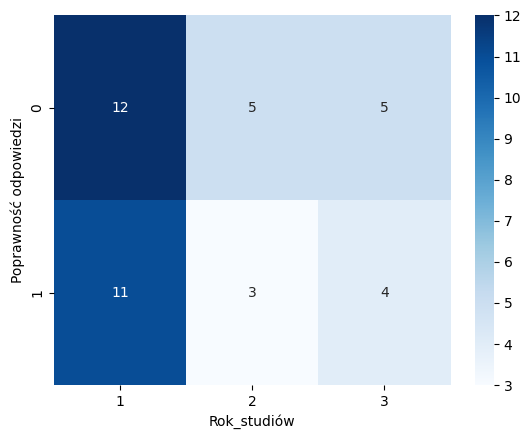

##############################################################
Specjalność
-------------------------------------
1a
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
1a_corr                                     
0               2        3       0         0
1               7       15       5         8
Chi2 test conducted...
Chi-squared test statistic value: 2.9206349206349205
P-value: 0.4040242683837014
Brak podstaw do odrzucenia H0.


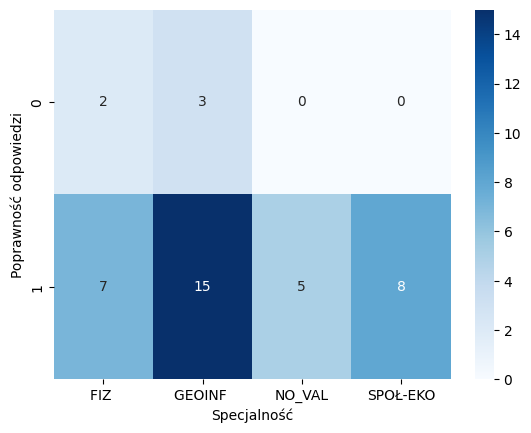

-------------------------------------
1b
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
1b_corr                                     
0               1        2       0         0
1               8       16       5         8
Chi2 test conducted...
Chi-squared test statistic value: 1.561561561561561
P-value: 0.6681365350498931
Brak podstaw do odrzucenia H0.


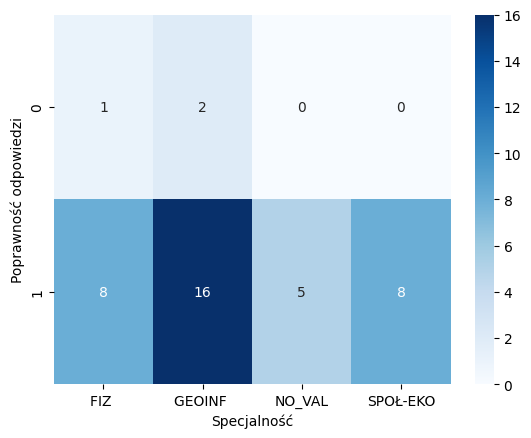

-------------------------------------
2a
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
2a_corr                                     
0               3        3       2         4
1               6       15       3         4
Chi2 test conducted...
Chi-squared test statistic value: 3.333333333333334
P-value: 0.3430301461382424
Brak podstaw do odrzucenia H0.


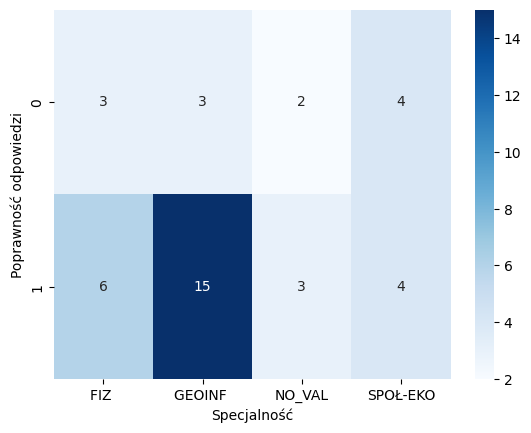

-------------------------------------
2b
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
2b_corr                                     
0               2        4       2         3
1               7       14       3         5
Chi2 test conducted...
Chi-squared test statistic value: 1.1703239289446183
P-value: 0.7601302997790985
Brak podstaw do odrzucenia H0.


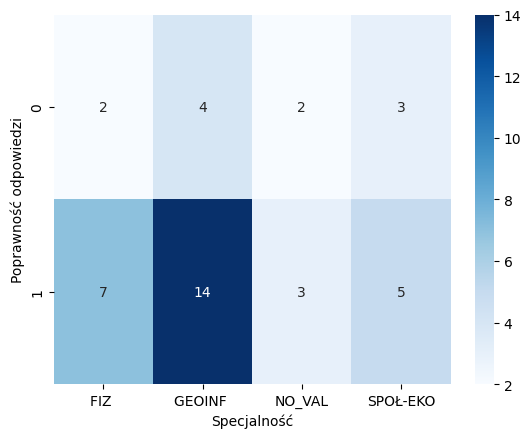

-------------------------------------
3a
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
3a_corr                                     
0               5        7       3         3
1               4       11       2         5
Chi2 test conducted...
Chi-squared test statistic value: 1.3131313131313131
P-value: 0.7260173030217615
Brak podstaw do odrzucenia H0.


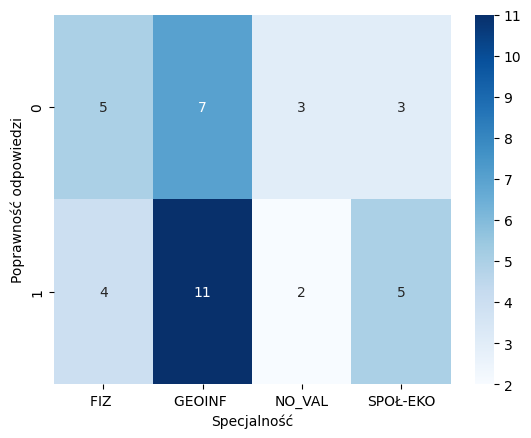

-------------------------------------
3b
Specjalność  FIZ   GEOINF   NO_VAL  SPOŁ-EKO
3b_corr                                     
0               6       10       3         3
1               3        8       2         5
Chi2 test conducted...
Chi-squared test statistic value: 1.5375982042648708
P-value: 0.673620262740217
Brak podstaw do odrzucenia H0.


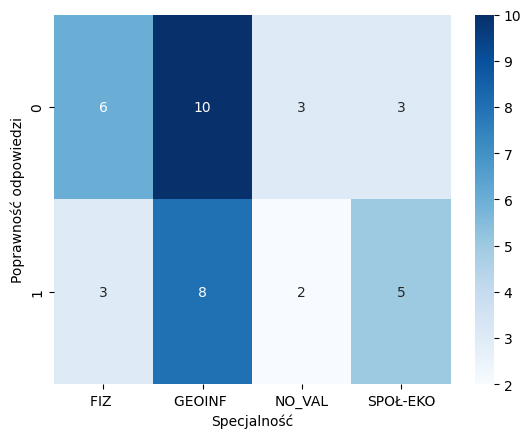

##############################################################
Wady_wzroku
-------------------------------------
1a
Wady_wzroku   0   1
1a_corr            
0             2   3
1            14  21
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


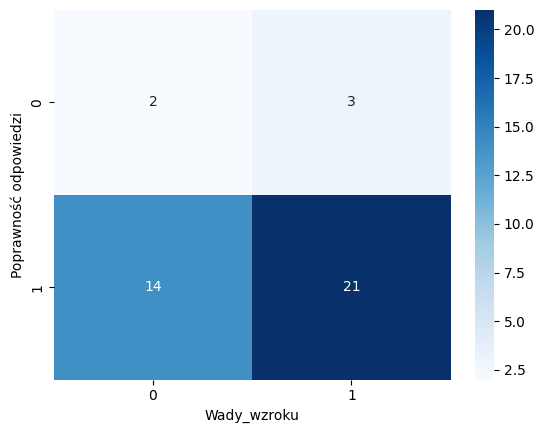

-------------------------------------
1b
Wady_wzroku   0   1
1b_corr            
0             2   1
1            14  23
Chi2 test conducted...
Chi-squared test statistic value: 0.1351351351351352
P-value: 0.7131660625710623
Brak podstaw do odrzucenia H0.


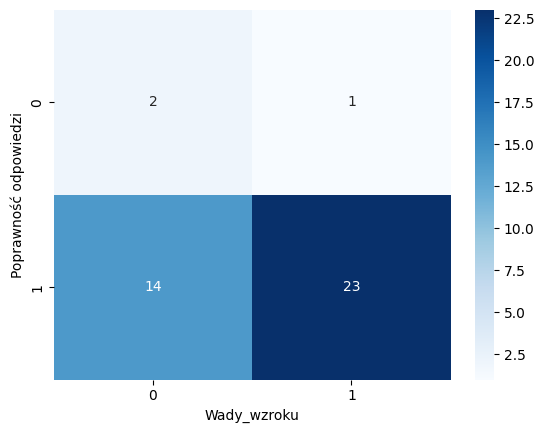

-------------------------------------
2a
Wady_wzroku   0   1
2a_corr            
0             4   8
1            12  16
Chi2 test conducted...
Chi-squared test statistic value: 0.04464285714285717
P-value: 0.8326621063505324
Brak podstaw do odrzucenia H0.


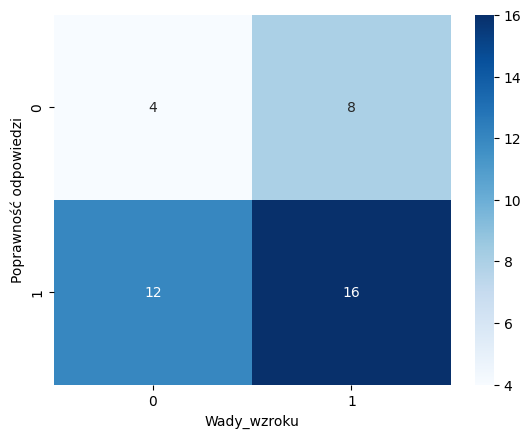

-------------------------------------
2b
Wady_wzroku   0   1
2b_corr            
0             3   8
1            13  16
Chi2 test conducted...
Chi-squared test statistic value: 0.42319749216300956
P-value: 0.5153458546296923
Brak podstaw do odrzucenia H0.


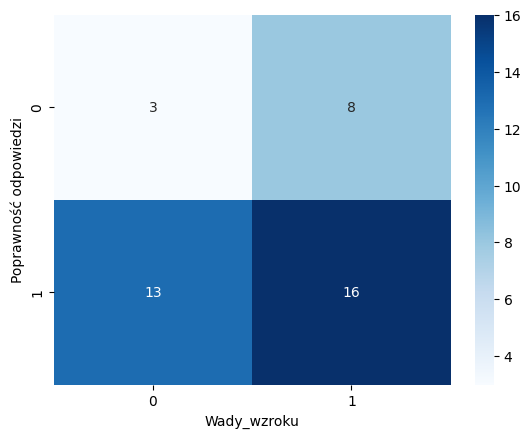

-------------------------------------
3a
Wady_wzroku   0   1
3a_corr            
0             6  12
1            10  12
Chi2 test conducted...
Chi-squared test statistic value: 0.20622895622895598
P-value: 0.6497393036917203
Brak podstaw do odrzucenia H0.


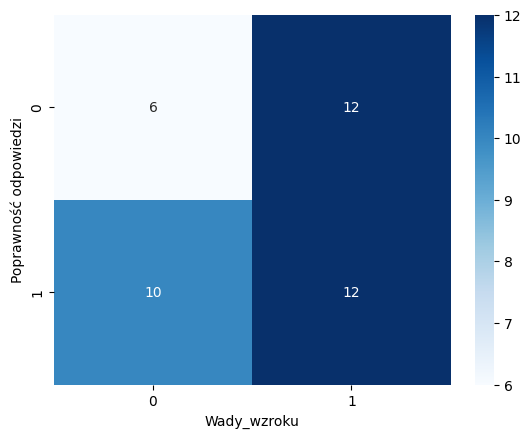

-------------------------------------
3b
Wady_wzroku  0   1
3b_corr           
0            9  13
1            7  11
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


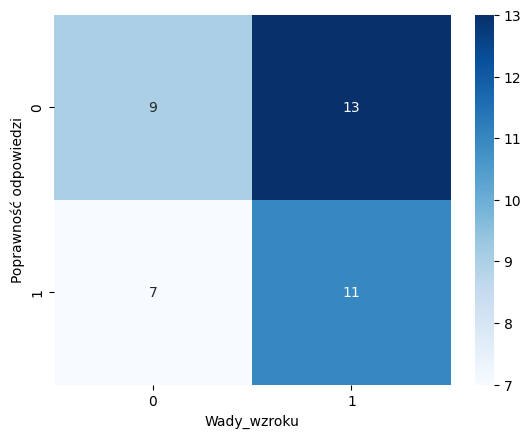

##############################################################
Ilość_snu
-------------------------------------
1a
Ilość_snu   6  7  8  8<  <6
1a_corr                    
0           1  1  0   1   2
1          10  8  4   5   8
Chi2 test conducted...
Chi-squared test statistic value: 1.3137085137085138
P-value: 0.8590454239933245
Brak podstaw do odrzucenia H0.


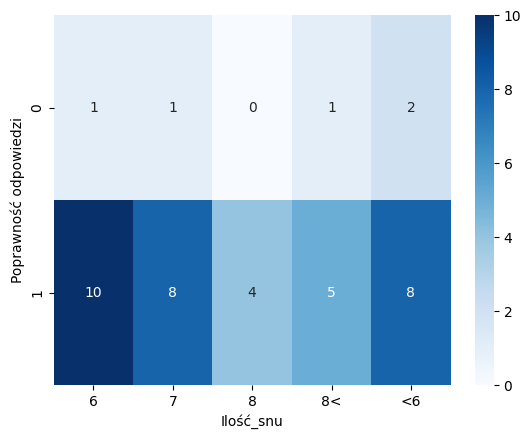

-------------------------------------
1b
Ilość_snu   6  7  8  8<  <6
1b_corr                    
0           1  0  0   1   1
1          10  9  4   5   9
Chi2 test conducted...
Chi-squared test statistic value: 1.9110019110019112
P-value: 0.7521236414952284
Brak podstaw do odrzucenia H0.


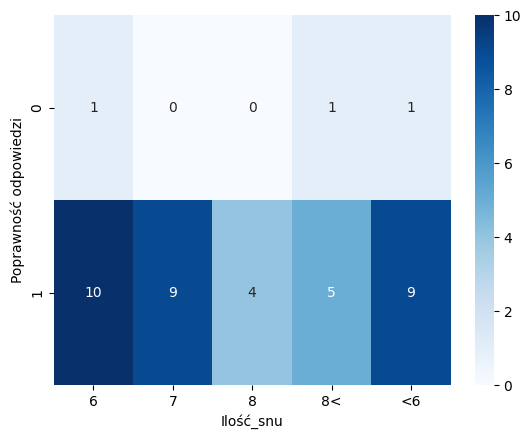

-------------------------------------
2a
Ilość_snu  6  7  8  8<  <6
2a_corr                   
0          5  1  0   3   3
1          6  8  4   3   7
Chi2 test conducted...
Chi-squared test statistic value: 5.637325637325637
P-value: 0.22791956330496121
Brak podstaw do odrzucenia H0.


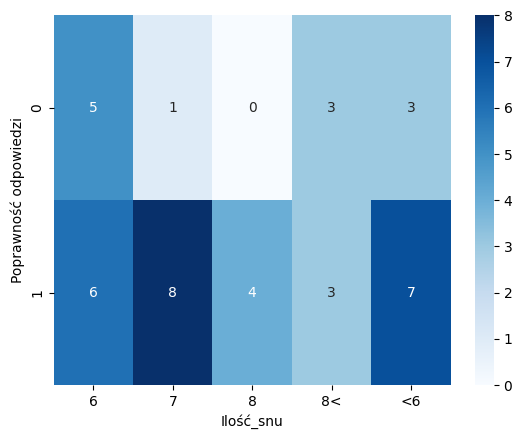

-------------------------------------
2b
Ilość_snu  6  7  8  8<  <6
2b_corr                   
0          5  2  0   3   1
1          6  7  4   3   9
Chi2 test conducted...
Chi-squared test statistic value: 6.481112061049366
P-value: 0.16598437349911374
Brak podstaw do odrzucenia H0.


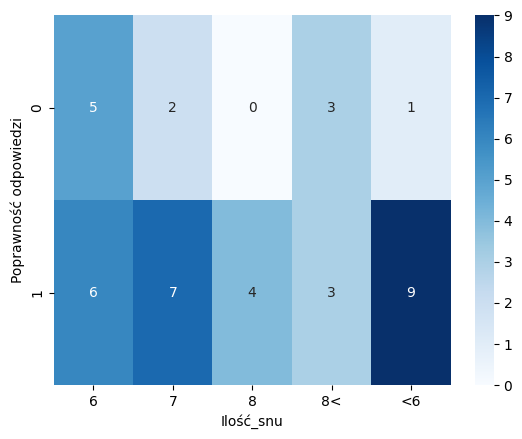

-------------------------------------
3a
Ilość_snu  6  7  8  8<  <6
3a_corr                   
0          5  3  1   3   6
1          6  6  3   3   4
Chi2 test conducted...
Chi-squared test statistic value: 2.112029384756657
P-value: 0.7151627078769266
Brak podstaw do odrzucenia H0.


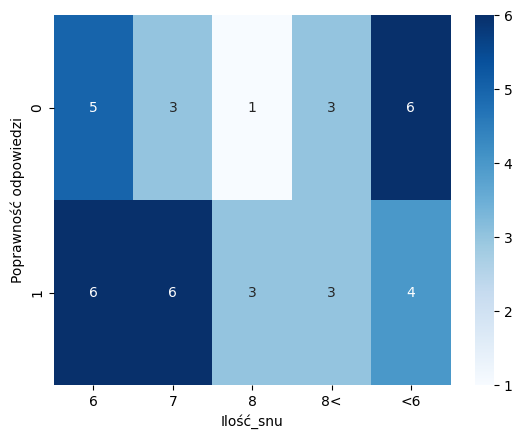

-------------------------------------
3b
Ilość_snu  6  7  8  8<  <6
3b_corr                   
0          5  4  3   5   5
1          6  5  1   1   5
Chi2 test conducted...
Chi-squared test statistic value: 3.5037241097847156
P-value: 0.47731231139165786
Brak podstaw do odrzucenia H0.


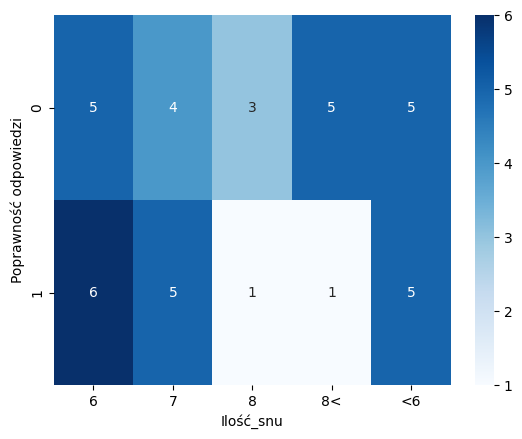

##############################################################
JP_podst
-------------------------------------
1a
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
1a_corr                                          
0                1         1         2          1
1                4        12        15          4
Chi2 test conducted...
Chi-squared test statistic value: 0.7974143503555268
P-value: 0.8500853862664508
Brak podstaw do odrzucenia H0.


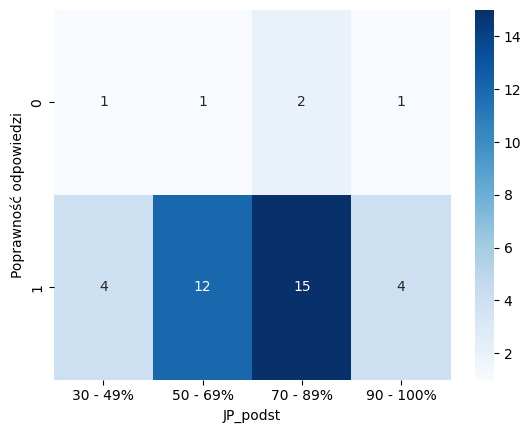

-------------------------------------
1b
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
1b_corr                                          
0                1         1         1          0
1                4        12        16          5
Chi2 test conducted...
Chi-squared test statistic value: 1.59634747870042
P-value: 0.6602182877558944
Brak podstaw do odrzucenia H0.


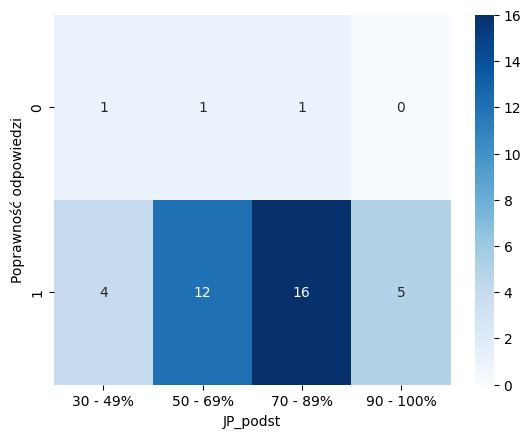

-------------------------------------
2a
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
2a_corr                                          
0                3         4         4          1
1                2         9        13          4
Chi2 test conducted...
Chi-squared test statistic value: 2.7235509588450766
P-value: 0.4362398808318344
Brak podstaw do odrzucenia H0.


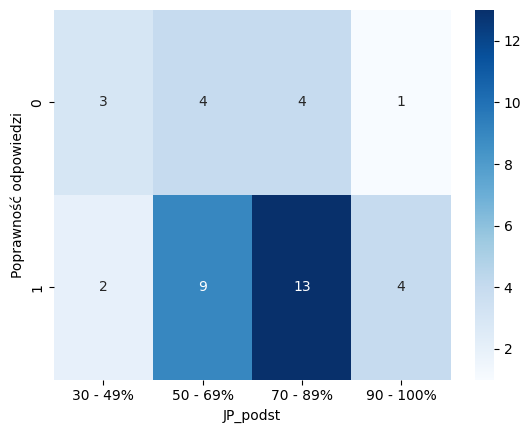

-------------------------------------
2b
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
2b_corr                                          
0                3         2         3          3
1                2        11        14          2
Chi2 test conducted...
Chi-squared test statistic value: 7.082653654661768
P-value: 0.06930946310020905
Brak podstaw do odrzucenia H0.


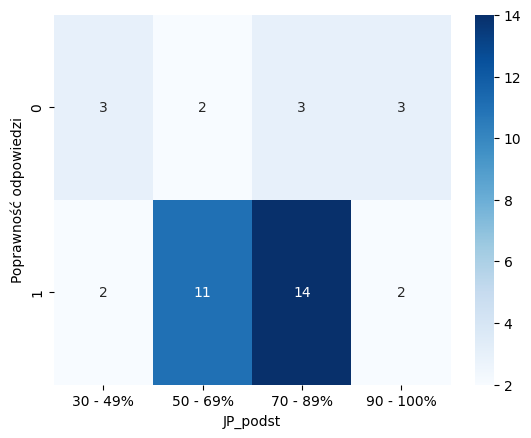

-------------------------------------
3a
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
3a_corr                                          
0                3         7         6          2
1                2         6        11          3
Chi2 test conducted...
Chi-squared test statistic value: 1.5631427396133284
P-value: 0.6677755245435393
Brak podstaw do odrzucenia H0.


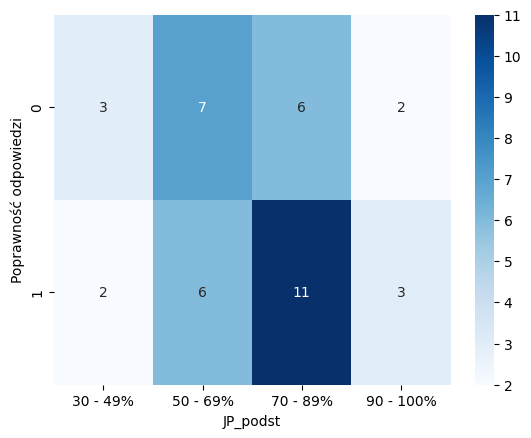

-------------------------------------
3b
JP_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
3b_corr                                          
0                4         8         8          2
1                1         5         9          3
Chi2 test conducted...
Chi-squared test statistic value: 2.374880021938845
P-value: 0.49832782751672644
Brak podstaw do odrzucenia H0.


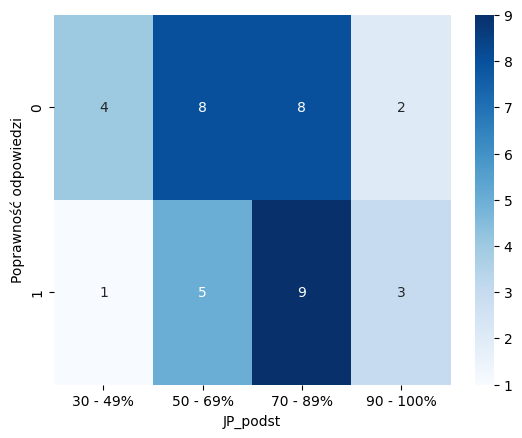

##############################################################
MAT_podst
-------------------------------------
1a
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
1a_corr                                           
0                 0         0         3          2
1                 1         3         9         22
Chi2 test conducted...
Chi-squared test statistic value: 2.666666666666666
P-value: 0.4459216983631228
Brak podstaw do odrzucenia H0.


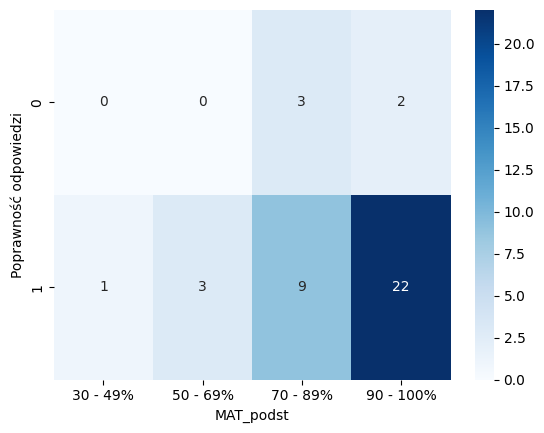

-------------------------------------
1b
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
1b_corr                                           
0                 0         0         2          1
1                 1         3        10         23
Chi2 test conducted...
Chi-squared test statistic value: 2.1621621621621623
P-value: 0.5394396458616231
Brak podstaw do odrzucenia H0.


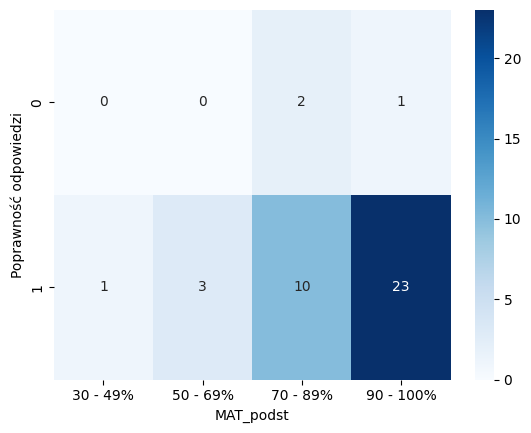

-------------------------------------
2a
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
2a_corr                                           
0                 0         1         4          7
1                 1         2         8         17
Chi2 test conducted...
Chi-squared test statistic value: 0.5158730158730159
P-value: 0.9153905943014297
Brak podstaw do odrzucenia H0.


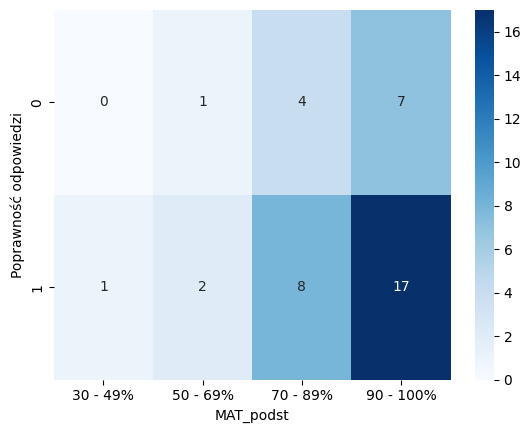

-------------------------------------
2b
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
2b_corr                                           
0                 0         0         4          7
1                 1         3         8         17
Chi2 test conducted...
Chi-squared test statistic value: 1.7554858934169282
P-value: 0.6246692705055594
Brak podstaw do odrzucenia H0.


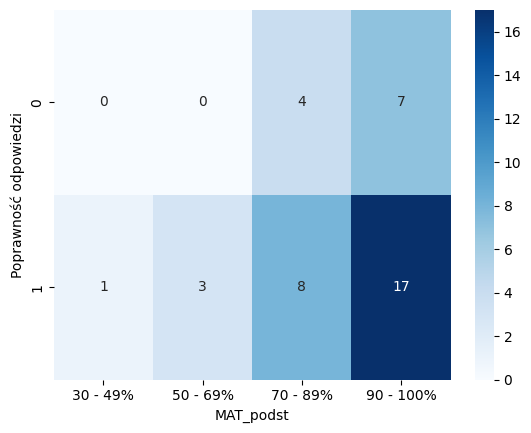

-------------------------------------
3a
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
3a_corr                                           
0                 1         2         6          9
1                 0         1         6         15
Chi2 test conducted...
Chi-squared test statistic value: 2.4579124579124585
P-value: 0.4829452831917367
Brak podstaw do odrzucenia H0.


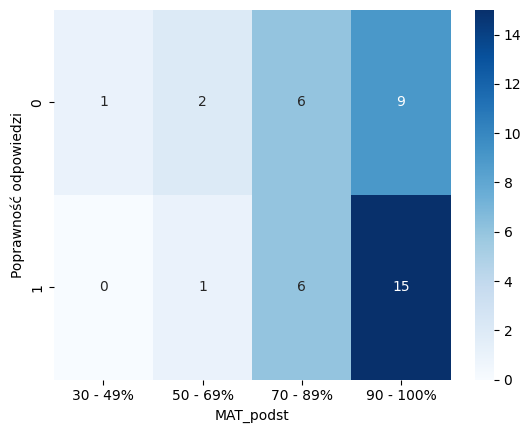

-------------------------------------
3b
MAT_podst  30 - 49%  50 - 69%  70 - 89%  90 - 100%
3b_corr                                           
0                 1         2        10          9
1                 0         1         2         15
Chi2 test conducted...
Chi-squared test statistic value: 7.845117845117845
P-value: 0.04932348789656462
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


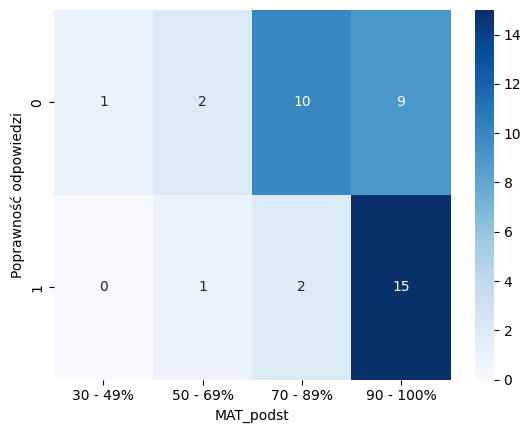

##############################################################
JP_roz
-------------------------------------
1a
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
1a_corr                                         
0               0         0       4            1
1               1         5      27            2
Chi2 test conducted...
Chi-squared test statistic value: 2.0522273425499233
P-value: 0.5616377867991533
Brak podstaw do odrzucenia H0.


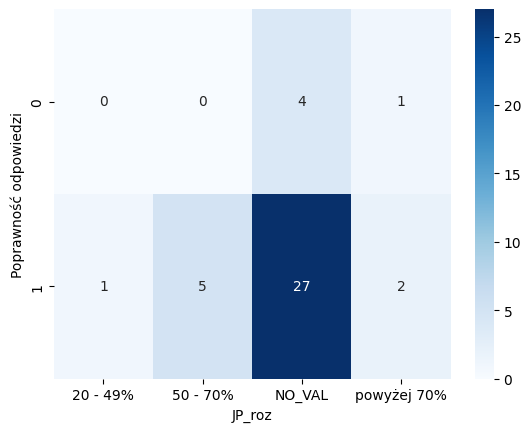

-------------------------------------
1b
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
1b_corr                                         
0               0         0       3            0
1               1         5      28            3
Chi2 test conducted...
Chi-squared test statistic value: 0.9415867480383608
P-value: 0.8153821142577709
Brak podstaw do odrzucenia H0.


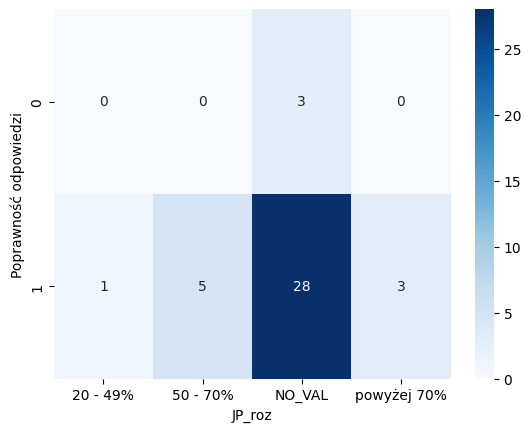

-------------------------------------
2a
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
2a_corr                                         
0               1         2       8            1
1               0         3      23            2
Chi2 test conducted...
Chi-squared test statistic value: 2.846902201740911
P-value: 0.4158370645047611
Brak podstaw do odrzucenia H0.


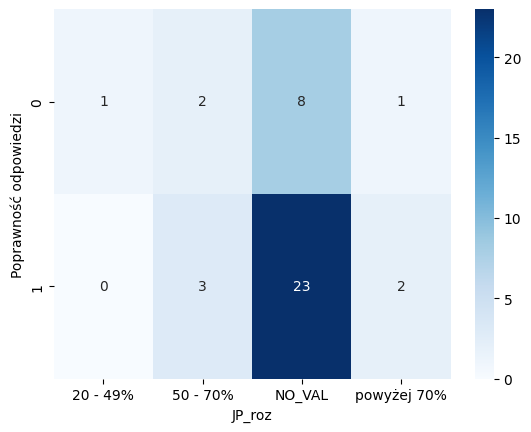

-------------------------------------
2b
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
2b_corr                                         
0               0         2       8            1
1               1         3      23            2
Chi2 test conducted...
Chi-squared test statistic value: 0.8669565510499883
P-value: 0.8333937288913041
Brak podstaw do odrzucenia H0.


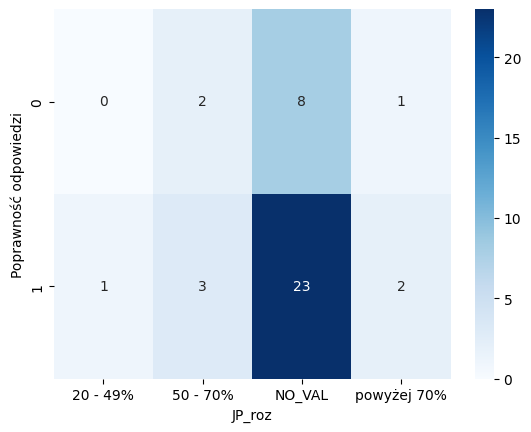

-------------------------------------
3a
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
3a_corr                                         
0               0         2      14            2
1               1         3      17            1
Chi2 test conducted...
Chi-squared test statistic value: 1.4380362767459538
P-value: 0.6966435341871706
Brak podstaw do odrzucenia H0.


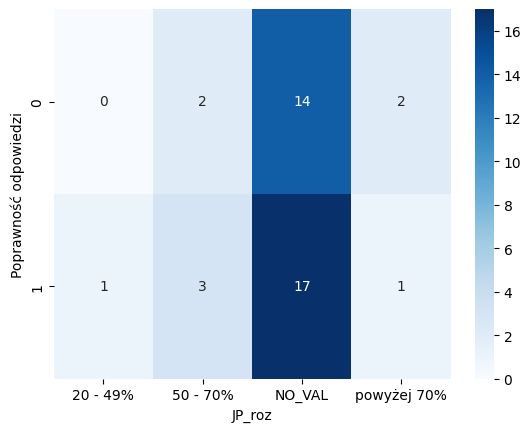

-------------------------------------
3b
JP_roz   20 - 49%  50 - 70%  NO_VAL  powyżej 70%
3b_corr                                         
0               0         2      18            2
1               1         3      13            1
Chi2 test conducted...
Chi-squared test statistic value: 1.959378733572282
P-value: 0.5808804610607898
Brak podstaw do odrzucenia H0.


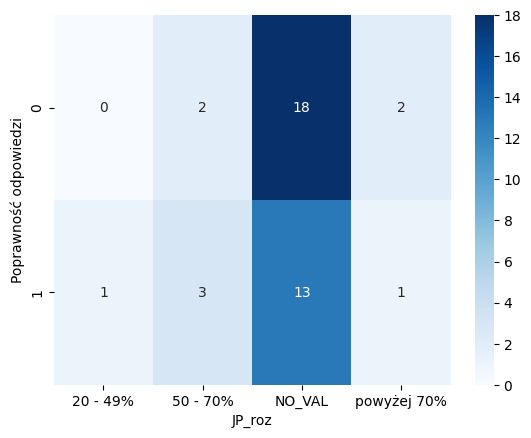

##############################################################
MAT_roz
-------------------------------------
1a
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
1a_corr                                                      
0               0         0       4            0            1
1               2        10      14            5            4
Chi2 test conducted...
Chi-squared test statistic value: 4.241269841269842
P-value: 0.3743371416697125
Brak podstaw do odrzucenia H0.


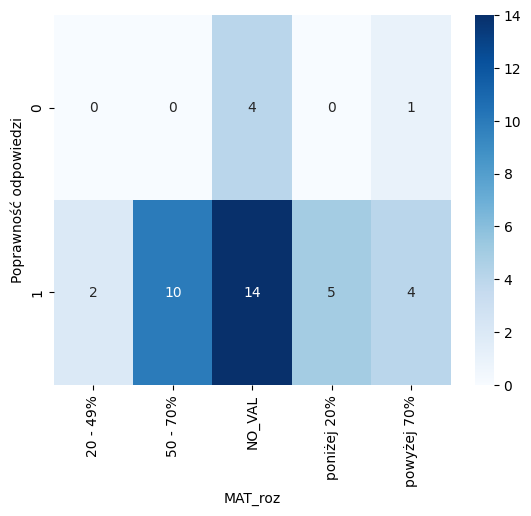

-------------------------------------
1b
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
1b_corr                                                      
0               0         0       2            0            1
1               2        10      16            5            4
Chi2 test conducted...
Chi-squared test statistic value: 2.8428428428428427
P-value: 0.5844601434915346
Brak podstaw do odrzucenia H0.


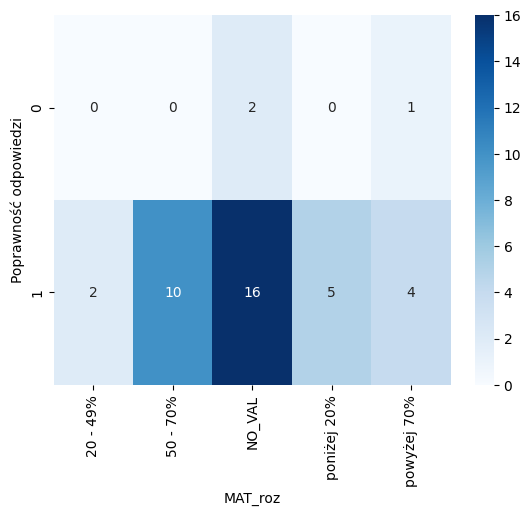

-------------------------------------
2a
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
2a_corr                                                      
0               0         4       4            3            1
1               2         6      14            2            4
Chi2 test conducted...
Chi-squared test statistic value: 4.2328042328042335
P-value: 0.375415094018582
Brak podstaw do odrzucenia H0.


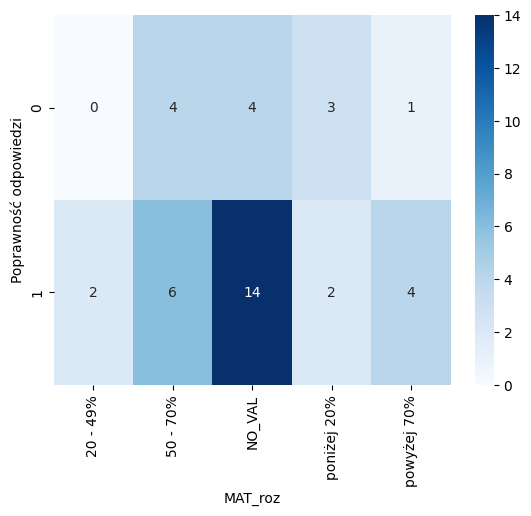

-------------------------------------
2b
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
2b_corr                                                      
0               1         4       3            2            1
1               1         6      15            3            4
Chi2 test conducted...
Chi-squared test statistic value: 2.884012539184953
P-value: 0.577419450189052
Brak podstaw do odrzucenia H0.


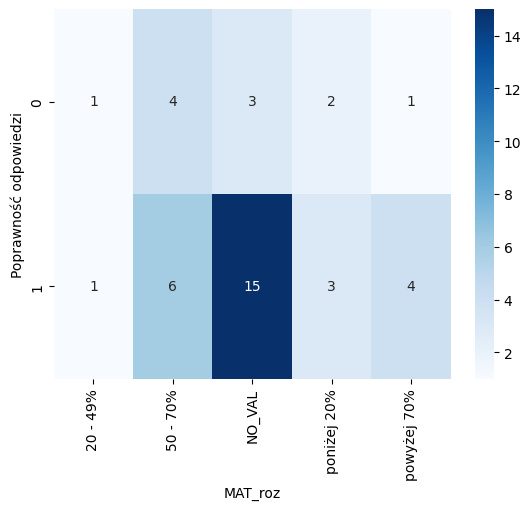

-------------------------------------
3a
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
3a_corr                                                      
0               1         5       9            3            0
1               1         5       9            2            5
Chi2 test conducted...
Chi-squared test statistic value: 4.8484848484848495
P-value: 0.30320013893153425
Brak podstaw do odrzucenia H0.


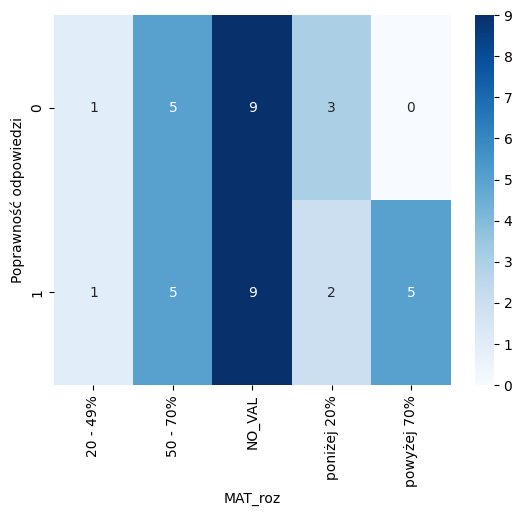

-------------------------------------
3b
MAT_roz  20 - 49%  50 - 70%  NO_VAL  poniżej 20%  powyżej 70%
3b_corr                                                      
0               0         4      11            4            3
1               2         6       7            1            2
Chi2 test conducted...
Chi-squared test statistic value: 4.938271604938272
P-value: 0.29369005929544334
Brak podstaw do odrzucenia H0.


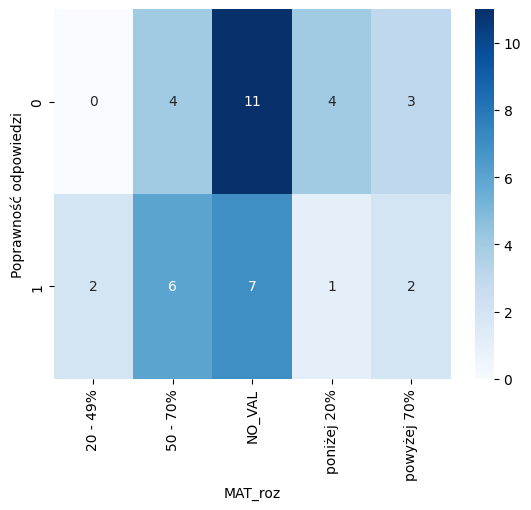

##############################################################
FIZ_roz
-------------------------------------
1a
FIZ_roz  NO_VAL
1a_corr        
0             5
1            35
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


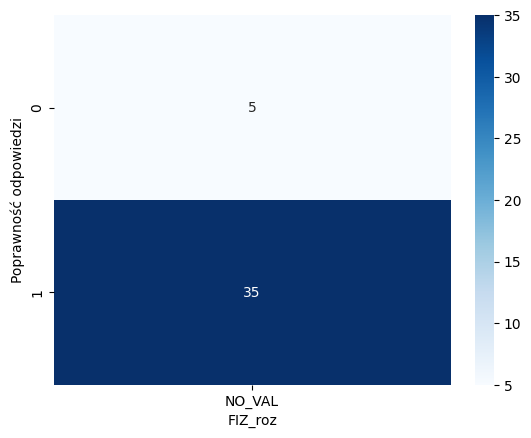

-------------------------------------
1b
FIZ_roz  NO_VAL
1b_corr        
0             3
1            37
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


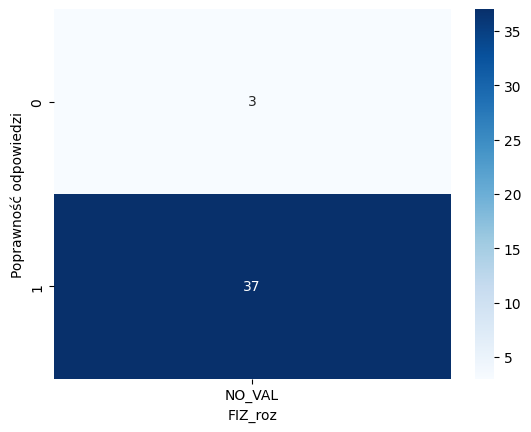

-------------------------------------
2a
FIZ_roz  NO_VAL
2a_corr        
0            12
1            28
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


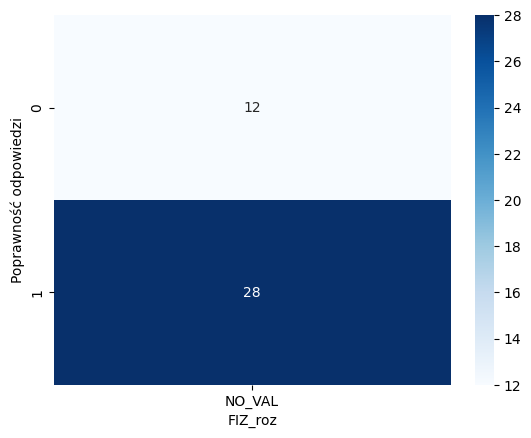

-------------------------------------
2b
FIZ_roz  NO_VAL
2b_corr        
0            11
1            29
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


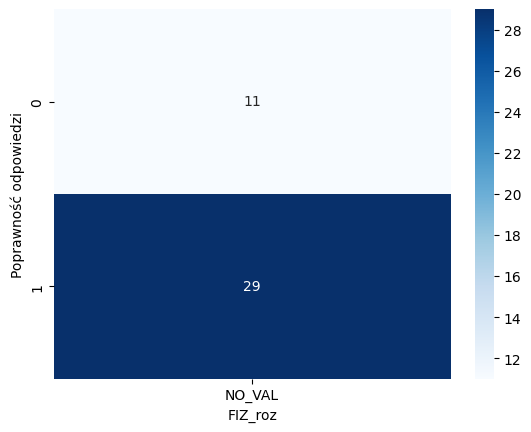

-------------------------------------
3a
FIZ_roz  NO_VAL
3a_corr        
0            18
1            22
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


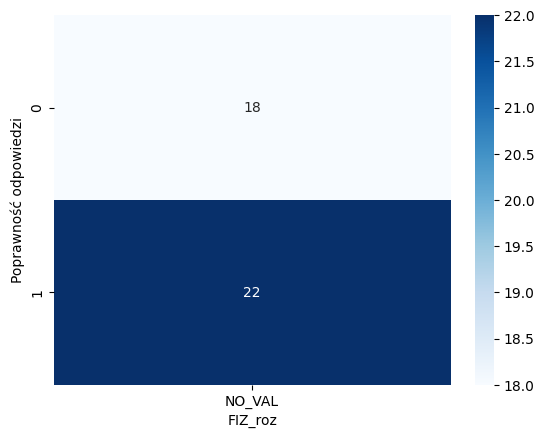

-------------------------------------
3b
FIZ_roz  NO_VAL
3b_corr        
0            22
1            18
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


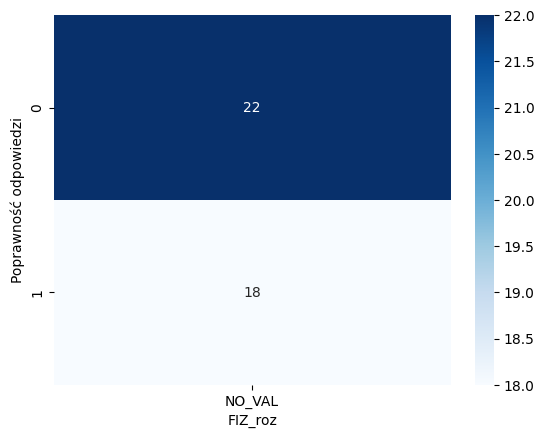

##############################################################
HIST_roz
-------------------------------------
1a
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
1a_corr                                
0                0       5            0
1                1      31            3
Chi2 test conducted...
Chi-squared test statistic value: 0.634920634920635
P-value: 0.7279955689141826
Brak podstaw do odrzucenia H0.


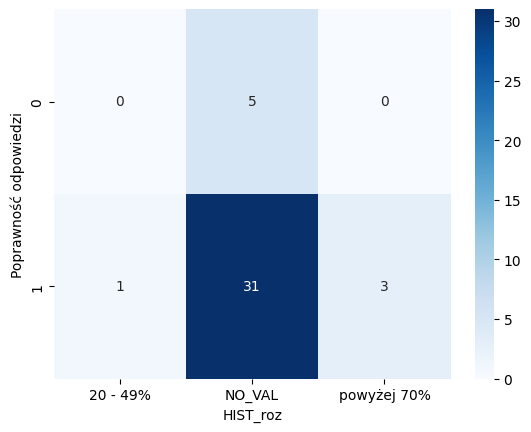

-------------------------------------
1b
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
1b_corr                                
0                0       3            0
1                1      33            3
Chi2 test conducted...
Chi-squared test statistic value: 0.3603603603603603
P-value: 0.8351197258317473
Brak podstaw do odrzucenia H0.


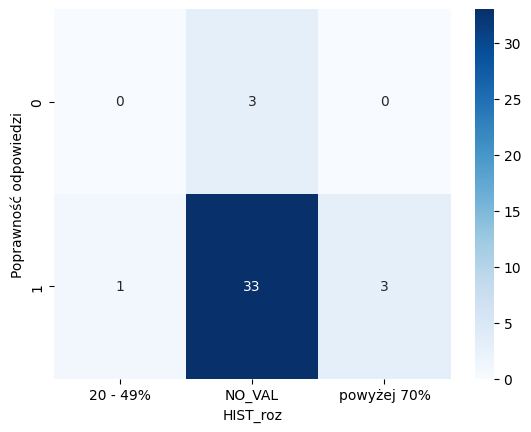

-------------------------------------
2a
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
2a_corr                                
0                1      11            0
1                0      25            3
Chi2 test conducted...
Chi-squared test statistic value: 3.6243386243386237
P-value: 0.16329950468513624
Brak podstaw do odrzucenia H0.


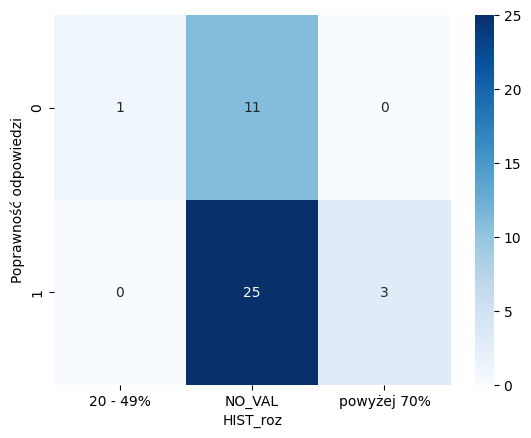

-------------------------------------
2b
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
2b_corr                                
0                0      10            1
1                1      26            2
Chi2 test conducted...
Chi-squared test statistic value: 0.43190525949146646
P-value: 0.8057734706636266
Brak podstaw do odrzucenia H0.


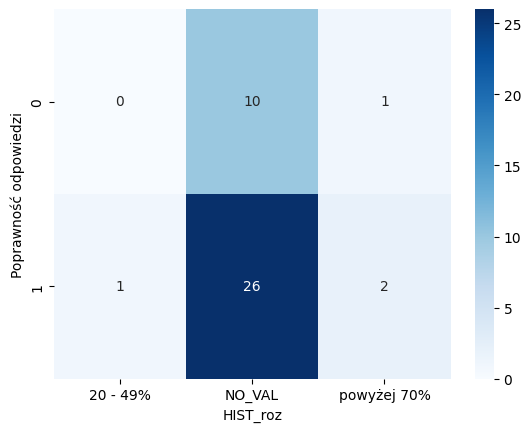

-------------------------------------
3a
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
3a_corr                                
0                0      18            0
1                1      18            3
Chi2 test conducted...
Chi-squared test statistic value: 3.6363636363636367
P-value: 0.1623206111818482
Brak podstaw do odrzucenia H0.


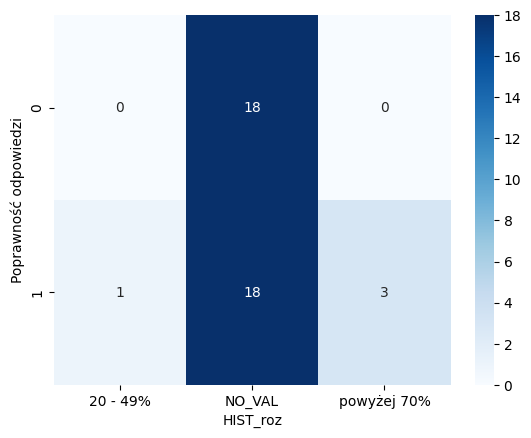

-------------------------------------
3b
HIST_roz  20 - 49%  NO_VAL  powyżej 70%
3b_corr                                
0                1      20            1
1                0      16            2
Chi2 test conducted...
Chi-squared test statistic value: 1.391694725028058
P-value: 0.4986517301291298
Brak podstaw do odrzucenia H0.


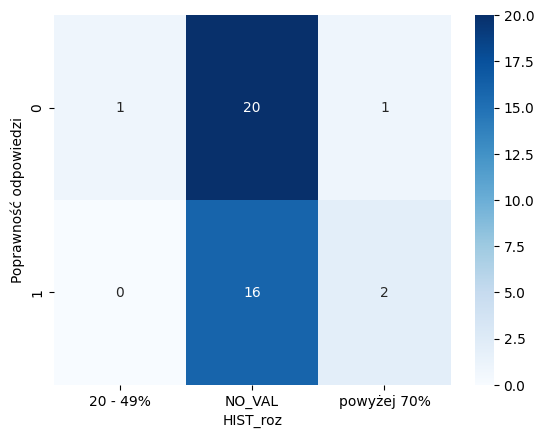

##############################################################
Samopocz
-------------------------------------
1a
Samopocz  2  3   4  5
1a_corr              
0         2  1   2  0
1         3  5  18  9
Chi2 test conducted...
Chi-squared test statistic value: 4.9523809523809526
P-value: 0.17531743847654538
Brak podstaw do odrzucenia H0.


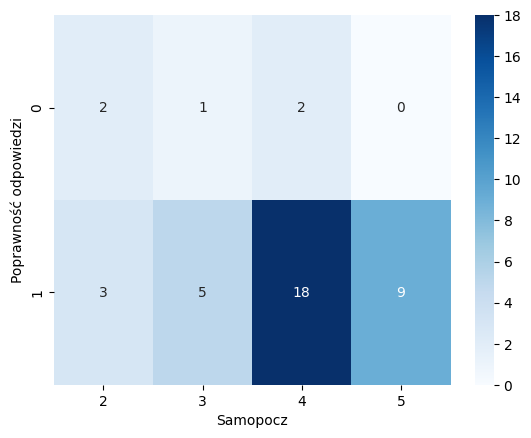

-------------------------------------
1b
Samopocz  2  3   4  5
1b_corr              
0         1  0   1  1
1         4  6  19  8
Chi2 test conducted...
Chi-squared test statistic value: 1.961961961961962
P-value: 0.580339057639008
Brak podstaw do odrzucenia H0.


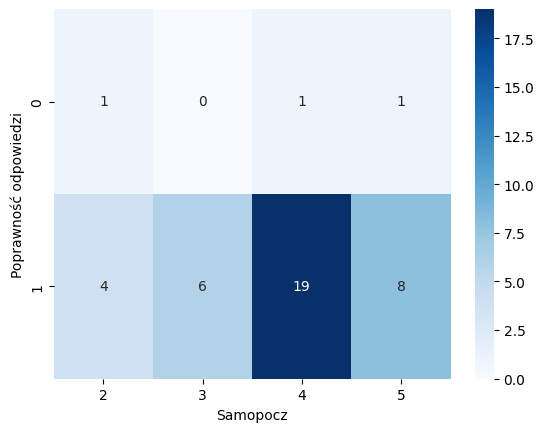

-------------------------------------
2a
Samopocz  2  3   4  5
2a_corr              
0         2  3   4  3
1         3  3  16  6
Chi2 test conducted...
Chi-squared test statistic value: 2.380952380952381
P-value: 0.49719017971055923
Brak podstaw do odrzucenia H0.


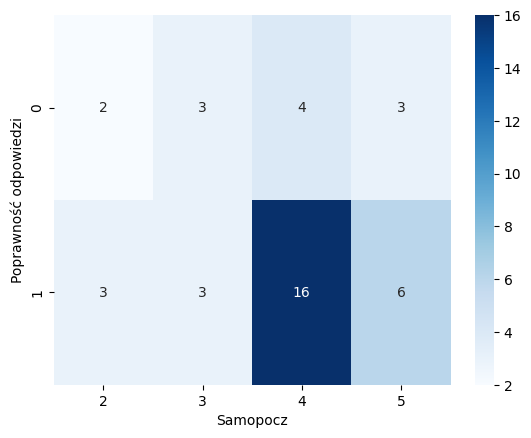

-------------------------------------
2b
Samopocz  2  3   4  5
2b_corr              
0         2  3   4  2
1         3  3  16  7
Chi2 test conducted...
Chi-squared test statistic value: 2.6053639846743297
P-value: 0.4565499470147082
Brak podstaw do odrzucenia H0.


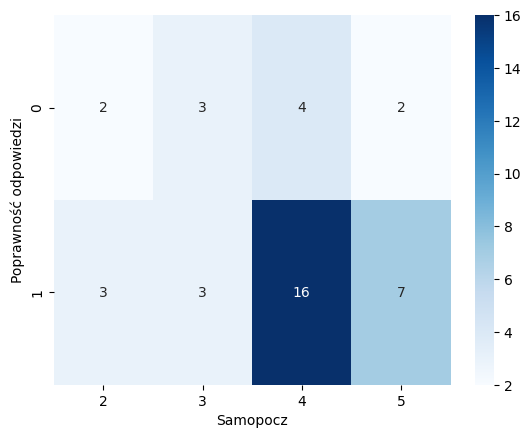

-------------------------------------
3a
Samopocz  2  3   4  5
3a_corr              
0         5  5   1  7
1         0  1  19  2
Chi2 test conducted...
Chi-squared test statistic value: 26.509539842873174
P-value: 7.459508639904343e-06
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


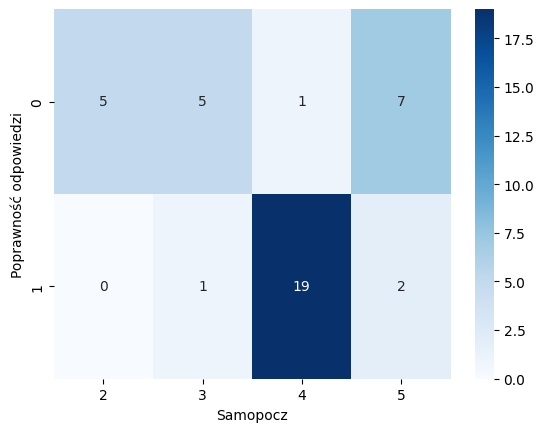

-------------------------------------
3b
Samopocz  2  3   4  5
3b_corr              
0         3  3   8  8
1         2  3  12  1
Chi2 test conducted...
Chi-squared test statistic value: 6.105499438832771
P-value: 0.10658875349940074
Brak podstaw do odrzucenia H0.


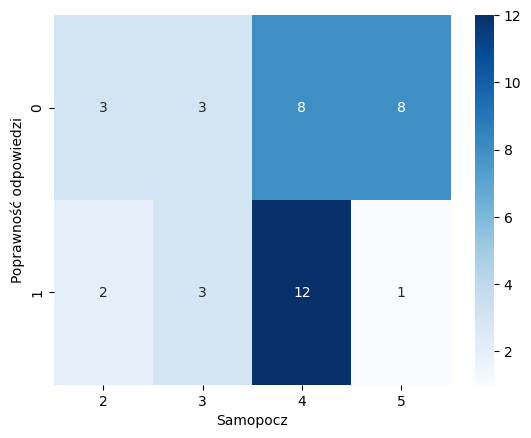

##############################################################
Stres
-------------------------------------
1a
Stres    1   2  3  4  5
1a_corr                
0        0   1  1  1  2
1        9  14  8  4  0
Chi2 test conducted...
Chi-squared test statistic value: 16.025396825396825
P-value: 0.0029852735492366307
Istnieją podstawy do odrzucenia H0, przyjmujemy hipotezę H1.


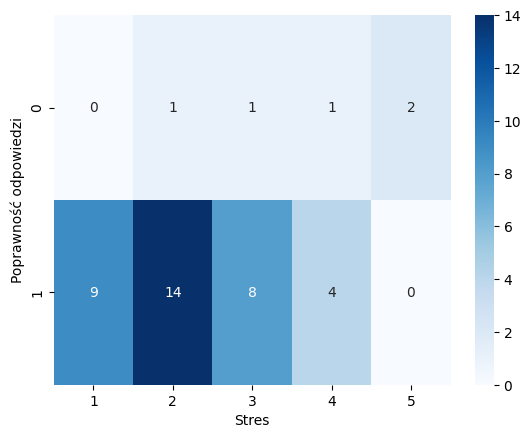

-------------------------------------
1b
Stres    1   2  3  4  5
1b_corr                
0        1   0  1  0  1
1        8  15  8  5  1
Chi2 test conducted...
Chi-squared test statistic value: 7.167167167167167
P-value: 0.12731353574488088
Brak podstaw do odrzucenia H0.


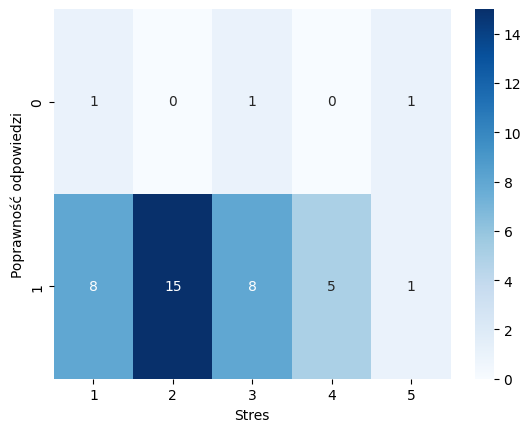

-------------------------------------
2a
Stres    1   2  3  4  5
2a_corr                
0        3   3  4  1  1
1        6  12  5  4  1
Chi2 test conducted...
Chi-squared test statistic value: 2.275132275132275
P-value: 0.6853002095138743
Brak podstaw do odrzucenia H0.


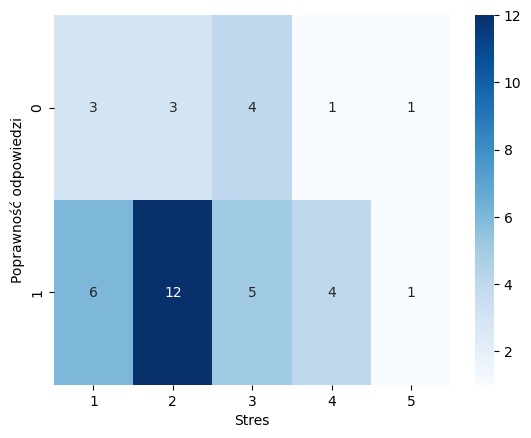

-------------------------------------
2b
Stres    1   2  3  4  5
2b_corr                
0        2   3  3  2  1
1        7  12  6  3  1
Chi2 test conducted...
Chi-squared test statistic value: 1.6022291884360849
P-value: 0.8083914241419997
Brak podstaw do odrzucenia H0.


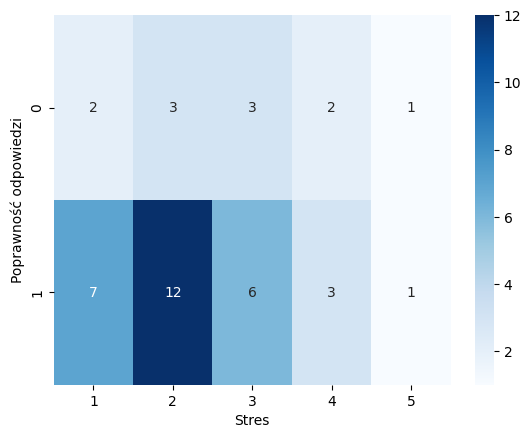

-------------------------------------
3a
Stres    1  2  3  4  5
3a_corr               
0        4  6  3  3  2
1        5  9  6  2  0
Chi2 test conducted...
Chi-squared test statistic value: 3.546576879910213
P-value: 0.4708316586727075
Brak podstaw do odrzucenia H0.


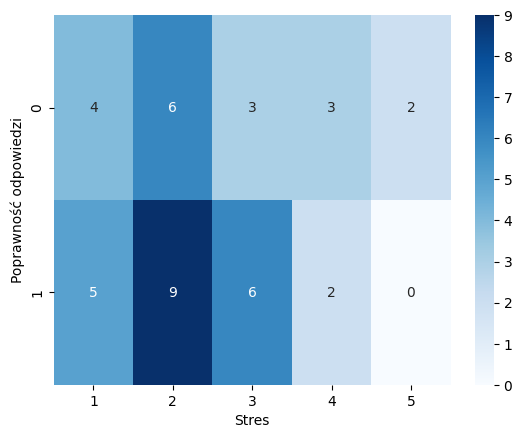

-------------------------------------
3b
Stres    1  2  3  4  5
3b_corr               
0        5  8  4  3  2
1        4  7  5  2  0
Chi2 test conducted...
Chi-squared test statistic value: 2.109988776655443
P-value: 0.7155374995231278
Brak podstaw do odrzucenia H0.


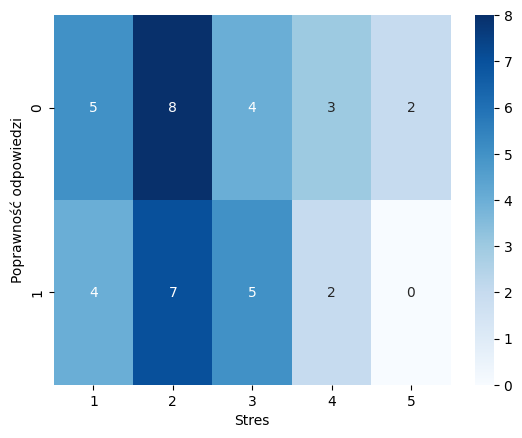

##############################################################
Zmęcz
-------------------------------------
1a
Zmęcz    1   2  3  4  5
1a_corr                
0        0   1  2  1  1
1        6  11  8  8  2
Chi2 test conducted...
Chi-squared test statistic value: 2.768253968253968
P-value: 0.5973249724735088
Brak podstaw do odrzucenia H0.


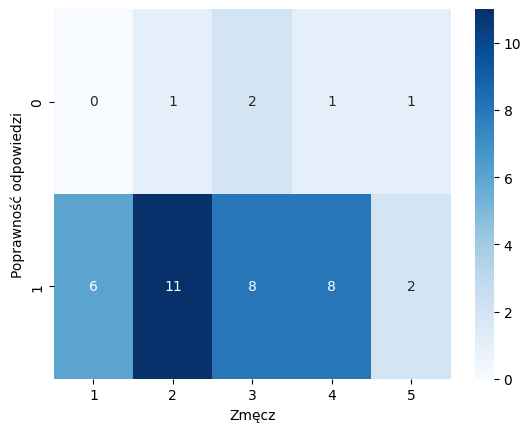

-------------------------------------
1b
Zmęcz    1   2  3  4  5
1b_corr                
0        1   0  1  1  0
1        5  12  9  8  3
Chi2 test conducted...
Chi-squared test statistic value: 2.2022022022022023
P-value: 0.6986261188231611
Brak podstaw do odrzucenia H0.


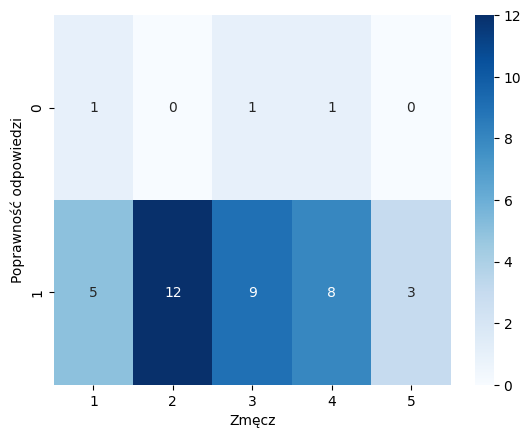

-------------------------------------
2a
Zmęcz    1  2  3  4  5
2a_corr               
0        2  3  3  3  1
1        4  9  7  6  2
Chi2 test conducted...
Chi-squared test statistic value: 0.23809523809523803
P-value: 0.99345189725498
Brak podstaw do odrzucenia H0.


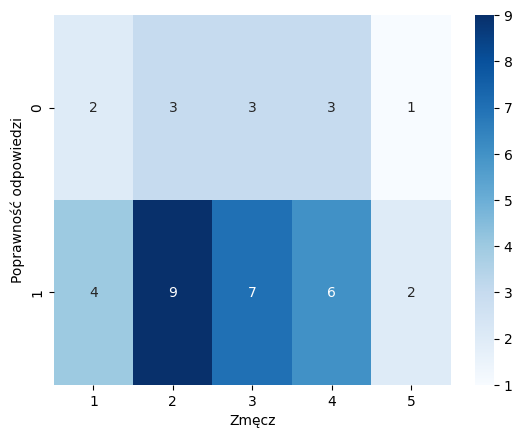

-------------------------------------
2b
Zmęcz    1   2  3  4  5
2b_corr                
0        3   1  3  4  0
1        3  11  7  5  3
Chi2 test conducted...
Chi-squared test statistic value: 6.199930337861372
P-value: 0.18470659411783638
Brak podstaw do odrzucenia H0.


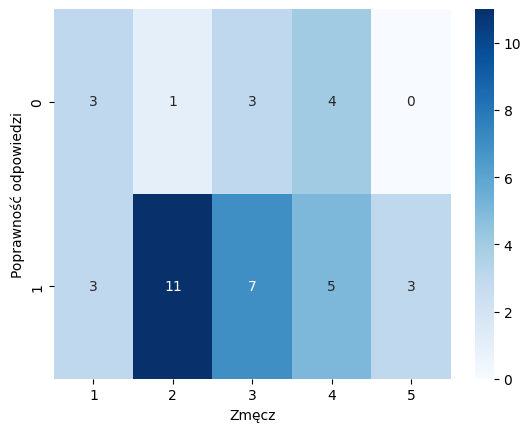

-------------------------------------
3a
Zmęcz    1  2  3  4  5
3a_corr               
0        4  4  4  4  2
1        2  8  6  5  1
Chi2 test conducted...
Chi-squared test statistic value: 2.469135802469135
P-value: 0.6501709019066686
Brak podstaw do odrzucenia H0.


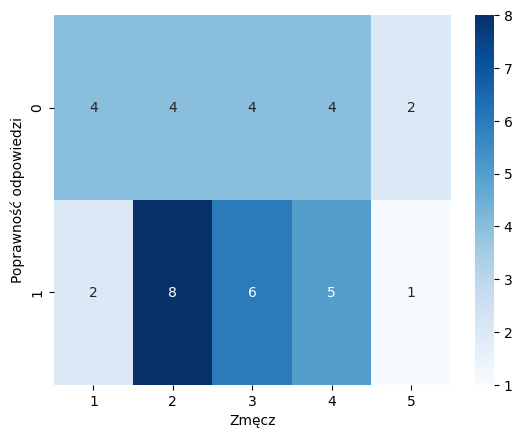

-------------------------------------
3b
Zmęcz    1  2  3  4  5
3b_corr               
0        3  8  4  4  3
1        3  4  6  5  0
Chi2 test conducted...
Chi-squared test statistic value: 4.489337822671157
P-value: 0.34381361105128616
Brak podstaw do odrzucenia H0.


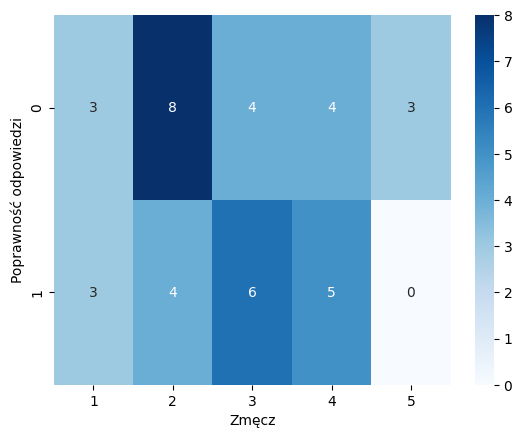

##############################################################
Czyt_map
-------------------------------------
1a
Czyt_map  3   4   5
1a_corr            
0         0   5   0
1         5  20  10
Chi2 test conducted...
Chi-squared test statistic value: 3.4285714285714284
P-value: 0.1800923121479524
Brak podstaw do odrzucenia H0.


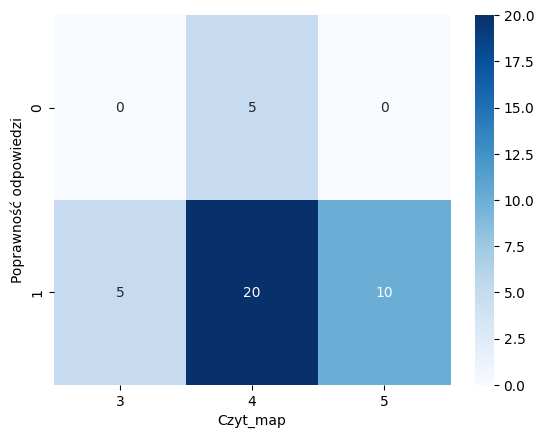

-------------------------------------
1b
Czyt_map  3   4  5
1b_corr           
0         0   2  1
1         5  23  9
Chi2 test conducted...
Chi-squared test statistic value: 0.5045045045045046
P-value: 0.7770487010596451
Brak podstaw do odrzucenia H0.


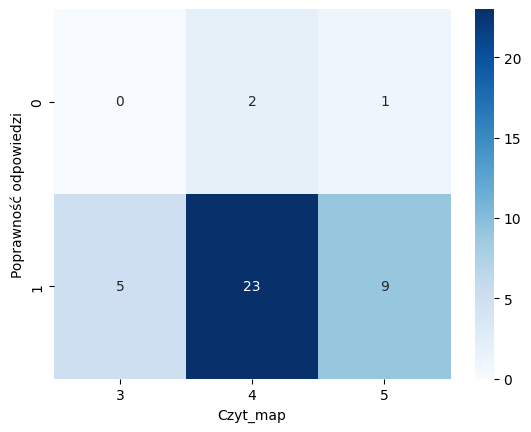

-------------------------------------
2a
Czyt_map  3   4  5
2a_corr           
0         3   6  3
1         2  19  7
Chi2 test conducted...
Chi-squared test statistic value: 2.5714285714285716
P-value: 0.2764530466295643
Brak podstaw do odrzucenia H0.


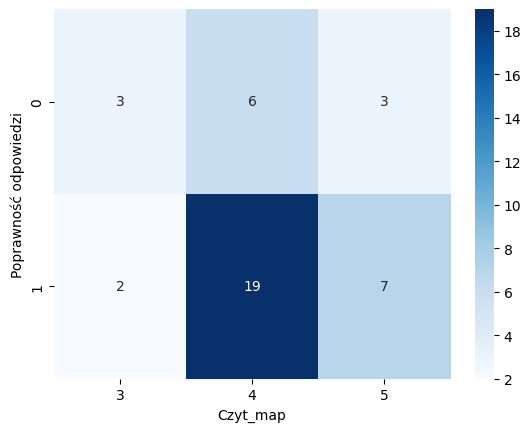

-------------------------------------
2b
Czyt_map  3   4  5
2b_corr           
0         1   6  4
1         4  19  6
Chi2 test conducted...
Chi-squared test statistic value: 1.078369905956113
P-value: 0.5832234132145395
Brak podstaw do odrzucenia H0.


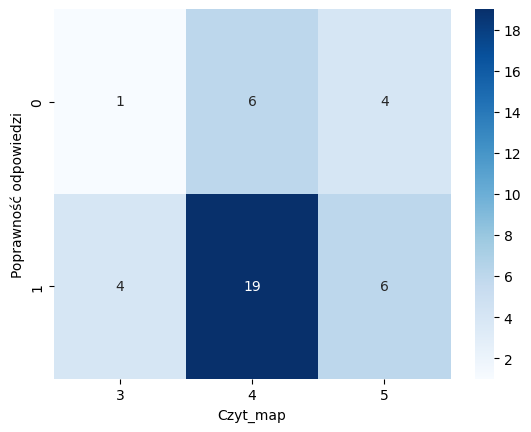

-------------------------------------
3a
Czyt_map  3   4  5
3a_corr           
0         2  11  5
1         3  14  5
Chi2 test conducted...
Chi-squared test statistic value: 0.1616161616161616
P-value: 0.9223706950973188
Brak podstaw do odrzucenia H0.


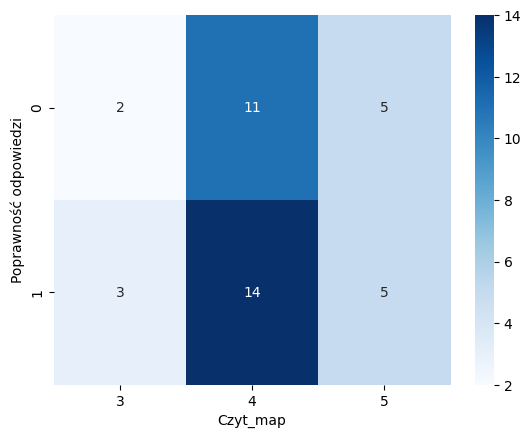

-------------------------------------
3b
Czyt_map  3   4  5
3b_corr           
0         4  14  4
1         1  11  6
Chi2 test conducted...
Chi-squared test statistic value: 2.1818181818181817
P-value: 0.33591098123916246
Brak podstaw do odrzucenia H0.


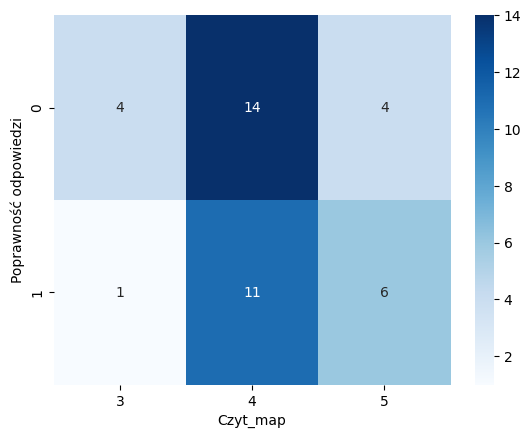

##############################################################
Podziel_uwg
-------------------------------------
1a
Podziel_uwg  1  2   3  4  5
1a_corr                    
0            0  1   2  0  2
1            2  6  12  9  6
Chi2 test conducted...
Chi-squared test statistic value: 2.7755102040816326
P-value: 0.5960674391667908
Brak podstaw do odrzucenia H0.


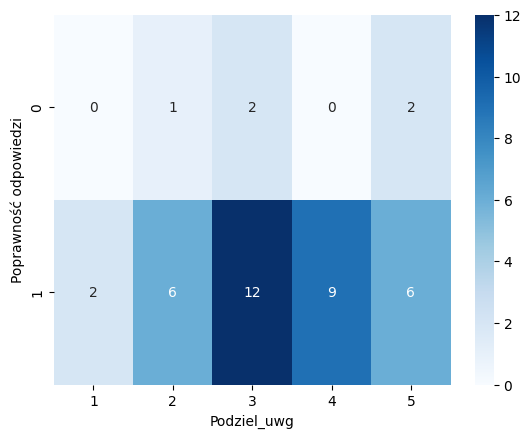

-------------------------------------
1b
Podziel_uwg  1  2   3  4  5
1b_corr                    
0            0  0   2  0  1
1            2  7  12  9  7
Chi2 test conducted...
Chi-squared test statistic value: 2.6769626769626775
P-value: 0.6132518246610756
Brak podstaw do odrzucenia H0.


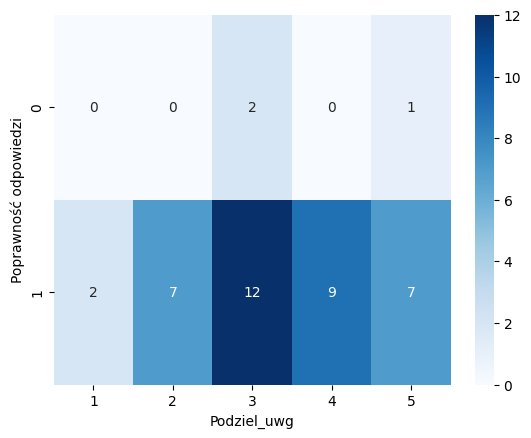

-------------------------------------
2a
Podziel_uwg  1  2   3  4  5
2a_corr                    
0            1  2   4  4  1
1            1  5  10  5  7
Chi2 test conducted...
Chi-squared test statistic value: 2.4622071050642473
P-value: 0.6514157401508517
Brak podstaw do odrzucenia H0.


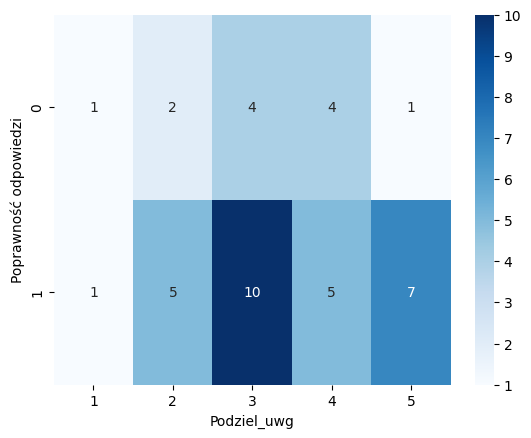

-------------------------------------
2b
Podziel_uwg  1  2   3  4  5
2b_corr                    
0            0  1   4  3  3
1            2  6  10  6  5
Chi2 test conducted...
Chi-squared test statistic value: 1.9346171070309
P-value: 0.7477832158617013
Brak podstaw do odrzucenia H0.


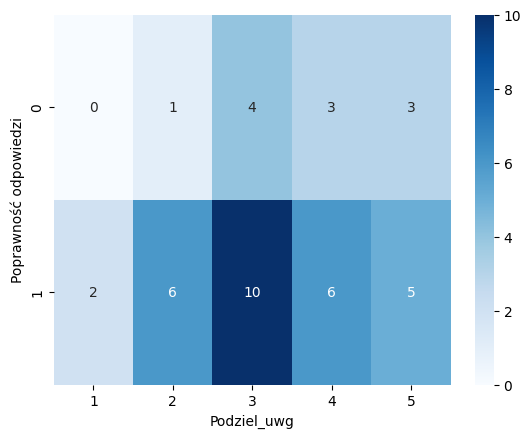

-------------------------------------
3a
Podziel_uwg  1  2   3  4  5
3a_corr                    
0            0  3  10  4  1
1            2  4   4  5  7
Chi2 test conducted...
Chi-squared test statistic value: 9.01555234888568
P-value: 0.06071191961919413
Brak podstaw do odrzucenia H0.


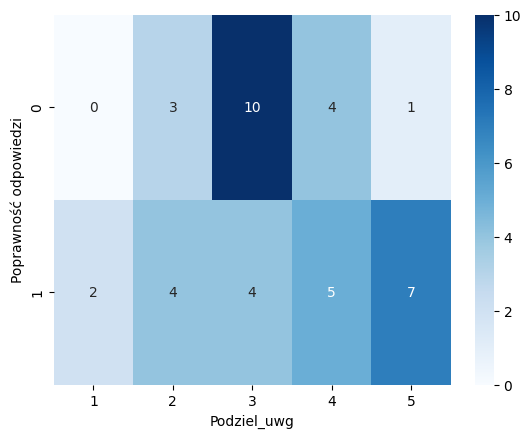

-------------------------------------
3b
Podziel_uwg  1  2  3  4  5
3b_corr                   
0            2  6  6  5  3
1            0  1  8  4  5
Chi2 test conducted...
Chi-squared test statistic value: 6.129549462882796
P-value: 0.18968008168157874
Brak podstaw do odrzucenia H0.


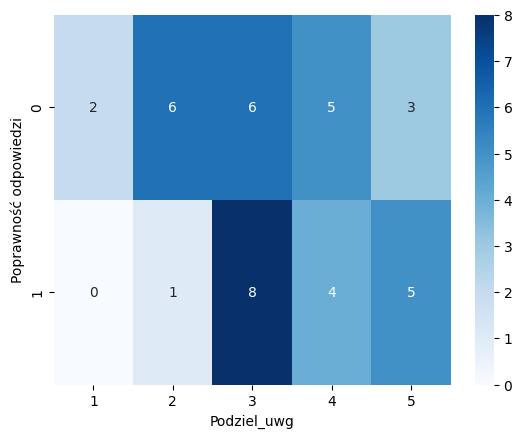

##############################################################
Analit_myśl
-------------------------------------
1a
Analit_myśl  2   3   4  5
1a_corr                  
0            0   1   4  0
1            1  10  15  9
Chi2 test conducted...
Chi-squared test statistic value: 2.8161312371838685
P-value: 0.42085130801734616
Brak podstaw do odrzucenia H0.


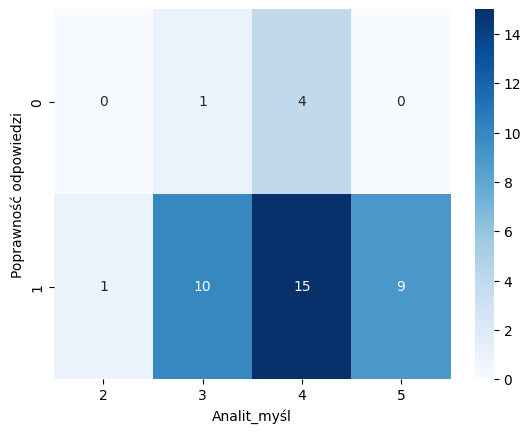

-------------------------------------
1b
Analit_myśl  2   3   4  5
1b_corr                  
0            0   1   2  0
1            1  10  17  9
Chi2 test conducted...
Chi-squared test statistic value: 1.1017716280874175
P-value: 0.7766464228378854
Brak podstaw do odrzucenia H0.


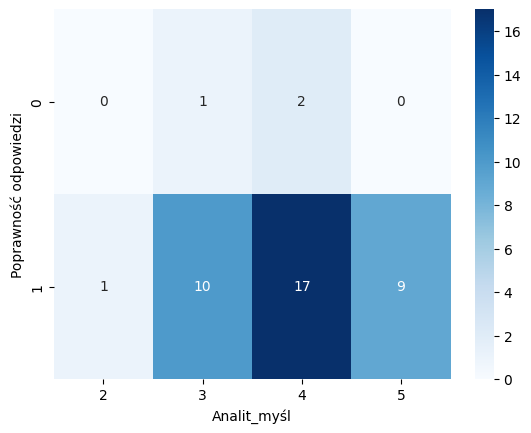

-------------------------------------
2a
Analit_myśl  2  3   4  5
2a_corr                 
0            1  3   6  2
1            0  8  13  7
Chi2 test conducted...
Chi-squared test statistic value: 2.654110022531075
P-value: 0.4480822281471135
Brak podstaw do odrzucenia H0.


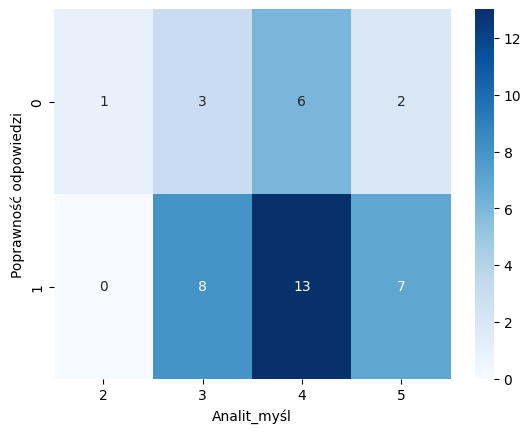

-------------------------------------
2b
Analit_myśl  2  3   4  5
2b_corr                 
0            0  2   5  4
1            1  9  14  5
Chi2 test conducted...
Chi-squared test statistic value: 2.16779242682559
P-value: 0.5383200876408758
Brak podstaw do odrzucenia H0.


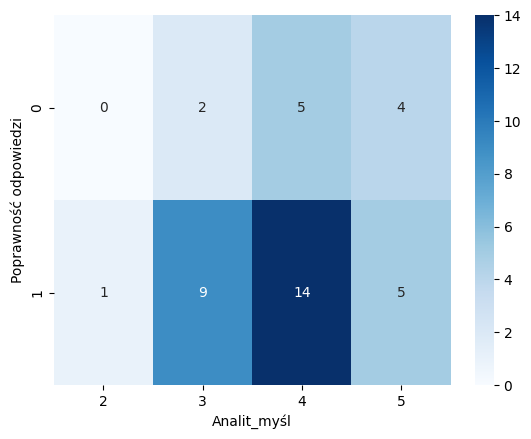

-------------------------------------
3a
Analit_myśl  2  3   4  5
3a_corr                 
0            1  5  10  2
1            0  6   9  7
Chi2 test conducted...
Chi-squared test statistic value: 3.5568873208426632
P-value: 0.31345862977545663
Brak podstaw do odrzucenia H0.


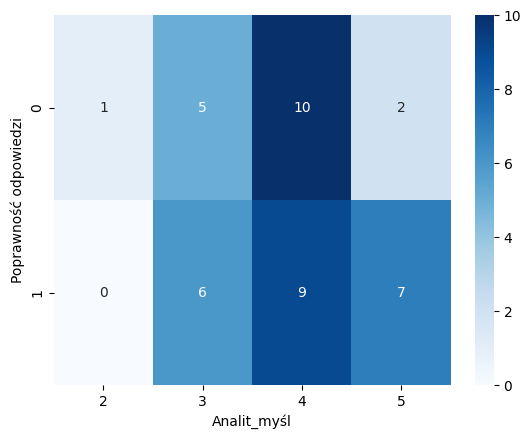

-------------------------------------
3b
Analit_myśl  2  3   4  5
3b_corr                 
0            1  6  11  4
1            0  5   8  5
Chi2 test conducted...
Chi-squared test statistic value: 1.2885903157035536
P-value: 0.7318441857886728
Brak podstaw do odrzucenia H0.


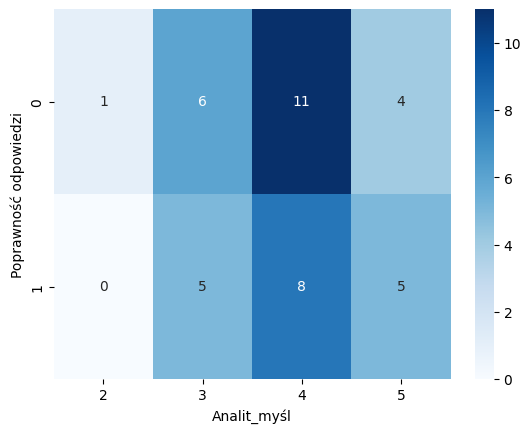

##############################################################
Spostrzeg
-------------------------------------
1a
Spostrzeg  2  3   4  5
1a_corr               
0          0  3   1  1
1          4  8  16  7
Chi2 test conducted...
Chi-squared test statistic value: 3.446906035141329
P-value: 0.3277137972705378
Brak podstaw do odrzucenia H0.


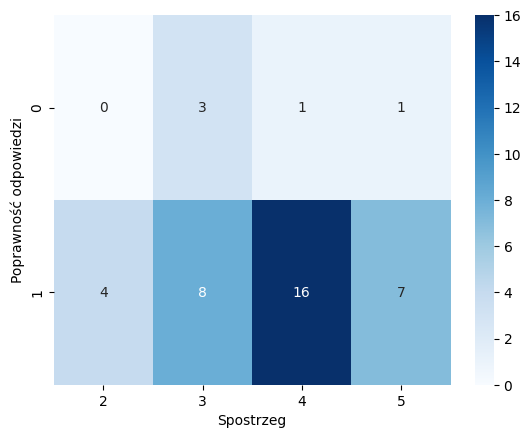

-------------------------------------
1b
Spostrzeg  2   3   4  5
1b_corr                
0          0   1   0  2
1          4  10  17  6
Chi2 test conducted...
Chi-squared test statistic value: 5.274365274365274
P-value: 0.1527744651823055
Brak podstaw do odrzucenia H0.


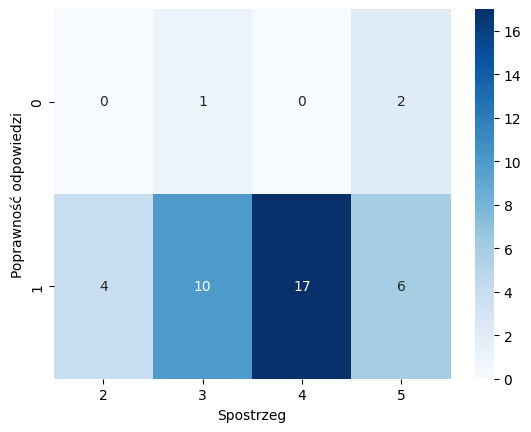

-------------------------------------
2a
Spostrzeg  2  3   4  5
2a_corr               
0          1  3   4  4
1          3  8  13  4
Chi2 test conducted...
Chi-squared test statistic value: 1.949325184619302
P-value: 0.5829907823775147
Brak podstaw do odrzucenia H0.


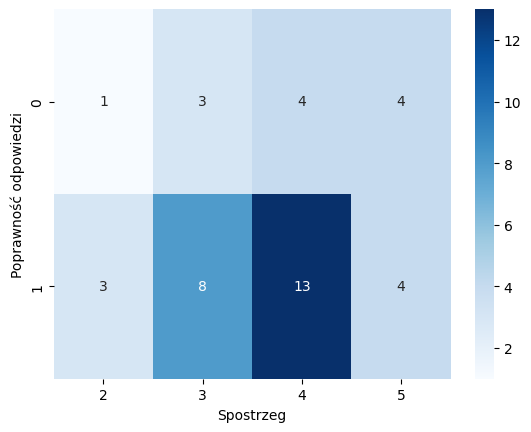

-------------------------------------
2b
Spostrzeg  2  3   4  5
2b_corr               
0          1  2   3  5
1          3  9  14  3
Chi2 test conducted...
Chi-squared test statistic value: 6.23472415469465
P-value: 0.10073238378448716
Brak podstaw do odrzucenia H0.


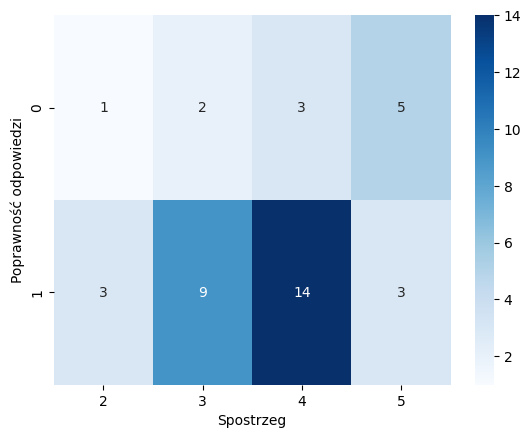

-------------------------------------
3a
Spostrzeg  2  3   4  5
3a_corr               
0          1  5   6  6
1          3  6  11  2
Chi2 test conducted...
Chi-squared test statistic value: 4.203532652730514
P-value: 0.2403084376213457
Brak podstaw do odrzucenia H0.


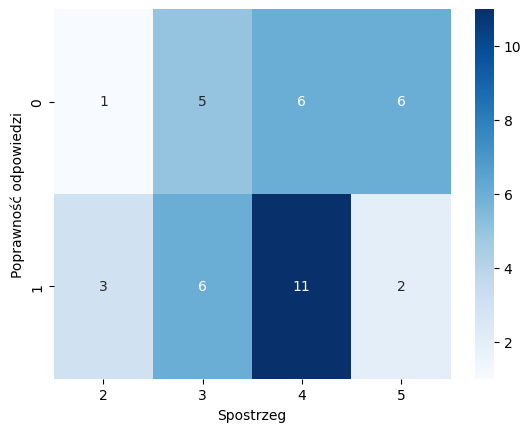

-------------------------------------
3b
Spostrzeg  2  3  4  5
3b_corr              
0          2  7  9  4
1          2  4  8  4
Chi2 test conducted...
Chi-squared test statistic value: 0.4818235834278616
P-value: 0.9228661553302318
Brak podstaw do odrzucenia H0.


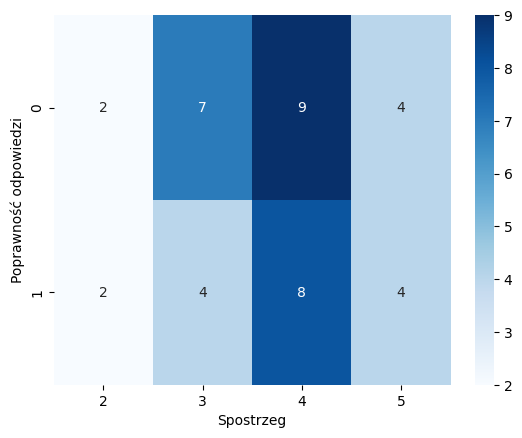

##############################################################
Czyt_ze_zroz
-------------------------------------
1a
Czyt_ze_zroz  1  2  3   4  5
1a_corr                     
0             0  0  2   3  0
1             2  7  4  14  8
Chi2 test conducted...
Chi-squared test statistic value: 5.2212885154061635
P-value: 0.26533607829047023
Brak podstaw do odrzucenia H0.


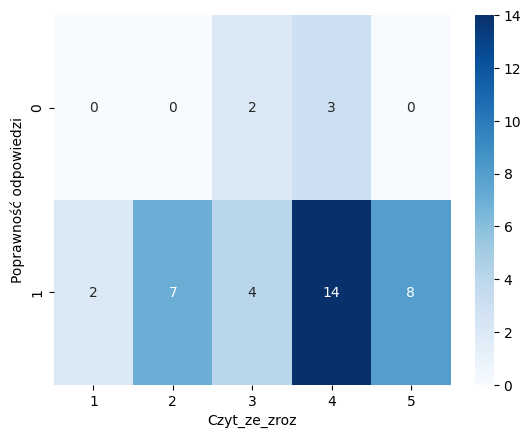

-------------------------------------
1b
Czyt_ze_zroz  1  2  3   4  5
1b_corr                     
0             0  1  0   2  0
1             2  6  6  15  8
Chi2 test conducted...
Chi-squared test statistic value: 2.2075857369975016
P-value: 0.6976407280443628
Brak podstaw do odrzucenia H0.


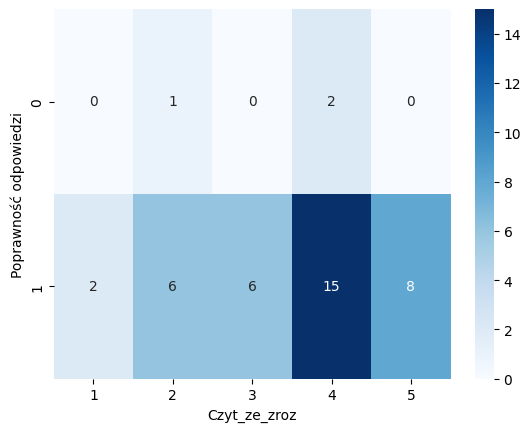

-------------------------------------
2a
Czyt_ze_zroz  1  2  3   4  5
2a_corr                     
0             1  4  1   4  2
1             1  3  5  13  6
Chi2 test conducted...
Chi-squared test statistic value: 3.7788448712818457
P-value: 0.4367624594409064
Brak podstaw do odrzucenia H0.


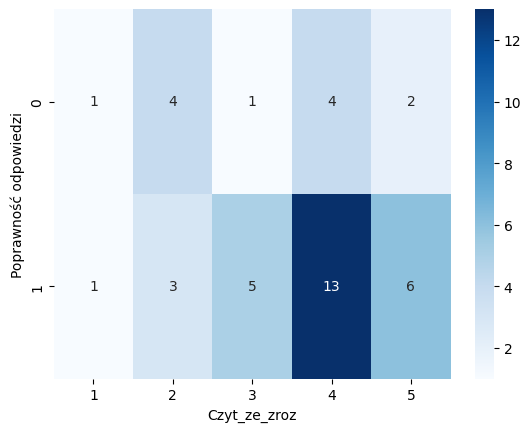

-------------------------------------
2b
Czyt_ze_zroz  1  2  3   4  5
2b_corr                     
0             1  2  2   4  2
1             1  5  4  13  6
Chi2 test conducted...
Chi-squared test statistic value: 0.7737765952776094
P-value: 0.9419287023684074
Brak podstaw do odrzucenia H0.


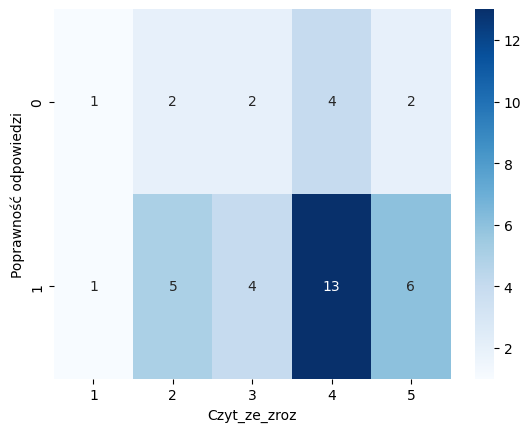

-------------------------------------
3a
Czyt_ze_zroz  1  2  3   4  5
3a_corr                     
0             1  3  4   4  6
1             1  4  2  13  2
Chi2 test conducted...
Chi-squared test statistic value: 7.246696658461365
P-value: 0.12341172694556826
Brak podstaw do odrzucenia H0.


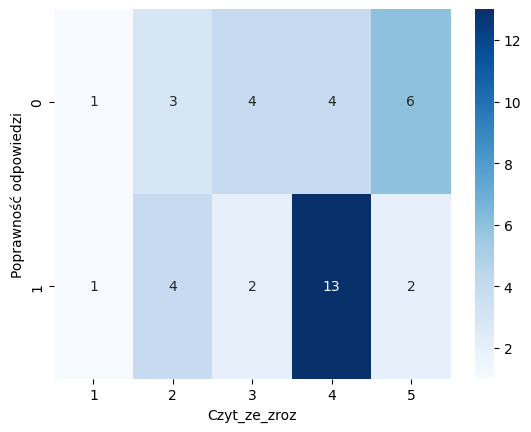

-------------------------------------
3b
Czyt_ze_zroz  1  2  3  4  5
3b_corr                    
0             1  5  3  9  4
1             1  2  3  8  4
Chi2 test conducted...
Chi-squared test statistic value: 0.9540786011374244
P-value: 0.9166773807204579
Brak podstaw do odrzucenia H0.


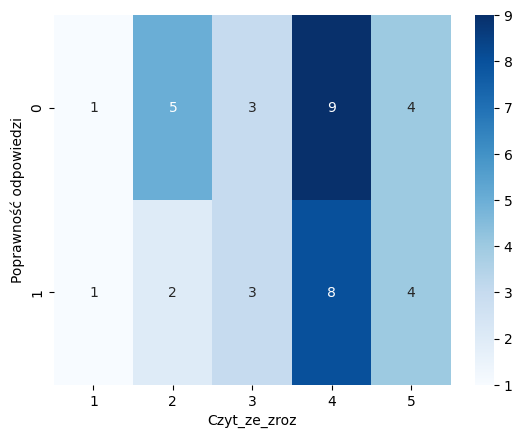

##############################################################
Wzrokowiec
-------------------------------------
1a
Wzrokowiec  2  3   4   5
1a_corr                 
0           0  0   3   2
1           2  9  12  12
Chi2 test conducted...
Chi-squared test statistic value: 2.3836734693877553
P-value: 0.49668103709815625
Brak podstaw do odrzucenia H0.


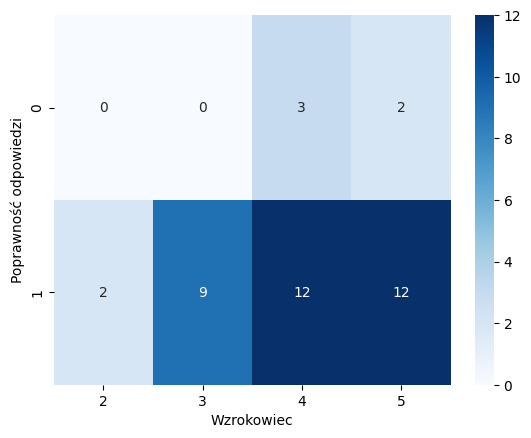

-------------------------------------
1b
Wzrokowiec  2  3   4   5
1b_corr                 
0           0  0   2   1
1           2  9  13  13
Chi2 test conducted...
Chi-squared test statistic value: 1.6302016302016302
P-value: 0.6525613558026033
Brak podstaw do odrzucenia H0.


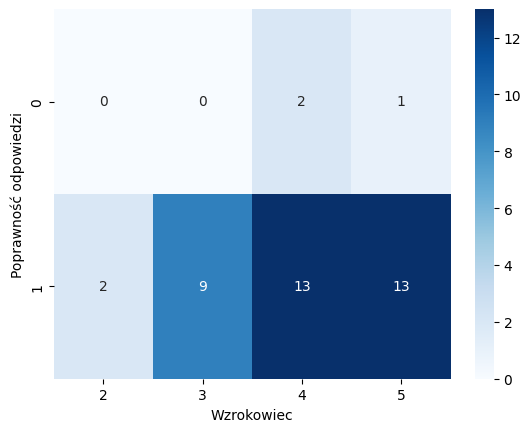

-------------------------------------
2a
Wzrokowiec  2  3   4   5
2a_corr                 
0           1  2   5   4
1           1  7  10  10
Chi2 test conducted...
Chi-squared test statistic value: 0.7331821617535904
P-value: 0.865372790068283
Brak podstaw do odrzucenia H0.


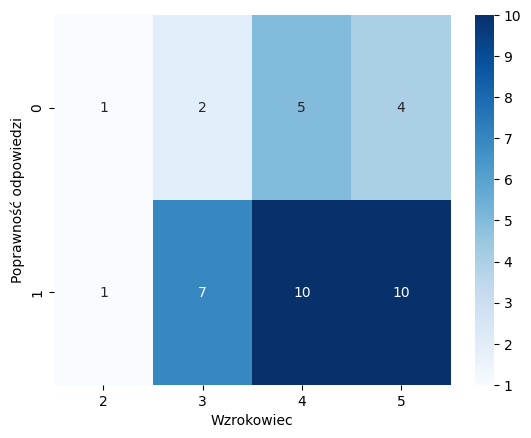

-------------------------------------
2b
Wzrokowiec  2  3   4   5
2b_corr                 
0           0  2   5   4
1           2  7  10  10
Chi2 test conducted...
Chi-squared test statistic value: 1.1484301139473554
P-value: 0.7653975645170833
Brak podstaw do odrzucenia H0.


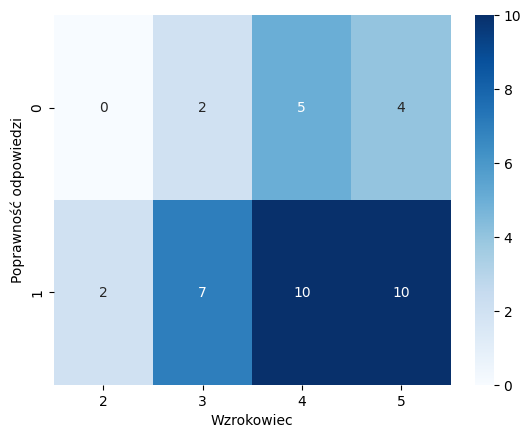

-------------------------------------
3a
Wzrokowiec  2  3  4  5
3a_corr               
0           0  4  6  8
1           2  5  9  6
Chi2 test conducted...
Chi-squared test statistic value: 2.6230559563892895
P-value: 0.45346186960297163
Brak podstaw do odrzucenia H0.


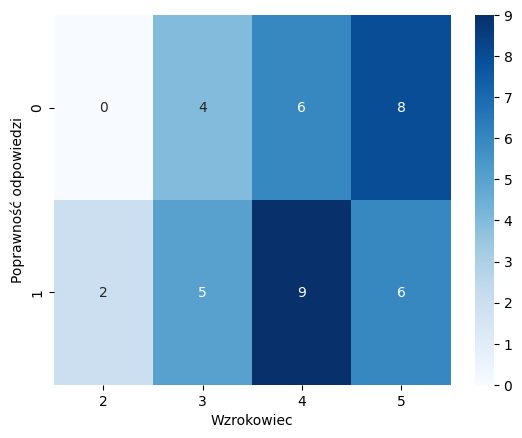

-------------------------------------
3b
Wzrokowiec  2  3  4  5
3b_corr               
0           1  5  8  8
1           1  4  7  6
Chi2 test conducted...
Chi-squared test statistic value: 0.06413339746673077
P-value: 0.9957625491971955
Brak podstaw do odrzucenia H0.


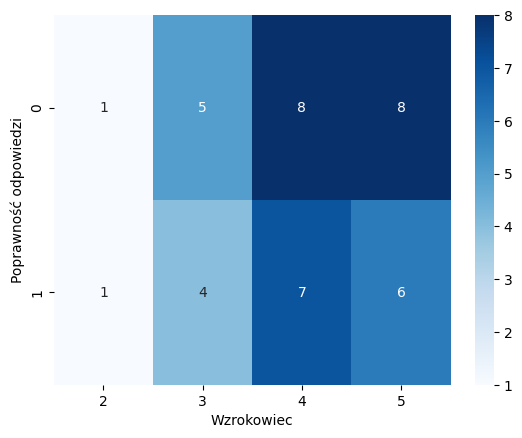

##############################################################
Słuchowiec
-------------------------------------
1a
Słuchowiec  1  2   3  4  5
1a_corr                   
0           0  2   1  1  1
1           4  6  14  6  5
Chi2 test conducted...
Chi-squared test statistic value: 2.296598639455782
P-value: 0.6813883952232445
Brak podstaw do odrzucenia H0.


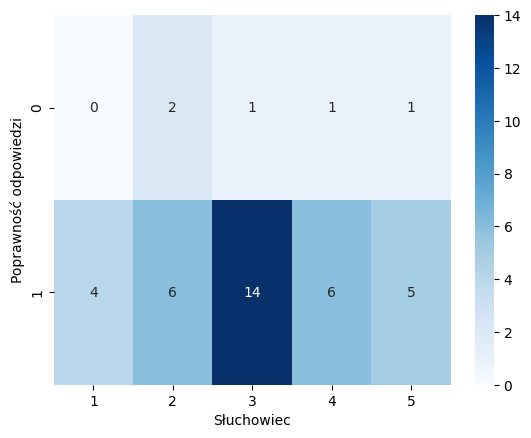

-------------------------------------
1b
Słuchowiec  1  2   3  4  5
1b_corr                   
0           1  0   1  0  1
1           3  8  14  7  5
Chi2 test conducted...
Chi-squared test statistic value: 3.7237237237237233
P-value: 0.44468485078649567
Brak podstaw do odrzucenia H0.


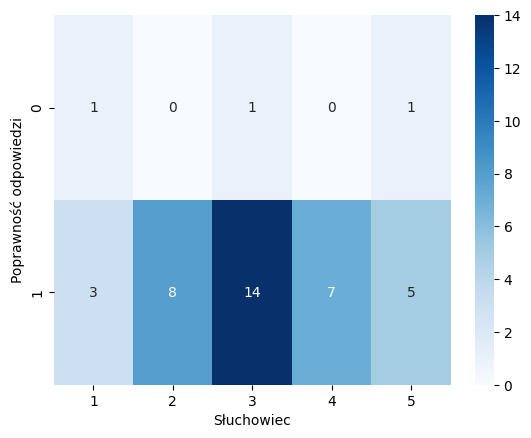

-------------------------------------
2a
Słuchowiec  1  2   3  4  5
2a_corr                   
0           3  1   3  3  2
1           1  7  12  4  4
Chi2 test conducted...
Chi-squared test statistic value: 6.320861678004535
P-value: 0.1764333308213397
Brak podstaw do odrzucenia H0.


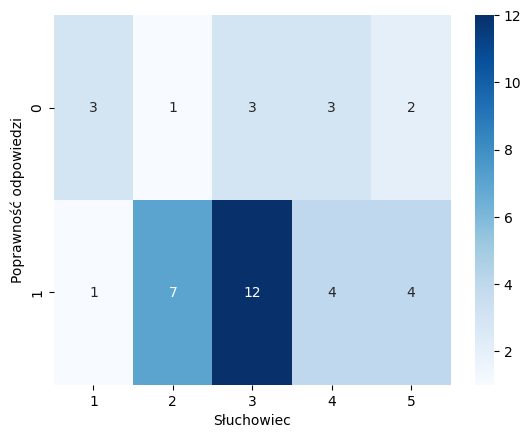

-------------------------------------
2b
Słuchowiec  1  2   3  4  5
2b_corr                   
0           3  1   3  1  3
1           1  7  12  6  3
Chi2 test conducted...
Chi-squared test statistic value: 7.989252127183161
P-value: 0.09197269711776848
Brak podstaw do odrzucenia H0.


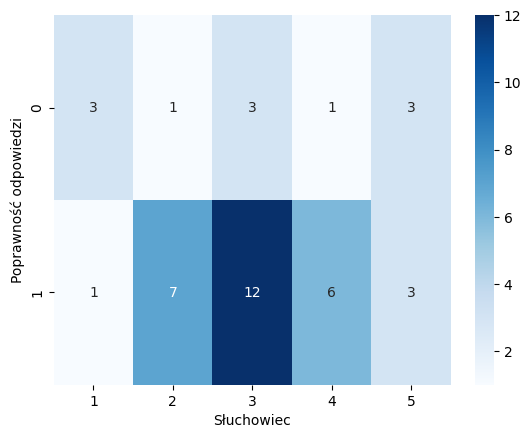

-------------------------------------
3a
Słuchowiec  1  2  3  4  5
3a_corr                  
0           1  5  8  1  3
1           3  3  7  6  3
Chi2 test conducted...
Chi-squared test statistic value: 4.785954785954786
P-value: 0.3099731587157868
Brak podstaw do odrzucenia H0.


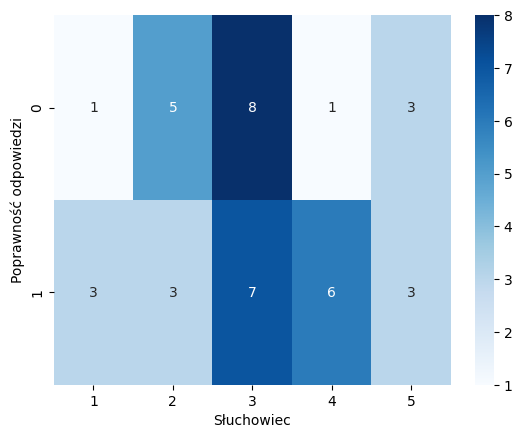

-------------------------------------
3b
Słuchowiec  1  2  3  4  5
3b_corr                  
0           1  6  7  4  4
1           3  2  8  3  2
Chi2 test conducted...
Chi-squared test statistic value: 3.5113035113035114
P-value: 0.4761617035493819
Brak podstaw do odrzucenia H0.


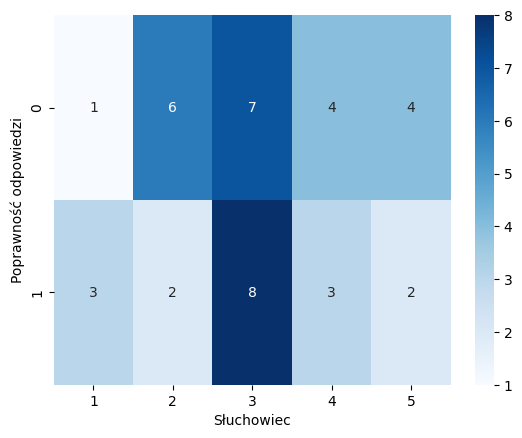

##############################################################
Kinestetyk
-------------------------------------
1a
Kinestetyk  1   2  3  4  5
1a_corr                   
0           1   2  0  2  0
1           8  15  3  8  1
Chi2 test conducted...
Chi-squared test statistic value: 1.1099906629318392
P-value: 0.8926838535998075
Brak podstaw do odrzucenia H0.


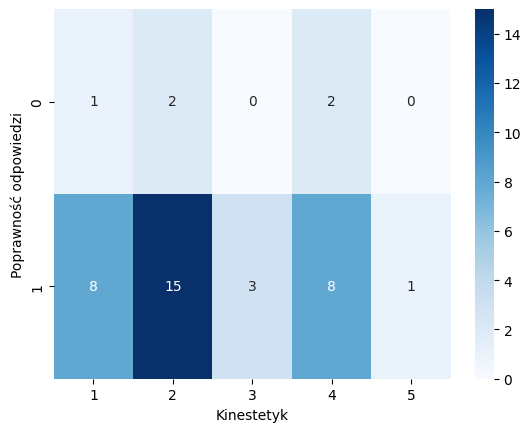

-------------------------------------
1b
Kinestetyk  1   2  3  4  5
1b_corr                   
0           1   1  0  1  0
1           8  16  3  9  1
Chi2 test conducted...
Chi-squared test statistic value: 0.6477065300594712
P-value: 0.9576177005041085
Brak podstaw do odrzucenia H0.


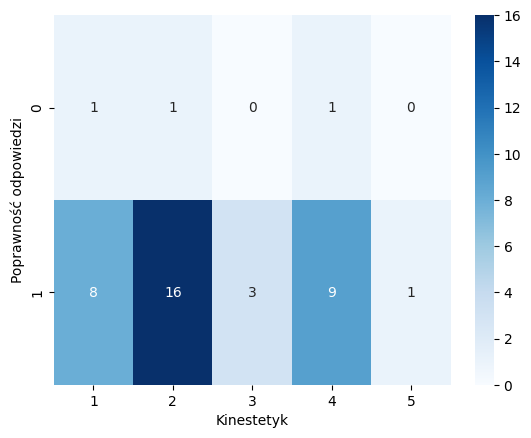

-------------------------------------
2a
Kinestetyk  1   2  3  4  5
2a_corr                   
0           3   4  1  3  1
1           6  13  2  7  0
Chi2 test conducted...
Chi-squared test statistic value: 2.735760971055088
P-value: 0.6029715642980685
Brak podstaw do odrzucenia H0.


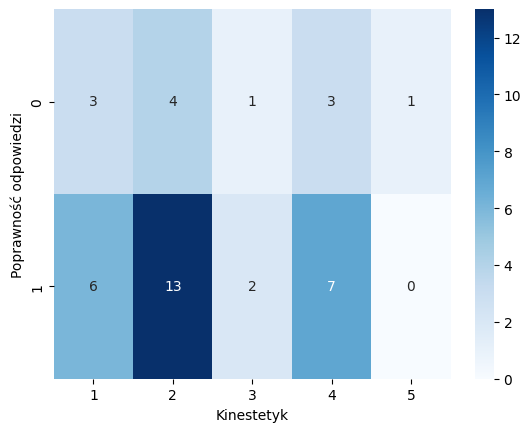

-------------------------------------
2b
Kinestetyk  1   2  3  4  5
2b_corr                   
0           2   5  0  3  1
1           7  12  3  7  0
Chi2 test conducted...
Chi-squared test statistic value: 3.962546356055484
P-value: 0.41109837914909375
Brak podstaw do odrzucenia H0.


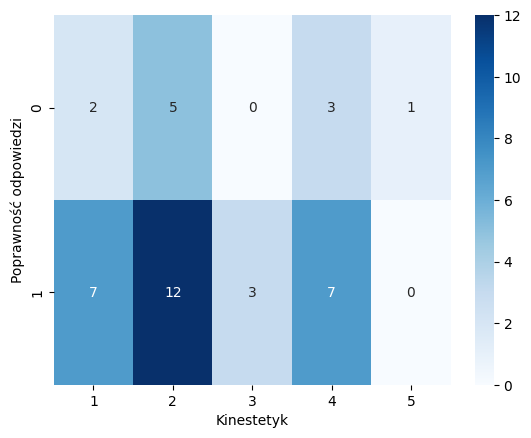

-------------------------------------
3a
Kinestetyk  1   2  3  4  5
3a_corr                   
0           3   7  2  6  0
1           6  10  1  4  1
Chi2 test conducted...
Chi-squared test statistic value: 2.891661715191127
P-value: 0.576116159202028
Brak podstaw do odrzucenia H0.


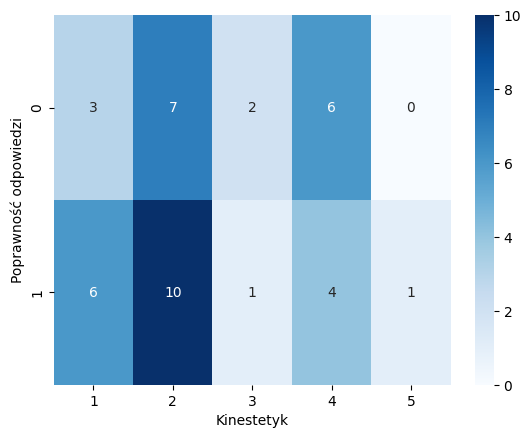

-------------------------------------
3b
Kinestetyk  1   2  3  4  5
3b_corr                   
0           7   7  1  7  0
1           2  10  2  3  1
Chi2 test conducted...
Chi-squared test statistic value: 5.899518056380801
P-value: 0.20677904802096048
Brak podstaw do odrzucenia H0.


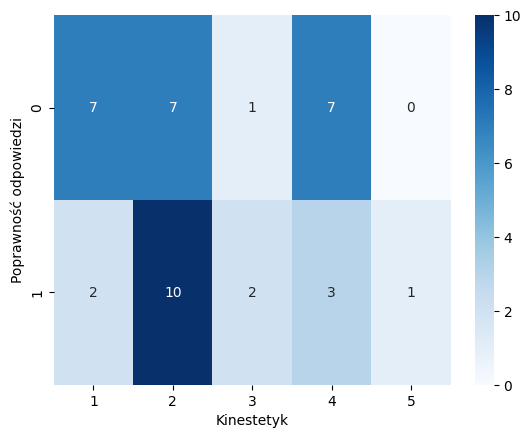

##############################################################
MAT
-------------------------------------
1a
MAT      NO_VAL  VAL
1a_corr             
0             4    1
1            14   21
Chi2 test conducted...
Chi-squared test statistic value: 1.443001443001443
P-value: 0.22965425863747851
Brak podstaw do odrzucenia H0.


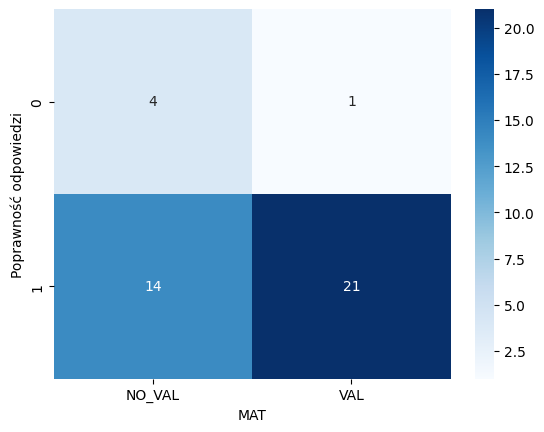

-------------------------------------
1b
MAT      NO_VAL  VAL
1b_corr             
0             2    1
1            16   21
Chi2 test conducted...
Chi-squared test statistic value: 0.03276003276003268
P-value: 0.8563696732877363
Brak podstaw do odrzucenia H0.


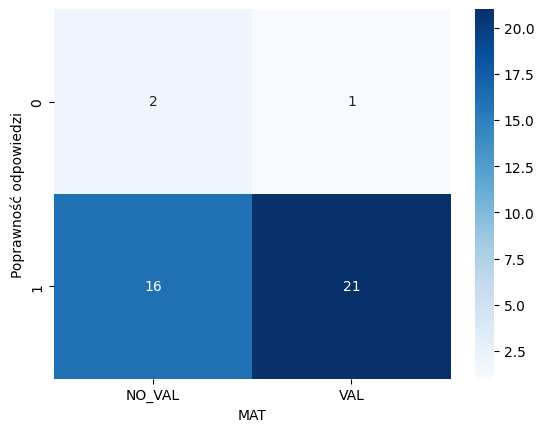

-------------------------------------
2a
MAT      NO_VAL  VAL
2a_corr             
0             4    8
1            14   14
Chi2 test conducted...
Chi-squared test statistic value: 0.3896103896103899
P-value: 0.5325042685883553
Brak podstaw do odrzucenia H0.


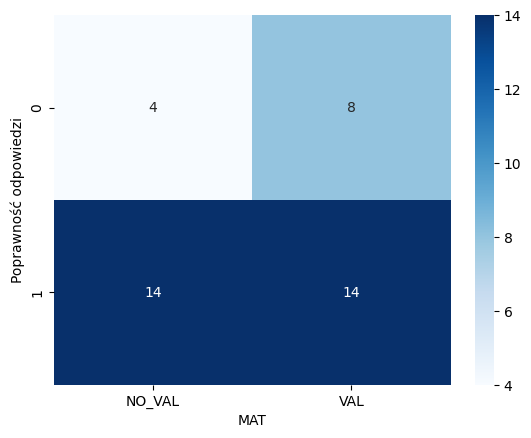

-------------------------------------
2b
MAT      NO_VAL  VAL
2b_corr             
0             3    8
1            15   14
Chi2 test conducted...
Chi-squared test statistic value: 1.0651974288337922
P-value: 0.3020327581328548
Brak podstaw do odrzucenia H0.


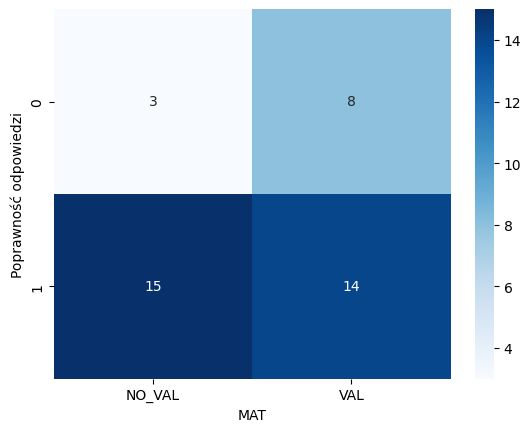

-------------------------------------
3a
MAT      NO_VAL  VAL
3a_corr             
0             9    9
1             9   13
Chi2 test conducted...
Chi-squared test statistic value: 0.06529945923885329
P-value: 0.798307915425343
Brak podstaw do odrzucenia H0.


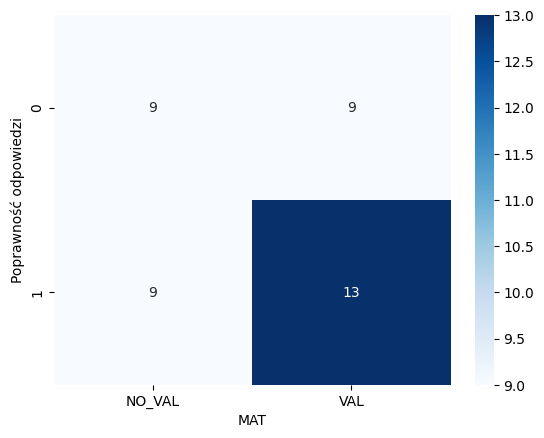

-------------------------------------
3b
MAT      NO_VAL  VAL
3b_corr             
0            11   11
1             7   11
Chi2 test conducted...
Chi-squared test statistic value: 0.14692378328741948
P-value: 0.7014926070383944
Brak podstaw do odrzucenia H0.


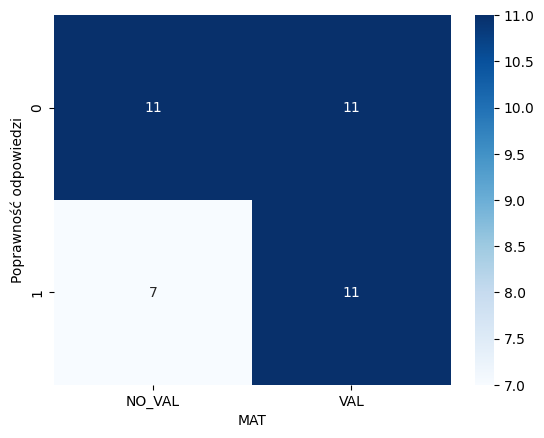

##############################################################
POL
-------------------------------------
1a
POL      NO_VAL  VAL
1a_corr             
0             4    1
1            27    8
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


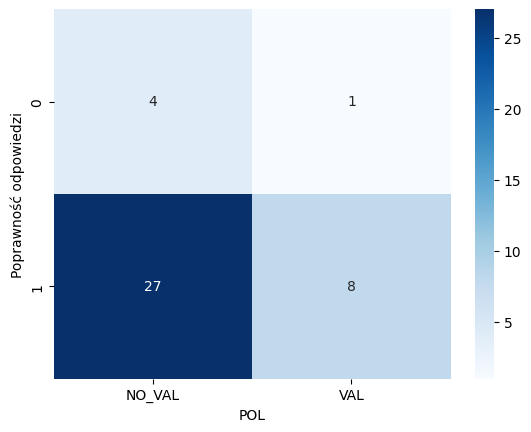

-------------------------------------
1b
POL      NO_VAL  VAL
1b_corr             
0             3    0
1            28    9
Chi2 test conducted...
Chi-squared test statistic value: 0.0632890955471601
P-value: 0.8013709441559447
Brak podstaw do odrzucenia H0.


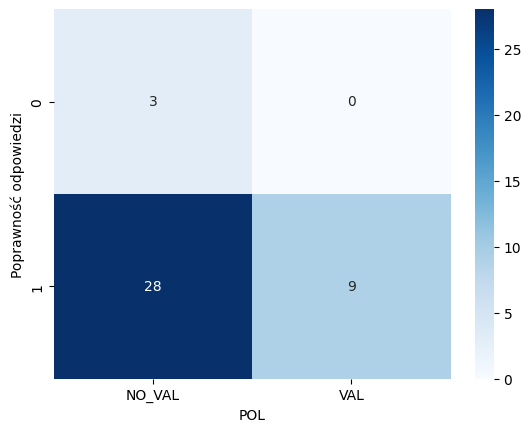

-------------------------------------
2a
POL      NO_VAL  VAL
2a_corr             
0             8    4
1            23    5
Chi2 test conducted...
Chi-squared test statistic value: 0.43693463048301756
P-value: 0.5086057014749605
Brak podstaw do odrzucenia H0.


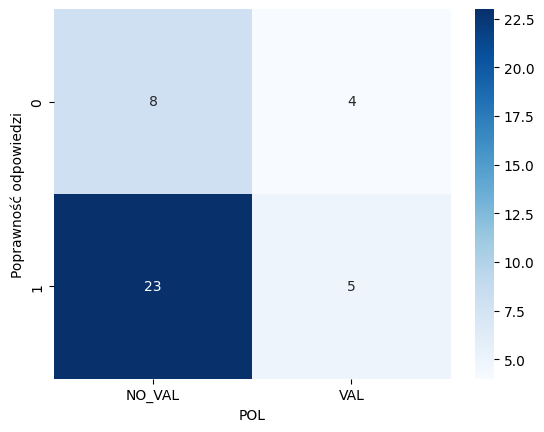

-------------------------------------
2b
POL      NO_VAL  VAL
2b_corr             
0             8    3
1            23    6
Chi2 test conducted...
Chi-squared test statistic value: 0.0004494331524364894
P-value: 0.9830862431124752
Brak podstaw do odrzucenia H0.


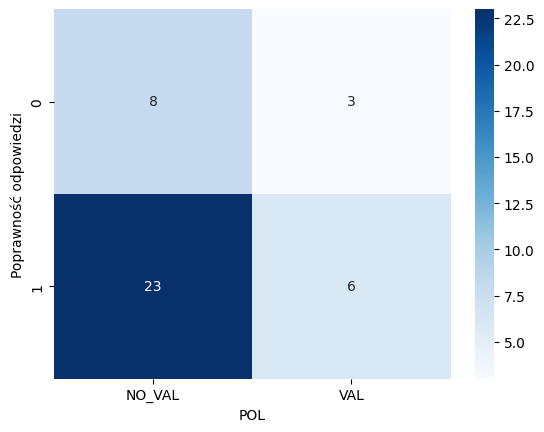

-------------------------------------
3a
POL      NO_VAL  VAL
3a_corr             
0            14    4
1            17    5
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


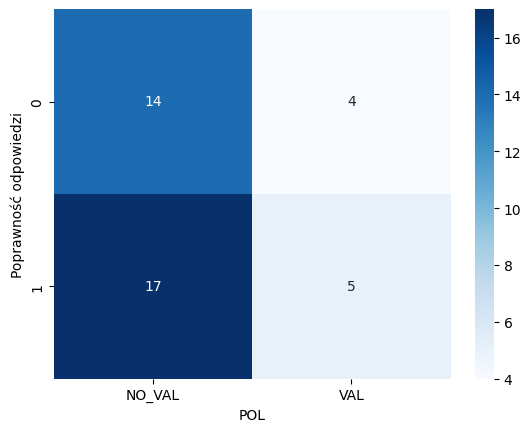

-------------------------------------
3b
POL      NO_VAL  VAL
3b_corr             
0            18    4
1            13    5
Chi2 test conducted...
Chi-squared test statistic value: 0.11730205278592373
P-value: 0.7319792544318555
Brak podstaw do odrzucenia H0.


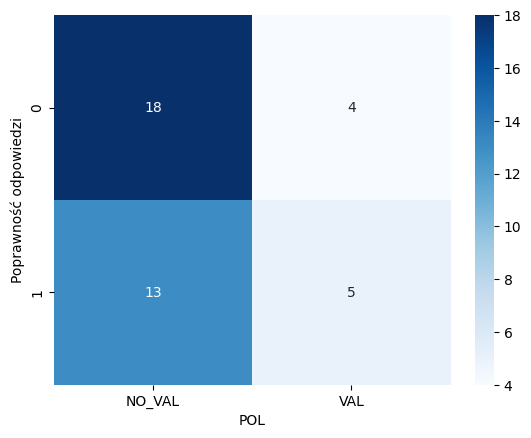

##############################################################
HIST
-------------------------------------
1a
HIST     NO_VAL  VAL
1a_corr             
0             5    0
1            31    4
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


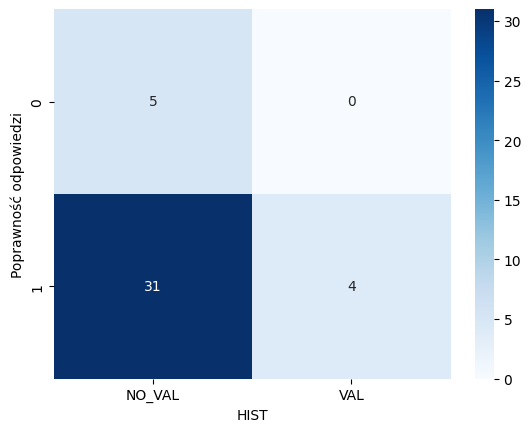

-------------------------------------
1b
HIST     NO_VAL  VAL
1b_corr             
0             3    0
1            33    4
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


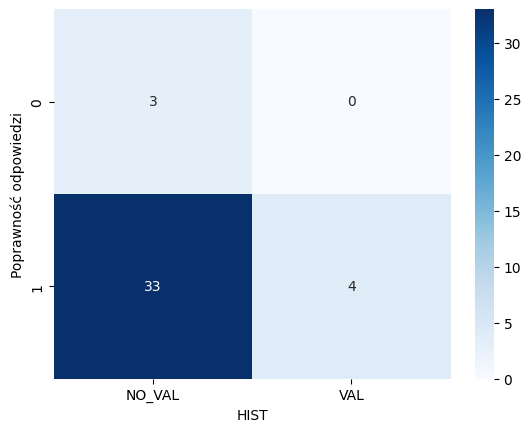

-------------------------------------
2a
HIST     NO_VAL  VAL
2a_corr             
0            11    1
1            25    3
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


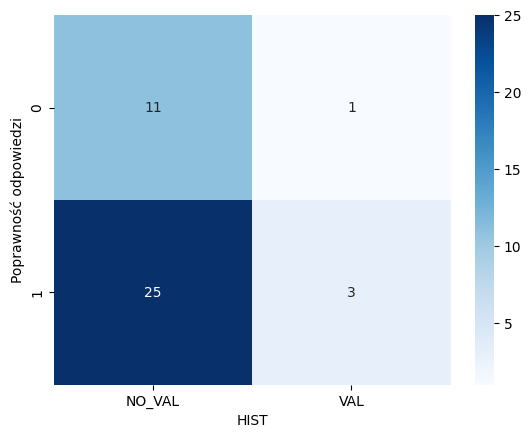

-------------------------------------
2b
HIST     NO_VAL  VAL
2b_corr             
0            10    1
1            26    3
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


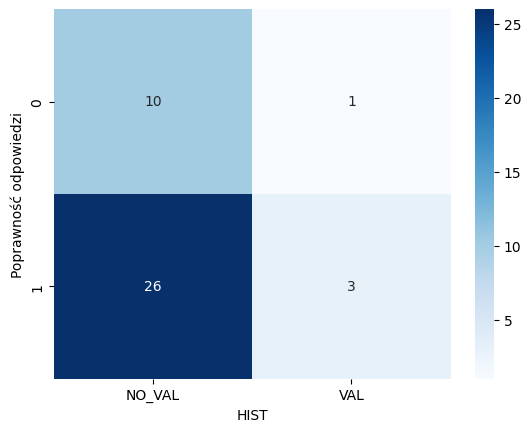

-------------------------------------
3a
HIST     NO_VAL  VAL
3a_corr             
0            18    0
1            18    4
Chi2 test conducted...
Chi-squared test statistic value: 1.8967452300785634
P-value: 0.16844308422983767
Brak podstaw do odrzucenia H0.


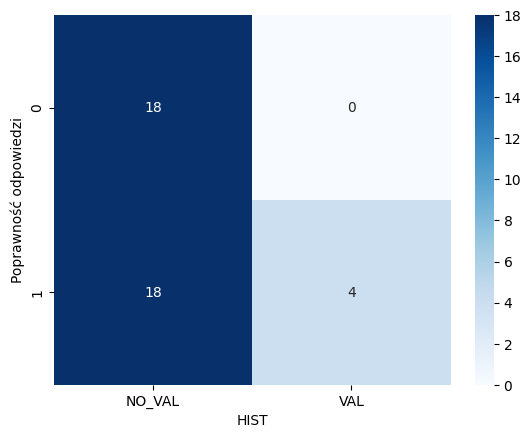

-------------------------------------
3b
HIST     NO_VAL  VAL
3b_corr             
0            20    2
1            16    2
Chi2 test conducted...
Chi-squared test statistic value: 0.0
P-value: 1.0
Brak podstaw do odrzucenia H0.


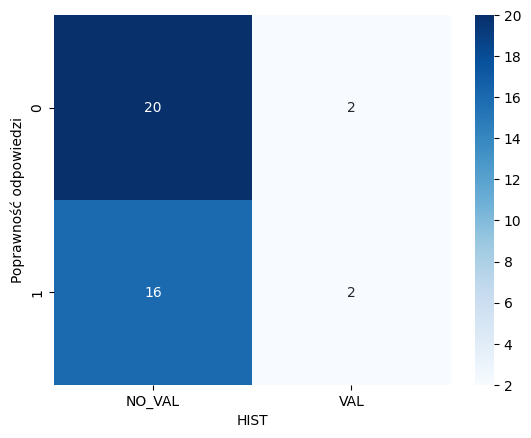

##############################################################
Typ_uczenia
-------------------------------------
1a
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
1a_corr                                                           
0                            1           0           1           3
1                            9           2           5          19
Chi2 test conducted...
Chi-squared test statistic value: 0.464069264069264
P-value: 0.9267112768970087
Brak podstaw do odrzucenia H0.


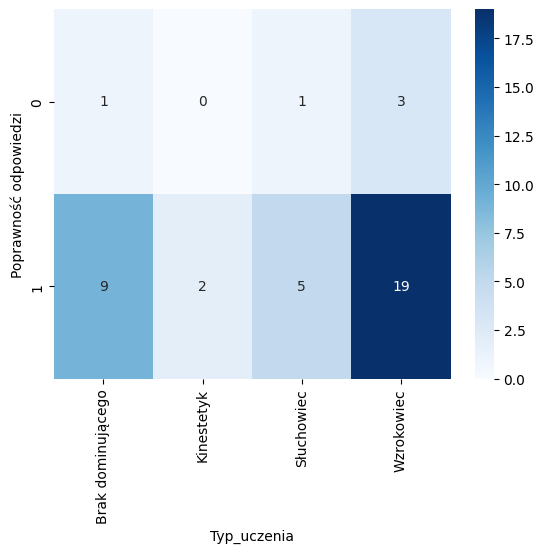

-------------------------------------
1b
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
1b_corr                                                           
0                            0           0           1           2
1                           10           2           5          20
Chi2 test conducted...
Chi-squared test statistic value: 1.7799617799617802
P-value: 0.6193051549007986
Brak podstaw do odrzucenia H0.


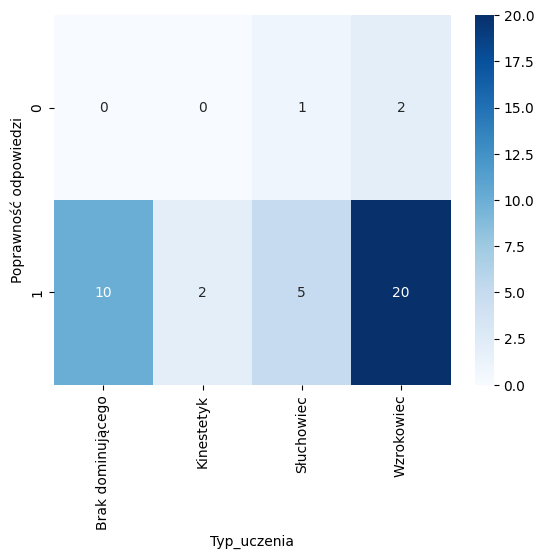

-------------------------------------
2a
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
2a_corr                                                           
0                            2           1           3           6
1                            8           1           3          16
Chi2 test conducted...
Chi-squared test statistic value: 2.0779220779220777
P-value: 0.5563921741582865
Brak podstaw do odrzucenia H0.


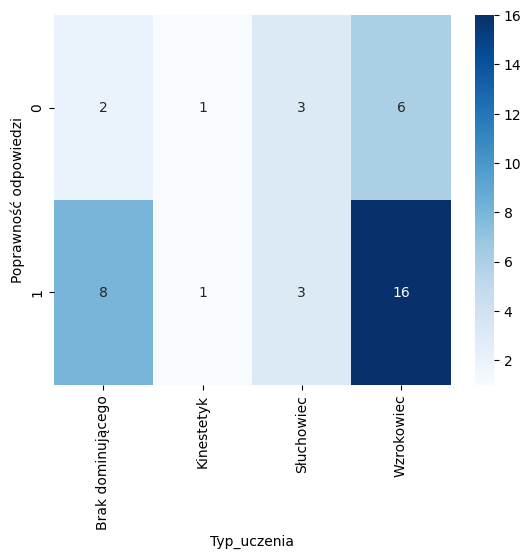

-------------------------------------
2b
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
2b_corr                                                           
0                            1           1           4           5
1                            9           1           2          17
Chi2 test conducted...
Chi-squared test statistic value: 6.911750736202146
P-value: 0.0747644067196321
Brak podstaw do odrzucenia H0.


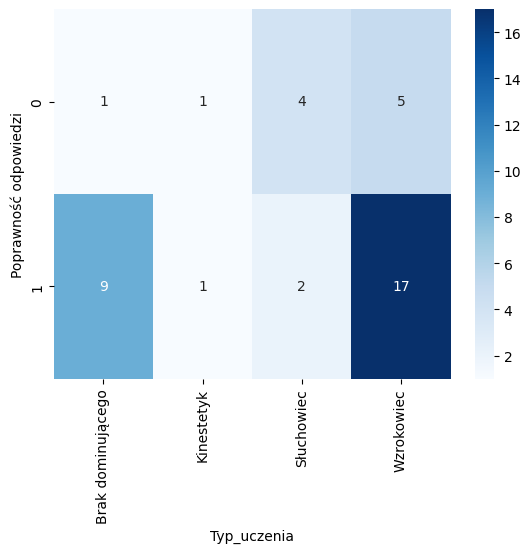

-------------------------------------
3a
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
3a_corr                                                           
0                            4           1           2          11
1                            6           1           4          11
Chi2 test conducted...
Chi-squared test statistic value: 0.6734006734006734
P-value: 0.8794418194194192
Brak podstaw do odrzucenia H0.


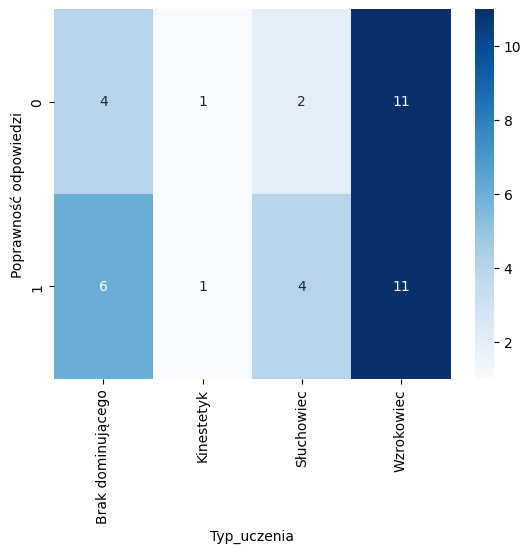

-------------------------------------
3b
Typ_uczenia  Brak dominującego  Kinestetyk  Słuchowiec  Wzrokowiec
3b_corr                                                           
0                            6           1           4          11
1                            4           1           2          11
Chi2 test conducted...
Chi-squared test statistic value: 0.6734006734006734
P-value: 0.8794418194194192
Brak podstaw do odrzucenia H0.


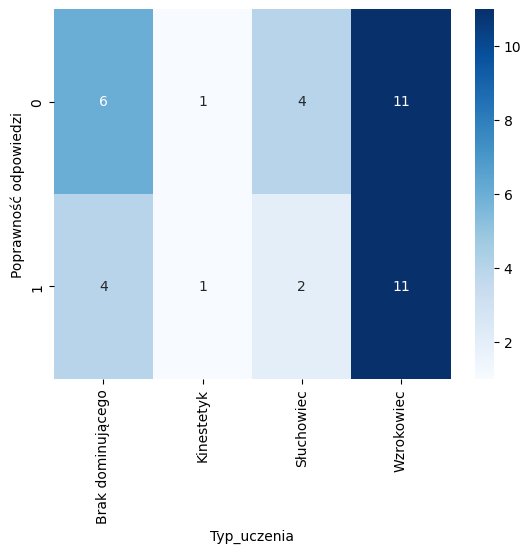

In [63]:
for col in columns:
    print('##############################################################')
    print(col)
    for pref in prefix:
        print('-------------------------------------')
        print(pref)
        two_categorical_variable_test(df_merge, f'{pref}_corr', col, ALPHA)
        plot_heatmap(df_merge, f'{pref}_corr', col, 'Poprawność odpowiedzi', col, cmap='Blues')

In [64]:
posthocNemenyi_test(df_merge, '1a_corr', 'Stres', ALPHA)
posthocNemenyi_test(df_merge, '3a_corr', 'Samopocz', ALPHA)
posthocNemenyi_test(df_merge, '3b_corr', 'MAT_podst', ALPHA)

+----+----------+----------+----------+----------+----------+
|    |        2 |        1 |        3 |        4 |        5 |
+====+==========+==========+==========+==========+==========+
|  2 | 1        | 0.00989  | 0.24065  | 0.001075 | 0.040864 |
+----+----------+----------+----------+----------+----------+
|  1 | 0.00989  | 1        | 0.850972 | 0.835433 | 0.885688 |
+----+----------+----------+----------+----------+----------+
|  3 | 0.24065  | 0.850972 | 1        | 0.3088   | 0.531506 |
+----+----------+----------+----------+----------+----------+
|  4 | 0.001075 | 0.835433 | 0.3088   | 1        | 0.9998   |
+----+----------+----------+----------+----------+----------+
|  5 | 0.040864 | 0.885688 | 0.531506 | 0.9998   | 1        |
+----+----------+----------+----------+----------+----------+
+----+----------+----------+----------+----------+
|    |        4 |        3 |        5 |        2 |
+====+==========+==========+==========+==========+
|  4 | 1        | 0.000727 | 0.026994 | 0

Podsumowanie - poprawność, każda grafika osobno:
Istotne statystycznie:
- Stres: 1a (2 vs pozostałe, poza 3)
- samopoczucie: 3a (4 vs pozostałe)
- Matura podstawowa matematyka: 3b (50-69% vs 90-100%)
